In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy.linalg
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
import torch
from time import time
import torch.nn as nn

In [2]:
import gc
gc.collect()
torch.cuda.empty_cache()

## Criacao Bases

### Cria Dataframe

In [3]:
# LE FUNÇÃO QUE GERA O DATAFRAME COM OS GRAFOS
def generate_graphs(num_nodes, qtd, k):
    data = {'Erdos_Renyi_Graph': [],'Matrix_L': [],'Matrix_A': [], 'p': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []}
    
    for j in range(k+1):
        start = time()
        for i in range(qtd):
            p = random.random() # Adjust this range as per your requirement
            
            G = nx.erdos_renyi_graph(num_nodes, p)
            A = nx.laplacian_matrix(G).todense()
            A2 = nx.adjacency_matrix(G).todense()
            laplacian_eigenvalues = np.linalg.eigvalsh(A)
            e = numpy.linalg.eigvalsh(A2)
            sorted_laplacian_eigenvalues = sorted(laplacian_eigenvalues)
            sorted_e = sorted(e)
            data['Erdos_Renyi_Graph'].append(G)
            data['Matrix_L'].append(A)
            data['Matrix_A'].append(A2)
            data['p'].append(p)
            data['Eigenvalues_L'].append(sorted_laplacian_eigenvalues)
            data['Eigenvalues_A'].append(sorted_e)
        print(f'para num_nodes = {num_nodes} demorou {time() - start}')
        num_nodes += 10
    
    df = pd.DataFrame(data)
    return df

def generate_connected_erdos_renyi_graphs(num_nodes, qtd, k):
    import numpy as np
    data = {
        'Erdos_Renyi_Graph': [], 'Matrix_L': [], 'Matrix_A': [],
        'p': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []
    }
    
    for j in range(k + 1):
        start = time()
        # Calcula checkpoints de progresso a cada 10%
        checkpoints = set(np.linspace(0, qtd, 11, dtype=int))  # 0%, 10%, ..., 100%
        
        for i in range(qtd):
            while True:
                p = random.random()
                G = nx.erdos_renyi_graph(num_nodes, p)
                if nx.is_connected(G):
                    break  # só aceita se for conectado

            L = nx.laplacian_matrix(G).todense()
            A = nx.adjacency_matrix(G).todense()
            eig_L = sorted(np.linalg.eigvalsh(L))
            eig_A = sorted(np.linalg.eigvalsh(A))

            data['Erdos_Renyi_Graph'].append(G)
            data['Matrix_L'].append(L)
            data['Matrix_A'].append(A)
            data['p'].append(p)
            data['Eigenvalues_L'].append(eig_L)
            data['Eigenvalues_A'].append(eig_A)
            
            if i in checkpoints:
                perc = int(100 * i / qtd)
                print(f"{perc}% ({i}/{qtd}) concluído em {time() - start:.2f}s")
        
        print(f'✅ num_nodes = {num_nodes} finalizado em {time() - start:.2f}s')
        num_nodes += 10
    
    return pd.DataFrame(data)

# FUNÇÃO QUE TRANSFORMA MATRIX DE ADJACENCIA EM TENSOR DA TRIANGULAR INFERIOR NO DATAFRAME
import torch
import pandas as pd

def lower_triangular_only_from_dataframe(df_column):
    # Get the number of matrices
    num_matrices = len(df_column)

    # Get the size of the matrix from the first element
    matrix_size = len(df_column.iloc[0])

    # Calculate the number of elements in the lower triangular part (excluding the diagonal)
    num_elements_lower_triangular = (matrix_size * (matrix_size - 1)) // 2

    # Create an empty list to store the lower triangular tensors
    lower_triangular_tensors_list = []

    # Iterate over each matrix
    for i in range(num_matrices):
        # Flatten the lower triangular part of the matrix (excluding the diagonal)
        lower_triangular_tensor = torch.tensor(df_column.iloc[i], dtype=torch.float).tril(diagonal=-1)[torch.tril(torch.ones(matrix_size, matrix_size, dtype=torch.float), diagonal=-1).bool()].flatten()

        lower_triangular_tensors_list.append(lower_triangular_tensor)

    # Create a new column with the lower triangular tensors
    #lower_triangular_column = torch.tensor(lower_triangular_tensors_list)

    #return lower_triangular_column
    return lower_triangular_tensors_list

In [4]:
def remove_grafos_duplicados_por_adjacencia(df):
    import numpy as np

    print(f"🔍 Total de grafos antes da filtragem: {len(df)}")

    # Serializa cada matriz de adjacência como uma tupla hashável
    matrizes_serializadas = [tuple(np.array(m).flatten()) for m in df['Matrix_A']]

    seen = {}
    indices_unicos = []
    for i, key in enumerate(matrizes_serializadas):
        if key not in seen:
            seen[key] = True
            indices_unicos.append(i)

    df_filtrado = df.iloc[indices_unicos].reset_index(drop=True)
    print(f"✅ Total de grafos distintos após filtragem: {len(df_filtrado)}")

    return df_filtrado

### gera Dataframe de treino

In [5]:
# GERA O DATAFRAME COM OS GRAFOS
min_num_nodes = 40
qtd = 80000
k = 0
max_num_nodes = min_num_nodes + (10*k)
print(max_num_nodes)
# df = generate_connected_erdos_renyi_graphs(min_num_nodes, qtd, k)

40


In [6]:
# SALVA
# Salva o dataframe em formato pickle
# df.to_pickle("grafos_40nos_ER_conec_80k.pkl")

In [7]:
#CARREGA
df = pd.read_pickle("grafos_40nos_ER_conec_80k.pkl")

### gera dataframe de validacao

In [8]:
qtd_val = 20000
min_num_nodes = 40
k = 0

In [9]:
# # validacao usando apenas grafos conectados
# qtd_val = int(qtd/20)
# print(max_num_nodes)
# df_val = generate_connected_erdos_renyi_graphs(min_num_nodes, qtd_val, k)
# df_val = df_val.iloc[:-1]
# # df_val.to_pickle("df_val_3MM_13.pkl")
# #print(df)

In [10]:
# # Depois pra carregar de novo
# df = pd.read_pickle("df_teste_50k.pkl")
# df_val = pd.read_pickle("df_val_3MM_13.pkl")

## Outros Dataframes

### gera dataframe Sem vértices isolados

In [11]:
# # validacao usando apenas grafos Sem vértices isolados

# def generate_erdos_renyi_graphs_no_isolated(num_nodes, qtd, k):
#     data = {'Erdos_Renyi_Graph': [], 'Matrix_L': [], 'Matrix_A': [], 'p': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []}
    
#     for j in range(k + 1):
#         start = time()
#         for i in range(qtd):
#             while True:
#                 p = random.uniform(0.15, 0.5)  # evita p muito baixo
#                 G = nx.erdos_renyi_graph(num_nodes, p)
#                 degrees = dict(G.degree())
#                 if min(degrees.values()) > 0:  # sem vértices isolados
#                     break

#             L = nx.laplacian_matrix(G).todense()
#             A = nx.adjacency_matrix(G).todense()
#             eig_L = sorted(np.linalg.eigvalsh(L))
#             eig_A = sorted(np.linalg.eigvalsh(A))

#             data['Erdos_Renyi_Graph'].append(G)
#             data['Matrix_L'].append(L)
#             data['Matrix_A'].append(A)
#             data['p'].append(p)
#             data['Eigenvalues_L'].append(eig_L)
#             data['Eigenvalues_A'].append(eig_A)
        
#         print(f'num_nodes = {num_nodes} finalizado em {time() - start:.2f}s')
#         num_nodes += 10
    
#     return pd.DataFrame(data)

# qtd_no_isolated = int(qtd/20)
# print(max_num_nodes)
# df_no_isolated = generate_erdos_renyi_graphs_no_isolated(min_num_nodes, qtd_no_isolated, k)
# df_no_isolated = df_no_isolated.iloc[:-1]
# #print(df)

### gera dataframe barabasi

In [12]:
def generate_graphs_barabasi(num_nodes, qtd, k):
    import numpy as np
    data = {
        'Erdos_Renyi_Graph': [], 'Matrix_L': [], 'Matrix_A': [],
        'm': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []
    }
    for j in range(k + 1):
        start = time()
        checkpoints = set(np.linspace(0, qtd, 11, dtype=int))  # 0%, 10%, ..., 100%
        for i in range(qtd):
            m = random.randint(1, max(1, num_nodes - 1))  # m é o número de arestas por novo nó
            G = nx.barabasi_albert_graph(num_nodes, m)
            L = nx.laplacian_matrix(G).todense()
            A = nx.adjacency_matrix(G).todense()
            eig_L = sorted(np.linalg.eigvalsh(L))
            eig_A = sorted(np.linalg.eigvalsh(A))
            data['Erdos_Renyi_Graph'].append(G)
            data['Matrix_L'].append(L)
            data['Matrix_A'].append(A)
            data['m'].append(m)  # salva m como parâmetro usado
            data['Eigenvalues_L'].append(eig_L)
            data['Eigenvalues_A'].append(eig_A)
            if i in checkpoints:
                perc = int(100 * i / qtd)
                print(f"{perc}% ({i}/{qtd}) concluído em {time() - start:.2f}s")
        print(f'✅ num_nodes = {num_nodes} finalizado em {time() - start:.2f}s')
        # num_nodes += 10  # ⛔️ Remove para manter sempre o mesmo número de nós
    return pd.DataFrame(data)

In [13]:
# df_BA = generate_graphs_barabasi(min_num_nodes, qtd_val, k)

In [14]:
# df_BA = remove_grafos_duplicados_por_adjacencia(df_BA)

In [15]:
# SALVA
# Salva o dataframe em formato pickle
# df_BA.to_pickle("grafos_40nos_BA_20k.pkl")

In [16]:
#CARREGA
df_BA = pd.read_pickle("grafos_40nos_BA_20k.pkl")

### gera dataframe watts

In [17]:
def generate_graphs_watts(num_nodes, qtd, k):
    data = {
        'Watts_Strogatz_Graph': [], 'Matrix_L': [], 'Matrix_A': [],
        'p': [], 'k': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []
    }
    for j in range(k + 1):
        start = time()
        checkpoints = set(np.linspace(0, qtd, 11, dtype=int))  # 0%, 10%, ..., 100%
        for i in range(qtd):
            # 🔁 Sorteia parâmetros
            p = random.uniform(0.0, 1.0)
            k_ws = random.choice([val for val in range(2, num_nodes, 2)])
            # 🔧 Gera grafo
            G = nx.watts_strogatz_graph(num_nodes, k_ws, p)
            # 🧠 Matrizes e autovalores
            L = nx.laplacian_matrix(G).todense()
            A = nx.adjacency_matrix(G).todense()
            eig_L = sorted(np.linalg.eigvalsh(L))
            eig_A = sorted(np.linalg.eigvalsh(A))
            # 📦 Salva dados
            data['Watts_Strogatz_Graph'].append(G)
            data['Matrix_L'].append(L)
            data['Matrix_A'].append(A)
            data['p'].append(p)
            data['k'].append(k_ws)
            data['Eigenvalues_L'].append(eig_L)
            data['Eigenvalues_A'].append(eig_A)
            if i in checkpoints:
                perc = int(100 * i / qtd)
                print(f"{perc}% ({i}/{qtd}) concluído em {time() - start:.2f}s")
        print(f'✅ num_nodes = {num_nodes} finalizado em {time() - start:.2f}s')
    return pd.DataFrame(data)

In [18]:
# df_WS = generate_graphs_watts(min_num_nodes, qtd_val, k)

In [19]:
# df_WS = remove_grafos_duplicados_por_adjacencia(df_WS)

In [20]:
# SALVA
# Salva o dataframe em formato pickle
# df_WS.to_pickle("grafos_40nos_WS_20k.pkl")

In [21]:
#CARREGA
df_WS = pd.read_pickle("grafos_40nos_WS_20k.pkl")

### gera dataframe GRG (Geometric Random Graph)

In [22]:
def generate_graphs_grg(num_nodes, qtd, k=None):
    import numpy as np
    data = {
        'Erdos_Renyi_Graph': [], 'Matrix_L': [], 'Matrix_A': [],
        'radius': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []
    }
    for _ in range(1):  # não precisa de loop por k
        start = time()
        checkpoints = set(np.linspace(0, qtd, 11, dtype=int))
        for i in range(qtd):
            radius = np.random.uniform(0.1, 0.4)  # valor típico, ajustável
            G = nx.random_geometric_graph(num_nodes, radius)
            L = nx.laplacian_matrix(G).todense()
            A = nx.adjacency_matrix(G).todense()
            eig_L = sorted(np.linalg.eigvalsh(L))
            eig_A = sorted(np.linalg.eigvalsh(A))
            data['Erdos_Renyi_Graph'].append(G)
            data['Matrix_L'].append(L)
            data['Matrix_A'].append(A)
            data['radius'].append(radius)
            data['Eigenvalues_L'].append(eig_L)
            data['Eigenvalues_A'].append(eig_A)
            if i in checkpoints:
                perc = int(100 * i / qtd)
                print(f"{perc}% ({i}/{qtd}) concluído em {time() - start:.2f}s")
        print(f'✅ GRG finalizado em {time() - start:.2f}s')
    return pd.DataFrame(data)

In [23]:
# df_GRG = generate_graphs_grg(min_num_nodes, qtd_val, k)

In [24]:
# df_GRG = remove_grafos_duplicados_por_adjacencia(df_GRG)

In [25]:
# SALVA
# Salva o dataframe em formato pickle
# df_GRG.to_pickle("grafos_40nos_GRG_20k.pkl")

In [26]:
#CARREGA
df_GRG = pd.read_pickle("grafos_40nos_GRG_20k.pkl")

### gera dataframe KR (k-Regular Random Graph)

In [27]:
def generate_graphs_kr(num_nodes, qtd):
    import numpy as np
    import random
    import networkx as nx
    import pandas as pd
    from time import time

    data = {
        'Erdos_Renyi_Graph': [], 'Matrix_L': [], 'Matrix_A': [],
        'k': [], 'Eigenvalues_L': [], 'Eigenvalues_A': []
    }

    start = time()
    checkpoints = set(np.linspace(0, qtd, 26, dtype=int))  # 0%, 4%, ..., 100%

    # Prepara valores válidos de d com pesos lineares decrescentes
    d_vals = [d for d in range(1, num_nodes) if d * num_nodes % 2 == 0]
    pesos = [1 / (i + 1) for i in range(len(d_vals))]

    for i in range(qtd):
        tentativas = 0
        sucesso = False

        while tentativas < 50:
            d = random.choices(d_vals, weights=pesos, k=1)[0]
            tentativas += 1
            try:
                G = nx.random_regular_graph(d, num_nodes)
                sucesso = True
                break
            except:
                continue

        if not sucesso:
            print(f"⚠️ [{i+1}/{qtd}] Não foi possível gerar grafo com d ≈ {d} após 50 tentativas. Pulando...")
            continue

        try:
            L = nx.laplacian_matrix(G).todense()
            A = nx.adjacency_matrix(G).todense()
            eig_L = sorted(np.linalg.eigvalsh(L))
            eig_A = sorted(np.linalg.eigvalsh(A))
        except:
            print(f"⚠️ [{i+1}/{qtd}] Erro ao calcular matrizes/autovalores. Pulando...")
            continue

        data['Erdos_Renyi_Graph'].append(G)
        data['Matrix_L'].append(L)
        data['Matrix_A'].append(A)
        data['k'].append(d)
        data['Eigenvalues_L'].append(eig_L)
        data['Eigenvalues_A'].append(eig_A)

        if i in checkpoints:
            perc = int(100 * i / qtd)
            print(f"📊 {perc}% ({i}/{qtd}) concluído em {time() - start:.2f}s")

    print(f"\n✅ KR finalizado em {time() - start:.2f}s")
    return pd.DataFrame(data)


In [28]:
#df_KR = generate_graphs_kr(min_num_nodes, qtd_val)

In [29]:
# df_KR = remove_grafos_duplicados_por_adjacencia(df_KR)

In [30]:
# SALVA
# Salva o dataframe em formato pickle
# df_KR.to_pickle("grafos_40nos_KR_20k.pkl")

In [31]:
#CARREGA
df_KR = pd.read_pickle("grafos_40nos_KR_20k.pkl")

In [32]:
print("df")
print(len(df))
# Drop rows where Matrix_L has all elements equal to zero
df = df[~df['Matrix_L'].apply(lambda x: np.all(x == 0.))]

# Check for matrices with all elements equal to zero
zero_matrices = df[df['Matrix_L'].apply(lambda x: np.all(x == 0))]
print(len(df))
# If there are any, print their entire rows
if not zero_matrices.empty:
    print("Matrices with all elements equal to zero:")
    print(zero_matrices)
else:
    print("No matrices with all elements equal to zero found.")

df
80000
80000
No matrices with all elements equal to zero found.


### Filtra Por densidade (desativado por enquanto)

In [33]:
import numpy as np

print("Antes do filtro:", len(df))

# Define a função para remover matrizes com densidade fora do intervalo desejado
def is_out_of_bounds_density(matrix, min_threshold=0.15, max_threshold=0.90):
    total_elements = matrix.size
    non_zero_elements = np.count_nonzero(matrix)
    density = non_zero_elements / total_elements
    return density < min_threshold or density > max_threshold

# Aplica o filtro e reseta o índice
# df = df[~df['Matrix_L'].apply(is_out_of_bounds_density)].reset_index(drop=True)

print("Após remover matrizes com densidade < 15% ou > 90%:", len(df))


Antes do filtro: 80000
Após remover matrizes com densidade < 15% ou > 90%: 80000


### Gera o Tensor Da Triangular Inferior Da Matriz no df

In [34]:
lower_triangular_1 = lower_triangular_only_from_dataframe(df['Matrix_A'])
stack_lower_triangular_1 = torch.stack(lower_triangular_1)

# lower_triangular_1_val = lower_triangular_only_from_dataframe(df_val['Matrix_A'])
# stack_lower_triangular_1_val = torch.stack(lower_triangular_1_val)

### Gera os Tensores Da Triangular Inferior Das Matrizes EXTRAS no df

In [35]:
lower_triangular_1_BA = lower_triangular_only_from_dataframe(df_BA['Matrix_A'])
stack_lower_triangular_1_BA = torch.stack(lower_triangular_1_BA)

lower_triangular_1_WS = lower_triangular_only_from_dataframe(df_WS['Matrix_A'])
stack_lower_triangular_1_WS = torch.stack(lower_triangular_1_WS)

lower_triangular_1_GRG = lower_triangular_only_from_dataframe(df_GRG['Matrix_A'])
stack_lower_triangular_1_GRG = torch.stack(lower_triangular_1_GRG)

lower_triangular_1_KR = lower_triangular_only_from_dataframe(df_KR['Matrix_A'])
stack_lower_triangular_1_KR = torch.stack(lower_triangular_1_KR)

In [36]:
import gc
import torch

def descarrega_dfs_e_lower_triangular():
    variaveis = [
        'df', 'lower_triangular_1',
        'df_BA', 'lower_triangular_1_BA',
        'df_WS', 'lower_triangular_1_WS',
        'df_GRG', 'lower_triangular_1_GRG',
        'df_KR', 'lower_triangular_1_KR'
    ]
    
    for var in variaveis:
        if var in globals():
            del globals()[var]
    
    torch.cuda.empty_cache()
    gc.collect()
    print("🧹 DataFrames e lower_triangular_* descarregados.")
# Limpa tudo que não é mais necessário
descarrega_dfs_e_lower_triangular()

🧹 DataFrames e lower_triangular_* descarregados.


In [37]:
print(len(stack_lower_triangular_1))
print(type(stack_lower_triangular_1))
#print(stack_lower_triangular_1)
print(len(stack_lower_triangular_1_BA))
print(type(stack_lower_triangular_1_BA))
print(len(stack_lower_triangular_1_WS))
print(type(stack_lower_triangular_1_WS))
print(len(stack_lower_triangular_1_GRG))
print(type(stack_lower_triangular_1_GRG))
print(len(stack_lower_triangular_1_KR))
print(type(stack_lower_triangular_1_KR))

80000
<class 'torch.Tensor'>
18972
<class 'torch.Tensor'>
19932
<class 'torch.Tensor'>
20000
<class 'torch.Tensor'>
15162
<class 'torch.Tensor'>


# Funções auxiliares

## Transformação Vetor <==> Matriz

### Função que Transforma Vetor em Matriz

In [38]:
import numpy as np

def from_one_dimension_representation(lower_triangular_tensor):
    # Number of matrices
    num_matrices = lower_triangular_tensor.shape[0]
    
    # Determine the size of each matrix from the first element
    num_elements_lower_triangular = lower_triangular_tensor.shape[1]
    matrix_size = int((2 * num_elements_lower_triangular + 0.25)**0.5 - 0.5) + 1

    # Create an empty tensor to store the adjacency matrices
    adjacency_matrices = torch.zeros((num_matrices, matrix_size, matrix_size))

    # Iterate over each matrix representation
    for i, elem in enumerate(lower_triangular_tensor):
        # Debugging: Print the type and value of elem
        #print(f"Processing element {i}: {elem} (type: {torch.sum(elem)})")

        # Create a matrix with zeros
        matrix = torch.zeros((matrix_size, matrix_size))

        # Fill the lower triangular part
        idx = 0
        for row in range(1, matrix_size):
            for col in range(row):
                matrix[row, col] = elem[idx]
                idx += 1

        # Fill the upper triangular part by transposing the lower triangular part
        adjacency_matrix = matrix + matrix.T

        # Store the adjacency matrix
        adjacency_matrices[i] = adjacency_matrix

    return adjacency_matrices
   

### Batch Tril to laplacian

In [39]:
import math
def batch_tril_to_laplacian(batch_tril: torch.Tensor) -> torch.Tensor:
    """
    batch_tril: Tensor com shape (B, M), onde M = n(n-1)/2 e batch_tril[b] contém
                os L_{ij} para i>j na ordem de torch.tril_indices(n,n,-1)
    retorna: Tensor com shape (B, n, n) contendo as matrizes de adjacencia reconstruídas
    """
    B, M = batch_tril.shape
    # 1) inferir n a partir de M = n(n-1)/2
    n = int((1 + math.sqrt(1 + 8*M)) / 2)
    
    # 2) obter índices da parte inferior (sem diagonal)
    tril_i, tril_j = torch.tril_indices(n, n, offset=-1, device=batch_tril.device)
    
    # 3) criar tensor de saída e preencher a parte inferior
    L = torch.zeros(B, n, n, device=batch_tril.device, dtype=batch_tril.dtype)
    L[:, tril_i, tril_j] = batch_tril
    
    # 4) espelhar para a parte superior
    L = L + L.transpose(1, 2)
    
    # 5) ajustar a diagonal para que cada linha some zero
    #    diag[b,i] = -sum_j≠i L[b,i,j]
    # diag = -L.sum(dim=2)
    # idx = torch.arange(n, device=batch_tril.device)
    # L[:, idx, idx] = diag

    return L
def batch_tril_to_laplacian_normalized(batch_tensor):
    batch_size = batch_tensor.shape[0]
    num_elems = batch_tensor.shape[1]
    n = int((1 + (1 + 8 * num_elems) ** 0.5) / 2)

    laplacians_norm = []
    for b in range(batch_size):
        tril = batch_tensor[b]
        A = torch.zeros((n, n), device=tril.device)
        A[torch.tril(torch.ones(n, n), diagonal=-1) == 1] = tril
        A = A + A.T  # simetriza

        deg = A.sum(dim=1)
        deg_inv_sqrt = torch.diag(1.0 / (deg + 1e-10).sqrt())

        L_norm = torch.eye(n, device=A.device) - deg_inv_sqrt @ A @ deg_inv_sqrt
        laplacians_norm.append(L_norm)

    return torch.stack(laplacians_norm) 

In [40]:
# teste = batch_tril_to_laplacian(stack_lower_triangular_1)
# teste_normalizado = batch_tril_to_laplacian_normalized(stack_lower_triangular_1)

# import numpy as np

# tensor_matrix = teste[0].numpy()  # converte PyTorch → NumPy
# array_matrix = df['Matrix_A'][0]  # já é NumPy

# are_equal = np.allclose(tensor_matrix, array_matrix)
# print("São iguais?", are_equal)

# #--------------------------------------------------------
# tensor_matrix = teste[1].numpy()  # converte PyTorch → NumPy
# array_matrix = df['Matrix_A'][1]  # já é NumPy

# are_equal = np.allclose(tensor_matrix, array_matrix)
# print("São iguais?", are_equal)

## Função de Custo

In [41]:
import torch
import torch.nn as nn
import os

# ---------- utilitário: histograma gaussiano diferenciável ----------
def soft_histogram(vals, bins=30, sigma=0.2):
    v_min, v_max = vals.min(), vals.max()
    centers = torch.linspace(v_min, v_max, bins, device=vals.device)
    diffs   = vals.unsqueeze(1) - centers
    gauss   = torch.exp(-0.5 * (diffs / sigma) ** 2)
    hist    = gauss.sum(dim=0)
    hist = hist / (hist.sum() + 1e-6)
    return hist

def get_peak_location(hist, centers):
    peak_idx = torch.argmax(hist)
    return centers[peak_idx]

def log_detalhes_loss(epoch,
                      individuo_idx,
                      geracao,
                      penalizacao_valores_altos=None,
                      penalizacao_repeticao=None,
                      loss_espectral=None,
                      num_binarizacoes_unicas=None,
                      mais_frequente=None,
                      final_losses=None,
                      final_losses_aux=None,
                      final_losses_aux_elev=None,
                      final_losses_dens_aux=None,
                      final_losses_dens=None,
                      salvar_em=None):

    def resumo_tensor(t):
        if isinstance(t, list) and all(isinstance(x, torch.Tensor) for x in t):
            try:
                concat = torch.cat([x.flatten() for x in t])
                return (
                    f"numel: {concat.numel()} | mean: {concat.mean():.4f} | "
                    f"sum: {concat.sum():.4f} | min: {concat.min():.4f} | "
                    f"max: {concat.max():.4f} | std: {concat.std():.4f}"
                )
            except Exception as e:
                return f"erro ao processar: {e}"
        return f"tipo inválido: {type(t)}"

    log_str = (
        f"\n📘 Geração {geracao} | Indivíduo {individuo_idx} | Batch {epoch} - Detalhamento da Loss:\n"
    )

    if loss_espectral is not None:
        log_str += f" - Loss espectral: {loss_espectral.item():.6f}\n"

    if num_binarizacoes_unicas is not None and mais_frequente is not None:
        log_str += (
            f" - Diversidade de grafos: {num_binarizacoes_unicas} únicos\n"
            f" - Mais repetido apareceu {mais_frequente}x\n"
        )

    if penalizacao_repeticao is not None:
        log_str += f" - Penalização por repetição: {penalizacao_repeticao:.4f}\n"

    log_str += "\n📊 Estatísticas dos erros:\n"
    log_str += f" - final_losses:               {resumo_tensor(final_losses)}\n"
    log_str += f" - erro hist:                  {resumo_tensor(final_losses_aux)}\n"
    log_str += f" - erro hist ** 1.5:           {resumo_tensor(final_losses_aux_elev)}\n"
    log_str += f" - erro densidade:             {resumo_tensor(final_losses_dens_aux)}\n"
    log_str += f" - erro densidade ** 1.5:      {resumo_tensor(final_losses_dens)}\n"
    log_str += f" - penalizacao_altos_list:     {resumo_tensor(penalizacao_valores_altos)}\n"

    if salvar_em:
        os.makedirs(os.path.dirname(salvar_em), exist_ok=True)
        with open(salvar_em, "a", encoding="utf-8") as f:
            f.write(log_str)

### Define Função de Custo

In [42]:
import math

class CustomEMDLoss(nn.Module):
    def __init__(self, bins=30, sigma=0.2, alpha=.5, beta=.8, gamma=.2, zero_penalty=50.0):
        super().__init__()
        self.bins = bins
        self.sigma = sigma
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.zero_penalty = zero_penalty
        self.lambda_repeticao = 0.5  # peso fixo

    def forward(self, original_tensors, output_tensor, contexto_log=None):
        eps = 1e-5
        orig_mats = batch_tril_to_laplacian(original_tensors)
        orig_mats_normalized = batch_tril_to_laplacian_normalized(original_tensors)
        B = orig_mats_normalized.size(0)
        final_losses = []
        final_losses_aux = []
        final_losses_aux_elev = []
        final_losses_dens = []
        final_losses_dens_aux = []
        penalizacao_altos_list = []

        # 🔢 Contador de binarizações únicas
        bin_hashes = {}

        for b in range(B):
            A_orig = orig_mats[b]
            A_orig_normalized = orig_mats_normalized[b]
            eig_o = torch.linalg.eigvalsh(A_orig_normalized).real.sort()[0]
            hist_o = soft_histogram(eig_o, bins=self.bins, sigma=self.sigma)
            try:
                recon_tensor = output_tensor[b]
                recon_tensor_clamped = torch.clamp(recon_tensor, min=-100, max=100)
                bin_output = binarizador(recon_tensor_clamped.unsqueeze(0))

                bin_out_flat = bin_output.view(-1)
                bin_key = ''.join((bin_out_flat > 0.5).int().cpu().numpy().astype(str))
                bin_hashes[bin_key] = bin_hashes.get(bin_key, 0) + 1

                A_pred = batch_tril_to_laplacian(bin_output)[0]
                A_pred_normalized = batch_tril_to_laplacian_normalized(bin_output)[0]
                eig_l = torch.linalg.eigvalsh(A_pred_normalized).real.sort()[0]
                hist_l = soft_histogram(eig_l, bins=self.bins, sigma=self.sigma)
                hist_diff = hist_o - hist_l
                hist_dist = (torch.sqrt(torch.sum(hist_diff ** 2))) * 10

                # Penalização por Densidade
                mult_dens = 0.4
                n_o = eig_o.numel()
                n_l = eig_l.numel()
                total_possible_o = n_o * (n_o - 1) / 2
                total_possible_l = n_l * (n_l - 1) / 2
                dens_o = A_orig.abs().sum() / total_possible_o
                dens_l = A_pred.abs().sum() / total_possible_l
                dens_diff = torch.abs(dens_o - dens_l) * mult_dens

                # Penalização por valores muito altos
                penalizacao_valores_altos = (
                    (recon_tensor_clamped - 100.).clamp(min=0) +
                    (-100. - recon_tensor_clamped).clamp(min=0)
                ).mean()

                total_loss = hist_dist**1.5 + dens_diff**1.5
                final_losses.append(total_loss)
                final_losses_aux.append(hist_dist)
                final_losses_aux_elev.append(hist_dist**1.5)
                final_losses_dens.append(dens_diff**1.5)
                final_losses_dens_aux.append(dens_diff)
                penalizacao_altos_list.append(penalizacao_valores_altos)

            except RuntimeError as e:
                print(f"🔥 Erro no batch {b}: {e}")
                continue

        # Salva binarização da epoch
        self.ultima_saida_epoch_bin = (output_tensor.detach() >= 0.5).float().clone()
        
        # 🔢 Penalização por repetição (apenas raiz quadrada)
        num_unicos = len(bin_hashes)
        mais_frequente = max(bin_hashes.values()) if bin_hashes else 0
        limite_repeticao = max(5, round(B * 0.02))
        excesso = max(mais_frequente - limite_repeticao, 0)
        
        penalizacao_repeticao_val = math.sqrt(excesso)
        penalizacao_repeticao = self.lambda_repeticao * torch.tensor(
            penalizacao_repeticao_val, dtype=torch.float32, device=output_tensor.device
        )

        # Log e debug
        if contexto_log is not None:
            batch_idx = contexto_log.get("batch_idx")
            individuo_idx = contexto_log.get("individuo_idx")
            geracao = contexto_log.get("geracao")
            salvar_em = contexto_log.get("salvar_em")

            escaneia_tensor(final_losses, f"[Batch {batch_idx}] final_losses")
            escaneia_tensor(final_losses_aux, f"[Batch {batch_idx}] erro hist")
            escaneia_tensor(final_losses_aux_elev, f"[Batch {batch_idx}] erro hist**1.5")
            escaneia_tensor(final_losses_dens_aux, f"[Batch {batch_idx}] erro dens")
            escaneia_tensor(final_losses_dens, f"[Batch {batch_idx}] erro dens**1.5")

            log_detalhes_loss(
                epoch=batch_idx,
                individuo_idx=individuo_idx,
                geracao=geracao,
                num_binarizacoes_unicas=num_unicos,
                mais_frequente=mais_frequente,
                final_losses=final_losses,
                final_losses_aux=final_losses_aux,
                final_losses_aux_elev=final_losses_aux_elev,
                final_losses_dens_aux=final_losses_dens_aux,
                final_losses_dens=final_losses_dens,
                penalizacao_valores_altos=penalizacao_altos_list,
                penalizacao_repeticao=penalizacao_repeticao.item(),
                salvar_em=salvar_em
            )

            print(f"📊 [Batch {batch_idx}] {num_unicos} grafos únicos | Mais repetido apareceu {mais_frequente}x | Excesso = {excesso} | Penalização = {penalizacao_repeticao.item()}")

        loss_total = torch.mean(torch.stack(final_losses)) + penalizacao_repeticao
        return loss_total, [final_losses, final_losses_aux, final_losses_dens_aux]


In [43]:
import os
import torch
import matplotlib.pyplot as plt

def plot_erro_batch_ordenado(final_losses, final_losses_aux, final_losses_dens_aux,
                              titulo, salvar_em, epoch):
    # Converte e ordena os tensores
    final_losses_sorted = torch.sort(torch.tensor(final_losses))[0]
    final_losses_aux_sorted = torch.sort(torch.tensor(final_losses_aux))[0]
    final_losses_dens_sorted = torch.sort(torch.tensor(final_losses_dens_aux))[0]

    # Define pasta de destino com base no .txt do salvar_em
    pasta_base = os.path.dirname(salvar_em)
    pasta_destino = os.path.join(pasta_base, "distribuicao_erros_por_grafo")
    os.makedirs(pasta_destino, exist_ok=True)

    # Nome do arquivo
    nome_arquivo = f"epoch_{epoch:03d}_erro_grafo.png"
    caminho_completo = os.path.join(pasta_destino, nome_arquivo)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.plot(final_losses_sorted.cpu().numpy(), label='Erro Total (final_losses)', linewidth=2)
    plt.plot(final_losses_aux_sorted.cpu().numpy(), label='Erro Histograma (aux)', linestyle='--')
    plt.plot(final_losses_dens_sorted.cpu().numpy(), label='Erro Densidade (aux)', linestyle=':')

    plt.title(titulo)
    plt.xlabel("Amostras no Batch (ordenadas)")
    plt.ylabel("Erro")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(caminho_completo)
    plt.close()


### Função de custo para gráficos

In [44]:
def comparar_grafo_espectral_custom(original_tensor, reconstructed_tensor, bins=30, sigma=0.2, idx=None):
    def tril_to_adj(tril_tensor):
        """
        Converte vetor da parte triangular inferior para matriz de adjacência.
        O número de nós é inferido automaticamente.
        """
        tril_len = tril_tensor.size(0)
        # Resolve n*(n-1)/2 = tril_len
        n = int((1 + (1 + 8 * tril_len) ** 0.5) / 2)
        assert n * (n - 1) // 2 == tril_len, f"Tamanho inválido: {tril_len} não corresponde a uma triangular inferior"
    
        A = torch.zeros((n, n), device=tril_tensor.device)
        tril_indices = torch.tril_indices(row=n, col=n, offset=-1)
        A[tril_indices[0], tril_indices[1]] = tril_tensor
        A = A + A.T
        return A


    def normalized_laplacian(A):
        """
        Calcula a Laplaciana normalizada de uma matriz de adjacência A.
        """
        N = A.size(0)
        deg = A.sum(dim=1)
        deg_inv_sqrt = torch.pow(deg + 1e-6, -0.5)
        D_inv_sqrt = torch.diag(deg_inv_sqrt)
        I = torch.eye(N, device=A.device)
        return I - D_inv_sqrt @ A @ D_inv_sqrt

    eps = 1e-5
    try:
        A_orig = tril_to_adj(original_tensor.squeeze(0))
        A_reco = tril_to_adj(reconstructed_tensor.squeeze(0))


        # Laplacianas normalizadas
        L_orig_norm = normalized_laplacian(A_orig) + torch.eye(A_orig.size(0), device=A_orig.device) * eps
        L_reco_norm = normalized_laplacian(A_reco) + torch.eye(A_reco.size(0), device=A_reco.device) * eps

        # Espectros
        eig_o = torch.sort(torch.linalg.eigvalsh(L_orig_norm).real)[0]
        eig_r = torch.sort(torch.linalg.eigvalsh(L_reco_norm).real)[0]

        # Histogramas e distância
        hist_o = soft_histogram(eig_o, bins=bins, sigma=sigma)
        hist_r = soft_histogram(eig_r, bins=bins, sigma=sigma)
        hist_diff = hist_o - hist_r
        hist_dist = torch.sqrt(torch.sum(hist_diff ** 2)) * 10
        hist_loss = hist_dist ** 1.5

        # Densidade
        n = eig_o.numel()
        total_possible = n * (n - 1) / 2
        dens_o = A_orig.abs().sum() / total_possible
        dens_r = A_reco.abs().sum() / total_possible
        dens_diff = torch.abs(dens_o - dens_r) * 0.4
        dens_loss = dens_diff ** 1.5

        # Penalização por valores extremos
        recon_tensor_clamped = torch.clamp(reconstructed_tensor, min=-100, max=100)
        penalizacao_valores_altos = (
            (recon_tensor_clamped - 100.).clamp(min=0) +
            (-100. - recon_tensor_clamped).clamp(min=0)
        ).mean()

        # Total final
        loss_total = hist_loss + dens_loss + penalizacao_valores_altos

        return (
            loss_total.item(),
            hist_dist.item(),
            dens_diff.item(),
            penalizacao_valores_altos.item(),
            eig_o,
            eig_r,
            A_orig,
            A_reco
        )

    except RuntimeError as e:
        print(f"[ERRO] Falha no cálculo espectral no batch {idx}: {e}")
        return None, None, None, None, None, None, None, None


## Gráficos

### Função de Plottar Grafos

In [45]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import networkx as nx

def visualizar_grafo(G, A, eigenvalues, erro, erro_hist, erro_dens,
                     penalizacao_valores_altos,
                     title="Grafo", salvar_em=None, epoch=None, printar=True):
    G_clean = G.copy()
    G_clean.remove_edges_from(nx.selfloop_edges(G_clean))

    A_np = A.detach().cpu().numpy()
    ev = eigenvalues if isinstance(eigenvalues, torch.Tensor) else torch.tensor(eigenvalues, dtype=torch.float32)
    ev_np = ev.detach().cpu().numpy()

    is_original = "original" in title.lower()
    node_color = 'skyblue' if is_original else 'orchid'
    edge_color = 'gray' if is_original else 'black'
    hist_color = '#1f77b4' if is_original else '#800080'

    n = A.size(0)
    total_possible = n * (n - 1) / 2
    dens_calc = A.tril(diagonal=-1).abs().sum() / total_possible

    fig = plt.figure(figsize=(14, 10))
    grid = plt.GridSpec(2, 2, height_ratios=[2, 1], hspace=0.4, wspace=0.3)

    ax1 = fig.add_subplot(grid[0, 0])
    pos = nx.spring_layout(G_clean, seed=42)
    nx.draw(G_clean, pos, with_labels=True, node_color=node_color,
            edge_color=edge_color, node_size=300, ax=ax1)
    ax1.set_title(f"Grafo | Densidade: {dens_calc:.4f}")

    ax2 = fig.add_subplot(grid[0, 1])
    ax2.imshow(A_np, cmap='binary', interpolation='nearest')
    ax2.set_title("Matriz de Adjacência")
    plt.colorbar(ax2.images[0], ax=ax2, fraction=0.046, pad=0.04)

    ax3 = fig.add_subplot(grid[1, 0])
    sns.histplot(ev_np, bins=30, kde=True, alpha=0.7, ax=ax3, color=hist_color)
    ax3.set_title("Histograma dos Autovalores / n")
    ax3.grid(True)

    ax4 = fig.add_subplot(grid[1, 1])
    soft_hist = soft_histogram(ev, bins=30, sigma=0.2)
    x_axis = torch.linspace(ev.min().item(), ev.max().item(), 30)
    ax4.plot(x_axis.numpy(), soft_hist.detach().cpu().numpy(), color=hist_color)
    ax4.set_title("Histograma Suavizado")
    ax4.grid(True)

    epoch_str = f" | Epoch {epoch}" if epoch is not None else ""
    plt.suptitle(
        f"{title}{epoch_str} | Total: {erro:.4f} | Hist: {erro_hist:.4f} | Dens: {erro_dens:.4f}",
        fontsize=12
    )

    if salvar_em:
        if epoch is not None:
            base, ext = os.path.splitext(salvar_em)
            salvar_em = f"{base}_epoch{epoch:03d}{ext}"
        os.makedirs(os.path.dirname(salvar_em), exist_ok=True)
        plt.savefig(salvar_em)

    if printar:
        plt.show()
    plt.close()


### Printa Grafos

In [46]:
def printa_grafos(autoencoder_layers, output_layer, batch_tensor, idx, epoch, salvar_em_base, erro_layer_list,
                  titulo_prefixo="Treino", printar=False):
    import os
    import torch
    import networkx as nx

    batch_dir = os.path.join(salvar_em_base, f"batch_{idx:03d}")
    os.makedirs(batch_dir, exist_ok=True)

    bin_out = binarizador(output_layer[0].unsqueeze(0))

    resultado = comparar_grafo_espectral_custom(
        batch_tensor[0].unsqueeze(0), bin_out, bins=30, sigma=0.2, idx=idx
    )

    if resultado[0] is not None:
        (erro_total, erro_hist, erro_dens, penalizacao_valores_altos,
         eig_o, eig_pred, mat_o, mat_pred) = resultado

        erro_layer_list.append(erro_total)

        G_orig = nx.from_numpy_array(mat_o.cpu().numpy())
        G_pred = nx.from_numpy_array(mat_pred.cpu().numpy())

        visualizar_grafo(G_orig, mat_o.cpu(), eig_o.cpu(),
                         erro=erro_total, erro_hist=erro_hist, erro_dens=erro_dens,
                         penalizacao_valores_altos=penalizacao_valores_altos,
                         title=f"{titulo_prefixo} - Original - Batch {idx}",
                         salvar_em=os.path.join(batch_dir, "original.png"), epoch=epoch, printar=printar)

        visualizar_grafo(G_pred, mat_pred.cpu(), eig_pred.cpu(),
                         erro=erro_total, erro_hist=erro_hist, erro_dens=erro_dens,
                         penalizacao_valores_altos=penalizacao_valores_altos,
                         title=f"{titulo_prefixo} - Reconstruído - Batch {idx}",
                         salvar_em=os.path.join(batch_dir, "reconstruido.png"), epoch=epoch, printar=printar)

        #print(f"[Batch {idx}] Erro de reconstrução: {erro_total:.4f}")


### Printa Gráfico Erro Treino

In [47]:
import os
import matplotlib.pyplot as plt
import numpy as np
from time import time

def printa_erro_treino(epoch,
                       media_geral_por_geracao,
                       mediana_geral_por_geracao,
                       media_topk_por_geracao,
                       mediana_topk_por_geracao,
                       melhor_erro_por_geracao,  # ⬅️ novo argumento
                       start_epoch_time,
                       salvar_em_base="teste_genetico_40",
                       top_k=5):
    
    os.makedirs(salvar_em_base, exist_ok=True)
    os.makedirs(f"{salvar_em_base}/erro", exist_ok=True)
    salvar_em = f"{salvar_em_base}/erro/loss_por_epoch.png"

    plt.figure(figsize=(10, 6))
    plt.clf()

    plt.plot(range(1, len(media_geral_por_geracao)+1), media_geral_por_geracao, marker='o', label='Média Geral')
    plt.plot(range(1, len(mediana_geral_por_geracao)+1), mediana_geral_por_geracao, marker='x', label='Mediana Geral')
    plt.plot(range(1, len(media_topk_por_geracao)+1), media_topk_por_geracao, marker='s', linestyle='--', label=f'Média Top {top_k}')
    plt.plot(range(1, len(mediana_topk_por_geracao)+1), mediana_topk_por_geracao, marker='^', linestyle=':', label=f'Mediana Top {top_k}')
    plt.plot(range(1, len(melhor_erro_por_geracao)+1), melhor_erro_por_geracao, marker='*', linestyle='-', linewidth=2, label='Melhor da geração')  # ⬅️ novo

    plt.title('Evolução do Loss por Geração')
    plt.xlabel('Geração')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()

    tempo_epoch = time() - start_epoch_time
    print(f"[Epoch {epoch+1}] Média Geral: {media_geral_por_geracao[-1]:.4f} | Mediana Geral: {mediana_geral_por_geracao[-1]:.4f} | Média Top {top_k}: {media_topk_por_geracao[-1]:.4f} | Mediana Top {top_k}: {mediana_topk_por_geracao[-1]:.4f} | Melhor: {melhor_erro_por_geracao[-1]:.4f} | Tempo: {tempo_epoch:.2f}s")

In [48]:
import os
import matplotlib.pyplot as plt

def printa_erro_individuos(erros_por_individuo, salvar_em_base="teste_genetico_40"):
    """
    erros_por_individuo: list[list[float]] or dict[int -> list[float]]
    """
    os.makedirs(f"{salvar_em_base}/erro", exist_ok=True)
    salvar_em = f"{salvar_em_base}/erro/loss_individuos.png"

    plt.figure(figsize=(10, 6))
    plt.clf()

    if isinstance(erros_por_individuo, dict):
        iterator = erros_por_individuo.items()
    else:
        iterator = enumerate(erros_por_individuo)

    for idx, lista_erros in iterator:
        plt.plot(range(1, len(lista_erros) + 1), lista_erros, label=f'Indivíduo {idx+1}')

    plt.title('Evolução do Erro Médio por Indivíduo')
    plt.xlabel('Geração')
    plt.ylabel('Erro Médio')
    plt.grid(True)
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()


### Printa Gráfico Erro Treino + Validação

In [49]:
def printa_erro_treino_val(
    epoch_losses,
    epoch_median_losses,
    epoch_val_losses=None,
    epoch_val_median_losses=None,
    epoch_val_melhor_losses=None,
    melhor_erro_por_geracao=None,
    salvar_em="teste_genetico_40/erro/loss_treino_validacao_por_epoch.png",
    nome_val="Validação"
):
    import matplotlib.pyplot as plt
    import os

    plt.figure(figsize=(10, 6))
    plt.clf()

    # 🔵 Treino
    plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', label='Treino (médio)')
    plt.plot(range(1, len(epoch_median_losses) + 1), epoch_median_losses, marker='x', label='Treino (mediana)')
    
    if melhor_erro_por_geracao:
        plt.plot(range(1, len(melhor_erro_por_geracao) + 1), melhor_erro_por_geracao, marker='d', label='Treino (melhor)')

    # 🔸 Validação (média)
    if epoch_val_losses:
        plt.plot(range(1, len(epoch_val_losses) + 1), epoch_val_losses, marker='s', linestyle='--', label=f'{nome_val} (médio)', alpha=0.8)

    # 🔸 Validação (mediana)
    if epoch_val_median_losses:
        plt.plot(range(1, len(epoch_val_median_losses) + 1), epoch_val_median_losses, marker='^', linestyle=':', label=f'{nome_val} (mediana)', alpha=0.8)

    # 🟢 Validação (melhor indivíduo)
    if epoch_val_melhor_losses:
        plt.plot(range(1, len(epoch_val_melhor_losses) + 1), epoch_val_melhor_losses, marker='D', linestyle='-.', label=f'{nome_val} (melhor)', alpha=0.8)

    os.makedirs(os.path.dirname(salvar_em), exist_ok=True)
    plt.title(f'Evolução do Loss por Epoch (Treino vs {nome_val})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()


In [50]:
def printa_erro_comparativo(
    epoch_losses,
    epoch_val_losses=None,
    epoch_BA_losses=None,
    epoch_WS_losses=None,
    epoch_GRG_losses=None,
    epoch_KR_losses=None,
    salvar_em="teste_genetico_40/erro/loss_treino_comparado.png"
):
    import matplotlib.pyplot as plt
    import os

    plt.figure(figsize=(10, 6))
    plt.clf()

    # 🟢 Treino
    plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', label='Treino (médio)')

    # 🔵 Validação
    if epoch_val_losses:
        val_epochs = [i+1 for i, val in enumerate(epoch_val_losses) if val is not None]
        val_vals = [val for val in epoch_val_losses if val is not None]
        plt.plot(val_epochs, val_vals, marker='s', linestyle='--', label='Validação (médio)', alpha=0.8)

    # 🟣 Barabási-Albert
    if epoch_BA_losses:
        ba_epochs = [i+1 for i, val in enumerate(epoch_BA_losses) if val is not None]
        ba_vals = [val for val in epoch_BA_losses if val is not None]
        plt.plot(ba_epochs, ba_vals, marker='D', linestyle='--', label='Barabási-Albert (médio)', alpha=0.8)

    # 🟠 Watts-Strogatz
    if epoch_WS_losses:
        ws_epochs = [i+1 for i, val in enumerate(epoch_WS_losses) if val is not None]
        ws_vals = [val for val in epoch_WS_losses if val is not None]
        plt.plot(ws_epochs, ws_vals, marker='P', linestyle='--', label='Watts-Strogatz (médio)', alpha=0.8)

    # 🔺 GRG
    if epoch_GRG_losses:
        grg_epochs = [i+1 for i, val in enumerate(epoch_GRG_losses) if val is not None]
        grg_vals = [val for val in epoch_GRG_losses if val is not None]
        plt.plot(grg_epochs, grg_vals, marker='X', linestyle='--', label='Geometric Random Graph (médio)', alpha=0.8)

    # 🔳 KR
    if epoch_KR_losses:
        kr_epochs = [i+1 for i, val in enumerate(epoch_KR_losses) if val is not None]
        kr_vals = [val for val in epoch_KR_losses if val is not None]
        plt.plot(kr_epochs, kr_vals, marker='^', linestyle='--', label='k-Regular (médio)', alpha=0.8)

    # Título e detalhes
    os.makedirs(os.path.dirname(salvar_em), exist_ok=True)
    plt.title('Evolução do Loss Média por Epoch (Treino e Validações por Tipo de Grafo)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()


In [51]:
def printa_erro_comparativo_melhor(
    epoch_losses,
    epoch_val_losses=None,
    epoch_BA_losses=None,
    epoch_WS_losses=None,
    epoch_GRG_losses=None,
    epoch_KR_losses=None,
    salvar_em="teste_genetico_40/erro/loss_treino_comparado.png"
):
    import matplotlib.pyplot as plt
    import os

    plt.figure(figsize=(10, 6))
    plt.clf()

    # 🟢 Treino
    plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', label='Treino (Melhor)')

    # 🔵 Validação
    if epoch_val_losses:
        val_epochs = [i+1 for i, val in enumerate(epoch_val_losses) if val is not None]
        val_vals = [val for val in epoch_val_losses if val is not None]
        plt.plot(val_epochs, val_vals, marker='s', linestyle='--', label='Validação (Melhor)', alpha=0.8)

    # 🟣 Barabási-Albert
    if epoch_BA_losses:
        ba_epochs = [i+1 for i, val in enumerate(epoch_BA_losses) if val is not None]
        ba_vals = [val for val in epoch_BA_losses if val is not None]
        plt.plot(ba_epochs, ba_vals, marker='D', linestyle='--', label='Barabási-Albert (Melhor)', alpha=0.8)

    # 🟠 Watts-Strogatz
    if epoch_WS_losses:
        ws_epochs = [i+1 for i, val in enumerate(epoch_WS_losses) if val is not None]
        ws_vals = [val for val in epoch_WS_losses if val is not None]
        plt.plot(ws_epochs, ws_vals, marker='P', linestyle='--', label='Watts-Strogatz (Melhor)', alpha=0.8)

    # 🔺 GRG
    if epoch_GRG_losses:
        grg_epochs = [i+1 for i, val in enumerate(epoch_GRG_losses) if val is not None]
        grg_vals = [val for val in epoch_GRG_losses if val is not None]
        plt.plot(grg_epochs, grg_vals, marker='X', linestyle='--', label='Geometric Random Graph (Melhor)', alpha=0.8)

    # 🔳 KR
    if epoch_KR_losses:
        kr_epochs = [i+1 for i, val in enumerate(epoch_KR_losses) if val is not None]
        kr_vals = [val for val in epoch_KR_losses if val is not None]
        plt.plot(kr_epochs, kr_vals, marker='^', linestyle='--', label='k-Regular (Melhor)', alpha=0.8)

    # Título e detalhes
    os.makedirs(os.path.dirname(salvar_em), exist_ok=True)
    plt.title('Evolução da Melhor Loss por Epoch (Treino e Validações por Tipo de Grafo)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()


## Outros

### Salva Checkpoint

In [52]:
# def salva_checkpoint(autoencoder_layers, optimizer_layers, epoch,
#                      epoch_losses, epoch_median_losses,
#                      epoch_val_losses, epoch_val_median_losses,
#                      erro_layer1_list, erro_layer2_list,
#                      temp_path='TEMP_teste_genetico_40.pth',
#                      final_path='teste_genetico_40.pth',
#                      best_path='BEST_teste_genetico_40.pth'):
#     global melhor_loss_treino, melhor_loss_val

#     # Salva normalmente
#     torch.save({
#         'model_state_dict': autoencoder_layers.state_dict(),
#         'optimizer_state_dict': optimizer_layers.state_dict(),
#         'epoch': epoch,
#         'losses': epoch_losses,
#         'median_losses': epoch_median_losses,
#         'val_losses': epoch_val_losses,
#         'val_median_losses': epoch_val_median_losses,
#         'erro_layer1_list': erro_layer1_list,
#         'erro_layer2_list': erro_layer2_list,
#     }, temp_path)
#     os.replace(temp_path, final_path)

#     # Checa e salva o melhor
#     loss_treino_atual = epoch_losses[-1]
#     loss_val_atual = epoch_val_losses[-1]

#     if loss_treino_atual is not None and loss_val_atual is not None:
#         if loss_treino_atual < melhor_loss_treino and loss_val_atual < melhor_loss_val:
#             print(f"💾 Novo melhor modelo salvo! Epoch {epoch} | Treino: {loss_treino_atual:.4f} | Val: {loss_val_atual:.4f}")
#             torch.save({
#                 'model_state_dict': autoencoder_layers.state_dict(),
#                 'optimizer_state_dict': optimizer_layers.state_dict(),
#                 'epoch': epoch,
#                 'losses': epoch_losses,
#                 'median_losses': epoch_median_losses,
#                 'val_losses': epoch_val_losses,
#                 'val_median_losses': epoch_val_median_losses,
#                 'erro_layer1_list': erro_layer1_list,
#                 'erro_layer2_list': erro_layer2_list,
#             }, best_path)
#             melhor_loss_treino = loss_treino_atual
#             melhor_loss_val = loss_val_atual


In [53]:
# def salva_checkpoint_genetico(geracao_atual,
#                               populacao,
#                               media_geral_por_geracao,
#                               mediana_geral_por_geracao,
#                               media_topk_por_geracao,
#                               mediana_topk_por_geracao,
#                               epoch_val_losses,
#                               epoch_val_median_losses,
#                               erros_individuais_ao_longo,
#                               ultimos_indices_top_k=None,
#                               nome_arquivo='checkpoint_genetico.pth'):
    
#     checkpoint = {
#         'geracao_atual': geracao_atual,
#         'populacao': [net.state_dict() for net in populacao],
#         'media_geral_por_geracao': media_geral_por_geracao,
#         'mediana_geral_por_geracao': mediana_geral_por_geracao,
#         'media_topk_por_geracao': media_topk_por_geracao,
#         'mediana_topk_por_geracao': mediana_topk_por_geracao,
#         'epoch_val_losses': epoch_val_losses,
#         'epoch_val_median_losses': epoch_val_median_losses,
#         'erros_individuais_ao_longo': erros_individuais_ao_longo,
#     }

#     if ultimos_indices_top_k is not None:
#         checkpoint['ultimos_indices_top_k'] = ultimos_indices_top_k

#     torch.save(checkpoint, nome_arquivo)
#     print(f"💾 Checkpoint salvo: {nome_arquivo}")


### Def Scheduler

In [54]:
# def def_scheduler(optimizer_layers, scheduler, loss_value):
#     old_lr = optimizer_layers.param_groups[0]['lr']
#     scheduler.step(loss_value)
#     new_lr = optimizer_layers.param_groups[0]['lr']
#     if new_lr < old_lr:
#         print(f"[Scheduler] Reduzindo LR: {old_lr:.6f} → {new_lr:.6f}")


### Escaneia Tensor

In [55]:
def escaneia_tensor(tensor, nome, tam_nome=28):
    """
    Imprime estatísticas de um tensor ou lista de tensores com alinhamento.

    nome: título do indicador (ex: "[Batch 0] erro hist")
    tam_nome: comprimento fixo do nome para alinhamento
    """
    if isinstance(tensor, list) and all(isinstance(x, torch.Tensor) for x in tensor):
        try:
            concat = torch.cat([x.flatten() for x in tensor])
        except Exception as e:
            print(f"{nome.ljust(tam_nome)} → erro ao concatenar: {e}")
            return
    elif isinstance(tensor, torch.Tensor):
        concat = tensor.flatten()
    else:
        print(f"{nome.ljust(tam_nome)} → tipo inválido: {type(tensor)}")
        return

    mean_val = concat.mean().item()
    std_val = concat.std().item()
    sum_val = concat.sum().item()
    min_val = concat.min().item()
    max_val = concat.max().item()
    numel_val = concat.numel()
    grad_flag = concat.requires_grad

    print(
        f"{nome.ljust(tam_nome)} → "
        f"mean: {mean_val:.4f} | min: {min_val:.4f} | max: {max_val:.4f} | std: {std_val:.4f} | "
        f"grad: {grad_flag} | numel: {numel_val} | sum: {sum_val:.4f}"
    )


### salva_tabela_erros_individuos

In [56]:
def salva_tabela_erros_individuos(erros_individuais_ao_longo, nome_pasta_raiz):
    import pandas as pd
    import os

    # Gera DataFrame com uma linha por epoch e uma coluna por indivíduo
    num_geracoes_realizadas = len(erros_individuais_ao_longo[0])
    tabela_erros = {
        'epoch': list(range(1, num_geracoes_realizadas + 1))
    }

    for idx, lista_erros in enumerate(erros_individuais_ao_longo):
        coluna = [round(e, 6) for e in lista_erros]
        tabela_erros[f'{idx+1}'] = coluna

    df_erros = pd.DataFrame(tabela_erros)
    df_erros.set_index('epoch', inplace=True)

    # Cria pasta se não existir
    erro_path = f"{nome_pasta_raiz}/erro/"
    os.makedirs(erro_path, exist_ok=True)

    # Salva CSV atualizado
    caminho_csv = f"{erro_path}/erros_individuos_por_geracao.csv"
    df_erros.to_csv(caminho_csv)
    print(f"📄 Tabela de erros por geração atualizada: {caminho_csv}")
    
def salva_tabela_erros_topk(erros_individuais_ao_longo, nome_pasta_raiz, top_k):
    import pandas as pd
    import os
    import numpy as np

    # Pega a última geração registrada
    num_geracoes_realizadas = len(erros_individuais_ao_longo[0])
    ultima_geracao = num_geracoes_realizadas - 1

    # Calcula os erros da última geração
    erros_finais = [lista[ultima_geracao] for lista in erros_individuais_ao_longo]

    # Encontra os índices dos top_k com menor erro
    indices_topk = np.argsort(erros_finais)[:top_k]

    # Gera DataFrame com uma linha por epoch e só os top_k indivíduos
    tabela_erros = {
        'epoch': list(range(1, num_geracoes_realizadas + 1))
    }

    for idx in indices_topk:
        coluna = [round(e, 6) for e in erros_individuais_ao_longo[idx]]
        tabela_erros[f'{idx+1}'] = coluna  # mantém index humano (1-based)

    df_topk = pd.DataFrame(tabela_erros)
    df_topk.set_index('epoch', inplace=True)

    # Salva CSV
    erro_path = f"{nome_pasta_raiz}/erro/"
    os.makedirs(erro_path, exist_ok=True)
    caminho_csv = f"{erro_path}/erros_TOP{top_k}_por_geracao.csv"
    df_topk.to_csv(caminho_csv)
    print(f"📄 Tabela de erros dos TOP {top_k} salva em: {caminho_csv}")


In [57]:
def salva_tabela_erros_individuos_tipo(erros_individuais_ao_longo, nome_pasta_raiz, tipo):
    import pandas as pd
    import os

    if not erros_individuais_ao_longo:
        print(f"⚠️ Nenhum dado para salvar para {tipo}")
        return

    num_geracoes_realizadas = len(erros_individuais_ao_longo[0])
    tabela_erros = {
        'epoch': list(range(1, num_geracoes_realizadas + 1))
    }

    for idx, lista_erros in enumerate(erros_individuais_ao_longo):
        coluna = [round(e, 6) for e in lista_erros]
        tabela_erros[f'{idx+1}'] = coluna

    df_erros = pd.DataFrame(tabela_erros)
    df_erros.set_index('epoch', inplace=True)

    erro_path = f"{nome_pasta_raiz}/erro/"
    os.makedirs(erro_path, exist_ok=True)

    caminho_csv = f"{erro_path}/erros_individuos_{tipo}.csv"
    df_erros.to_csv(caminho_csv)
    print(f"📄 Tabela de erros por geração ({tipo}) salva em: {caminho_csv}")
def salva_tabela_erros_topk_tipo(erros_individuais_ao_longo, nome_pasta_raiz, top_k, tipo):
    import pandas as pd
    import os
    import numpy as np

    if not erros_individuais_ao_longo:
        print(f"⚠️ Nenhum dado para salvar para {tipo}")
        return

    num_geracoes_realizadas = len(erros_individuais_ao_longo[0])
    ultima_geracao = num_geracoes_realizadas - 1
    erros_finais = [lista[ultima_geracao] for lista in erros_individuais_ao_longo]

    indices_topk = np.argsort(erros_finais)[:top_k]

    tabela_erros = {
        'epoch': list(range(1, num_geracoes_realizadas + 1))
    }

    for idx in indices_topk:
        coluna = [round(e, 6) for e in erros_individuais_ao_longo[idx]]
        tabela_erros[f'{idx+1}'] = coluna

    df_topk = pd.DataFrame(tabela_erros)
    df_topk.set_index('epoch', inplace=True)

    erro_path = f"{nome_pasta_raiz}/erro/"
    os.makedirs(erro_path, exist_ok=True)
    caminho_csv = f"{erro_path}/erros_TOP{top_k}_{tipo}.csv"
    df_topk.to_csv(caminho_csv)
    print(f"📄 Tabela de erros dos TOP {top_k} ({tipo}) salva em: {caminho_csv}")


# Autoencoder

## Classe Encoder

In [58]:
import torch.nn as nn

class Encoder_layers(nn.Module):
    def __init__(self):
        super(Encoder_layers, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(780, 861),    # 40 → 42 nós
            nn.ReLU(),
            nn.Linear(861, 946),    # 42 → 44 nós
            nn.ReLU(),
            nn.Linear(946, 1035),   # 44 → 46 nós
            nn.ReLU(),
            nn.Linear(1035, 1128),  # 46 → 48 nós
            nn.ReLU(),
            nn.Linear(1128, 1225),  # 48 → 50 nós
            nn.ReLU()            
        )

    def forward(self, x):
        return self.encoder(x)

class Autoencoder_layers(nn.Module):
    def __init__(self):
        super(Autoencoder_layers, self).__init__()
        self.encoder = Encoder_layers()

        self.brain = nn.Sequential(
            nn.Linear(1225, 4500),
            nn.ReLU(),
            nn.Linear(4500, 1225),
        )
        nn.init.constant_(self.brain[-1].bias, 0.5)

    def forward(self, x):
        base = self.encoder(x)
        final_output = self.brain(base)
        return final_output

## Cria Dataloader

In [59]:
import torch
from torch.utils.data import DataLoader, TensorDataset, RandomSampler
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Detectar GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# === Dataset ===
dataset = TensorDataset(stack_lower_triangular_1)
dataset_BA = TensorDataset(stack_lower_triangular_1_BA)
dataset_WS = TensorDataset(stack_lower_triangular_1_WS)
dataset_GRG = TensorDataset(stack_lower_triangular_1_GRG)
dataset_KR = TensorDataset(stack_lower_triangular_1_KR)
# dataset_val = TensorDataset(stack_lower_triangular_1_val)

# === Samplers ===
num_samples = 8000
batch_size = 4000  # Vai gerar 2 batches de 5.000

sampler = RandomSampler(dataset, replacement=True, num_samples=num_samples)
sampler_val = RandomSampler(dataset, replacement=True, num_samples=batch_size)
sampler_BA = RandomSampler(dataset_BA, replacement=True, num_samples=batch_size)
sampler_WS = RandomSampler(dataset_WS, replacement=True, num_samples=batch_size)
sampler_GRG = RandomSampler(dataset_GRG, replacement=True, num_samples=batch_size)
sampler_KR = RandomSampler(dataset_KR, replacement=True, num_samples=batch_size)

# === Loaders com samplers ===
dataloader = DataLoader(dataset, batch_size=batch_size, sampler=sampler, num_workers=8)
dataloader_val = DataLoader(dataset, batch_size=batch_size, sampler=sampler_val, num_workers=8)
dataloader_BA = DataLoader(dataset_BA, batch_size=batch_size, sampler=sampler_BA, num_workers=8)
dataloader_WS = DataLoader(dataset_WS, batch_size=batch_size, sampler=sampler_WS, num_workers=8)
dataloader_GRG = DataLoader(dataset_GRG, batch_size=batch_size, sampler=sampler_GRG, num_workers=8)
dataloader_KR = DataLoader(dataset_KR, batch_size=batch_size, sampler=sampler_KR, num_workers=8)

Usando dispositivo: cuda


In [60]:
# === MODELO NA GPU ===
autoencoder_layers = Autoencoder_layers().to(device)

def custom_weight_init(layer):
    if isinstance(layer, nn.Linear):
        # Inicialização base
        nn.init.kaiming_normal_(layer.weight, nonlinearity='relu')

        with torch.no_grad():
            # Define um range aleatório para o ruído desta camada
            min_gain = random.uniform(-1.0, 0.0)   # Exemplo de mínimo aleatório
            max_gain = random.uniform(0.5, 2.0)    # Exemplo de máximo aleatório
            if max_gain < min_gain:
                max_gain = min_gain + 0.1  # Garantir que o intervalo seja válido

            # Aplica um ganho por neurônio dentro desse range específico da camada
            random_gains = torch.empty(layer.weight.size(0), device=layer.weight.device).uniform_(min_gain, max_gain)
            layer.weight.mul_(random_gains.unsqueeze(1))

        # Bias também com ruído (mantendo como estava)
        nn.init.uniform_(layer.bias, a=-1.0, b=1.0)

autoencoder_layers.apply(custom_weight_init)

# Função de perda na GPU (se ela usa tensores internamente)
criterion_layers = CustomEMDLoss().to(device)

# Otimizador (não precisa mudar, ele segue o modelo)
optimizer_layers = torch.optim.Adam(autoencoder_layers.parameters(), lr=0.005)


In [61]:
import os
import shutil

def garantir_pasta(path):
    os.makedirs(path, exist_ok=True)

def limpar_pasta(caminho):
    if os.path.exists(caminho):
        for root, dirs, files in os.walk(caminho):
            for file in files:
                if file.endswith(".png"):
                    os.remove(os.path.join(root, file))
        print(f"[✔] Imagens removidas de: {caminho}")
    else:
        print(f"[!] Pasta não encontrada: {caminho}")

# Use as funções
# limpar_pasta("TESTE_KNUCKLES/graficos")
# limpar_pasta("TESTE_KNUCKLES/graficos_val")
# limpar_pasta("TESTE_KNUCKLES/erro")


## Carrega checkpoint (ligado = False)

In [62]:
# checkpoint_path = 'teste_genetico_40.pth'
# ligado = False

# if ligado == False:
#     print("Treino começará do zero.")
#     start_epoch = 0
#     epoch_losses = []
#     epoch_median_losses = []
#     epoch_val_losses = []
#     epoch_val_median_losses = []
#     erro_layer1_list = []
#     erro_layer2_list = []

# elif ligado and os.path.exists(checkpoint_path):
#     print(f"[✔] Carregando checkpoint de {checkpoint_path} na CPU")
    
#     # Força carregamento na CPU, mesmo se o device for GPU
#     checkpoint = torch.load(checkpoint_path, map_location='cpu')  

#     # Carrega primeiro no modelo "cru"
#     autoencoder_layers.load_state_dict(checkpoint['model_state_dict'])
#     optimizer_layers.load_state_dict(checkpoint['optimizer_state_dict'])

#     # Só agora move o modelo e o otimizador pra GPU
#     autoencoder_layers = autoencoder_layers.to(device)
#     for state in optimizer_layers.state.values():
#         for k, v in state.items():
#             if isinstance(v, torch.Tensor):
#                 state[k] = v.to(device)

#     # Resto das infos auxiliares
#     start_epoch = checkpoint.get('epoch', 0) + 1
#     epoch_losses = checkpoint.get('losses', [])
#     epoch_median_losses = checkpoint.get('median_losses', [])
#     epoch_val_losses = checkpoint.get('val_losses', [])
#     epoch_val_median_losses = checkpoint.get('val_median_losses', [])
#     erro_layer1_list = checkpoint.get('erro_layer1_list', [])
#     erro_layer2_list = checkpoint.get('erro_layer2_list', [])

# else:
#     print("[!] Nenhum checkpoint encontrado. Treino começará do zero.")

In [63]:
# def carrega_checkpoint_genetico(autoencoder_class, nome_arquivo='checkpoint_genetico.pth', device='cpu'):
#     checkpoint = torch.load(nome_arquivo, map_location=device)
    
#     populacao = []
#     for state_dict in checkpoint['populacao']:
#         net = autoencoder_class().to(device)
#         net.load_state_dict(state_dict)
#         populacao.append(net)

#     # Carrega variáveis opcionais
#     erros_individuais_ao_longo = checkpoint.get('erros_individuais_ao_longo', {i: [] for i in range(len(populacao))})
#     ultimos_indices_top_k = checkpoint.get('ultimos_indices_top_k', None)

#     return (
#         checkpoint['geracao_atual'],
#         populacao,
#         checkpoint['media_geral_por_geracao'],
#         checkpoint['mediana_geral_por_geracao'],
#         checkpoint['media_topk_por_geracao'],
#         checkpoint['mediana_topk_por_geracao'],
#         checkpoint['epoch_val_losses'],
#         checkpoint['epoch_val_median_losses'],
#         erros_individuais_ao_longo,
#         ultimos_indices_top_k
#     )


In [64]:
import gc
import warnings
gc.collect()
torch.cuda.empty_cache()
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# Graficos Novos

### Visualizar Bias e Weight

In [65]:
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import numpy as np

def visualizar_bias_colunas(autoencoder_layers, epoch, nome_pasta):
    import os
    os.makedirs(f"{nome_pasta}/bias", exist_ok=True)

    max_neuronios_por_coluna = 256
    encoder_layers = [layer for layer in autoencoder_layers.encoder.encoder if isinstance(layer, nn.Linear)]
    brain_layers = [layer for layer in autoencoder_layers.brain if isinstance(layer, nn.Linear)]
    todas_as_camadas = encoder_layers + brain_layers

    total_subcolunas = 0
    coluna_indices = []

    for layer in todas_as_camadas:
        num_neuronios = layer.out_features
        num_subcolunas = int(np.ceil(num_neuronios / max_neuronios_por_coluna))
        coluna_indices.append(num_subcolunas)
        total_subcolunas += num_subcolunas

    fig, ax = plt.subplots(figsize=(2.5 * len(todas_as_camadas), 15))

    todos_bias = torch.cat([layer.bias.data.cpu() for layer in todas_as_camadas])
    vmin, vmax = todos_bias.min().item(), todos_bias.max().item()

    xticks_pos = []
    xticks_labels = []
    pos_x = 0.0

    for layer_idx, layer in enumerate(todas_as_camadas):
        bias = layer.bias.data.cpu().numpy()
        num_neuronios = len(bias)
        num_subcolunas = coluna_indices[layer_idx]
        x_inicio_camada = pos_x

        for sub_idx in range(num_subcolunas):
            start = sub_idx * max_neuronios_por_coluna
            end = min((sub_idx + 1) * max_neuronios_por_coluna, num_neuronios)
            sub_bias = bias[start:end]

            # Escala log igual aos outros
            altura_log = np.log2(len(sub_bias) + 1)
            y_positions = np.linspace(-altura_log, altura_log, len(sub_bias))
            x_positions = np.full_like(y_positions, pos_x)

            sc = ax.scatter(
                x_positions,
                y_positions,
                c=sub_bias,
                cmap='RdYlGn',  # Mantendo colormap de bias
                vmin=vmin,
                vmax=vmax,
                s=300,
                edgecolors='k',
                linewidths=0.2
            )

            pos_x += 0.12  # Espaço entre subpartes

        x_fim_camada = pos_x - 0.12

        # Fundo cinza para o bloco da camada
        ax.axvspan(x_inicio_camada - 0.08, x_fim_camada + 0.08, color='lightgray', alpha=0.2)

        # Nome centralizado da camada
        xticks_pos.append((x_inicio_camada + x_fim_camada) / 2)
        xticks_labels.append(f"Camada {layer_idx}\n({num_neuronios} neurônios)")

        pos_x += 0.6  # Gap entre camadas

    ax.set_xticks(xticks_pos)
    ax.set_xticklabels(xticks_labels, rotation=60, ha='right')
    ax.set_yticks([])
    ax.set_title(f"Bias por Camada (Encoder + Cérebro) - Epoch {epoch}")
    ax.set_xlabel("Camadas")
    ax.set_ylabel("Neurônios")
    plt.colorbar(sc, ax=ax, label="Bias")
    plt.tight_layout()
    plt.savefig(f"{nome_pasta}/bias/bias_epoch_{epoch}.png")
    plt.close()

def visualizar_weight_colunas(autoencoder_layers, epoch, nome_pasta):
    import os
    os.makedirs(f"{nome_pasta}/weight", exist_ok=True)

    max_neuronios_por_coluna = 256
    encoder_layers = [layer for layer in autoencoder_layers.encoder.encoder if isinstance(layer, nn.Linear)]
    brain_layers = [layer for layer in autoencoder_layers.brain if isinstance(layer, nn.Linear)]
    todas_as_camadas = encoder_layers + brain_layers

    total_subcolunas = 0
    coluna_indices = []

    for layer in todas_as_camadas:
        num_neuronios = layer.out_features
        num_subcolunas = int(np.ceil(num_neuronios / max_neuronios_por_coluna))
        coluna_indices.append(num_subcolunas)
        total_subcolunas += num_subcolunas

    fig, ax = plt.subplots(figsize=(2.5 * len(todas_as_camadas), 15))

    todas_normas = torch.cat([torch.norm(layer.weight.data.cpu(), dim=1) for layer in todas_as_camadas])
    vmin, vmax = todas_normas.min().item(), todas_normas.max().item()

    xticks_pos = []
    xticks_labels = []
    pos_x = 0.0

    for layer_idx, layer in enumerate(todas_as_camadas):
        norm_a = torch.norm(layer.weight.data.cpu(), dim=1).numpy()
        num_neuronios = len(norm_a)
        num_subcolunas = coluna_indices[layer_idx]
        x_inicio_camada = pos_x

        for sub_idx in range(num_subcolunas):
            start = sub_idx * max_neuronios_por_coluna
            end = min((sub_idx + 1) * max_neuronios_por_coluna, num_neuronios)
            sub_norm = norm_a[start:end]

            # Escala log igual a das respostas
            altura_log = np.log2(len(sub_norm) + 1)
            y_positions = np.linspace(-altura_log, altura_log, len(sub_norm))
            x_positions = np.full_like(y_positions, pos_x)

            sc = ax.scatter(
                x_positions,
                y_positions,
                c=sub_norm,
                cmap='RdBu',  # Mantendo o colormap da sua versão de weight
                vmin=vmin,
                vmax=vmax,
                s=300,
                edgecolors='k',
                linewidths=0.2
            )

            pos_x += 0.12  # Mesmo espaçamento entre subpartes

        x_fim_camada = pos_x - 0.12

        # Faixa de fundo cinza por camada
        ax.axvspan(x_inicio_camada - 0.08, x_fim_camada + 0.08, color='lightgray', alpha=0.2)

        # Nome centralizado
        xticks_pos.append((x_inicio_camada + x_fim_camada) / 2)
        xticks_labels.append(f"Camada {layer_idx}\n({num_neuronios} neurônios)")

        pos_x += 0.6  # Espaço maior entre camadas diferentes

    ax.set_xticks(xticks_pos)
    ax.set_xticklabels(xticks_labels, rotation=60, ha='right')
    ax.set_yticks([])
    ax.set_title(f"Norma dos Pesos por Camada (Encoder + Cérebro) - Epoch {epoch}")
    ax.set_xlabel("Camadas")
    ax.set_ylabel("Neurônios")
    plt.colorbar(sc, ax=ax, label="||a|| (norma dos pesos)")
    plt.tight_layout()
    plt.savefig(f"{nome_pasta}/weight/weight_epoch_{epoch}.png")
    plt.close()

### Visualizar Resposta

In [66]:
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import numpy as np

def gerar_vetores_input(n, seed=42):
    torch.manual_seed(seed)
    return torch.stack([
        torch.ones(n),
        torch.zeros(n),
        torch.tensor([1 if i % 2 == 0 else 0 for i in range(n)], dtype=torch.float32),
        torch.tensor([0 if i % 2 == 0 else 1 for i in range(n)], dtype=torch.float32),
        torch.randint(0, 2, (n,), dtype=torch.float32),
        torch.randint(0, 2, (n,), dtype=torch.float32)
    ])

def visualizar_resposta_por_entrada(autoencoder_layers, inputs_tensor, epoch, nome_pasta, individuo_idx=None):
    import os
    os.makedirs(f"{nome_pasta}/respostas/epoch_{epoch}", exist_ok=True)

    max_neuronios_por_coluna = 256
    device = next(autoencoder_layers.parameters()).device
    inputs_tensor = inputs_tensor.to(device)
    encoder = autoencoder_layers.encoder.encoder
    brain = autoencoder_layers.brain
    num_inputs = inputs_tensor.shape[0]

    with torch.no_grad():
        for input_idx in range(num_inputs):
            x = inputs_tensor[input_idx].unsqueeze(0)
            todas_ativs = [x.squeeze().cpu().unsqueeze(0)]

            for layer in encoder:
                x = layer(x)
                if isinstance(layer, nn.Linear):
                    todas_ativs.append(x.squeeze().cpu().unsqueeze(0))

            for layer in brain:
                x = layer(x)
                if isinstance(layer, nn.Linear):
                    todas_ativs.append(x.squeeze().cpu().unsqueeze(0))

            binarizado = (x > 0.5).float()
            todas_ativs.append(binarizado.squeeze().cpu().unsqueeze(0))

            total_camadas = len(todas_ativs)
            fig, ax = plt.subplots(figsize=(2.5 * total_camadas, 15))

            todas = torch.cat(todas_ativs, dim=1)
            clip_val = 5.0
            vmin = max(todas.min().item(), -clip_val)
            vmax = min(todas.max().item(), clip_val)

            xticks_pos = []
            xticks_labels = []
            pos_x = 0.0

            for camada_idx, saida in enumerate(todas_ativs):
                ativ_np = saida.numpy().flatten()
                num_neuronios = len(ativ_np)
                num_subcolunas = int(np.ceil(num_neuronios / max_neuronios_por_coluna))

                x_inicio_camada = pos_x

                for sub_idx in range(num_subcolunas):
                    start = sub_idx * max_neuronios_por_coluna
                    end = min((sub_idx + 1) * max_neuronios_por_coluna, num_neuronios)
                    sub_ativ = ativ_np[start:end]

                    altura_log = np.log2(len(sub_ativ) + 1)
                    y_positions = np.linspace(-altura_log, altura_log, len(sub_ativ))
                    x_positions = np.full_like(y_positions, pos_x)

                    sc = ax.scatter(
                        x_positions,
                        y_positions,
                        c=sub_ativ,
                        cmap='RdBu_r',
                        vmin=vmin,
                        vmax=vmax,
                        s=300,
                        edgecolors='k',
                        linewidths=0.2
                    )

                    pos_x += 0.12  # Pequeno espaço entre subpartes

                x_fim_camada = pos_x - 0.12

                ax.axvspan(x_inicio_camada - 0.08, x_fim_camada + 0.08, color='lightgray', alpha=0.2)

                if camada_idx == 0:
                    nome = f"Input\n({num_neuronios})"
                elif camada_idx == total_camadas - 1:
                    nome = f"Binarizado\n({num_neuronios})"
                else:
                    encoder_layers = [l for l in encoder if isinstance(l, nn.Linear)]
                    if camada_idx <= len(encoder_layers):
                        nome = f"Encoder {camada_idx - 1}\n({num_neuronios})"
                    else:
                        nome = f"Cérebro {camada_idx - len(encoder_layers) - 1}\n({num_neuronios})"

                xticks_pos.append((x_inicio_camada + x_fim_camada) / 2)
                xticks_labels.append(nome)

                pos_x += 0.6  # Gap entre camadas diferentes

            ax.set_xticks(xticks_pos)
            ax.set_xticklabels(xticks_labels, rotation=60, ha='right')
            ax.set_yticks([])

            # Título com o número do indivíduo
            id_str = f"Indivíduo {individuo_idx} | " if individuo_idx is not None else ""
            ax.set_title(f"{id_str}Resposta para Entrada {input_idx} - Epoch {epoch}")

            ax.set_xlabel("Camadas")
            ax.set_ylabel("Neurônios")
            plt.colorbar(sc, ax=ax, label="Ativação pré-ReLU (clipped)")
            plt.tight_layout()

            path = f"{nome_pasta}/respostas/epoch_{epoch}/resposta_input_{input_idx}.png"
            plt.savefig(path)
            #plt.show()
            plt.close()

## Comparar Respostas Finais

In [67]:
def comparar_respostas_finais(autoencoder_layers, vetores_fixos, epoch, nome_pasta):
    iguais_binarizado = True
    iguais_saida_final = True

    device = next(autoencoder_layers.parameters()).device
    vetores_fixos = vetores_fixos.to(device)
    resposta_dir = f"{nome_pasta}/respostas/epoch_{epoch}"

    for i, vetor in enumerate(vetores_fixos):
        x = vetor.unsqueeze(0)
        with torch.no_grad():
            saida_final = autoencoder_layers(x)[-1].detach().cpu().squeeze()
            saida_binarizada = binarizador(saida_final)
            if i == 0: 
                escaneia_tensor(saida_final,"saida_final")
                print(saida_final)
                escaneia_tensor(saida_binarizada,"saida_binarizada")
                print(saida_binarizada)

        # Carrega os arquivos salvos na última visualização
        saida_final_salva = torch.load(f"{resposta_dir}/saida_final_{i}.pt")
        saida_binarizada_salva = torch.load(f"{resposta_dir}/saida_binarizada_{i}.pt")

        if not torch.equal(saida_final, saida_final_salva):
            iguais_saida_final = False
            print(f"❌ Diferença na saída final do input {i}")
        if not torch.equal(saida_binarizada, saida_binarizada_salva):
            iguais_binarizado = False
            print(f"❌ Diferença na binarização do input {i}")

    print(f"\n✅ Saídas finais iguais para todos? {'Sim' if iguais_saida_final else 'Não'}")
    print(f"✅ Binarizações iguais para todos? {'Sim' if iguais_binarizado else 'Não'}")
compara = False

In [68]:
def plot_evolucao_topk(media_topk_geracoes, mediana_topk_geracoes, salvar_em):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(media_topk_geracoes) + 1), media_topk_geracoes, marker='o', label=f"Média dos top {top_k}")
    plt.plot(range(1, len(mediana_topk_geracoes) + 1), mediana_topk_geracoes, marker='x', label=f"Mediana dos top {top_k}")
    plt.xlabel("Geração")
    plt.ylabel("Erro Médio de Treino")
    plt.title(f"Evolução da Média e Mediana dos Top {top_k} por Geração")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(salvar_em)
    plt.show()
    plt.close()

def mutar_rede(modelo, taxa_mutacao=0.2, intensidade_mutacao=0.05):
    filho = copy.deepcopy(modelo)
    with torch.no_grad():
        for nome, param in filho.named_parameters():
            if 'weight' in nome:
                if random.random() < taxa_mutacao:
                    if random.random() < 0.5:
                        # 🔥 Mutação global (mesmo ruído para todos os pesos da camada)
                        noise = torch.randn(1, device=param.device) * intensidade_mutacao
                        param.add_(noise)
                    else:
                        # 🔥 Mutação individual por peso
                        noise = torch.randn_like(param) * intensidade_mutacao
                        param.add_(noise)

            elif 'bias' in nome:
                if random.random() < taxa_mutacao:
                    if random.random() < 0.5:
                        # 🔥 Mutação global no bias (mesmo ruído)
                        noise = torch.randn(1, device=param.device) * intensidade_mutacao
                        param.add_(noise)
                    else:
                        # 🔥 Mutação individual por neurônio
                        noise = torch.randn_like(param) * intensidade_mutacao
                        param.add_(noise)
    return filho




# Começo do treino

## inicia Parametros/pop e Checkpoint

In [69]:
import torch
import matplotlib.pyplot as plt
import networkx as nx
import os
from time import time
from datetime import datetime
import copy
import random
from datetime import datetime
from datetime import timedelta
from collections import Counter

def salva_checkpoint_genetico(geracao_atual,
                              populacao,
                              media_geral_por_geracao,
                              mediana_geral_por_geracao,
                              media_topk_por_geracao,
                              mediana_topk_por_geracao,
                              melhor_erro_por_geracao,
                              epoch_val_losses,
                              epoch_val_median_losses,
                              epoch_val_melhor_losses,
                              epoch_val_losses_BA,
                              epoch_val_median_losses_BA,
                              epoch_val_melhor_losses_BA,
                              epoch_val_losses_WS,
                              epoch_val_median_losses_WS,
                              epoch_val_melhor_losses_WS,
                              epoch_val_losses_GRG,
                              epoch_val_median_losses_GRG,
                              epoch_val_melhor_losses_GRG,
                              epoch_val_losses_KR,
                              epoch_val_median_losses_KR,
                              epoch_val_melhor_losses_KR,
                              erros_individuais_ao_longo,
                              ultimos_indices_top_k=None,
                              nome_arquivo='checkpoint_genetico.pth'):
    
    checkpoint = {
        'geracao_atual': geracao_atual,
        'populacao': [net.state_dict() for net in populacao],
        'media_geral_por_geracao': media_geral_por_geracao,
        'mediana_geral_por_geracao': mediana_geral_por_geracao,
        'media_topk_por_geracao': media_topk_por_geracao,
        'mediana_topk_por_geracao': mediana_topk_por_geracao,
        'melhor_erro_por_geracao': melhor_erro_por_geracao,
        'epoch_val_losses': epoch_val_losses,
        'epoch_val_median_losses': epoch_val_median_losses,
        'epoch_val_melhor_losses': epoch_val_melhor_losses,
        'epoch_val_losses_BA': epoch_val_losses_BA,
        'epoch_val_median_losses_BA': epoch_val_median_losses_BA,
        'epoch_val_melhor_losses_BA': epoch_val_melhor_losses_BA,
        'epoch_val_losses_WS': epoch_val_losses_WS,
        'epoch_val_median_losses_WS': epoch_val_median_losses_WS,
        'epoch_val_melhor_losses_WS': epoch_val_melhor_losses_WS,
        'epoch_val_losses_GRG': epoch_val_losses_GRG,
        'epoch_val_median_losses_GRG': epoch_val_median_losses_GRG,
        'epoch_val_melhor_losses_GRG': epoch_val_melhor_losses_GRG,
        'epoch_val_losses_KR': epoch_val_losses_KR,
        'epoch_val_median_losses_KR': epoch_val_median_losses_KR,
        'epoch_val_melhor_losses_KR': epoch_val_melhor_losses_KR,
        'erros_individuais_ao_longo': erros_individuais_ao_longo,
    }

    if ultimos_indices_top_k is not None:
        checkpoint['ultimos_indices_top_k'] = ultimos_indices_top_k

    torch.save(checkpoint, nome_arquivo)
    print(f"💾 Checkpoint salvo: {nome_arquivo}")

def carrega_checkpoint_genetico(autoencoder_class, nome_arquivo='checkpoint_genetico.pth', device='cpu'):
    checkpoint = torch.load(nome_arquivo, map_location=device)
    
    populacao = []
    for state_dict in checkpoint['populacao']:
        net = autoencoder_class().to(device)
        net.load_state_dict(state_dict)
        populacao.append(net)

    erros_individuais_ao_longo = checkpoint.get('erros_individuais_ao_longo', {i: [] for i in range(len(populacao))})
    ultimos_indices_top_k = checkpoint.get('ultimos_indices_top_k', None)

    return (
        checkpoint['geracao_atual'],
        populacao,
        checkpoint['media_geral_por_geracao'],
        checkpoint['mediana_geral_por_geracao'],
        checkpoint['media_topk_por_geracao'],
        checkpoint['mediana_topk_por_geracao'],
        checkpoint['melhor_erro_por_geracao'],
        checkpoint['epoch_val_losses'],
        checkpoint['epoch_val_median_losses'],
        checkpoint['epoch_val_melhor_losses'],
        checkpoint.get('epoch_val_losses_BA', []),
        checkpoint.get('epoch_val_median_losses_BA', []),
        checkpoint.get('epoch_val_melhor_losses_BA', []),
        checkpoint.get('epoch_val_losses_WS', []),
        checkpoint.get('epoch_val_median_losses_WS', []),
        checkpoint.get('epoch_val_melhor_losses_WS', []),
        checkpoint.get('epoch_val_losses_GRG', []),
        checkpoint.get('epoch_val_median_losses_GRG', []),
        checkpoint.get('epoch_val_melhor_losses_GRG', []),
        checkpoint.get('epoch_val_losses_KR', []),
        checkpoint.get('epoch_val_median_losses_KR', []),
        checkpoint.get('epoch_val_melhor_losses_KR', []),
        erros_individuais_ao_longo,
        ultimos_indices_top_k
    )


# ------------------------------------------------------------

# Hiperparâmetros da evolução
num_individuos = 12
num_geracoes = 30
taxa_mutacao = 0.2
intensidade_mutacao = 0.05
top_k = 4  # Quantos melhores sobrevivem por geração

carrega_checkpoint = False

if carrega_checkpoint:
    geracao_inicial, populacao, media_geral_por_geracao, mediana_geral_por_geracao, \
    media_topk_por_geracao, mediana_topk_por_geracao, melhor_erro_por_geracao, \
    epoch_val_losses, epoch_val_median_losses, epoch_val_melhor_losses, \
    epoch_val_losses_BA, epoch_val_median_losses_BA, epoch_val_melhor_losses_BA, \
    epoch_val_losses_WS, epoch_val_median_losses_WS, epoch_val_melhor_losses_WS, \
    epoch_val_losses_GRG, epoch_val_median_losses_GRG, epoch_val_melhor_losses_GRG, \
    epoch_val_losses_KR, epoch_val_median_losses_KR, epoch_val_melhor_losses_KR, \
    erros_individuais_ao_longo, ultimos_indices_top_k = carrega_checkpoint_genetico(Autoencoder_layers, device=device)

    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f'Using device: {device}')
    print(f"Checkpoint Carregado! Continuando da geração {geracao_inicial+1}")
else: 
    geracao_inicial = 0    
    media_geral_por_geracao = []
    mediana_geral_por_geracao = []
    media_topk_por_geracao = []
    mediana_topk_por_geracao = []
    melhor_erro_por_geracao = []
    epoch_val_losses = []
    epoch_val_median_losses = []
    epoch_val_losses_BA = []
    epoch_val_median_losses_BA = []
    epoch_val_losses_WS = []
    epoch_val_median_losses_WS = []
    epoch_val_losses_GRG = []
    epoch_val_median_losses_GRG = []
    epoch_val_losses_KR = []
    epoch_val_median_losses_KR = []
    epoch_val_melhor_losses = []
    epoch_val_melhor_losses_BA = []
    epoch_val_melhor_losses_WS = []
    epoch_val_melhor_losses_GRG = []
    epoch_val_melhor_losses_KR = []
    erros_individuais_ao_longo = [[] for _ in range(num_individuos)]
    erros_individuais_BA = [[] for _ in range(num_individuos)]
    erros_individuais_WS = [[] for _ in range(num_individuos)]
    erros_individuais_GRG = [[] for _ in range(num_individuos)]
    erros_individuais_KR = [[] for _ in range(num_individuos)]
    
    # Check if GPU is available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f'Using device: {device}')
    
    # Inicializa população
    populacao = []
    for _ in range(num_individuos):
        net = Autoencoder_layers().to(device)
        torch.manual_seed(random.randint(0, 1000000))
        net.apply(custom_weight_init)
        populacao.append(net)

def binarizador(tensor, sharpness=50.0):
    return torch.sigmoid((tensor - 0.5) * sharpness)

nome_pasta_raiz = "teste_genetico_40"
vetores_fixos = gerar_vetores_input(780)

Using device: cuda


## validar_topk_em_dataloader

In [70]:
def validar_topk_em_dataloader(dataloader, top_k_models, geracao, nome_gerador, nome_pasta_raiz, criterion_layers):
    erros_individuos = []
    
    for idx_model, net in enumerate(top_k_models):
        net.eval()
        total_loss = 0.0
        with torch.no_grad():
            for i, batch in enumerate(dataloader):
                batch_tensor = batch[0].to(device)
                outputs = net(batch_tensor)
                contexto_log = {
                    'batch_idx': i,
                    'individuo_idx': idx_model,
                    'geracao': geracao,
                    'salvar_em': f"{nome_pasta_raiz}_top{idx_model}/detalhes_loss_val_{nome_gerador}.txt"
                }
                loss_layers_val, _ = criterion_layers(batch_tensor, outputs, contexto_log=contexto_log)
                total_loss += loss_layers_val.item()
        
        erro_medio_individuo = total_loss / len(dataloader)
        erros_individuos.append(erro_medio_individuo)
        print(f"[{nome_gerador}] Indivíduo {idx_model}: Erro médio = {erro_medio_individuo:.4f}")
    
    # Estatísticas
    media = np.mean(erros_individuos)
    mediana = np.median(erros_individuos)
    melhor_erro = min(erros_individuos)

    print(f"📊 [{nome_gerador}] Média TopK = {media:.4f} | Mediana = {mediana:.4f} | Melhor = {melhor_erro:.4f}")
    
    return media, mediana, melhor_erro


## loop por gerações


🌱 Geração 1 - Testando indivíduos...

📦 Batch fixado da geração 1: 7598 grafos únicos | Mais repetido apareceu 11x

[Batch 0] final_losses       → mean: 1.0601 | min: 0.0115 | max: 3.5293 | std: 0.8802 | grad: False | numel: 4000 | sum: 4240.5278
[Batch 0] erro hist          → mean: 0.8664 | min: 0.0120 | max: 2.1248 | std: 0.5268 | grad: False | numel: 4000 | sum: 3465.6494
[Batch 0] erro hist**1.5     → mean: 0.9205 | min: 0.0013 | max: 3.0973 | std: 0.7545 | grad: False | numel: 4000 | sum: 3682.0229
[Batch 0] erro dens          → mean: 0.2393 | min: 0.0000 | max: 0.5714 | std: 0.1702 | grad: False | numel: 4000 | sum: 957.3812
[Batch 0] erro dens**1.5     → mean: 0.1396 | min: 0.0000 | max: 0.4320 | std: 0.1299 | grad: False | numel: 4000 | sum: 558.5051
📊 [Batch 0] 2245 grafos únicos | Mais repetido apareceu 68x | Excesso = 0 | Penalização = 0.0
[Batch 1] final_losses       → mean: 1.0678 | min: 0.0108 | max: 3.5293 | std: 0.8924 | grad: False | numel: 4000 | sum: 4271.3398
[Batc

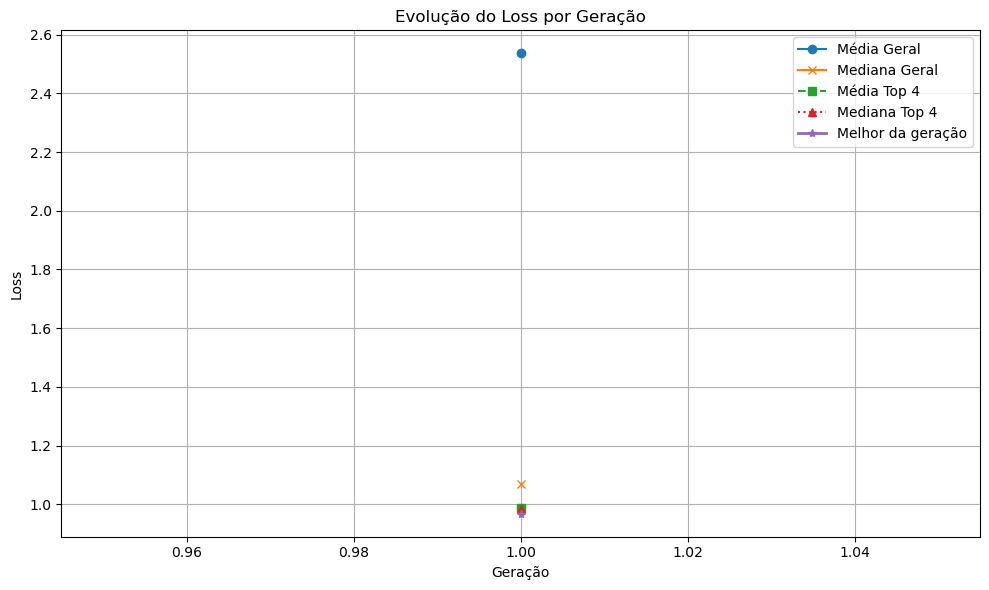

[Epoch 2] Média Geral: 2.5362 | Mediana Geral: 1.0694 | Média Top 4: 0.9877 | Mediana Top 4: 0.9850 | Melhor: 0.9677 | Tempo: 847.26s


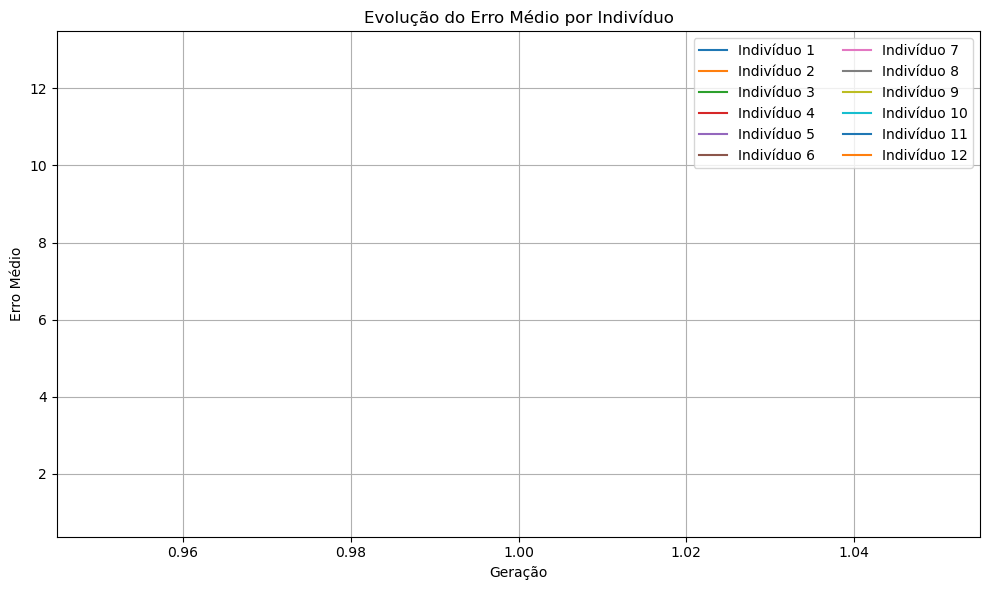

[07:37:52] Média dos top 4: 0.9877 | Mediana: 0.9850
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.9753 | min: 0.0115 | max: 3.2366 | std: 0.8007 | grad: False | numel: 4000 | sum: 3901.1724
[Batch 0] erro hist          → mean: 0.8149 | min: 0.0129 | max: 1.9932 | std: 0.4900 | grad: False | numel: 4000 | sum: 3259.5811
[Batch 0] erro hist**1.5     → mean: 0.8374 | min: 0.0015 | max: 2.8140 | std: 0.6797 | grad: False | numel: 4000 | sum: 3349.6973
[Batch 0] erro dens          → mean: 0.2378 | min: 0.0001 | max: 0.5632 | std: 0.1676 | grad: False | numel: 4000 | sum: 951.1624
[Batch 0] erro dens**1.5     → mean: 0.1379 | min: 0.0000 | max: 0.4226 | std: 0.1275 | grad: False | numel: 4000 | sum: 551.4749
📊 [Batch 0] 3885 grafos únicos | Mais repetido apareceu 6x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.9753
[Batch 0] final_losses       → mean: 0.9748 | min: 0.0116 | max: 3.3533 | std: 0.8225 | grad: False | numel: 4000 | sum: 3899.1279
[Batch 0] erro his

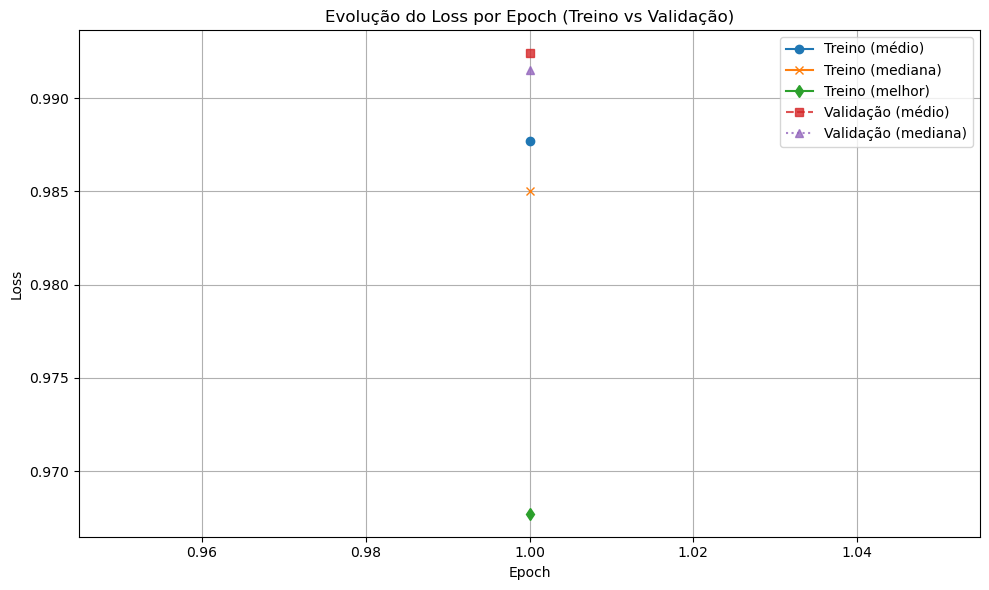

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.1017 | min: 0.0109 | max: 3.8673 | std: 1.0544 | grad: False | numel: 4000 | sum: 4406.9414
[Batch 0] erro hist          → mean: 0.9228 | min: 0.0213 | max: 2.4364 | std: 0.6772 | grad: False | numel: 4000 | sum: 3691.3018
[Batch 0] erro hist**1.5     → mean: 1.0626 | min: 0.0031 | max: 3.8029 | std: 1.0599 | grad: False | numel: 4000 | sum: 4250.5620
[Batch 0] erro dens          → mean: 0.1077 | min: 0.0000 | max: 0.2010 | std: 0.0551 | grad: False | numel: 4000 | sum: 430.7411
[Batch 0] erro dens**1.5     → mean: 0.0391 | min: 0.0000 | max: 0.0901 | std: 0.0253 | grad: False | numel: 4000 | sum: 156.3794
📊 [Batch 0] 3555 grafos únicos | Mais repetido apareceu 22x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.1017
[Batch 0] final_losses       → mean: 1.1232 | min: 0.0081 | max: 3.9893 | std: 1.1092 | grad: False | numel: 4000 | sum: 4492.6279
[Batch 0] erro hist          → mean: 0.9286 | min: 0.0203 | max: 2.

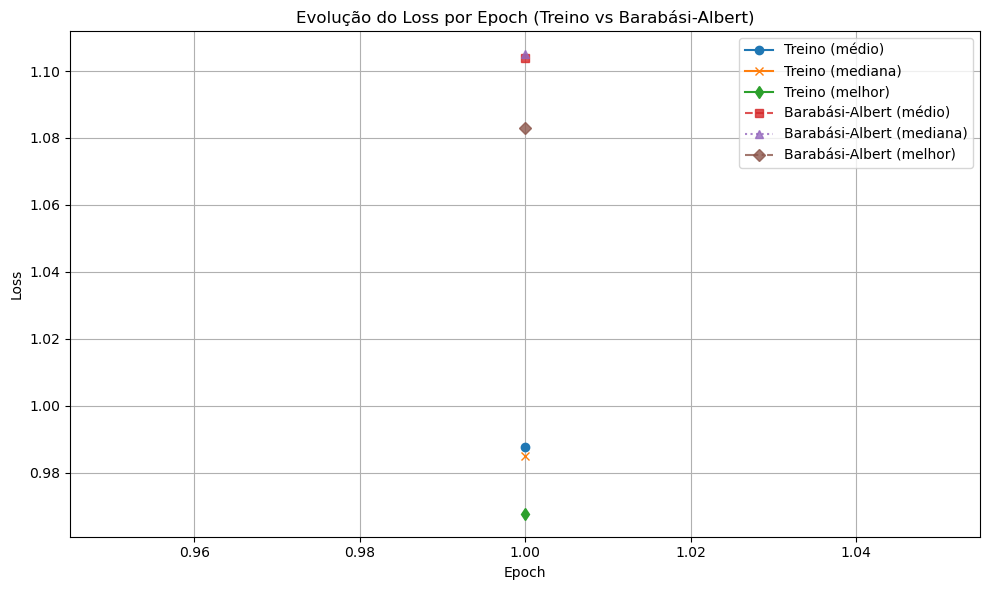

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 1.0215 | min: 0.0125 | max: 2.8538 | std: 0.7806 | grad: False | numel: 4000 | sum: 4085.8242
[Batch 0] erro hist          → mean: 0.8572 | min: 0.0153 | max: 1.8190 | std: 0.4797 | grad: False | numel: 4000 | sum: 3428.7710
[Batch 0] erro hist**1.5     → mean: 0.8895 | min: 0.0019 | max: 2.4533 | std: 0.6703 | grad: False | numel: 4000 | sum: 3558.0044
[Batch 0] erro dens          → mean: 0.2315 | min: 0.0053 | max: 0.5442 | std: 0.1620 | grad: False | numel: 4000 | sum: 925.8625
[Batch 0] erro dens**1.5     → mean: 0.1320 | min: 0.0004 | max: 0.4015 | std: 0.1231 | grad: False | numel: 4000 | sum: 527.8197
📊 [Batch 0] 3607 grafos únicos | Mais repetido apareceu 6x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 1.0215
[Batch 0] final_losses       → mean: 1.0421 | min: 0.0189 | max: 3.0352 | std: 0.8082 | grad: False | numel: 4000 | sum: 4168.2515
[Batch 0] erro hist          → mean: 0.8737 | min: 0.0456 | max: 1.9

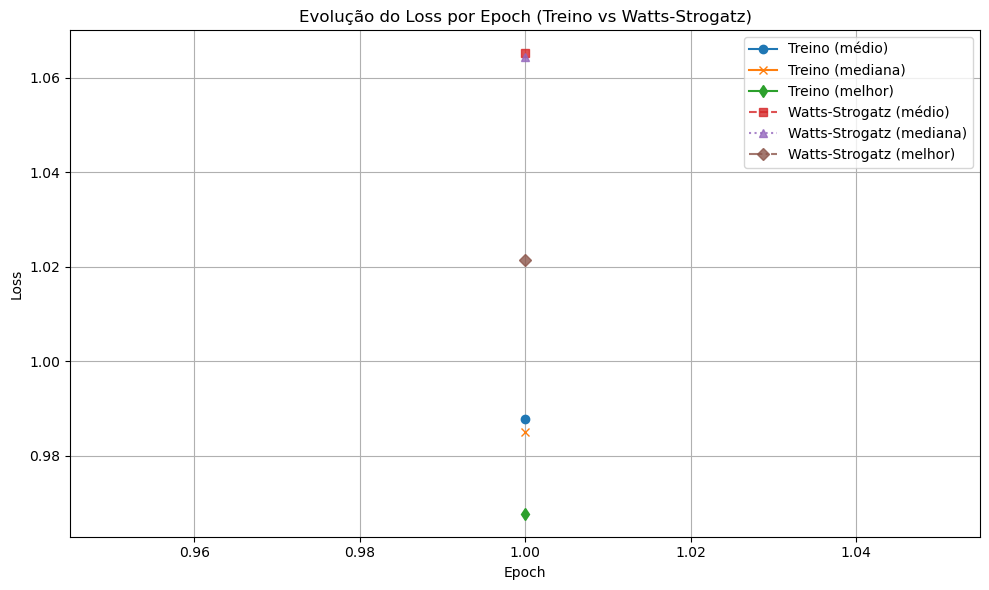

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7962 | min: 0.1687 | max: 2.7989 | std: 0.4355 | grad: False | numel: 4000 | sum: 3184.6436
[Batch 0] erro hist          → mean: 0.8013 | min: 0.3025 | max: 1.9384 | std: 0.2938 | grad: False | numel: 4000 | sum: 3205.0979
[Batch 0] erro hist**1.5     → mean: 0.7528 | min: 0.1664 | max: 2.6987 | std: 0.4115 | grad: False | numel: 4000 | sum: 3011.2471
[Batch 0] erro dens          → mean: 0.1130 | min: 0.0000 | max: 0.2249 | std: 0.0673 | grad: False | numel: 4000 | sum: 452.0857
[Batch 0] erro dens**1.5     → mean: 0.0433 | min: 0.0000 | max: 0.1067 | std: 0.0328 | grad: False | numel: 4000 | sum: 173.3965
📊 [Batch 0] 3588 grafos únicos | Mais repetido apareceu 6x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.7962
[Batch 0] final_losses       → mean: 0.8040 | min: 0.1609 | max: 2.6914 | std: 0.4531 | grad: False | numel: 4000 | sum: 3215.8044
[Batch 0] erro hist          → mean: 0.7995 | min: 0.2904 | max: 1

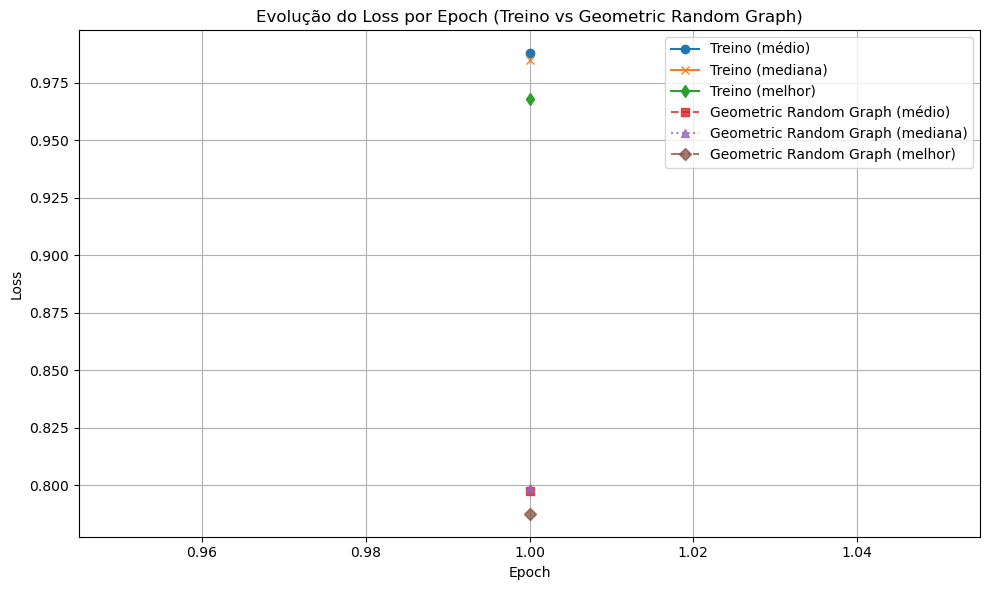

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.0032 | min: 0.0130 | max: 3.0653 | std: 0.6648 | grad: False | numel: 4000 | sum: 4012.7544
[Batch 0] erro hist          → mean: 0.8888 | min: 0.0144 | max: 1.9216 | std: 0.4534 | grad: False | numel: 4000 | sum: 3555.2812
[Batch 0] erro hist**1.5     → mean: 0.9248 | min: 0.0017 | max: 2.6637 | std: 0.6135 | grad: False | numel: 4000 | sum: 3699.0437
[Batch 0] erro dens          → mean: 0.1662 | min: 0.0057 | max: 0.5443 | std: 0.1103 | grad: False | numel: 4000 | sum: 664.8063
[Batch 0] erro dens**1.5     → mean: 0.0784 | min: 0.0004 | max: 0.4016 | std: 0.0784 | grad: False | numel: 4000 | sum: 313.7108
📊 [Batch 0] 3476 grafos únicos | Mais repetido apareceu 5x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.0032
[Batch 0] final_losses       → mean: 1.0813 | min: 0.0131 | max: 3.0895 | std: 0.6961 | grad: False | numel: 4000 | sum: 4325.1973
[Batch 0] erro hist          → mean: 0.9373 | min: 0.0124 | max: 1.9

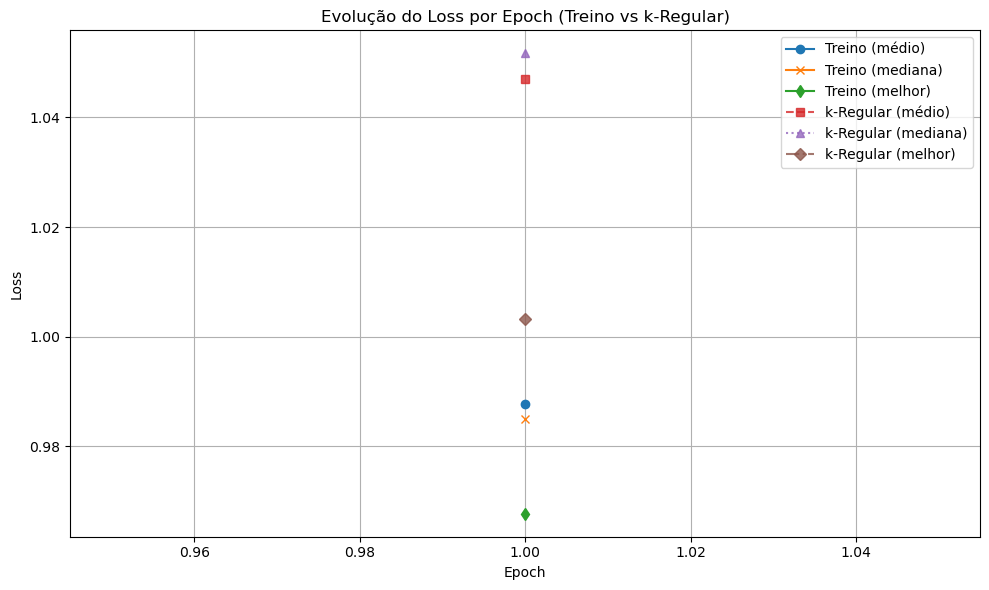

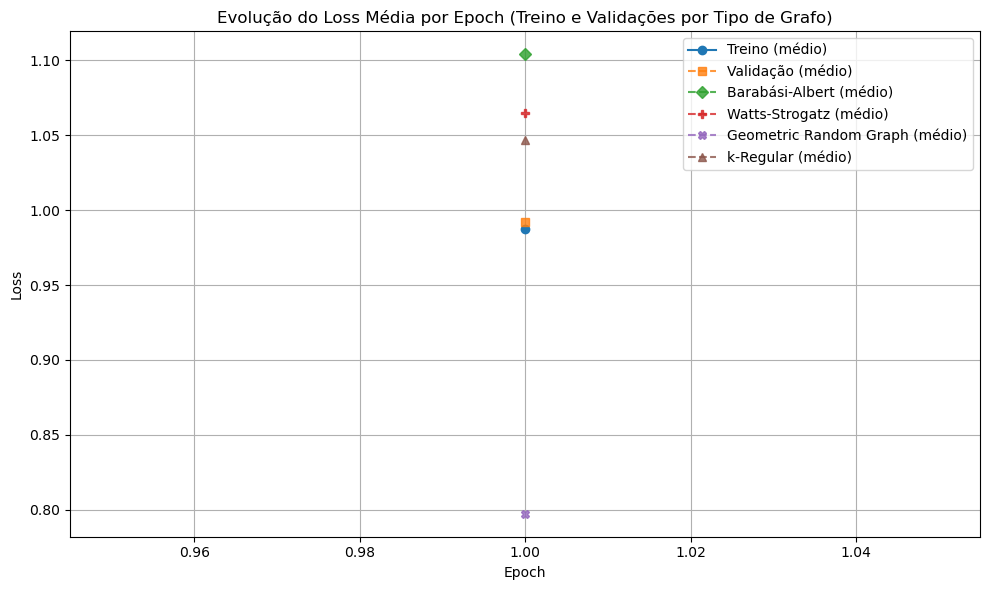

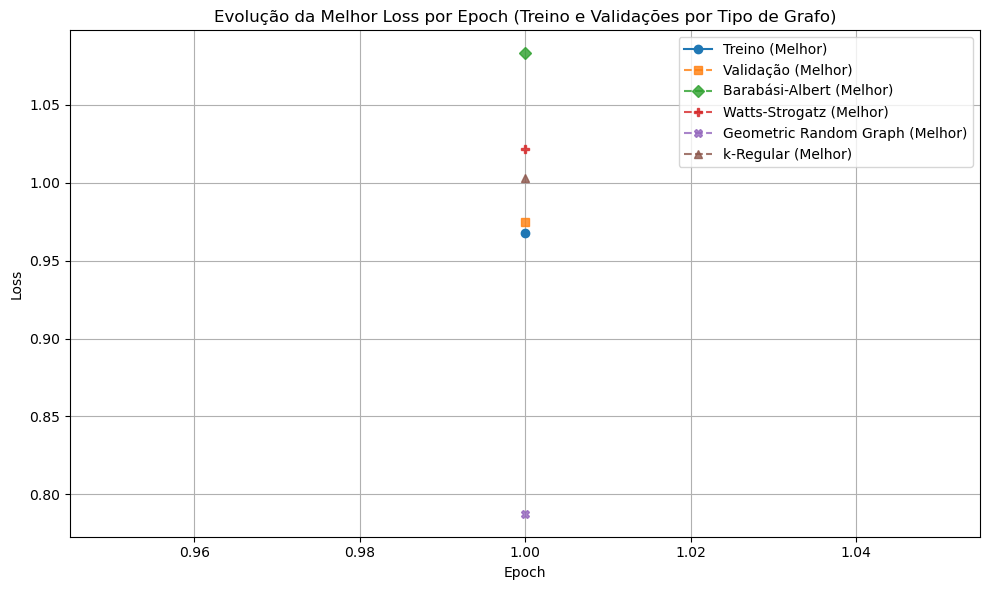

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[07:48:11] Aplicando refinamento com gradiente nos melhores indivíduos...
[07:50:19] Indivíduo 10 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.965302
   🔹 Erro depois: 0.832774
   🔹 Diferença:   +0.132528 | Tempo Total: 128.43s
   🔸 Erros por passo: ['0.965302', '0.867680', '0.832774']
[07:52:29] Indivíduo 6 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.975094
   🔹 Erro depois: 22.891064
   🔹 Diferença:   -21.915970 | Tempo Total: 129.28s
   🔸 Erros por passo: ['0.975094', '13.687801', '22.891064']
Indivíduo salvo como era ANTES do gradiente
[07:54:39] Indivíduo 11 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.990361
   🔹 Erro depois: 3.559657
   🔹 Diferença:   -2.569296 | Tempo Total: 130.65s
   🔸 Erros por passo: ['0.990361', '0.935

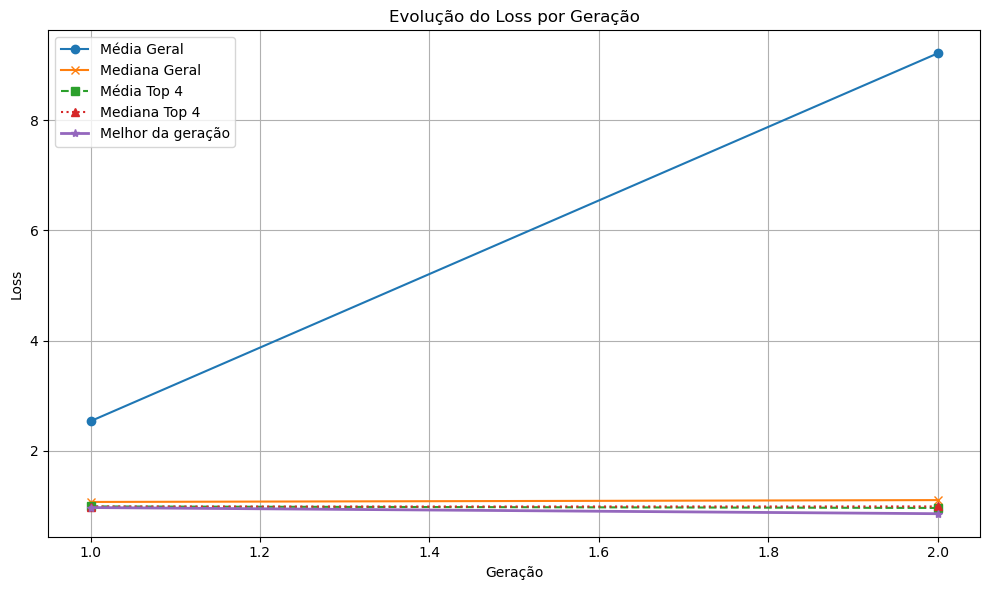

[Epoch 3] Média Geral: 9.2159 | Mediana Geral: 1.1030 | Média Top 4: 0.9607 | Mediana Top 4: 0.9879 | Melhor: 0.8560 | Tempo: 837.94s


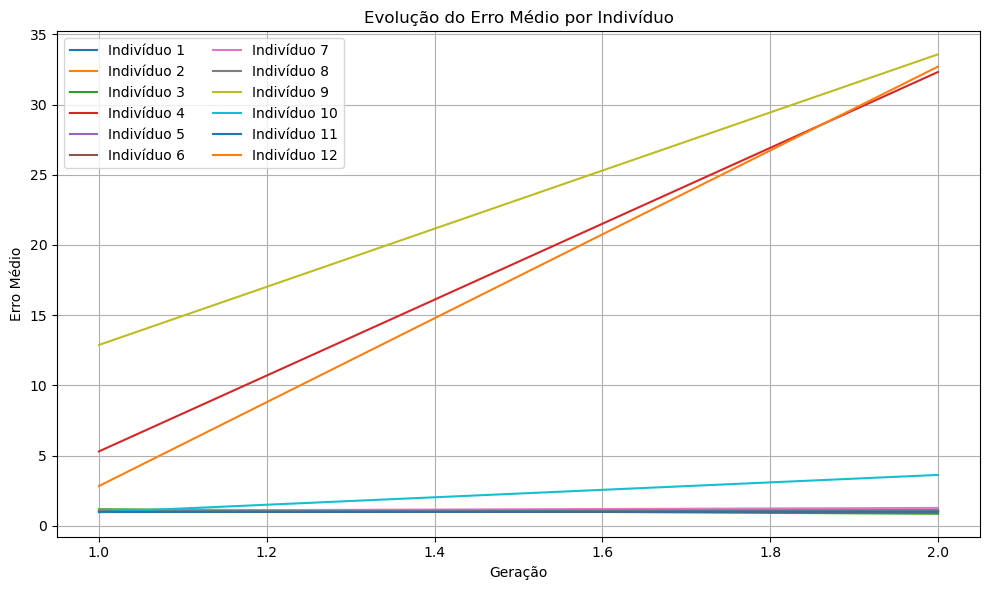

[08:10:53] Média dos top 4: 0.9607 | Mediana: 0.9879
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.8483 | min: 0.0102 | max: 2.8416 | std: 0.6661 | grad: False | numel: 4000 | sum: 3393.0630
[Batch 0] erro hist          → mean: 0.7589 | min: 0.0140 | max: 1.8541 | std: 0.4450 | grad: False | numel: 4000 | sum: 3035.5596
[Batch 0] erro hist**1.5     → mean: 0.7490 | min: 0.0017 | max: 2.5246 | std: 0.5861 | grad: False | numel: 4000 | sum: 2995.9595
[Batch 0] erro dens          → mean: 0.1943 | min: 0.0001 | max: 0.4649 | std: 0.1258 | grad: False | numel: 4000 | sum: 777.0267
[Batch 0] erro dens**1.5     → mean: 0.0993 | min: 0.0000 | max: 0.3170 | std: 0.0868 | grad: False | numel: 4000 | sum: 397.1035
📊 [Batch 0] 3880 grafos únicos | Mais repetido apareceu 7x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.8483
[Batch 0] final_losses       → mean: 0.9847 | min: 0.0117 | max: 3.2887 | std: 0.8038 | grad: False | numel: 4000 | sum: 3938.8813
[Batch 0] erro his

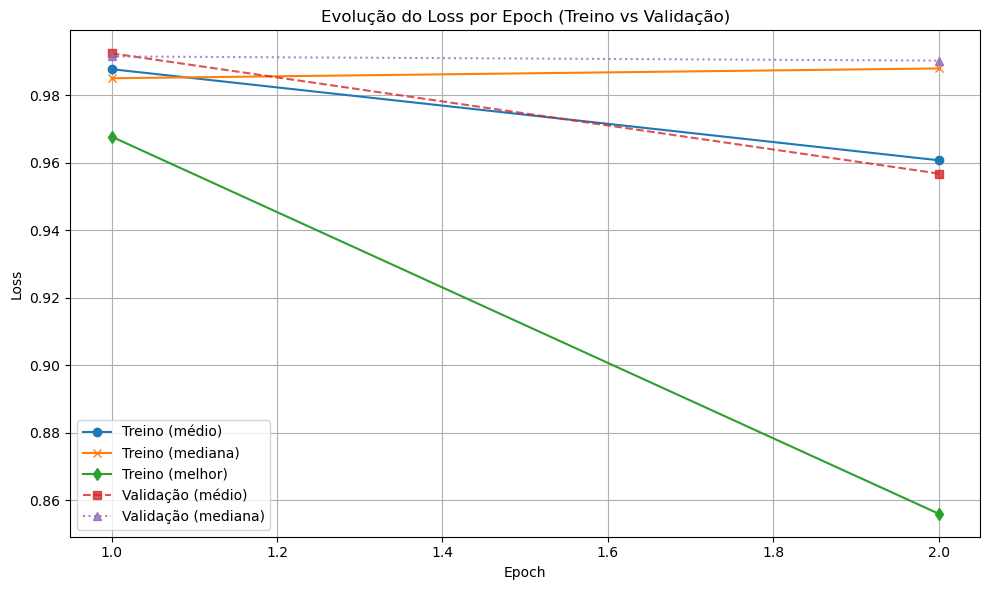

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4651 | min: 0.0077 | max: 4.6628 | std: 1.3124 | grad: False | numel: 4000 | sum: 5860.3462
[Batch 0] erro hist          → mean: 1.1458 | min: 0.0240 | max: 2.7392 | std: 0.7657 | grad: False | numel: 4000 | sum: 4583.2197
[Batch 0] erro hist**1.5     → mean: 1.4317 | min: 0.0037 | max: 4.5336 | std: 1.2982 | grad: False | numel: 4000 | sum: 5726.8750
[Batch 0] erro dens          → mean: 0.0906 | min: 0.0013 | max: 0.2961 | std: 0.0723 | grad: False | numel: 4000 | sum: 362.4704
[Batch 0] erro dens**1.5     → mean: 0.0334 | min: 0.0000 | max: 0.1612 | std: 0.0385 | grad: False | numel: 4000 | sum: 133.4713
📊 [Batch 0] 3567 grafos únicos | Mais repetido apareceu 8x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4651
[Batch 0] final_losses       → mean: 1.1475 | min: 0.0089 | max: 4.0099 | std: 1.1406 | grad: False | numel: 4000 | sum: 4590.0225
[Batch 0] erro hist          → mean: 0.9428 | min: 0.0221 | max: 2.4

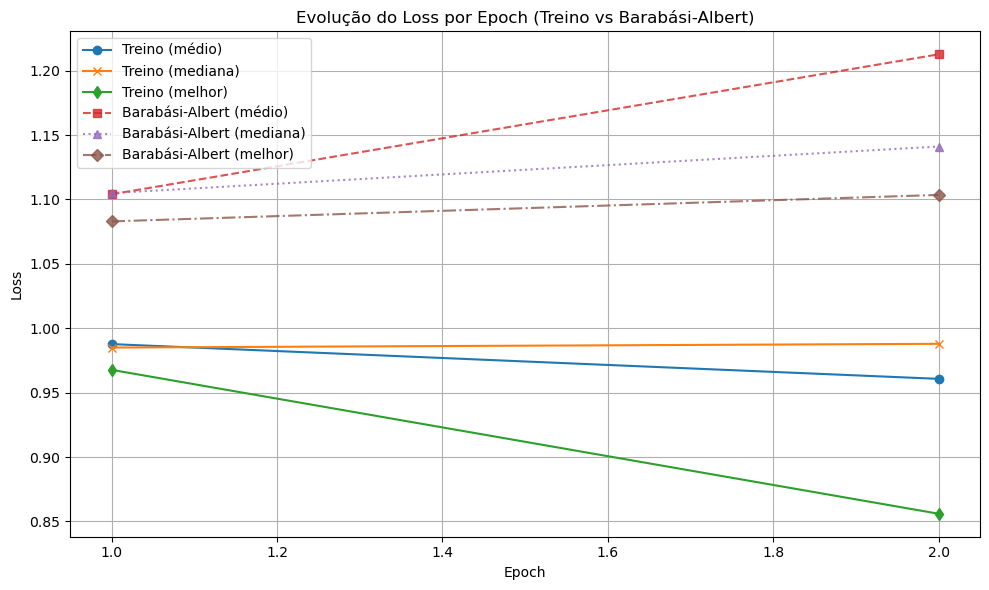

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.9126 | min: 0.0096 | max: 2.4667 | std: 0.7120 | grad: False | numel: 4000 | sum: 3650.2786
[Batch 0] erro hist          → mean: 0.7995 | min: 0.0255 | max: 1.6759 | std: 0.4649 | grad: False | numel: 4000 | sum: 3198.0647
[Batch 0] erro hist**1.5     → mean: 0.8075 | min: 0.0041 | max: 2.1696 | std: 0.6336 | grad: False | numel: 4000 | sum: 3230.0693
[Batch 0] erro dens          → mean: 0.2032 | min: 0.0006 | max: 0.4475 | std: 0.1254 | grad: False | numel: 4000 | sum: 812.6686
[Batch 0] erro dens**1.5     → mean: 0.1051 | min: 0.0000 | max: 0.2993 | std: 0.0864 | grad: False | numel: 4000 | sum: 420.2093
📊 [Batch 0] 3603 grafos únicos | Mais repetido apareceu 3x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.9126
[Batch 0] final_losses       → mean: 1.0011 | min: 0.0144 | max: 2.8969 | std: 0.7805 | grad: False | numel: 4000 | sum: 4004.5522
[Batch 0] erro hist          → mean: 0.8484 | min: 0.0411 | max: 1.8

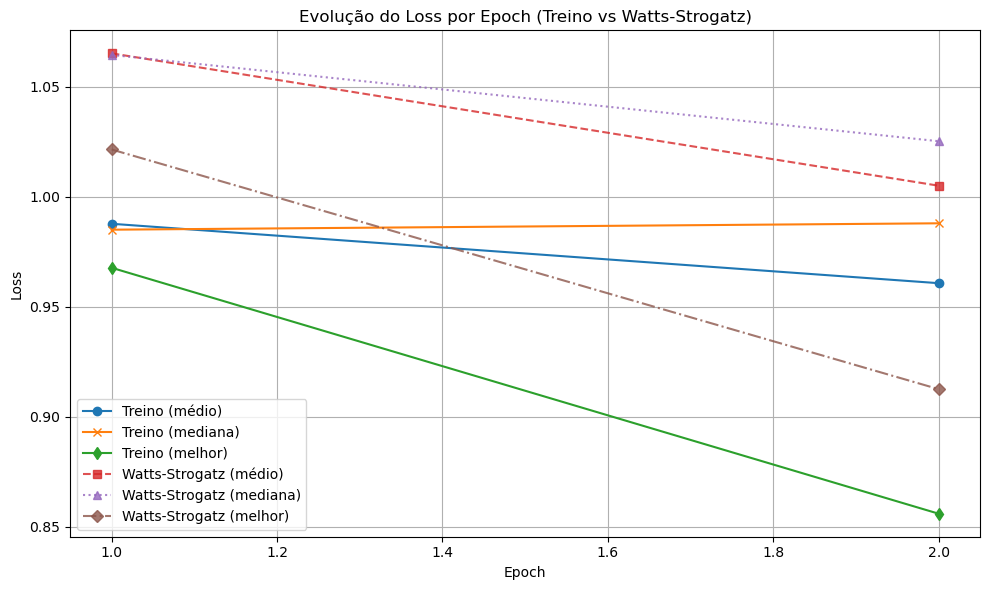

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.9517 | min: 0.1211 | max: 2.9790 | std: 0.6515 | grad: False | numel: 4000 | sum: 3806.8801
[Batch 0] erro hist          → mean: 0.8500 | min: 0.2382 | max: 2.0170 | std: 0.4267 | grad: False | numel: 4000 | sum: 3400.1794
[Batch 0] erro hist**1.5     → mean: 0.8571 | min: 0.1163 | max: 2.8645 | std: 0.6127 | grad: False | numel: 4000 | sum: 3428.5273
[Batch 0] erro dens          → mean: 0.2001 | min: 0.0007 | max: 0.3201 | std: 0.0761 | grad: False | numel: 4000 | sum: 800.3378
[Batch 0] erro dens**1.5     → mean: 0.0946 | min: 0.0000 | max: 0.1811 | std: 0.0489 | grad: False | numel: 4000 | sum: 378.3530
📊 [Batch 0] 3607 grafos únicos | Mais repetido apareceu 3x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.9517
[Batch 0] final_losses       → mean: 0.8024 | min: 0.1952 | max: 2.6922 | std: 0.4575 | grad: False | numel: 4000 | sum: 3209.7207
[Batch 0] erro hist          → mean: 0.7992 | min: 0.3257 | max: 1

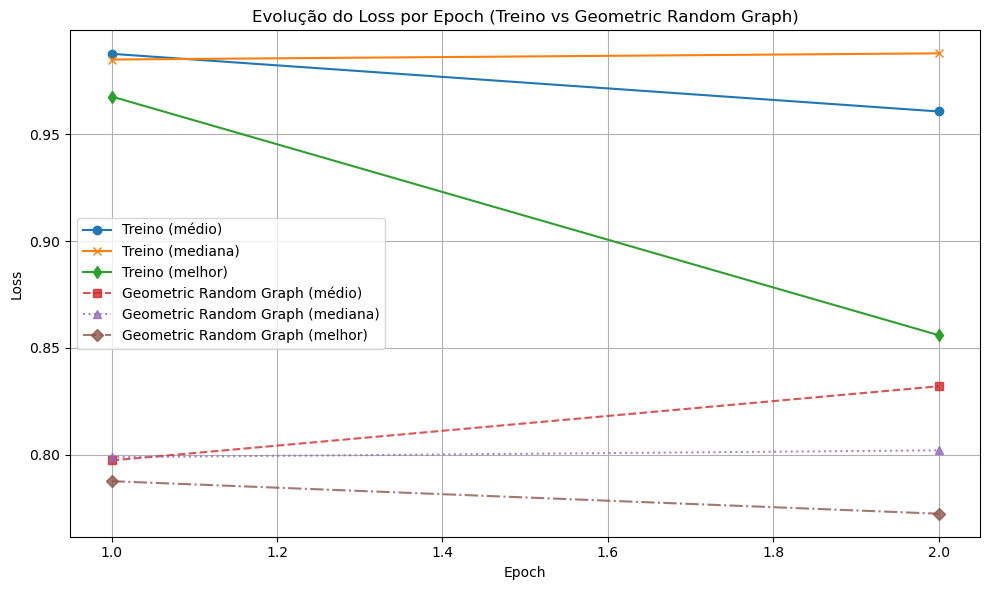

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.1946 | min: 0.0111 | max: 2.6659 | std: 0.7315 | grad: False | numel: 4000 | sum: 4778.2422
[Batch 0] erro hist          → mean: 0.9991 | min: 0.0184 | max: 1.7772 | std: 0.4866 | grad: False | numel: 4000 | sum: 3996.3169
[Batch 0] erro hist**1.5     → mean: 1.0947 | min: 0.0025 | max: 2.3692 | std: 0.6761 | grad: False | numel: 4000 | sum: 4378.9180
[Batch 0] erro dens          → mean: 0.2029 | min: 0.0019 | max: 0.4457 | std: 0.0971 | grad: False | numel: 4000 | sum: 811.7349
[Batch 0] erro dens**1.5     → mean: 0.0998 | min: 0.0001 | max: 0.2975 | std: 0.0623 | grad: False | numel: 4000 | sum: 399.3237
📊 [Batch 0] 3528 grafos únicos | Mais repetido apareceu 3x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.1946
[Batch 0] final_losses       → mean: 1.0538 | min: 0.0131 | max: 3.0926 | std: 0.6765 | grad: False | numel: 4000 | sum: 4215.3091
[Batch 0] erro hist          → mean: 0.9219 | min: 0.0174 | max: 1.9

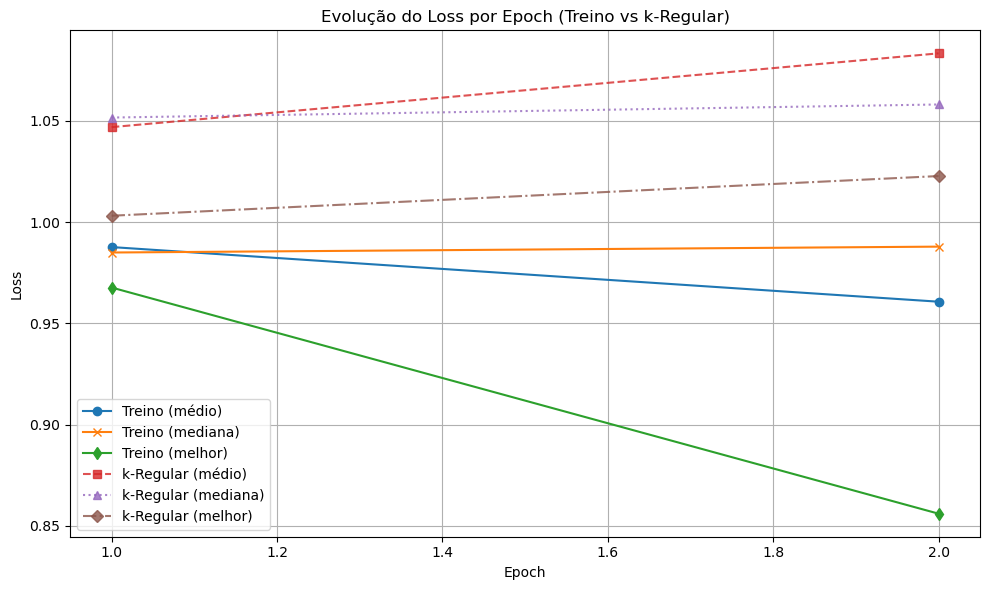

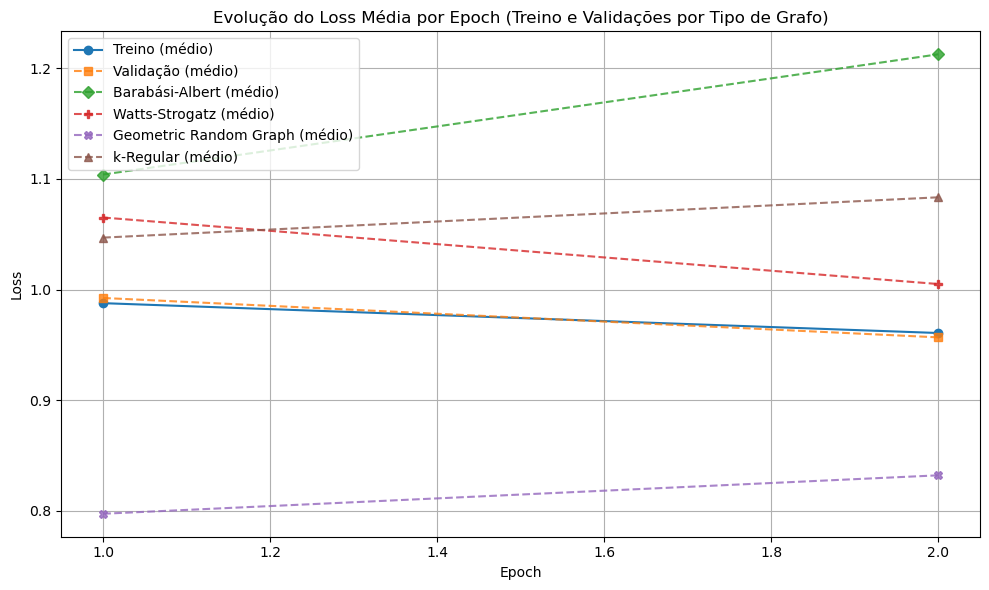

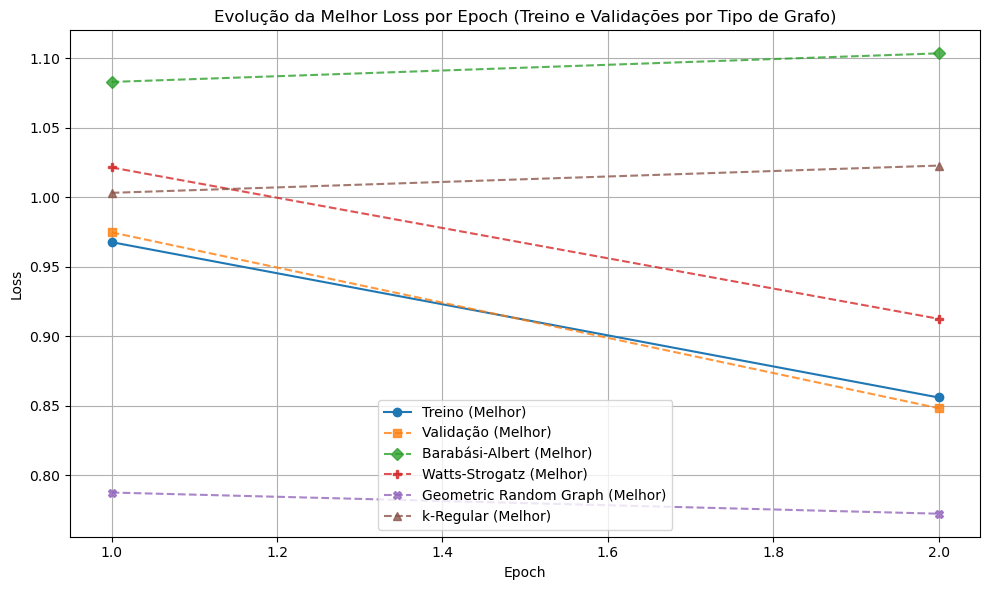

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[08:21:06] Aplicando refinamento com gradiente nos melhores indivíduos...
[08:23:17] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.853387
   🔹 Erro depois: 0.707692
   🔹 Diferença:   +0.145694 | Tempo Total: 130.91s
   🔸 Erros por passo: ['0.853387', '0.755912', '0.707692']
[08:25:30] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.972010
   🔹 Erro depois: 0.758165
   🔹 Diferença:   +0.213846 | Tempo Total: 133.60s
   🔸 Erros por passo: ['0.972010', '0.823039', '0.758165']
[08:27:50] Indivíduo 6 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.984225
   🔹 Erro depois: 7.626745
   🔹 Diferença:   -6.642520 | Tempo Total: 139.01s
   🔸 Erros por passo: ['0.984225', '0.804066', '7.626745']
Indivíduo salvo como era ANTES d

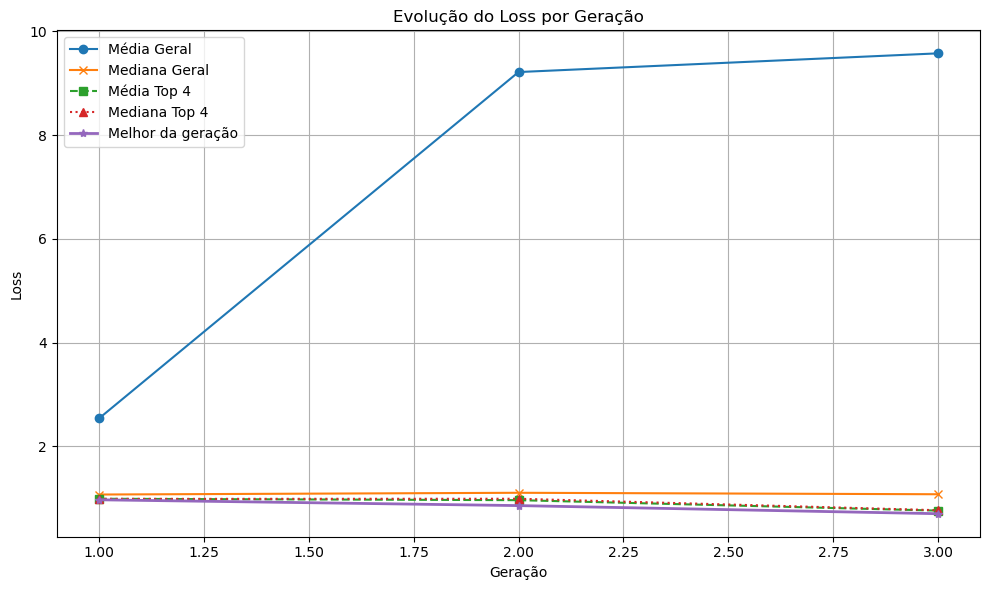

[Epoch 4] Média Geral: 9.5765 | Mediana Geral: 1.0748 | Média Top 4: 0.7591 | Mediana Top 4: 0.7665 | Melhor: 0.6996 | Tempo: 813.92s


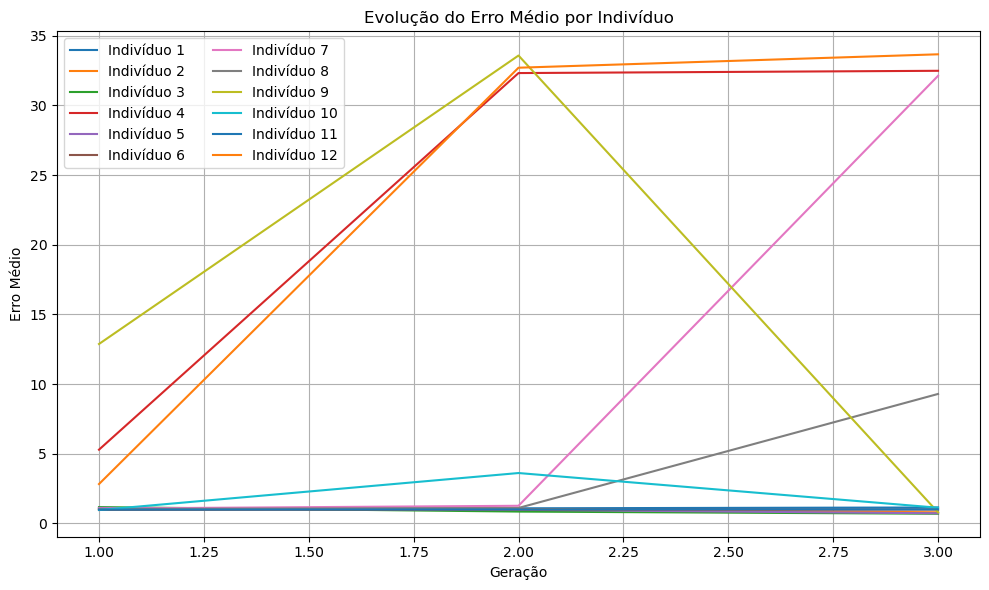

[08:43:45] Média dos top 4: 0.7591 | Mediana: 0.7665
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.7065 | min: 0.0149 | max: 2.2254 | std: 0.5330 | grad: False | numel: 4000 | sum: 2825.9119
[Batch 0] erro hist          → mean: 0.6640 | min: 0.0292 | max: 1.5450 | std: 0.3790 | grad: False | numel: 4000 | sum: 2655.9043
[Batch 0] erro hist**1.5     → mean: 0.6087 | min: 0.0050 | max: 1.9204 | std: 0.4686 | grad: False | numel: 4000 | sum: 2434.6265
[Batch 0] erro dens          → mean: 0.1916 | min: 0.0000 | max: 0.4531 | std: 0.1269 | grad: False | numel: 4000 | sum: 766.2412
[Batch 0] erro dens**1.5     → mean: 0.0978 | min: 0.0000 | max: 0.3050 | std: 0.0869 | grad: False | numel: 4000 | sum: 391.2853
📊 [Batch 0] 3852 grafos únicos | Mais repetido apareceu 17x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.7065
[Batch 0] final_losses       → mean: 0.7264 | min: 0.0323 | max: 2.4134 | std: 0.5415 | grad: False | numel: 4000 | sum: 2905.5898
[Batch 0] erro hi

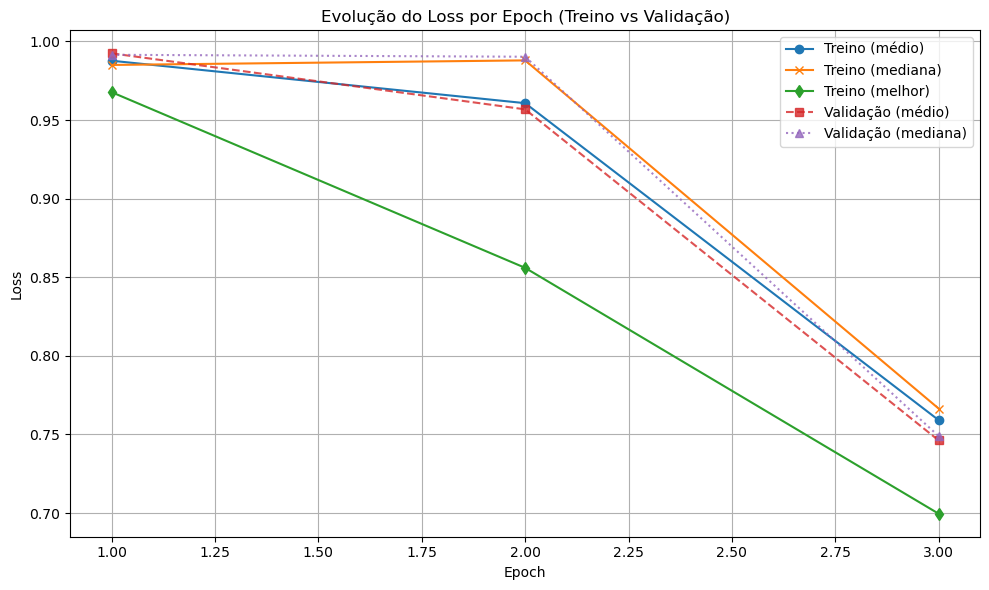

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.6047 | min: 0.1044 | max: 4.6962 | std: 1.3007 | grad: False | numel: 4000 | sum: 6418.6963
[Batch 0] erro hist          → mean: 1.2515 | min: 0.2214 | max: 2.7584 | std: 0.7270 | grad: False | numel: 4000 | sum: 5005.9829
[Batch 0] erro hist**1.5     → mean: 1.5747 | min: 0.1042 | max: 4.5813 | std: 1.2901 | grad: False | numel: 4000 | sum: 6298.9766
[Batch 0] erro dens          → mean: 0.0839 | min: 0.0001 | max: 0.2787 | std: 0.0682 | grad: False | numel: 4000 | sum: 335.7822
[Batch 0] erro dens**1.5     → mean: 0.0299 | min: 0.0000 | max: 0.1472 | std: 0.0353 | grad: False | numel: 4000 | sum: 119.7197
📊 [Batch 0] 3576 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.6047
[Batch 0] final_losses       → mean: 1.4637 | min: 0.0559 | max: 4.4527 | std: 1.2557 | grad: False | numel: 4000 | sum: 5854.8086
[Batch 0] erro hist          → mean: 1.1615 | min: 0.1349 | max: 2.6

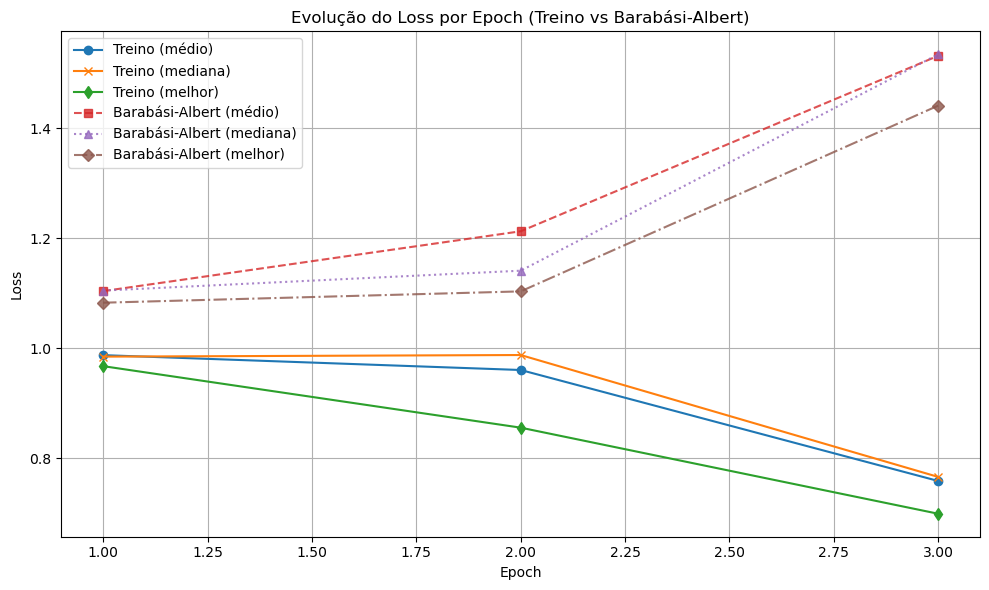

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.7217 | min: 0.0115 | max: 2.1522 | std: 0.5880 | grad: False | numel: 4000 | sum: 2886.8433
[Batch 0] erro hist          → mean: 0.6700 | min: 0.0250 | max: 1.5907 | std: 0.4094 | grad: False | numel: 4000 | sum: 2680.0466
[Batch 0] erro hist**1.5     → mean: 0.6252 | min: 0.0040 | max: 2.0062 | std: 0.5279 | grad: False | numel: 4000 | sum: 2500.8079
[Batch 0] erro dens          → mean: 0.1912 | min: 0.0000 | max: 0.4353 | std: 0.1213 | grad: False | numel: 4000 | sum: 764.6027
[Batch 0] erro dens**1.5     → mean: 0.0965 | min: 0.0000 | max: 0.2872 | std: 0.0819 | grad: False | numel: 4000 | sum: 386.0357
📊 [Batch 0] 3633 grafos únicos | Mais repetido apareceu 12x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.7217
[Batch 0] final_losses       → mean: 0.7584 | min: 0.0135 | max: 2.1638 | std: 0.5879 | grad: False | numel: 4000 | sum: 3033.6772
[Batch 0] erro hist          → mean: 0.6913 | min: 0.0254 | max: 1.

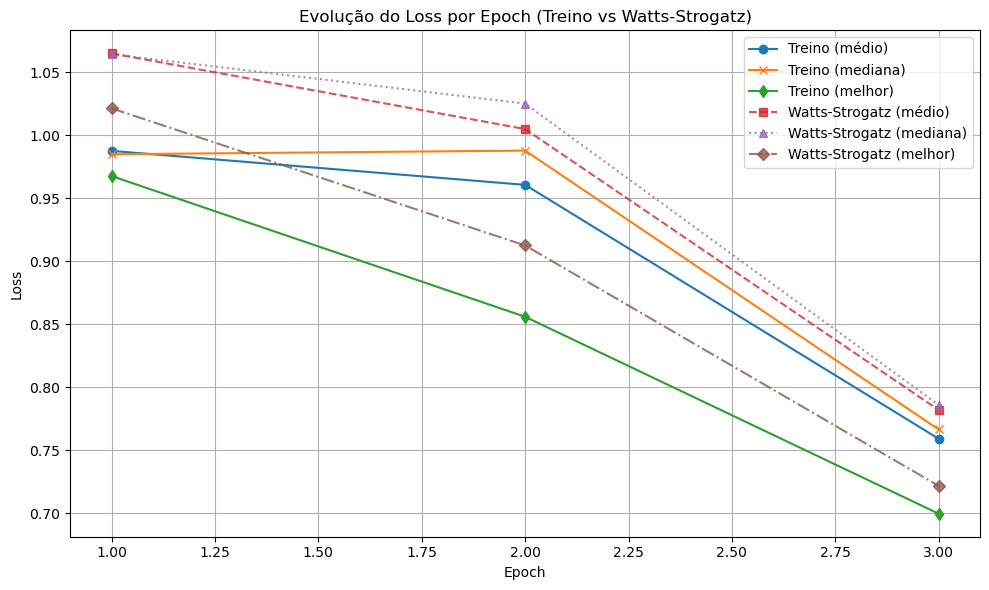

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.9619 | min: 0.1190 | max: 3.4478 | std: 0.6821 | grad: False | numel: 4000 | sum: 3847.5664
[Batch 0] erro hist          → mean: 0.8565 | min: 0.2415 | max: 2.2731 | std: 0.4538 | grad: False | numel: 4000 | sum: 3426.1550
[Batch 0] erro hist**1.5     → mean: 0.8762 | min: 0.1187 | max: 3.4271 | std: 0.6474 | grad: False | numel: 4000 | sum: 3504.7612
[Batch 0] erro dens          → mean: 0.1871 | min: 0.0017 | max: 0.3010 | std: 0.0724 | grad: False | numel: 4000 | sum: 748.4109
[Batch 0] erro dens**1.5     → mean: 0.0857 | min: 0.0001 | max: 0.1651 | std: 0.0448 | grad: False | numel: 4000 | sum: 342.8052
📊 [Batch 0] 3643 grafos únicos | Mais repetido apareceu 3x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.9619
[Batch 0] final_losses       → mean: 0.8521 | min: 0.1352 | max: 3.1471 | std: 0.6128 | grad: False | numel: 4000 | sum: 3408.5642
[Batch 0] erro hist          → mean: 0.8072 | min: 0.2626 | max: 2

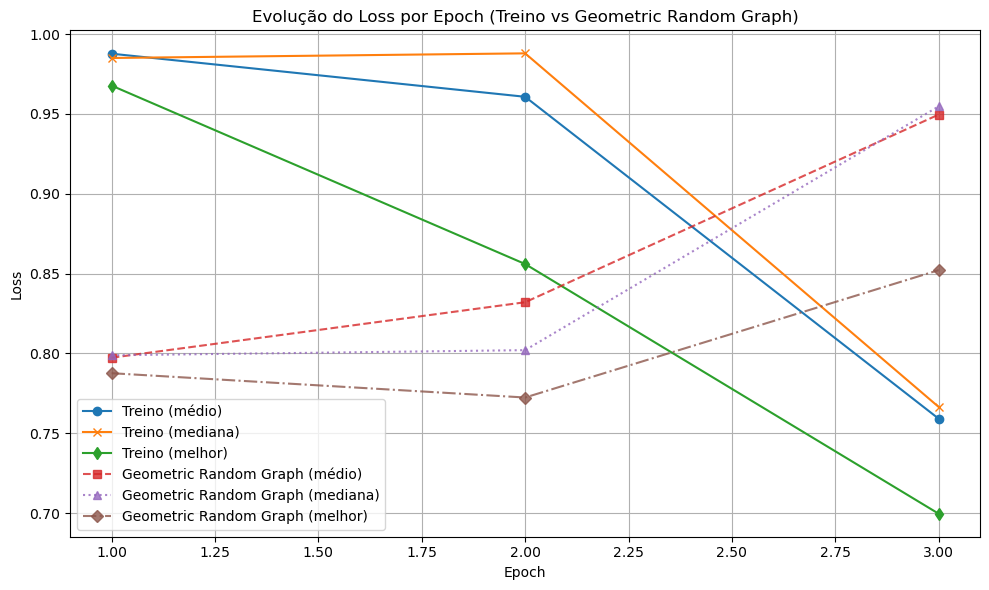

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.1356 | min: 0.0141 | max: 2.2210 | std: 0.6898 | grad: False | numel: 4000 | sum: 4542.3076
[Batch 0] erro hist          → mean: 0.9693 | min: 0.0190 | max: 1.6284 | std: 0.4688 | grad: False | numel: 4000 | sum: 3877.3782
[Batch 0] erro hist**1.5     → mean: 1.0443 | min: 0.0026 | max: 2.0780 | std: 0.6466 | grad: False | numel: 4000 | sum: 4177.1191
[Batch 0] erro dens          → mean: 0.1907 | min: 0.0001 | max: 0.4340 | std: 0.0934 | grad: False | numel: 4000 | sum: 762.9997
[Batch 0] erro dens**1.5     → mean: 0.0913 | min: 0.0000 | max: 0.2859 | std: 0.0588 | grad: False | numel: 4000 | sum: 365.1885
📊 [Batch 0] 3498 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.1356
[Batch 0] final_losses       → mean: 1.0290 | min: 0.0287 | max: 2.1730 | std: 0.6164 | grad: False | numel: 4000 | sum: 4116.1729
[Batch 0] erro hist          → mean: 0.9138 | min: 0.0562 | max: 1.5

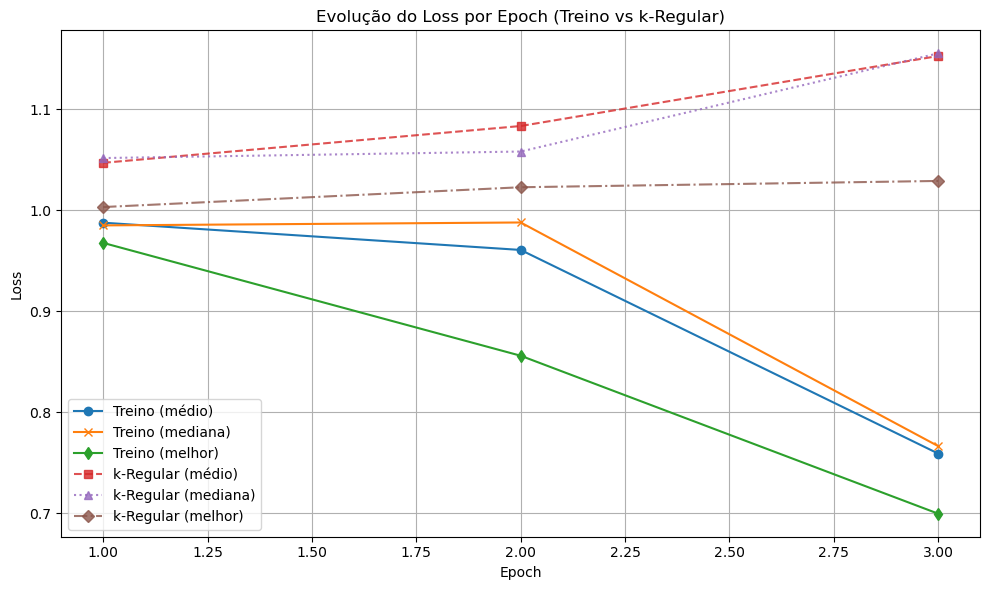

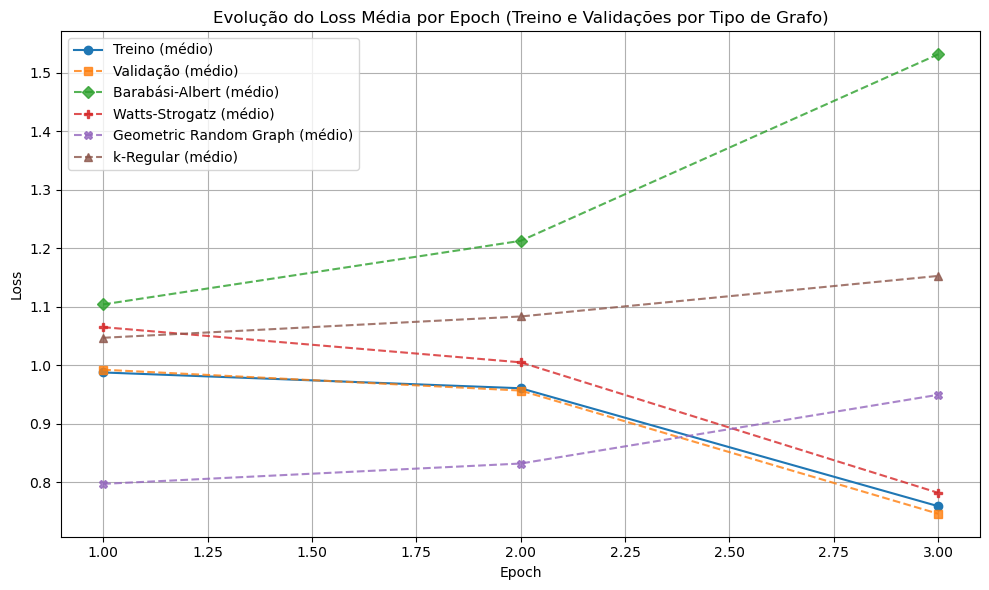

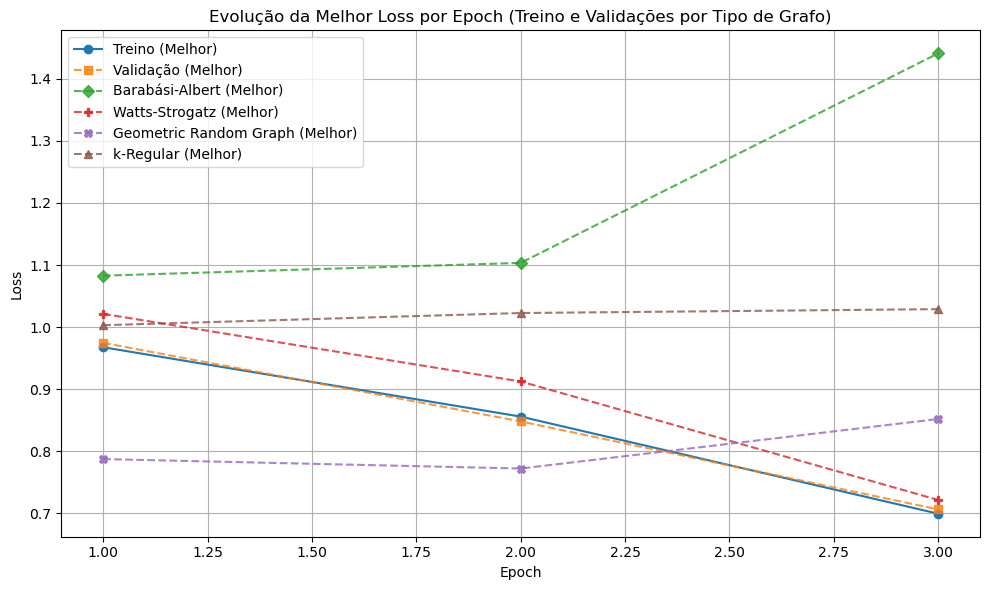

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[08:54:03] Aplicando refinamento com gradiente nos melhores indivíduos...
[08:56:22] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.685353
   🔹 Erro depois: 0.725191
   🔹 Diferença:   -0.039837 | Tempo Total: 139.58s
   🔸 Erros por passo: ['0.685353', '0.732062', '0.725191']
Indivíduo salvo como era ANTES do gradiente
[08:58:41] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.716626
   🔹 Erro depois: 0.782735
   🔹 Diferença:   -0.066109 | Tempo Total: 138.41s
   🔸 Erros por passo: ['0.716626', '0.843801', '0.782735']
Indivíduo salvo como era ANTES do gradiente
[09:00:56] Indivíduo 9 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.784001
   🔹 Erro depois: 0.734656
   🔹 Diferença:   +0.049345 | Tempo Total: 134.60s
   

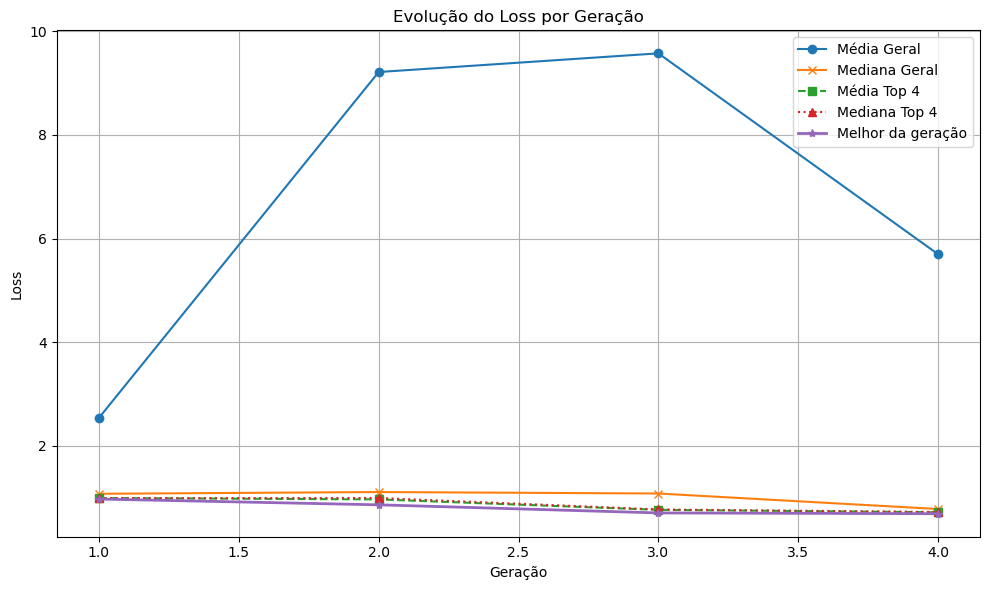

[Epoch 5] Média Geral: 5.6968 | Mediana Geral: 0.7747 | Média Top 4: 0.7128 | Mediana Top 4: 0.7172 | Melhor: 0.6846 | Tempo: 811.95s


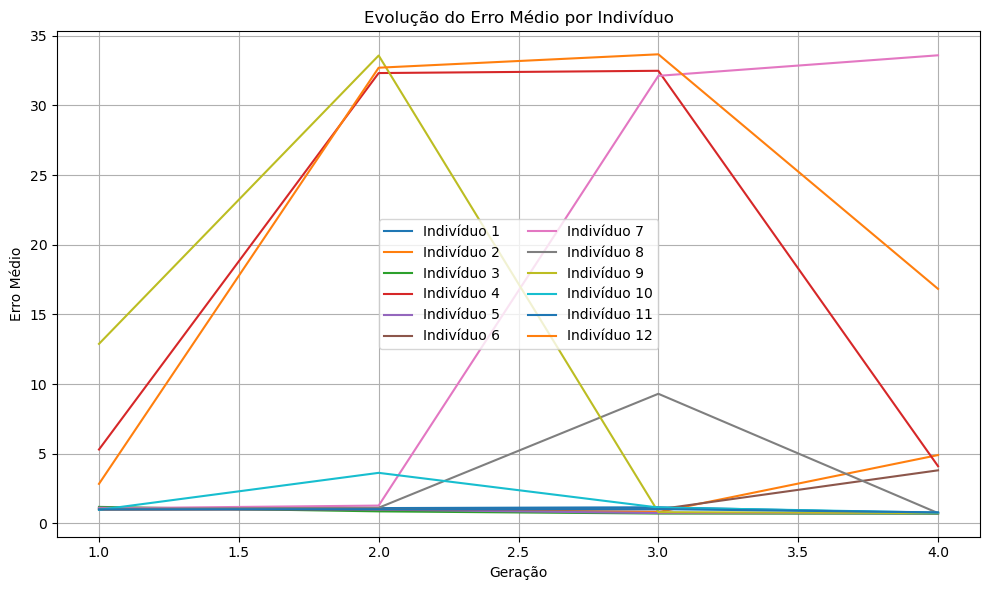

[09:16:46] Média dos top 4: 0.7128 | Mediana: 0.7172
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.6858 | min: 0.0113 | max: 2.2254 | std: 0.5243 | grad: False | numel: 4000 | sum: 2743.0779
[Batch 0] erro hist          → mean: 0.6490 | min: 0.0203 | max: 1.5450 | std: 0.3775 | grad: False | numel: 4000 | sum: 2595.8267
[Batch 0] erro hist**1.5     → mean: 0.5906 | min: 0.0029 | max: 1.9204 | std: 0.4617 | grad: False | numel: 4000 | sum: 2362.5142
[Batch 0] erro dens          → mean: 0.1880 | min: 0.0003 | max: 0.4531 | std: 0.1248 | grad: False | numel: 4000 | sum: 751.9421
[Batch 0] erro dens**1.5     → mean: 0.0951 | min: 0.0000 | max: 0.3050 | std: 0.0850 | grad: False | numel: 4000 | sum: 380.5635
📊 [Batch 0] 3862 grafos únicos | Mais repetido apareceu 14x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.6858
[Batch 0] final_losses       → mean: 0.7114 | min: 0.0237 | max: 2.4134 | std: 0.5409 | grad: False | numel: 4000 | sum: 2845.5217
[Batch 0] erro hi

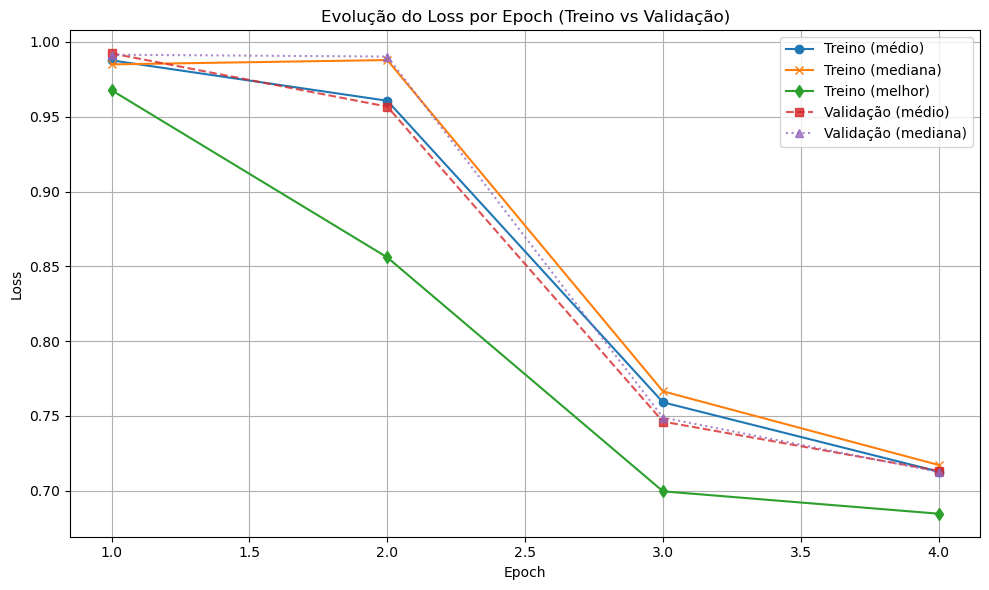

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.5783 | min: 0.0950 | max: 4.6984 | std: 1.2933 | grad: False | numel: 4000 | sum: 6313.2339
[Batch 0] erro hist          → mean: 1.2368 | min: 0.2074 | max: 2.7594 | std: 0.7256 | grad: False | numel: 4000 | sum: 4947.0469
[Batch 0] erro hist**1.5     → mean: 1.5501 | min: 0.0945 | max: 4.5837 | std: 1.2839 | grad: False | numel: 4000 | sum: 6200.4951
[Batch 0] erro dens          → mean: 0.0809 | min: 0.0001 | max: 0.2786 | std: 0.0648 | grad: False | numel: 4000 | sum: 323.7160
[Batch 0] erro dens**1.5     → mean: 0.0282 | min: 0.0000 | max: 0.1471 | std: 0.0330 | grad: False | numel: 4000 | sum: 112.7383
📊 [Batch 0] 3595 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.5783
[Batch 0] final_losses       → mean: 1.5084 | min: 0.0509 | max: 4.4503 | std: 1.2501 | grad: False | numel: 4000 | sum: 6033.6875
[Batch 0] erro hist          → mean: 1.1918 | min: 0.1154 | max: 2.6

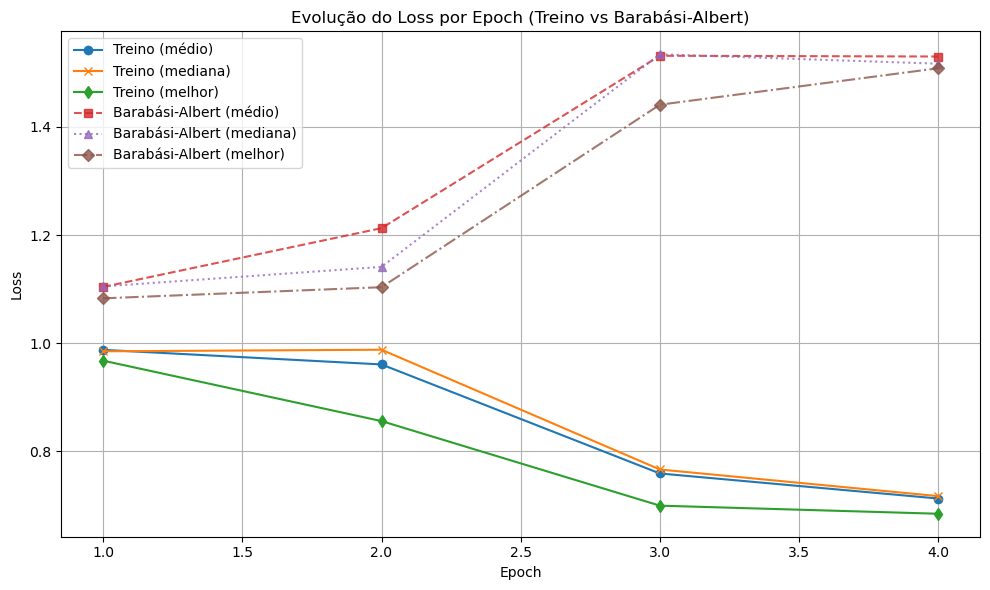

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.7305 | min: 0.0109 | max: 2.1448 | std: 0.5897 | grad: False | numel: 4000 | sum: 2922.0671
[Batch 0] erro hist          → mean: 0.6737 | min: 0.0182 | max: 1.5881 | std: 0.4109 | grad: False | numel: 4000 | sum: 2694.8035
[Batch 0] erro hist**1.5     → mean: 0.6304 | min: 0.0025 | max: 2.0013 | std: 0.5281 | grad: False | numel: 4000 | sum: 2521.6553
[Batch 0] erro dens          → mean: 0.1962 | min: 0.0000 | max: 0.4351 | std: 0.1229 | grad: False | numel: 4000 | sum: 784.9103
[Batch 0] erro dens**1.5     → mean: 0.1001 | min: 0.0000 | max: 0.2870 | std: 0.0833 | grad: False | numel: 4000 | sum: 400.4120
📊 [Batch 0] 3572 grafos únicos | Mais repetido apareceu 8x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.7305
[Batch 0] final_losses       → mean: 0.7512 | min: 0.0164 | max: 2.0342 | std: 0.5861 | grad: False | numel: 4000 | sum: 3004.8711
[Batch 0] erro hist          → mean: 0.6865 | min: 0.0382 | max: 1.5

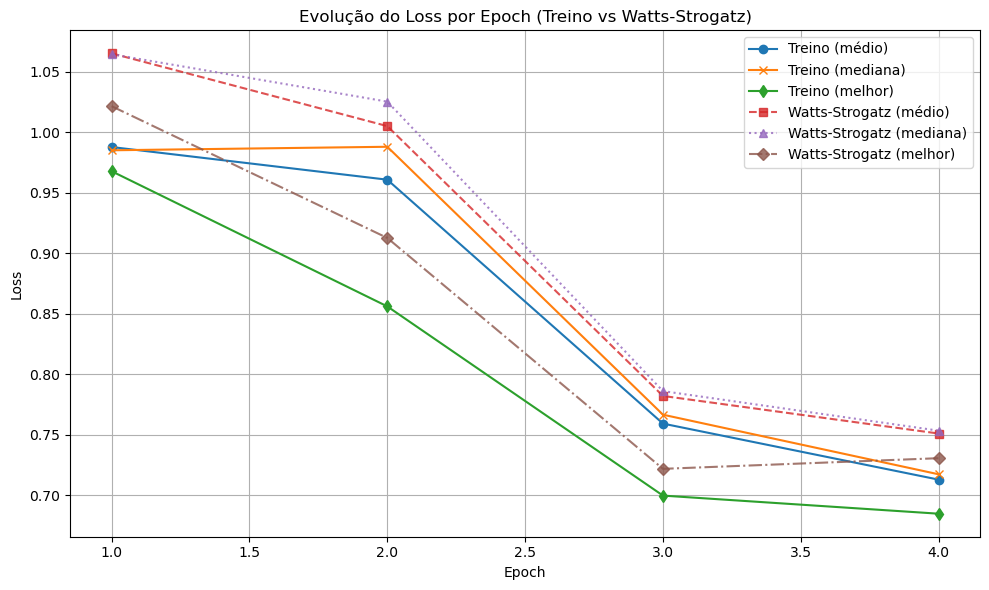

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.9460 | min: 0.1228 | max: 3.1587 | std: 0.6804 | grad: False | numel: 4000 | sum: 3784.1475
[Batch 0] erro hist          → mean: 0.8458 | min: 0.2408 | max: 2.1372 | std: 0.4528 | grad: False | numel: 4000 | sum: 3383.2485
[Batch 0] erro hist**1.5     → mean: 0.8612 | min: 0.1182 | max: 3.1243 | std: 0.6455 | grad: False | numel: 4000 | sum: 3444.7822
[Batch 0] erro dens          → mean: 0.1859 | min: 0.0007 | max: 0.3006 | std: 0.0720 | grad: False | numel: 4000 | sum: 743.4084
[Batch 0] erro dens**1.5     → mean: 0.0848 | min: 0.0000 | max: 0.1648 | std: 0.0446 | grad: False | numel: 4000 | sum: 339.3655
📊 [Batch 0] 3627 grafos únicos | Mais repetido apareceu 6x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.9460
[Batch 0] final_losses       → mean: 0.8431 | min: 0.1346 | max: 3.1471 | std: 0.6112 | grad: False | numel: 4000 | sum: 3372.5120
[Batch 0] erro hist          → mean: 0.8009 | min: 0.2558 | max: 2

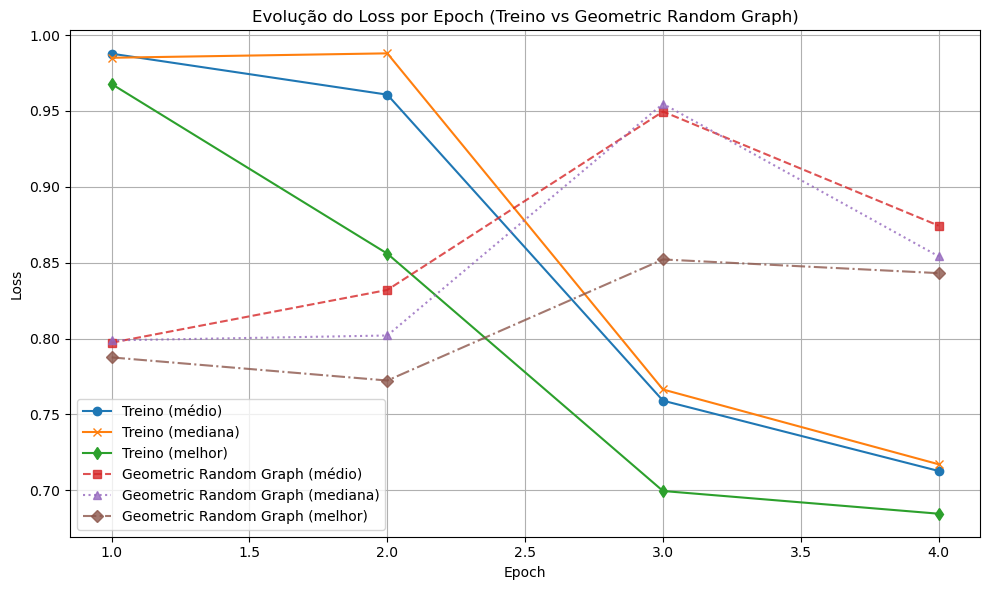

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.1334 | min: 0.0154 | max: 2.2016 | std: 0.6851 | grad: False | numel: 4000 | sum: 4533.6758
[Batch 0] erro hist          → mean: 0.9673 | min: 0.0340 | max: 1.6178 | std: 0.4681 | grad: False | numel: 4000 | sum: 3869.2148
[Batch 0] erro hist**1.5     → mean: 1.0413 | min: 0.0063 | max: 2.0577 | std: 0.6430 | grad: False | numel: 4000 | sum: 4165.1758
[Batch 0] erro dens          → mean: 0.1923 | min: 0.0003 | max: 0.4341 | std: 0.0925 | grad: False | numel: 4000 | sum: 769.2900
[Batch 0] erro dens**1.5     → mean: 0.0921 | min: 0.0000 | max: 0.2860 | std: 0.0585 | grad: False | numel: 4000 | sum: 368.4995
📊 [Batch 0] 3519 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.1334
[Batch 0] final_losses       → mean: 1.0248 | min: 0.0319 | max: 2.1797 | std: 0.6124 | grad: False | numel: 4000 | sum: 4099.3438
[Batch 0] erro hist          → mean: 0.9104 | min: 0.0563 | max: 1.5

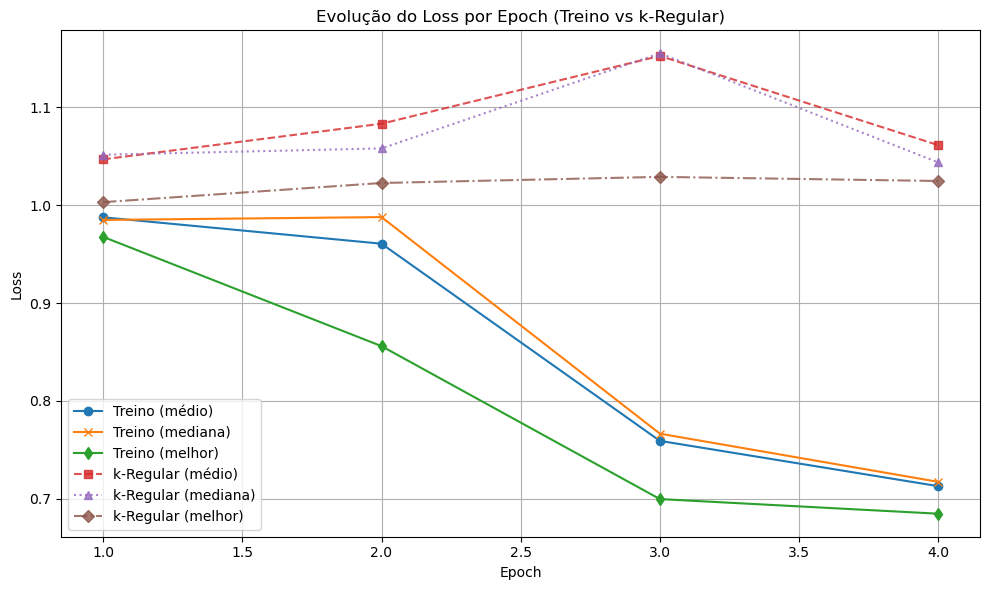

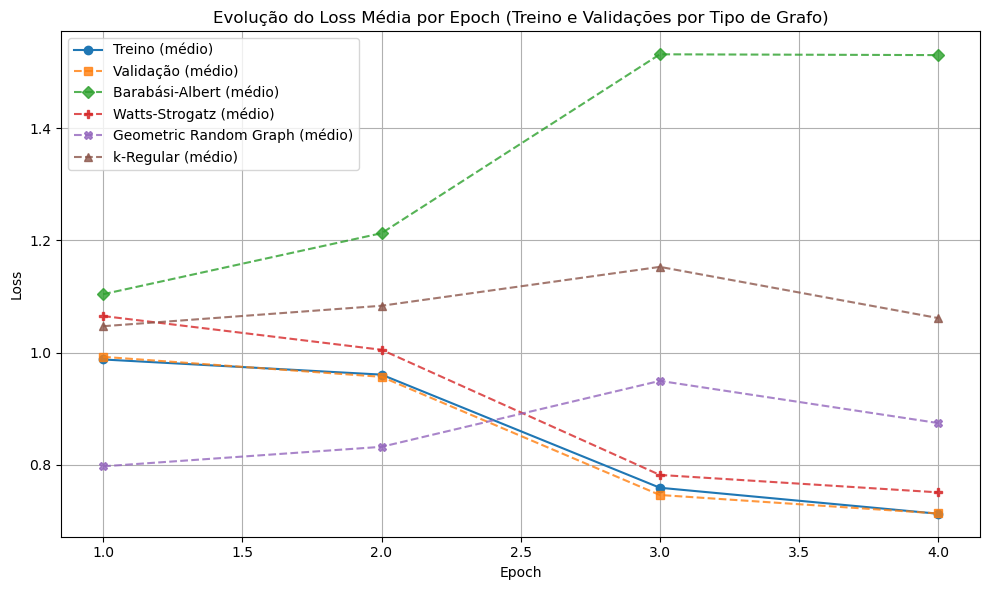

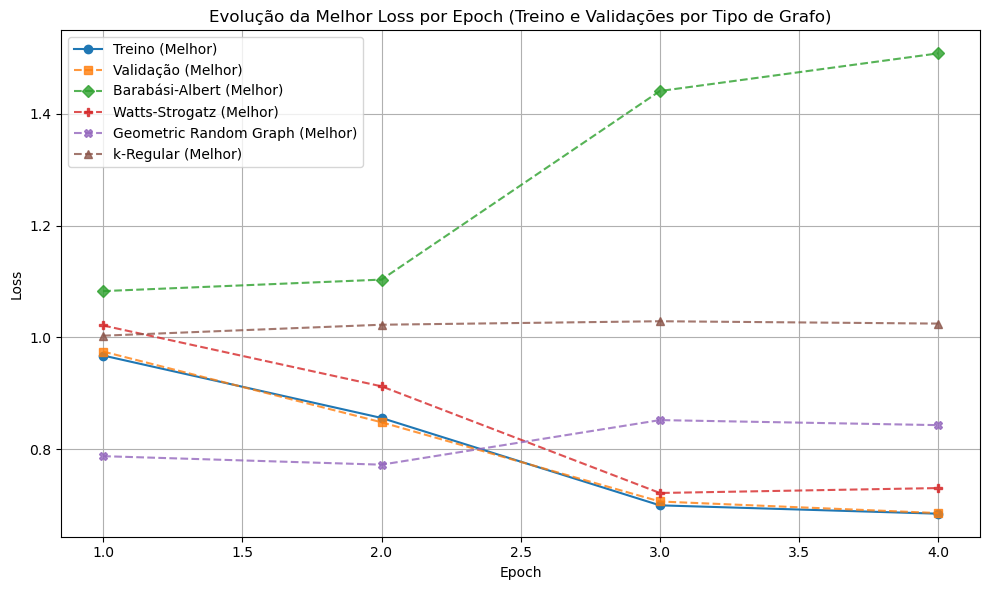

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[09:27:22] Aplicando refinamento com gradiente nos melhores indivíduos...
[09:29:38] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.686942
   🔹 Erro depois: 20.369980
   🔹 Diferença:   -19.683038 | Tempo Total: 136.26s
   🔸 Erros por passo: ['0.686942', '20.060295', '20.369980']
Indivíduo salvo como era ANTES do gradiente
[09:31:54] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.715839
   🔹 Erro depois: 0.684052
   🔹 Diferença:   +0.031787 | Tempo Total: 136.04s
   🔸 Erros por passo: ['0.715839', '0.716029', '0.684052']
[09:34:10] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.715839
   🔹 Erro depois: 0.766882
   🔹 Diferença:   -0.051043 | Tempo Total: 135.66s
   🔸 Erros por passo: ['0.715839', '0.85238

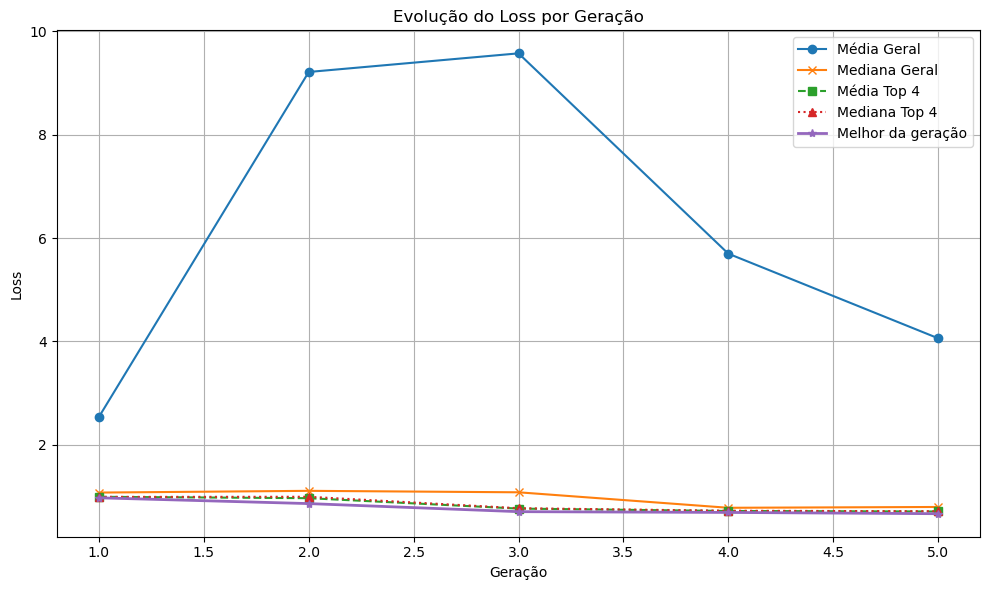

[Epoch 6] Média Geral: 4.0585 | Mediana Geral: 0.7904 | Média Top 4: 0.7030 | Mediana Top 4: 0.7071 | Melhor: 0.6601 | Tempo: 798.34s


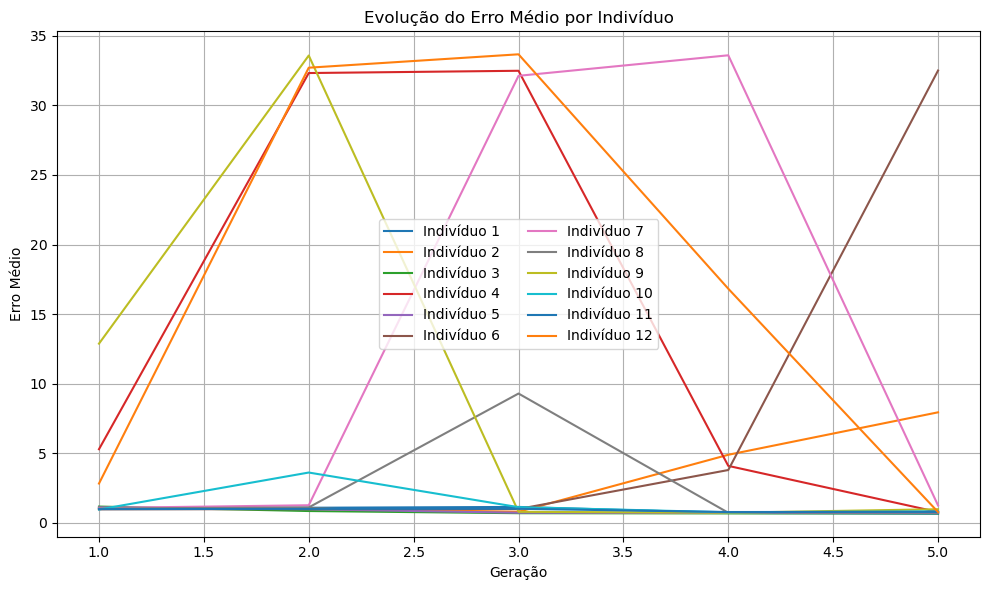

[09:49:46] Média dos top 4: 0.7030 | Mediana: 0.7071
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.6548 | min: 0.0217 | max: 2.2661 | std: 0.4964 | grad: False | numel: 4000 | sum: 2619.0425
[Batch 0] erro hist          → mean: 0.6278 | min: 0.0487 | max: 1.5548 | std: 0.3500 | grad: False | numel: 4000 | sum: 2511.1714
[Batch 0] erro hist**1.5     → mean: 0.5558 | min: 0.0108 | max: 1.9386 | std: 0.4288 | grad: False | numel: 4000 | sum: 2223.2156
[Batch 0] erro dens          → mean: 0.1906 | min: 0.0000 | max: 0.4751 | std: 0.1351 | grad: False | numel: 4000 | sum: 762.5917
[Batch 0] erro dens**1.5     → mean: 0.0990 | min: 0.0000 | max: 0.3275 | std: 0.0939 | grad: False | numel: 4000 | sum: 395.8271
📊 [Batch 0] 3842 grafos únicos | Mais repetido apareceu 18x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.6548
[Batch 0] final_losses       → mean: 0.6911 | min: 0.0113 | max: 2.2254 | std: 0.5275 | grad: False | numel: 4000 | sum: 2764.5005
[Batch 0] erro hi

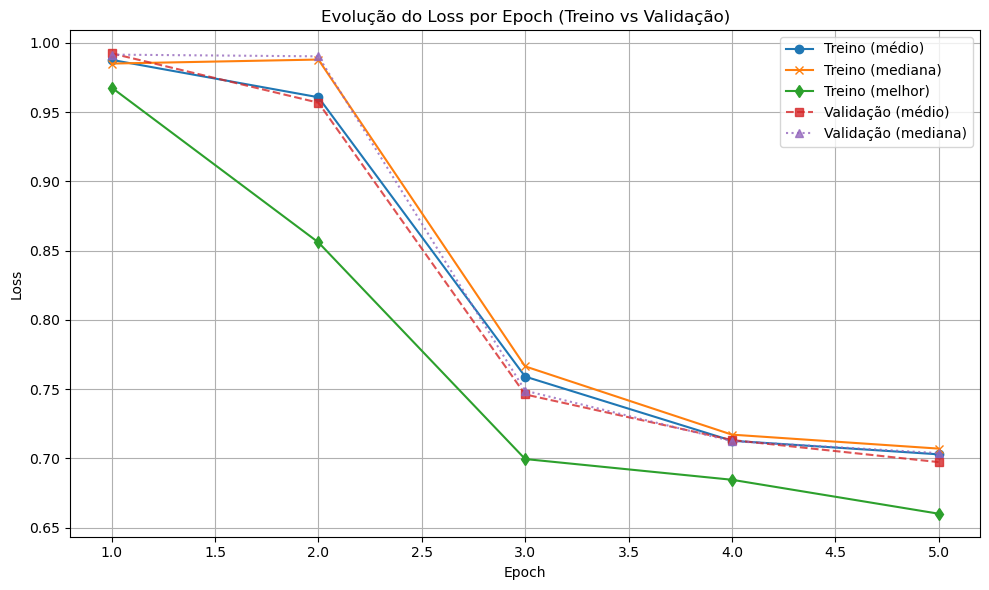

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.5471 | min: 0.0631 | max: 4.3776 | std: 1.2795 | grad: False | numel: 4000 | sum: 6188.3682
[Batch 0] erro hist          → mean: 1.2159 | min: 0.1387 | max: 2.6412 | std: 0.7303 | grad: False | numel: 4000 | sum: 4863.7480
[Batch 0] erro hist**1.5     → mean: 1.5200 | min: 0.0517 | max: 4.2925 | std: 1.2765 | grad: False | numel: 4000 | sum: 6080.1387
[Batch 0] erro dens          → mean: 0.0826 | min: 0.0001 | max: 0.2332 | std: 0.0505 | grad: False | numel: 4000 | sum: 330.4077
[Batch 0] erro dens**1.5     → mean: 0.0271 | min: 0.0000 | max: 0.1126 | std: 0.0236 | grad: False | numel: 4000 | sum: 108.2300
📊 [Batch 0] 3504 grafos únicos | Mais repetido apareceu 12x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.5471
[Batch 0] final_losses       → mean: 1.6349 | min: 0.0680 | max: 4.7014 | std: 1.3192 | grad: False | numel: 4000 | sum: 6539.7905
[Batch 0] erro hist          → mean: 1.2679 | min: 0.1663 | max: 2.

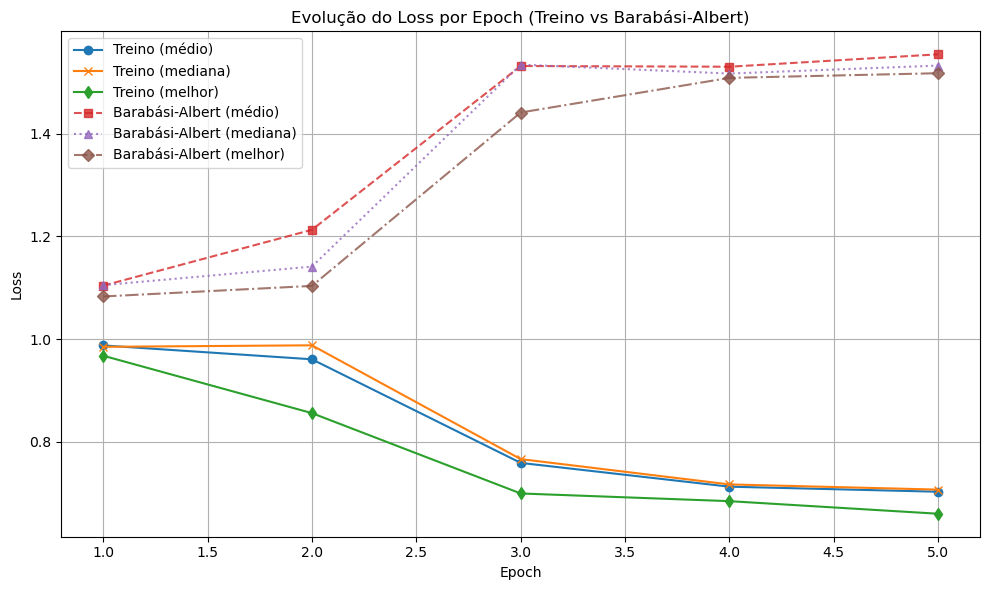

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.7009 | min: 0.0135 | max: 1.9888 | std: 0.5617 | grad: False | numel: 4000 | sum: 2803.7600
[Batch 0] erro hist          → mean: 0.6535 | min: 0.0407 | max: 1.5078 | std: 0.3913 | grad: False | numel: 4000 | sum: 2614.1462
[Batch 0] erro hist**1.5     → mean: 0.5990 | min: 0.0082 | max: 1.8515 | std: 0.4999 | grad: False | numel: 4000 | sum: 2396.0500
[Batch 0] erro dens          → mean: 0.1967 | min: 0.0002 | max: 0.4573 | std: 0.1310 | grad: False | numel: 4000 | sum: 786.7751
[Batch 0] erro dens**1.5     → mean: 0.1019 | min: 0.0000 | max: 0.3092 | std: 0.0911 | grad: False | numel: 4000 | sum: 407.7099
📊 [Batch 0] 3522 grafos únicos | Mais repetido apareceu 12x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.7009
[Batch 0] final_losses       → mean: 0.7263 | min: 0.0114 | max: 2.1602 | std: 0.5961 | grad: False | numel: 4000 | sum: 2905.3975
[Batch 0] erro hist          → mean: 0.6707 | min: 0.0220 | max: 1.

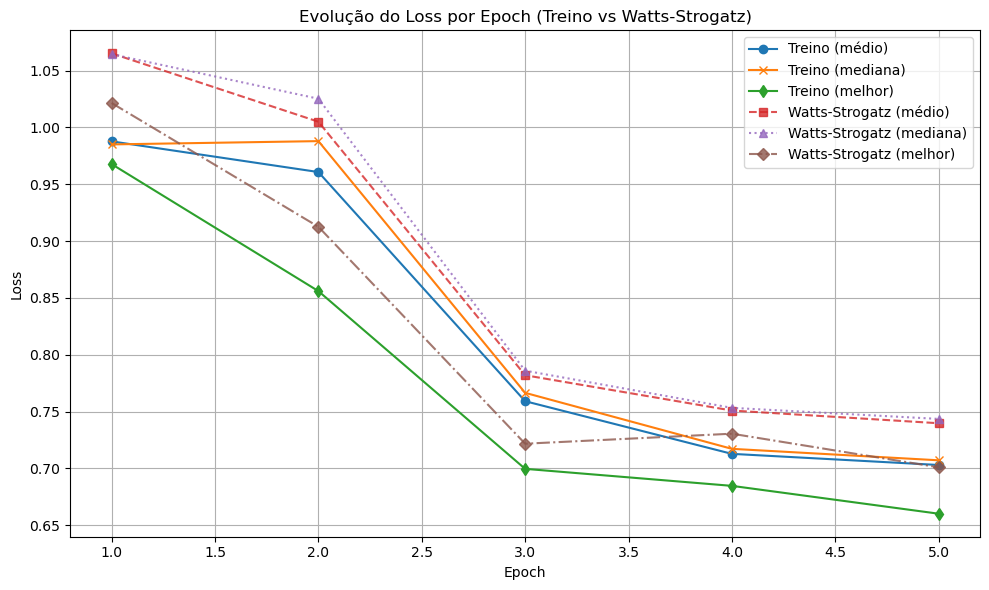

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.8546 | min: 0.1105 | max: 3.1180 | std: 0.5933 | grad: False | numel: 4000 | sum: 3418.4590
[Batch 0] erro hist          → mean: 0.8072 | min: 0.2255 | max: 2.1259 | std: 0.4060 | grad: False | numel: 4000 | sum: 3228.9670
[Batch 0] erro hist**1.5     → mean: 0.7938 | min: 0.1071 | max: 3.0996 | std: 0.5646 | grad: False | numel: 4000 | sum: 3175.1648
[Batch 0] erro dens          → mean: 0.1463 | min: 0.0000 | max: 0.2543 | std: 0.0681 | grad: False | numel: 4000 | sum: 585.3798
[Batch 0] erro dens**1.5     → mean: 0.0608 | min: 0.0000 | max: 0.1282 | std: 0.0371 | grad: False | numel: 4000 | sum: 243.2943
📊 [Batch 0] 3642 grafos únicos | Mais repetido apareceu 3x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.8546
[Batch 0] final_losses       → mean: 0.9559 | min: 0.1010 | max: 3.4196 | std: 0.6870 | grad: False | numel: 4000 | sum: 3823.5122
[Batch 0] erro hist          → mean: 0.8520 | min: 0.2158 | max: 2

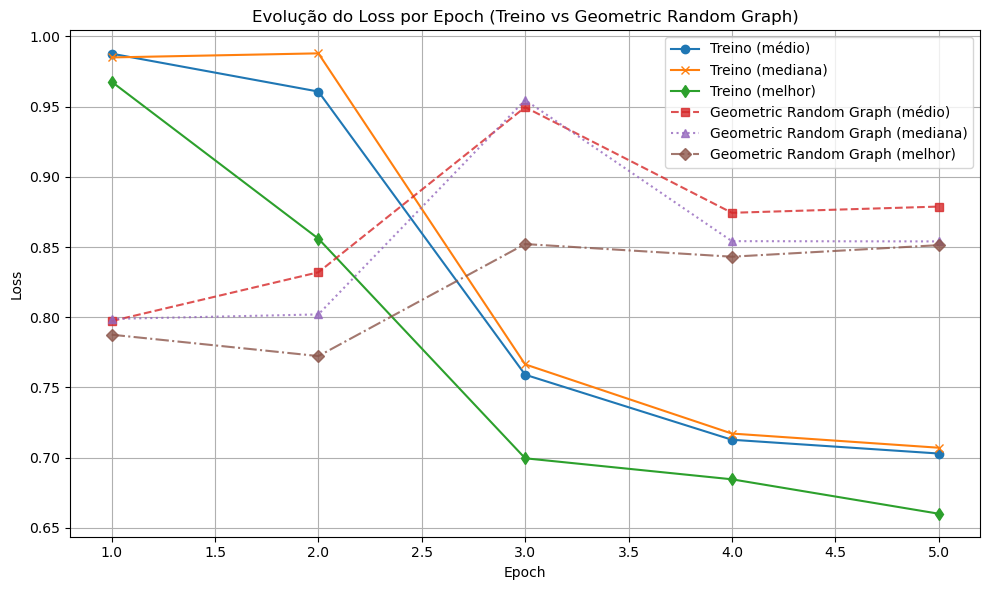

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.0019 | min: 0.0273 | max: 5.2906 | std: 0.6197 | grad: False | numel: 4000 | sum: 4007.7559
[Batch 0] erro hist          → mean: 0.8944 | min: 0.0653 | max: 2.9881 | std: 0.4355 | grad: False | numel: 4000 | sum: 3577.7803
[Batch 0] erro hist**1.5     → mean: 0.9257 | min: 0.0167 | max: 5.1652 | std: 0.5874 | grad: False | numel: 4000 | sum: 3702.6860
[Batch 0] erro dens          → mean: 0.1670 | min: 0.0003 | max: 0.4565 | std: 0.0929 | grad: False | numel: 4000 | sum: 667.8318
[Batch 0] erro dens**1.5     → mean: 0.0763 | min: 0.0000 | max: 0.3084 | std: 0.0600 | grad: False | numel: 4000 | sum: 305.0697
📊 [Batch 0] 3493 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.0019
[Batch 0] final_losses       → mean: 1.1215 | min: 0.0125 | max: 2.2009 | std: 0.6843 | grad: False | numel: 4000 | sum: 4486.0796
[Batch 0] erro hist          → mean: 0.9608 | min: 0.0244 | max: 1.6

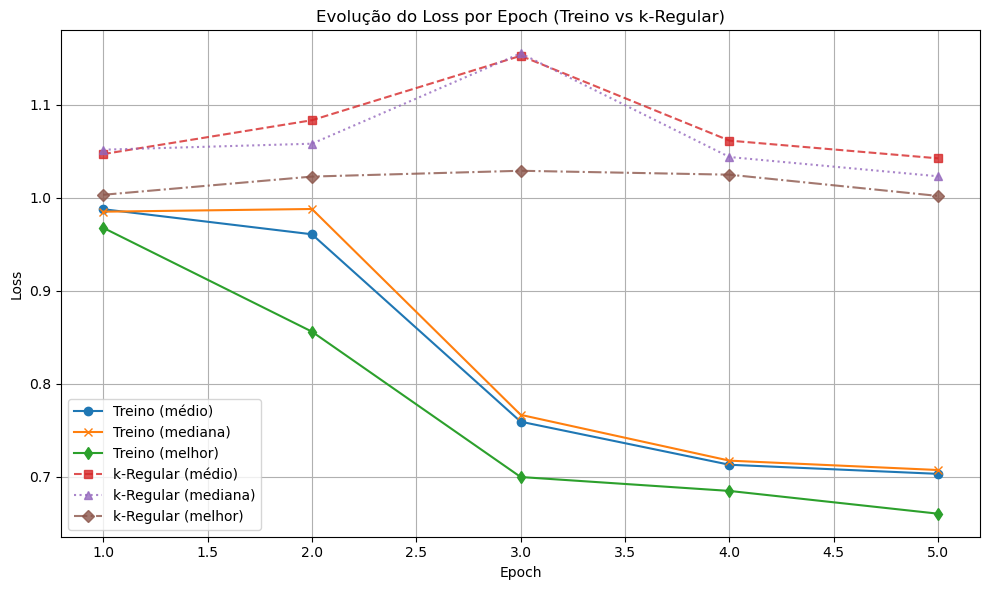

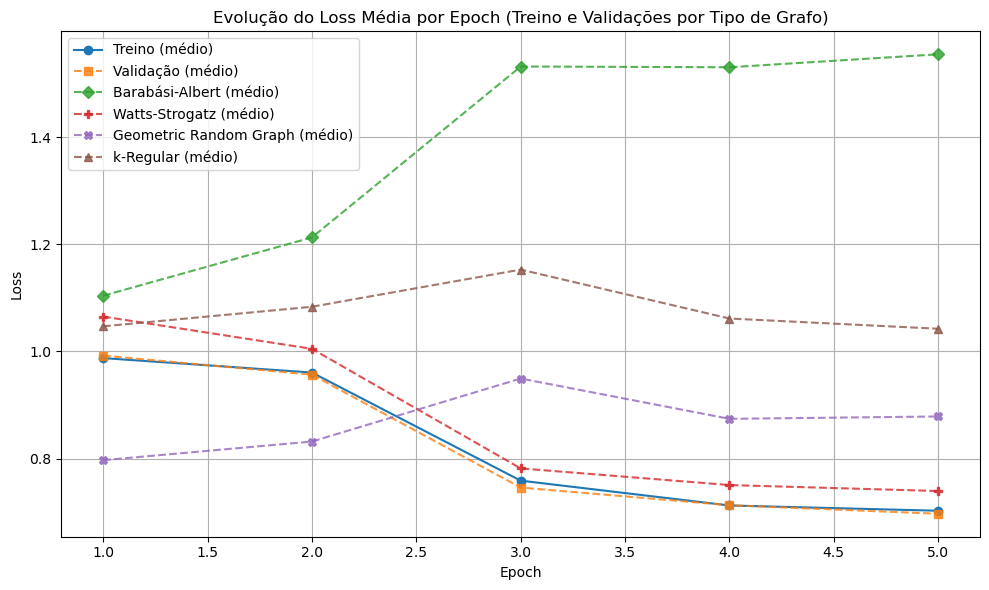

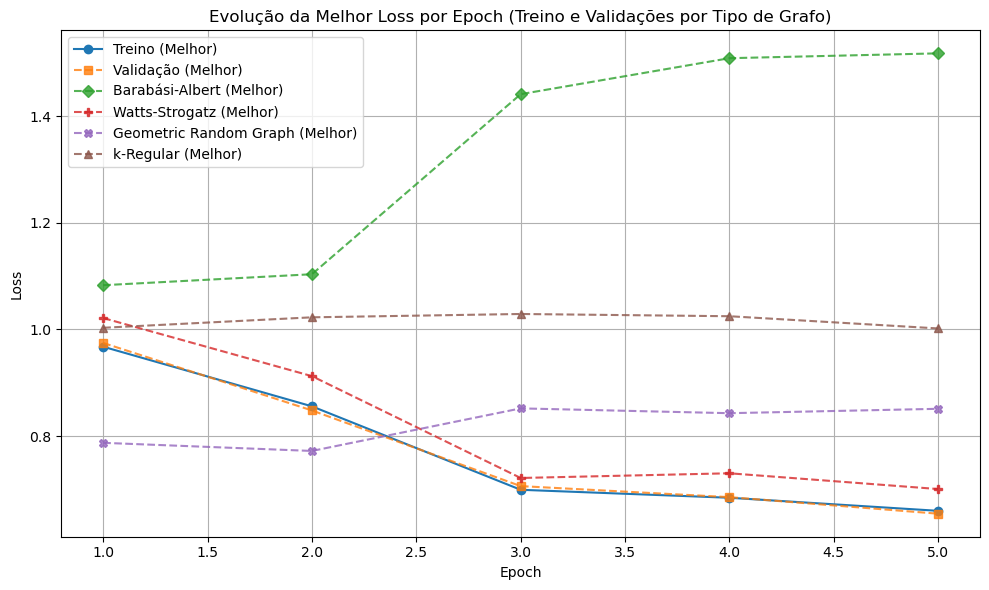

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[10:00:52] Aplicando refinamento com gradiente nos melhores indivíduos...
[10:03:08] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.673493
   🔹 Erro depois: 1.864565
   🔹 Diferença:   -1.191072 | Tempo Total: 135.96s
   🔸 Erros por passo: ['0.673493', '0.654762', '1.864565']
Indivíduo salvo como era ANTES do gradiente
[10:05:23] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.707634
   🔹 Erro depois: 0.748645
   🔹 Diferença:   -0.041011 | Tempo Total: 134.67s
   🔸 Erros por passo: ['0.707634', '0.755005', '0.748645']
Indivíduo salvo como era ANTES do gradiente
[10:07:35] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.736081
   🔹 Erro depois: 18.931107
   🔹 Diferença:   -18.195025 | Tempo Total: 131.75s
 

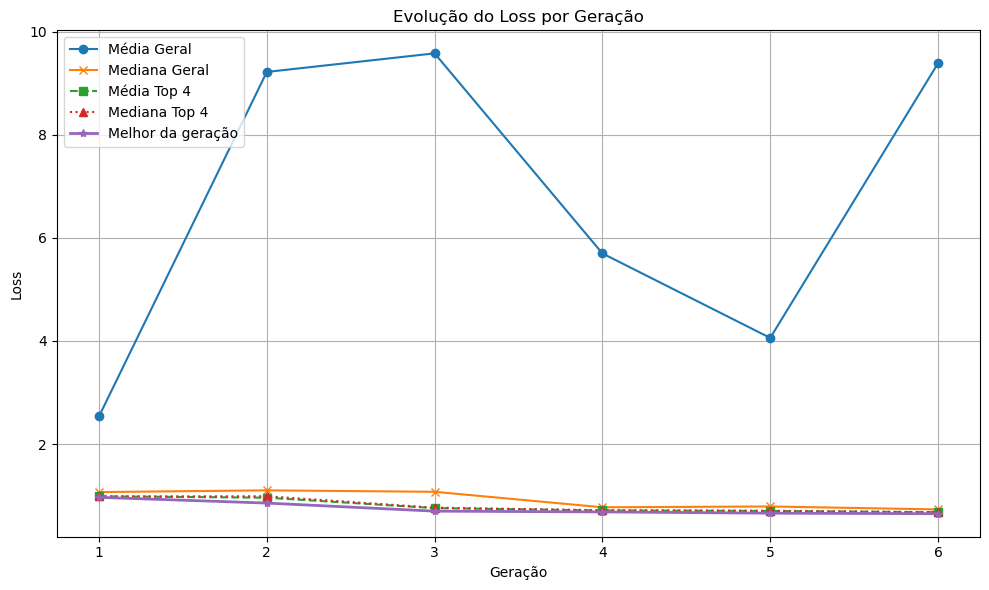

[Epoch 7] Média Geral: 9.3844 | Mediana Geral: 0.7328 | Média Top 4: 0.6799 | Mediana Top 4: 0.6777 | Melhor: 0.6501 | Tempo: 826.68s


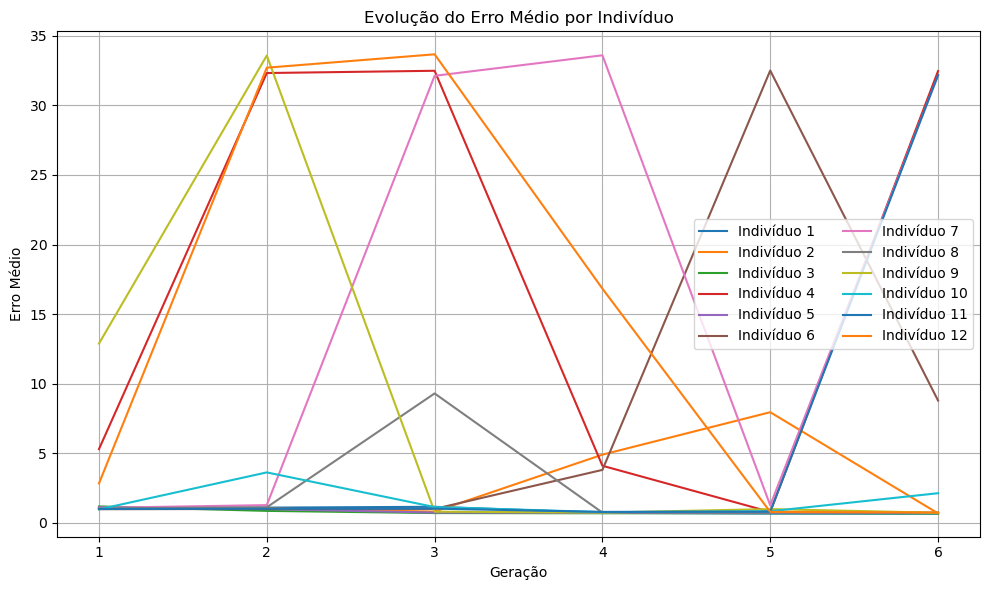

[10:23:33] Média dos top 4: 0.6799 | Mediana: 0.6777
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.6424 | min: 0.0272 | max: 2.2661 | std: 0.4965 | grad: False | numel: 4000 | sum: 2569.4907
[Batch 0] erro hist          → mean: 0.6166 | min: 0.0457 | max: 1.5548 | std: 0.3518 | grad: False | numel: 4000 | sum: 2466.5879
[Batch 0] erro hist**1.5     → mean: 0.5437 | min: 0.0098 | max: 1.9386 | std: 0.4286 | grad: False | numel: 4000 | sum: 2174.7007
[Batch 0] erro dens          → mean: 0.1905 | min: 0.0001 | max: 0.4751 | std: 0.1345 | grad: False | numel: 4000 | sum: 761.9284
[Batch 0] erro dens**1.5     → mean: 0.0987 | min: 0.0000 | max: 0.3275 | std: 0.0935 | grad: False | numel: 4000 | sum: 394.7900
📊 [Batch 0] 3822 grafos únicos | Mais repetido apareceu 18x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.6424
[Batch 0] final_losses       → mean: 0.6889 | min: 0.0195 | max: 2.2254 | std: 0.5236 | grad: False | numel: 4000 | sum: 2755.7231
[Batch 0] erro hi

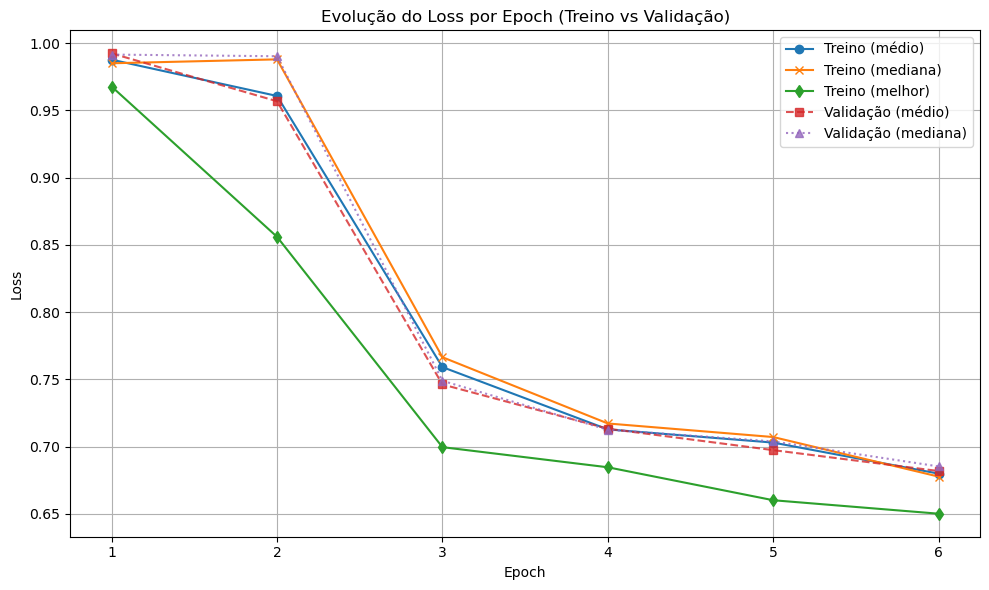

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.5247 | min: 0.0539 | max: 4.3811 | std: 1.2551 | grad: False | numel: 4000 | sum: 6098.6255
[Batch 0] erro hist          → mean: 1.2050 | min: 0.1335 | max: 2.6426 | std: 0.7192 | grad: False | numel: 4000 | sum: 4819.8892
[Batch 0] erro hist**1.5     → mean: 1.4973 | min: 0.0488 | max: 4.2958 | std: 1.2522 | grad: False | numel: 4000 | sum: 5989.0107
[Batch 0] erro dens          → mean: 0.0832 | min: 0.0001 | max: 0.2332 | std: 0.0513 | grad: False | numel: 4000 | sum: 332.8957
[Batch 0] erro dens**1.5     → mean: 0.0274 | min: 0.0000 | max: 0.1126 | std: 0.0243 | grad: False | numel: 4000 | sum: 109.6145
📊 [Batch 0] 3509 grafos únicos | Mais repetido apareceu 9x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.5247
[Batch 0] final_losses       → mean: 1.6258 | min: 0.0808 | max: 4.7014 | std: 1.3050 | grad: False | numel: 4000 | sum: 6503.0566
[Batch 0] erro hist          → mean: 1.2637 | min: 0.1841 | max: 2.7

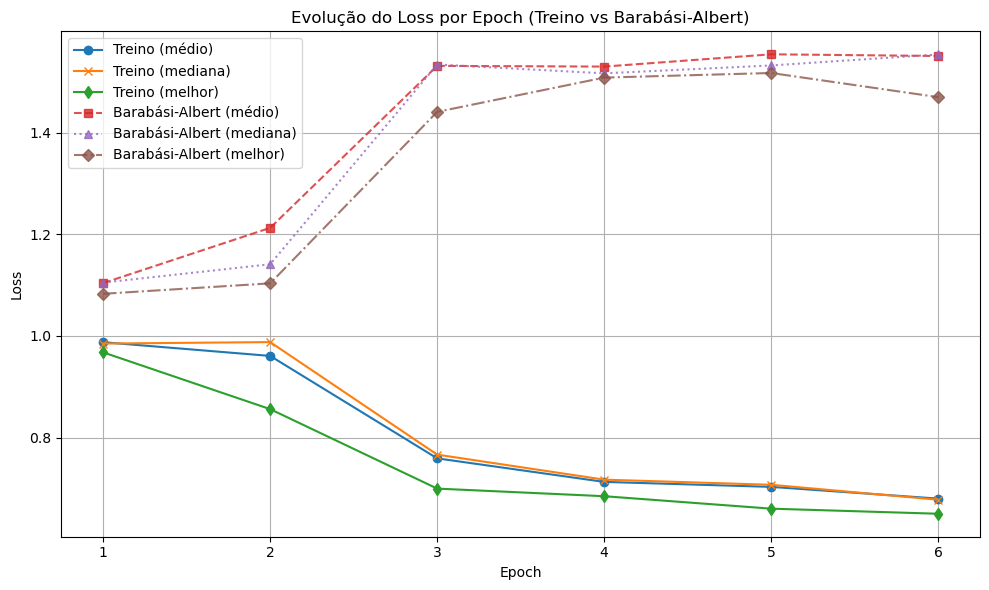

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.6936 | min: 0.0158 | max: 1.9763 | std: 0.5581 | grad: False | numel: 4000 | sum: 2774.5425
[Batch 0] erro hist          → mean: 0.6495 | min: 0.0393 | max: 1.5159 | std: 0.3881 | grad: False | numel: 4000 | sum: 2597.8550
[Batch 0] erro hist**1.5     → mean: 0.5930 | min: 0.0078 | max: 1.8664 | std: 0.4951 | grad: False | numel: 4000 | sum: 2372.1294
[Batch 0] erro dens          → mean: 0.1943 | min: 0.0000 | max: 0.4569 | std: 0.1317 | grad: False | numel: 4000 | sum: 777.3968
[Batch 0] erro dens**1.5     → mean: 0.1006 | min: 0.0000 | max: 0.3088 | std: 0.0915 | grad: False | numel: 4000 | sum: 402.4134
📊 [Batch 0] 3558 grafos únicos | Mais repetido apareceu 10x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.6936
[Batch 0] final_losses       → mean: 0.7206 | min: 0.0114 | max: 2.1474 | std: 0.5976 | grad: False | numel: 4000 | sum: 2882.5601
[Batch 0] erro hist          → mean: 0.6669 | min: 0.0220 | max: 1.

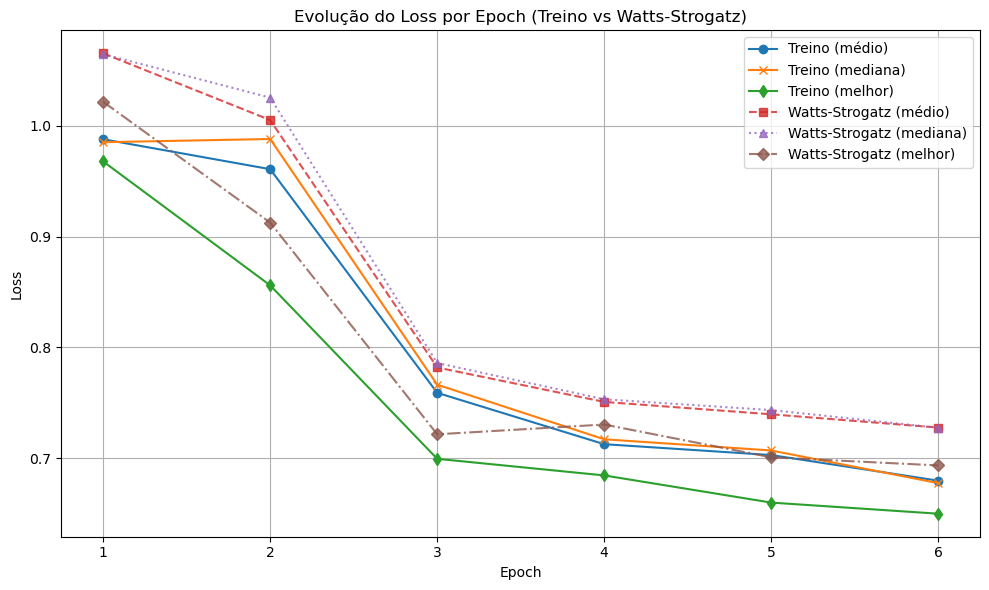

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.8368 | min: 0.1301 | max: 3.0020 | std: 0.5931 | grad: False | numel: 4000 | sum: 3347.0842
[Batch 0] erro hist          → mean: 0.7938 | min: 0.2563 | max: 2.0705 | std: 0.4064 | grad: False | numel: 4000 | sum: 3175.0269
[Batch 0] erro hist**1.5     → mean: 0.7761 | min: 0.1298 | max: 2.9794 | std: 0.5639 | grad: False | numel: 4000 | sum: 3104.4409
[Batch 0] erro dens          → mean: 0.1460 | min: 0.0002 | max: 0.2536 | std: 0.0684 | grad: False | numel: 4000 | sum: 583.8785
[Batch 0] erro dens**1.5     → mean: 0.0607 | min: 0.0000 | max: 0.1277 | std: 0.0371 | grad: False | numel: 4000 | sum: 242.6435
📊 [Batch 0] 3627 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.8368
[Batch 0] final_losses       → mean: 0.9580 | min: 0.1268 | max: 3.3048 | std: 0.6842 | grad: False | numel: 4000 | sum: 3831.8584
[Batch 0] erro hist          → mean: 0.8536 | min: 0.2441 | max: 2

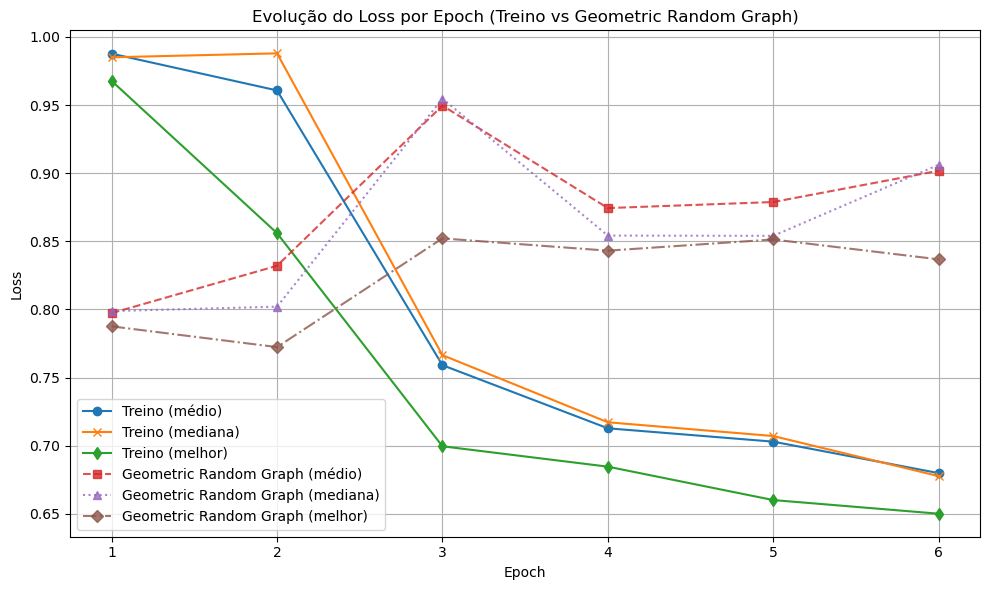

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 1.0038 | min: 0.0288 | max: 2.0316 | std: 0.6182 | grad: False | numel: 4000 | sum: 4015.2607
[Batch 0] erro hist          → mean: 0.8957 | min: 0.0503 | max: 1.5441 | std: 0.4342 | grad: False | numel: 4000 | sum: 3582.6917
[Batch 0] erro hist**1.5     → mean: 0.9267 | min: 0.0113 | max: 1.9188 | std: 0.5866 | grad: False | numel: 4000 | sum: 3706.9949
[Batch 0] erro dens          → mean: 0.1682 | min: 0.0002 | max: 0.4567 | std: 0.0931 | grad: False | numel: 4000 | sum: 672.9732
[Batch 0] erro dens**1.5     → mean: 0.0771 | min: 0.0000 | max: 0.3086 | std: 0.0599 | grad: False | numel: 4000 | sum: 308.2658
📊 [Batch 0] 3474 grafos únicos | Mais repetido apareceu 4x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 1.0038
[Batch 0] final_losses       → mean: 1.1604 | min: 0.0148 | max: 2.2210 | std: 0.6810 | grad: False | numel: 4000 | sum: 4641.6494
[Batch 0] erro hist          → mean: 0.9864 | min: 0.0190 | max: 1.6

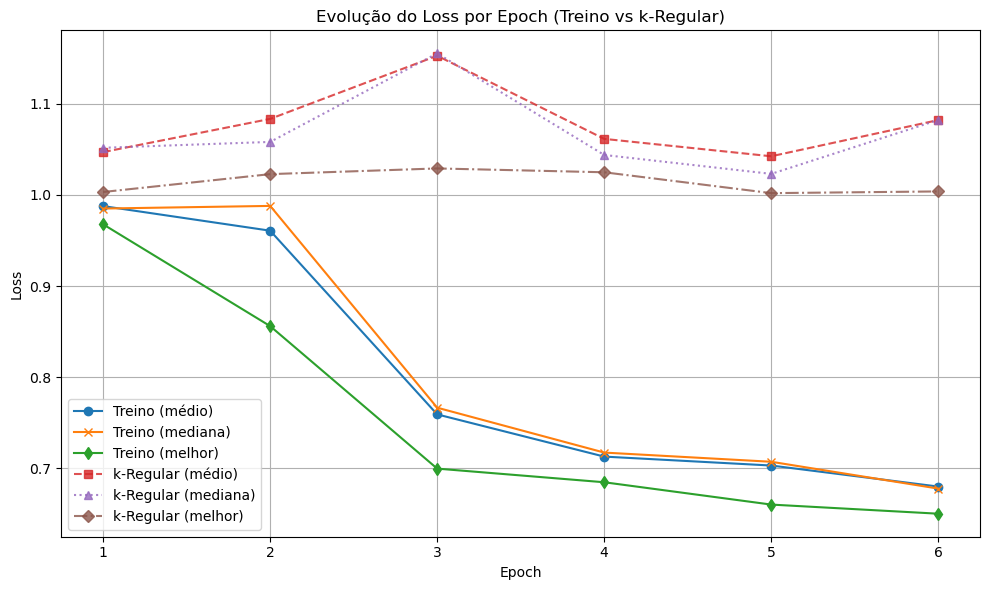

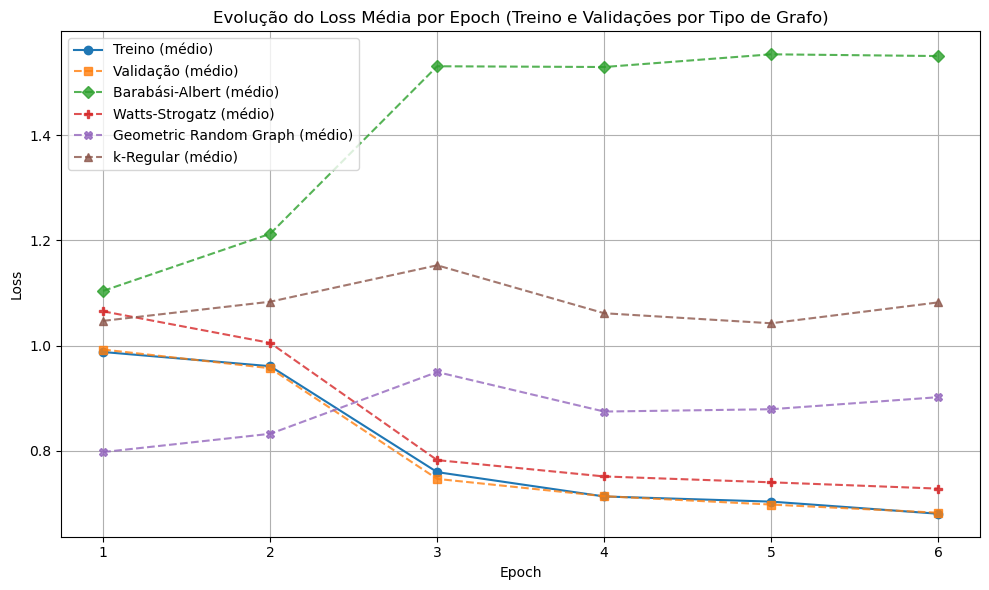

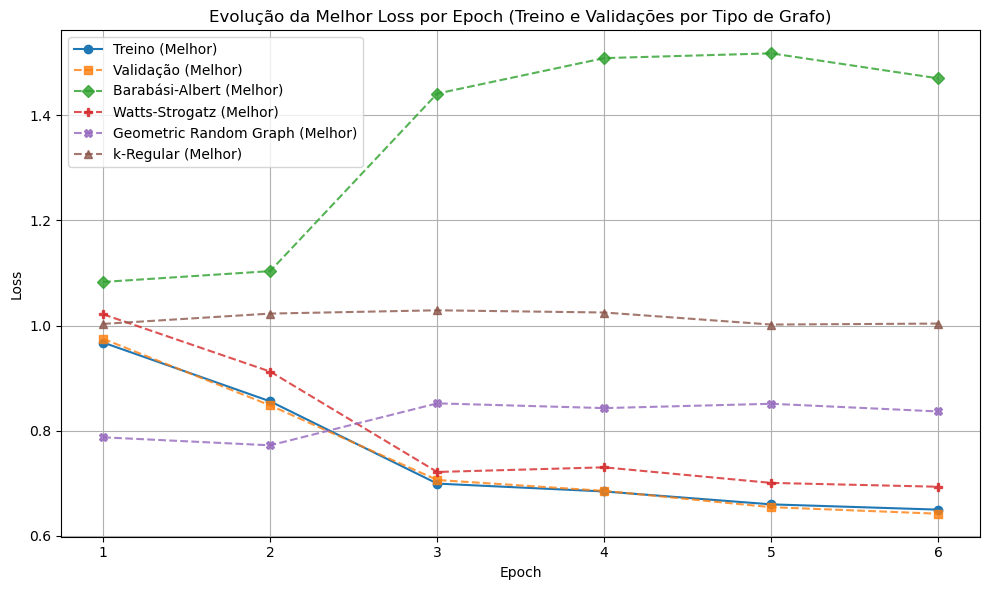

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[10:34:14] Aplicando refinamento com gradiente nos melhores indivíduos...
[10:36:25] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.636628
   🔹 Erro depois: 0.603766
   🔹 Diferença:   +0.032862 | Tempo Total: 130.61s
   🔸 Erros por passo: ['0.636628', '0.655698', '0.603766']
[10:38:37] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.663092
   🔹 Erro depois: 0.656875
   🔹 Diferença:   +0.006217 | Tempo Total: 131.51s
   🔸 Erros por passo: ['0.663092', '0.688496', '0.656875']
[10:40:48] Indivíduo 2 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.663410
   🔹 Erro depois: 0.706434
   🔹 Diferença:   -0.043025 | Tempo Total: 130.70s
   🔸 Erros por passo: ['0.663410', '0.829185', '0.706434']
Indivíduo salvo como era ANTES d

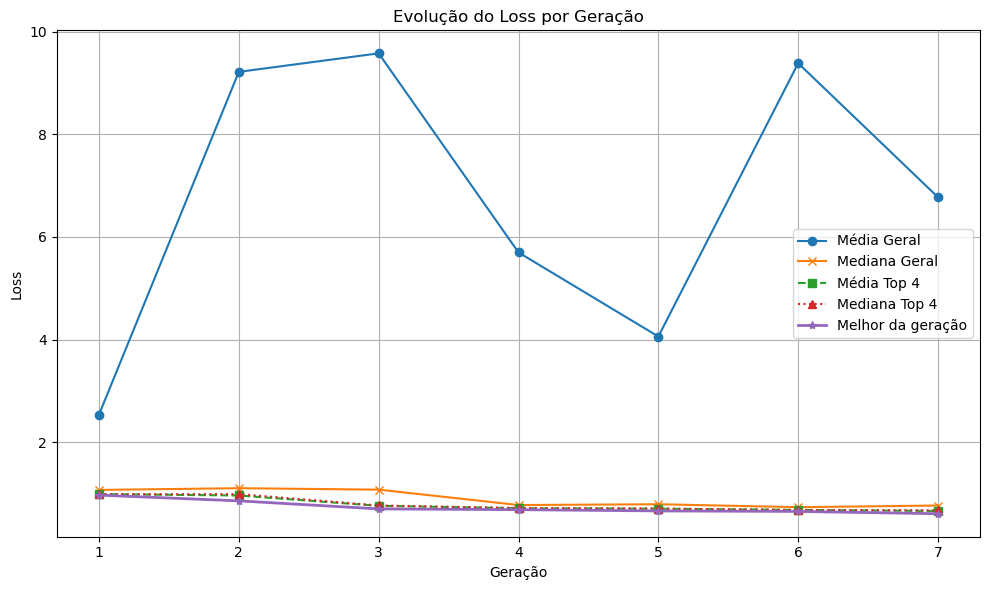

[Epoch 8] Média Geral: 6.7716 | Mediana Geral: 0.7654 | Média Top 4: 0.6588 | Mediana Top 4: 0.6718 | Melhor: 0.6059 | Tempo: 819.94s


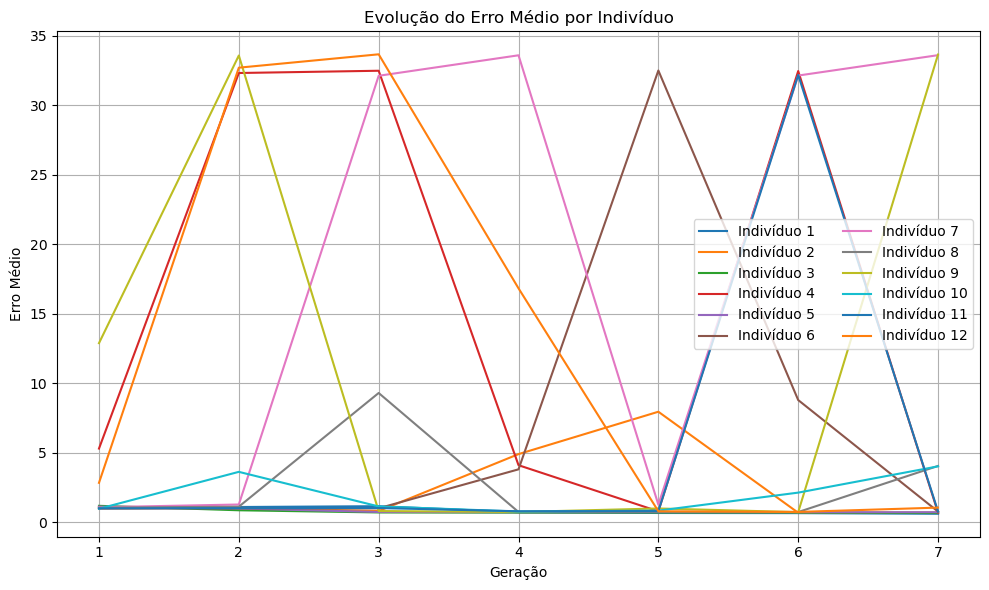

[10:56:38] Média dos top 4: 0.6588 | Mediana: 0.6718
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.6127 | min: 0.0192 | max: 2.1737 | std: 0.4861 | grad: False | numel: 4000 | sum: 2450.8027
[Batch 0] erro hist          → mean: 0.5960 | min: 0.0511 | max: 1.5167 | std: 0.3529 | grad: False | numel: 4000 | sum: 2383.8184
[Batch 0] erro hist**1.5     → mean: 0.5209 | min: 0.0115 | max: 1.8679 | std: 0.4238 | grad: False | numel: 4000 | sum: 2083.5728
[Batch 0] erro dens          → mean: 0.1814 | min: 0.0001 | max: 0.4540 | std: 0.1285 | grad: False | numel: 4000 | sum: 725.6444
[Batch 0] erro dens**1.5     → mean: 0.0918 | min: 0.0000 | max: 0.3059 | std: 0.0874 | grad: False | numel: 4000 | sum: 367.2299
📊 [Batch 0] 3735 grafos únicos | Mais repetido apareceu 19x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.6127
[Batch 0] final_losses       → mean: 0.6631 | min: 0.0121 | max: 2.2024 | std: 0.5169 | grad: False | numel: 4000 | sum: 2652.2998
[Batch 0] erro hi

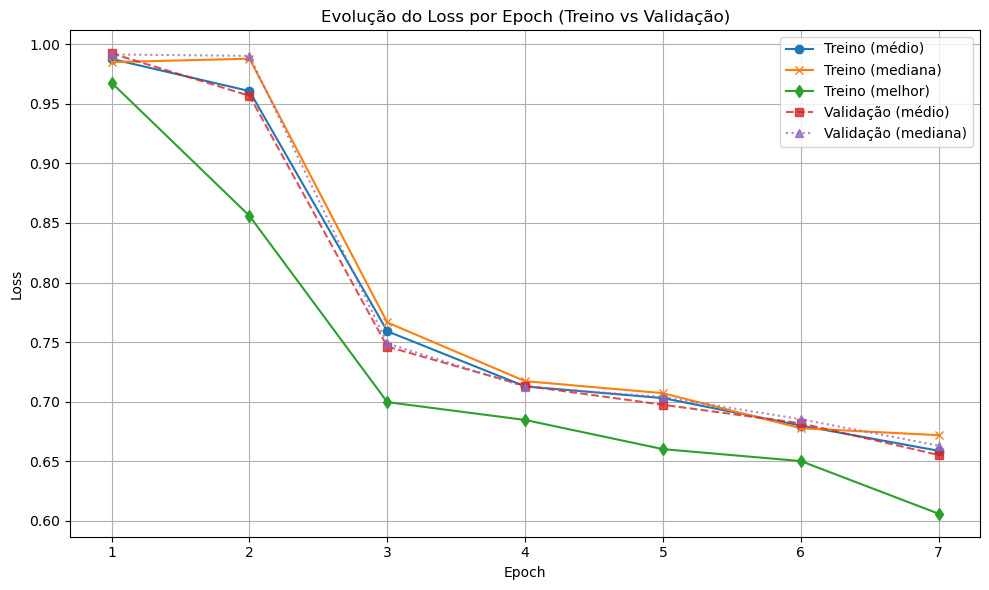

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.5196 | min: 0.0451 | max: 4.6075 | std: 1.2481 | grad: False | numel: 4000 | sum: 6078.5615
[Batch 0] erro hist          → mean: 1.2033 | min: 0.1099 | max: 2.7250 | std: 0.7197 | grad: False | numel: 4000 | sum: 4813.0225
[Batch 0] erro hist**1.5     → mean: 1.4956 | min: 0.0364 | max: 4.4983 | std: 1.2440 | grad: False | numel: 4000 | sum: 5982.4795
[Batch 0] erro dens          → mean: 0.0752 | min: 0.0001 | max: 0.2300 | std: 0.0508 | grad: False | numel: 4000 | sum: 300.7897
[Batch 0] erro dens**1.5     → mean: 0.0240 | min: 0.0000 | max: 0.1103 | std: 0.0238 | grad: False | numel: 4000 | sum: 96.0826
📊 [Batch 0] 3459 grafos únicos | Mais repetido apareceu 35x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.5196
[Batch 0] final_losses       → mean: 1.6579 | min: 0.1016 | max: 4.7244 | std: 1.3116 | grad: False | numel: 4000 | sum: 6631.4834
[Batch 0] erro hist          → mean: 1.2838 | min: 0.2156 | max: 2.7

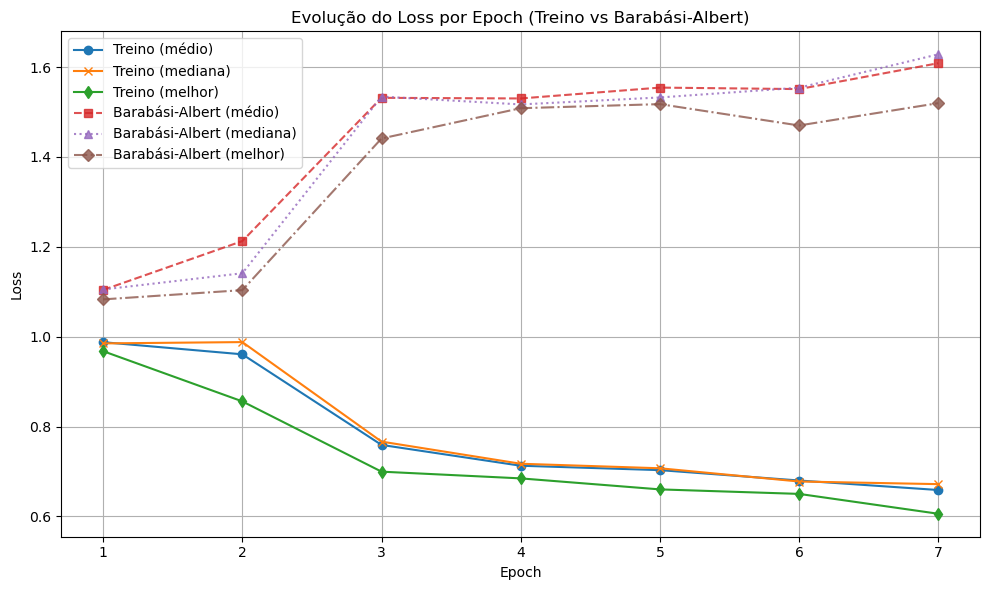

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.6498 | min: 0.0113 | max: 1.9702 | std: 0.5503 | grad: False | numel: 4000 | sum: 2599.2046
[Batch 0] erro hist          → mean: 0.6172 | min: 0.0306 | max: 1.5135 | std: 0.3942 | grad: False | numel: 4000 | sum: 2468.6902
[Batch 0] erro hist**1.5     → mean: 0.5584 | min: 0.0054 | max: 1.8619 | std: 0.4947 | grad: False | numel: 4000 | sum: 2233.5078
[Batch 0] erro dens          → mean: 0.1825 | min: 0.0016 | max: 0.4354 | std: 0.1236 | grad: False | numel: 4000 | sum: 729.9006
[Batch 0] erro dens**1.5     → mean: 0.0914 | min: 0.0001 | max: 0.2873 | std: 0.0837 | grad: False | numel: 4000 | sum: 365.6968
📊 [Batch 0] 3385 grafos únicos | Mais repetido apareceu 34x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.6498
[Batch 0] final_losses       → mean: 0.7042 | min: 0.0111 | max: 2.1348 | std: 0.5857 | grad: False | numel: 4000 | sum: 2816.9619
[Batch 0] erro hist          → mean: 0.6560 | min: 0.0284 | max: 1.

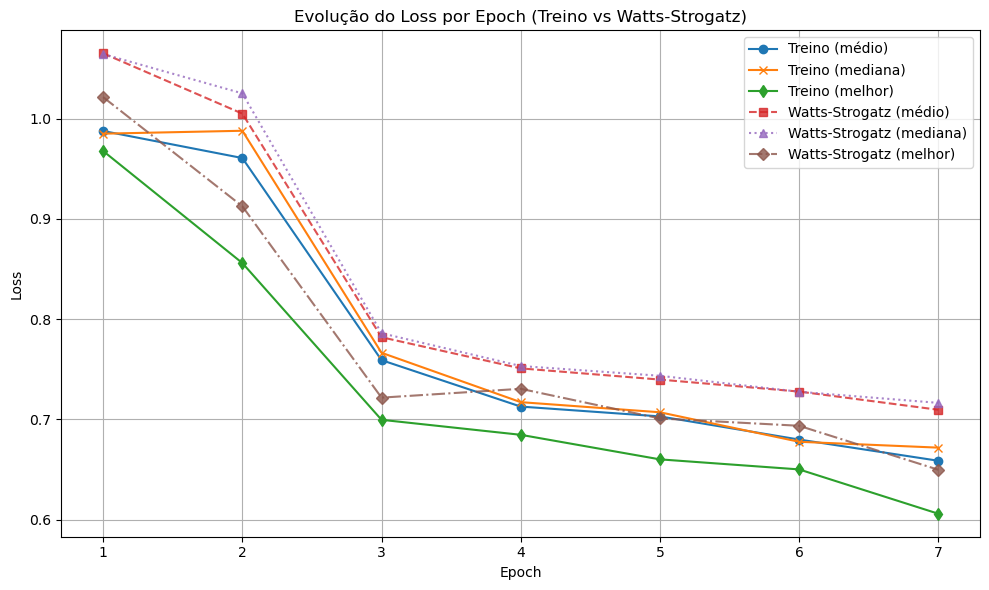

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.8546 | min: 0.1200 | max: 3.0531 | std: 0.5947 | grad: False | numel: 4000 | sum: 3418.2031
[Batch 0] erro hist          → mean: 0.8074 | min: 0.2425 | max: 2.0960 | std: 0.4062 | grad: False | numel: 4000 | sum: 3229.7244
[Batch 0] erro hist**1.5     → mean: 0.7940 | min: 0.1194 | max: 3.0345 | std: 0.5663 | grad: False | numel: 4000 | sum: 3175.9163
[Batch 0] erro dens          → mean: 0.1464 | min: 0.0008 | max: 0.2543 | std: 0.0663 | grad: False | numel: 4000 | sum: 585.6746
[Batch 0] erro dens**1.5     → mean: 0.0606 | min: 0.0000 | max: 0.1282 | std: 0.0363 | grad: False | numel: 4000 | sum: 242.2869
📊 [Batch 0] 3400 grafos únicos | Mais repetido apareceu 20x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.8546
[Batch 0] final_losses       → mean: 0.9422 | min: 0.1262 | max: 3.3697 | std: 0.6700 | grad: False | numel: 4000 | sum: 3768.9976
[Batch 0] erro hist          → mean: 0.8460 | min: 0.2394 | max: 

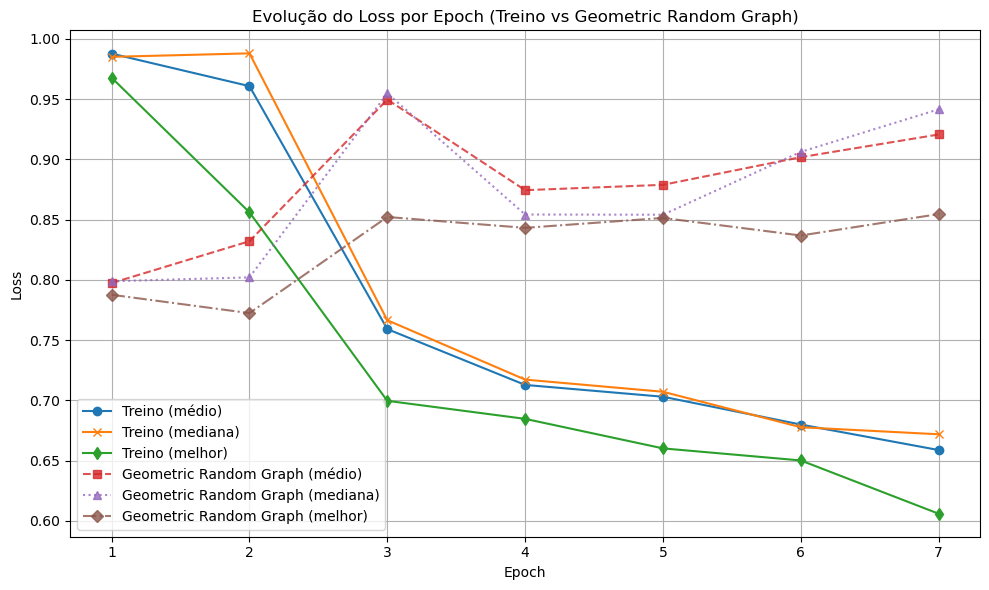

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.9843 | min: 0.0175 | max: 2.0311 | std: 0.6255 | grad: False | numel: 4000 | sum: 3937.3364
[Batch 0] erro hist          → mean: 0.8816 | min: 0.0405 | max: 1.5465 | std: 0.4441 | grad: False | numel: 4000 | sum: 3526.2537
[Batch 0] erro hist**1.5     → mean: 0.9114 | min: 0.0081 | max: 1.9231 | std: 0.5943 | grad: False | numel: 4000 | sum: 3645.4553
[Batch 0] erro dens          → mean: 0.1625 | min: 0.0000 | max: 0.4356 | std: 0.0886 | grad: False | numel: 4000 | sum: 649.8457
[Batch 0] erro dens**1.5     → mean: 0.0730 | min: 0.0000 | max: 0.2875 | std: 0.0554 | grad: False | numel: 4000 | sum: 291.8810
📊 [Batch 0] 3333 grafos únicos | Mais repetido apareceu 21x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.9843
[Batch 0] final_losses       → mean: 1.1018 | min: 0.0160 | max: 2.1831 | std: 0.6765 | grad: False | numel: 4000 | sum: 4407.2915
[Batch 0] erro hist          → mean: 0.9502 | min: 0.0270 | max: 1.

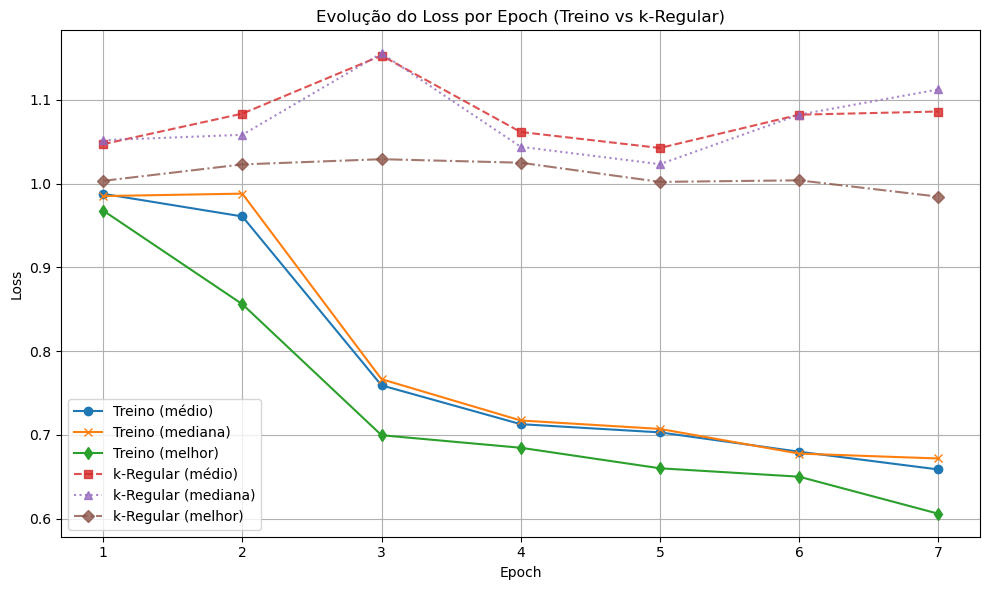

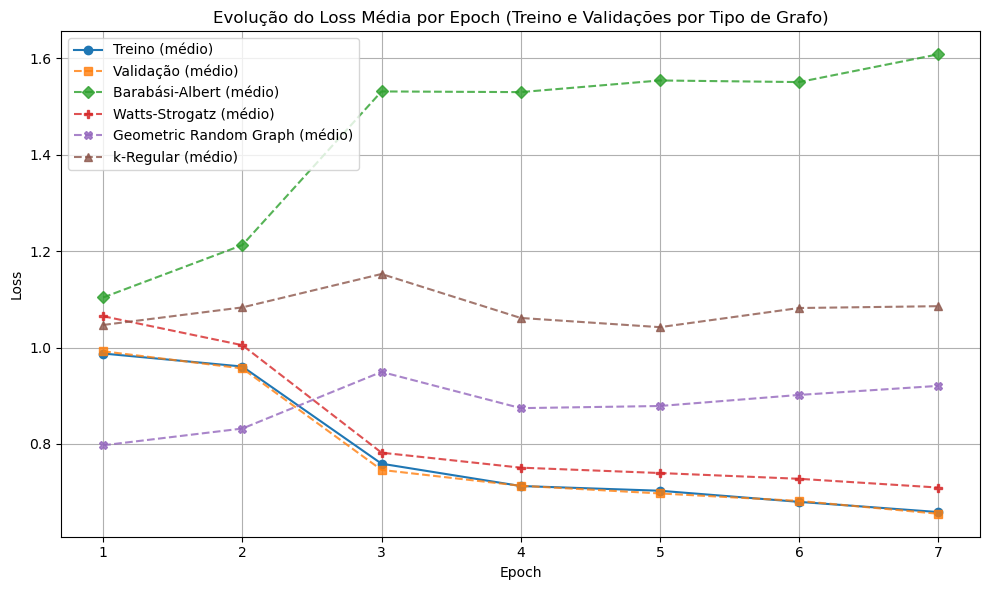

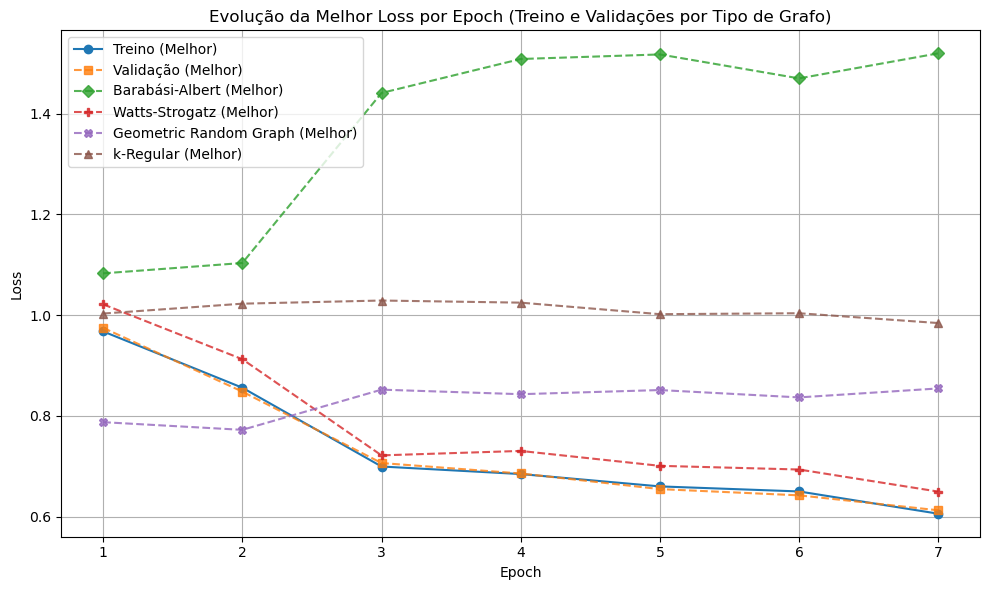

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[11:07:12] Aplicando refinamento com gradiente nos melhores indivíduos...
[11:09:21] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.600500
   🔹 Erro depois: 2.913534
   🔹 Diferença:   -2.313035 | Tempo Total: 129.34s
   🔸 Erros por passo: ['0.600500', '0.770591', '2.913534']
Indivíduo salvo como era ANTES do gradiente
[11:11:31] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     1e-3
   🔹 Erro antes:  0.652851
   🔹 Erro depois: 0.764490
   🔹 Diferença:   -0.111639 | Tempo Total: 129.42s
   🔸 Erros por passo: ['0.652851', '0.755125', '0.764490']
Indivíduo salvo como era ANTES do gradiente
[11:13:41] Indivíduo 4 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.678152
   🔹 Erro depois: 0.687405
   🔹 Diferença:   -0.009253 | Tempo Total: 130.50s
   

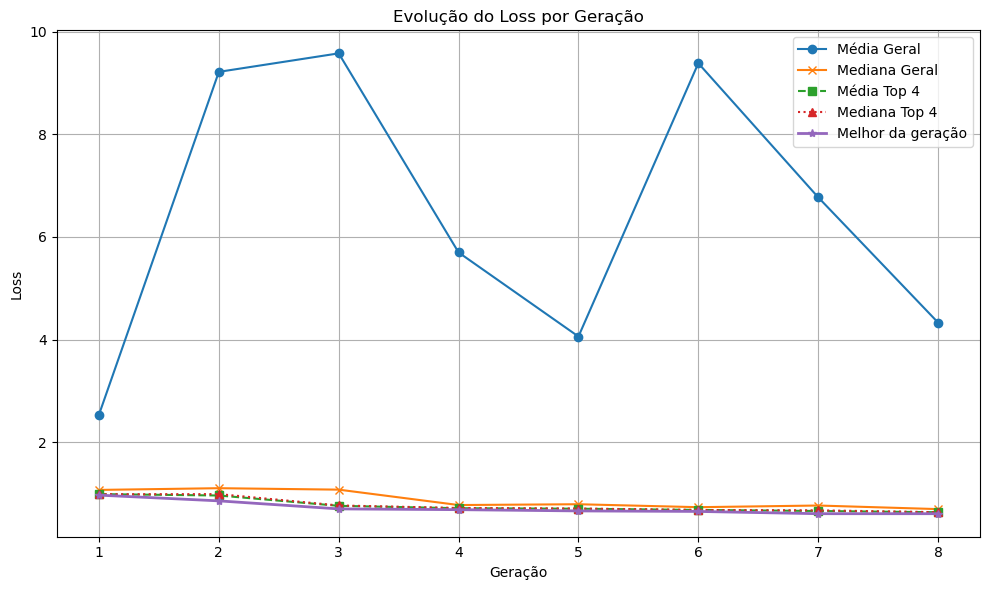

[Epoch 9] Média Geral: 4.3310 | Mediana Geral: 0.6955 | Média Top 4: 0.6347 | Mediana Top 4: 0.6352 | Melhor: 0.6060 | Tempo: 848.03s


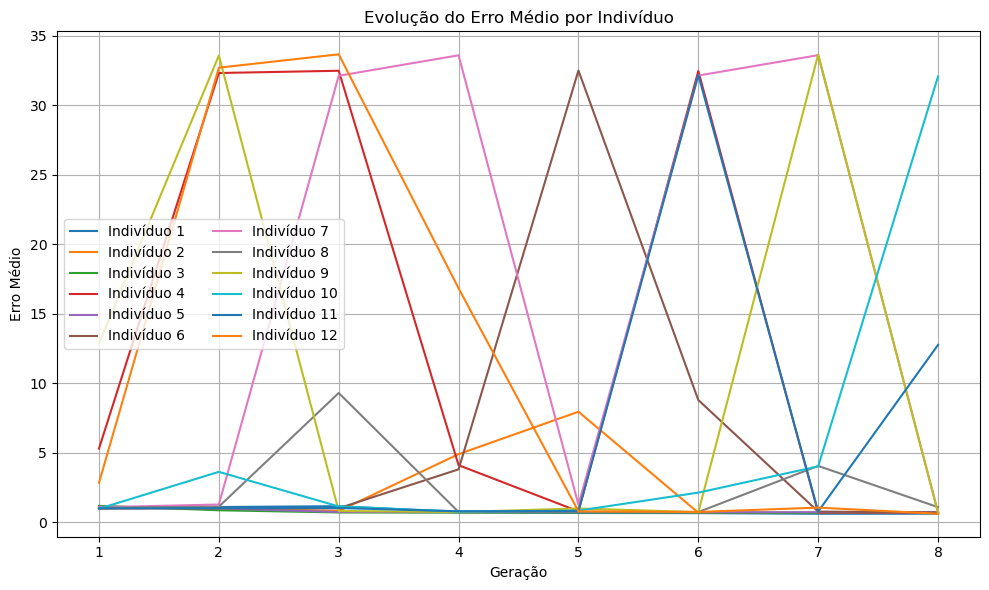

[11:30:02] Média dos top 4: 0.6347 | Mediana: 0.6352
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5993 | min: 0.0150 | max: 2.1758 | std: 0.4840 | grad: False | numel: 4000 | sum: 2397.1558
[Batch 0] erro hist          → mean: 0.5839 | min: 0.0258 | max: 1.5170 | std: 0.3543 | grad: False | numel: 4000 | sum: 2335.5667
[Batch 0] erro hist**1.5     → mean: 0.5082 | min: 0.0042 | max: 1.8685 | std: 0.4210 | grad: False | numel: 4000 | sum: 2032.6720
[Batch 0] erro dens          → mean: 0.1803 | min: 0.0005 | max: 0.4554 | std: 0.1285 | grad: False | numel: 4000 | sum: 721.0528
[Batch 0] erro dens**1.5     → mean: 0.0911 | min: 0.0000 | max: 0.3073 | std: 0.0872 | grad: False | numel: 4000 | sum: 364.4839
📊 [Batch 0] 3819 grafos únicos | Mais repetido apareceu 7x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5993
[Batch 0] final_losses       → mean: 0.6066 | min: 0.0218 | max: 2.1737 | std: 0.4851 | grad: False | numel: 4000 | sum: 2426.4888
[Batch 0] erro his

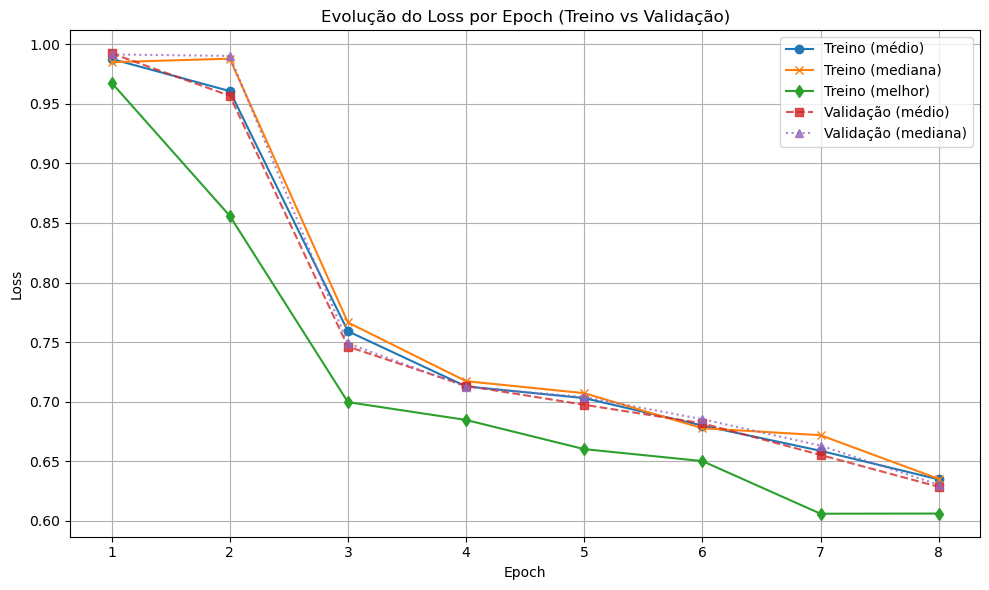

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4876 | min: 0.0498 | max: 4.4275 | std: 1.2655 | grad: False | numel: 4000 | sum: 5950.5864
[Batch 0] erro hist          → mean: 1.1763 | min: 0.1247 | max: 2.6616 | std: 0.7381 | grad: False | numel: 4000 | sum: 4705.1982
[Batch 0] erro hist**1.5     → mean: 1.4632 | min: 0.0441 | max: 4.3423 | std: 1.2618 | grad: False | numel: 4000 | sum: 5852.7222
[Batch 0] erro dens          → mean: 0.0766 | min: 0.0001 | max: 0.2291 | std: 0.0496 | grad: False | numel: 4000 | sum: 306.5314
[Batch 0] erro dens**1.5     → mean: 0.0245 | min: 0.0000 | max: 0.1097 | std: 0.0231 | grad: False | numel: 4000 | sum: 97.8641
📊 [Batch 0] 3441 grafos únicos | Mais repetido apareceu 32x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4876
[Batch 0] final_losses       → mean: 1.5247 | min: 0.0641 | max: 4.6075 | std: 1.2523 | grad: False | numel: 4000 | sum: 6098.8940
[Batch 0] erro hist          → mean: 1.2062 | min: 0.1522 | max: 2.7

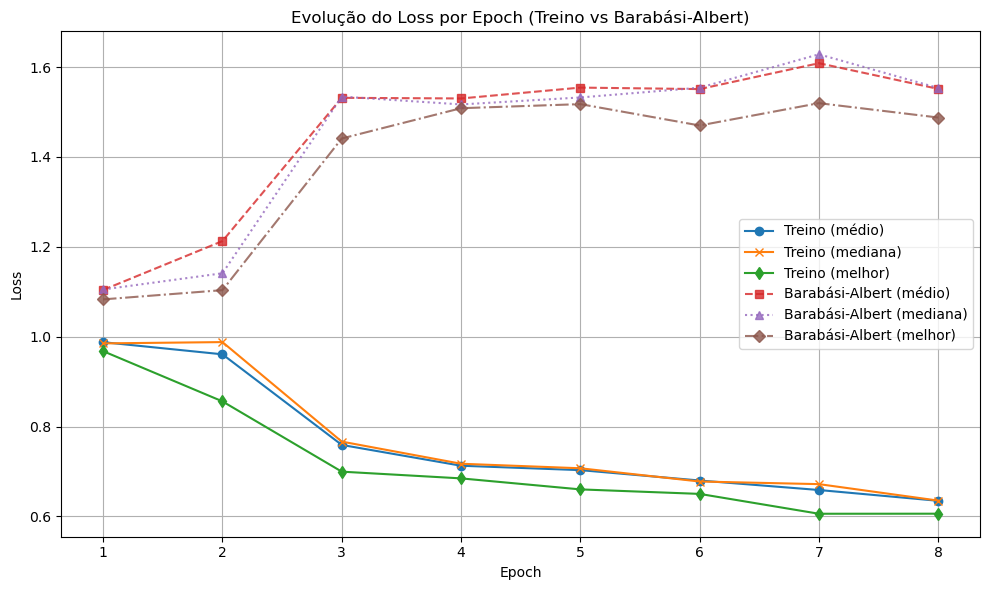

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.6549 | min: 0.0101 | max: 1.9714 | std: 0.5516 | grad: False | numel: 4000 | sum: 2619.6729
[Batch 0] erro hist          → mean: 0.6202 | min: 0.0258 | max: 1.5144 | std: 0.3936 | grad: False | numel: 4000 | sum: 2480.7793
[Batch 0] erro hist**1.5     → mean: 0.5617 | min: 0.0041 | max: 1.8636 | std: 0.4935 | grad: False | numel: 4000 | sum: 2246.7664
[Batch 0] erro dens          → mean: 0.1848 | min: 0.0000 | max: 0.4369 | std: 0.1253 | grad: False | numel: 4000 | sum: 739.0342
[Batch 0] erro dens**1.5     → mean: 0.0932 | min: 0.0000 | max: 0.2888 | std: 0.0852 | grad: False | numel: 4000 | sum: 372.9064
📊 [Batch 0] 3471 grafos únicos | Mais repetido apareceu 11x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.6549
[Batch 0] final_losses       → mean: 0.6645 | min: 0.0145 | max: 1.9745 | std: 0.5534 | grad: False | numel: 4000 | sum: 2658.0876
[Batch 0] erro hist          → mean: 0.6281 | min: 0.0393 | max: 1.

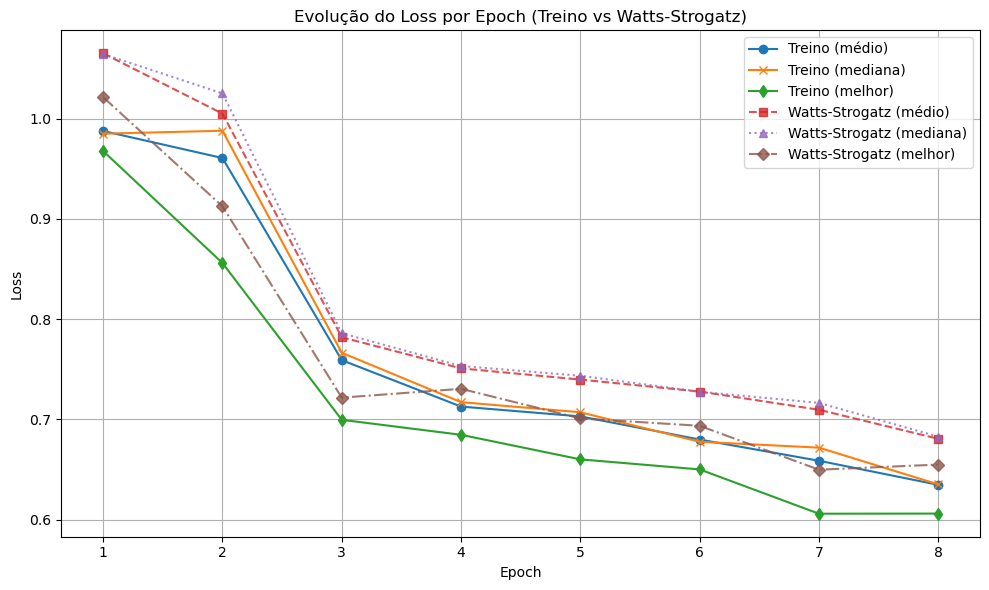

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.8518 | min: 0.1212 | max: 3.0131 | std: 0.5981 | grad: False | numel: 4000 | sum: 3407.2305
[Batch 0] erro hist          → mean: 0.8067 | min: 0.2448 | max: 2.0712 | std: 0.4063 | grad: False | numel: 4000 | sum: 3226.9104
[Batch 0] erro hist**1.5     → mean: 0.7927 | min: 0.1211 | max: 2.9808 | std: 0.5706 | grad: False | numel: 4000 | sum: 3170.8286
[Batch 0] erro dens          → mean: 0.1436 | min: 0.0001 | max: 0.2518 | std: 0.0669 | grad: False | numel: 4000 | sum: 574.3503
[Batch 0] erro dens**1.5     → mean: 0.0591 | min: 0.0000 | max: 0.1263 | std: 0.0364 | grad: False | numel: 4000 | sum: 236.4019
📊 [Batch 0] 3292 grafos únicos | Mais repetido apareceu 24x | Excesso = 0 | Penalização = 0.0
[GRG] Indivíduo 0: Erro médio = 0.8518
[Batch 0] final_losses       → mean: 0.8425 | min: 0.1240 | max: 3.1889 | std: 0.6006 | grad: False | numel: 4000 | sum: 3369.9795
[Batch 0] erro hist          → mean: 0.7982 | min: 0.2437 | max: 

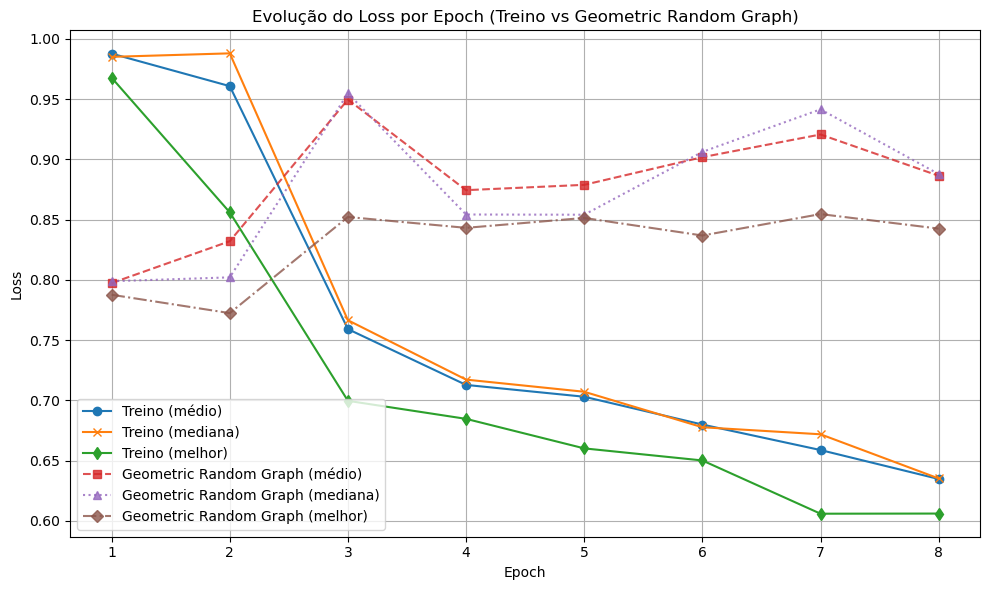

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.9881 | min: 0.0164 | max: 2.1758 | std: 0.6252 | grad: False | numel: 4000 | sum: 3952.4421
[Batch 0] erro hist          → mean: 0.8841 | min: 0.0377 | max: 1.5389 | std: 0.4456 | grad: False | numel: 4000 | sum: 3536.2495
[Batch 0] erro hist**1.5     → mean: 0.9156 | min: 0.0073 | max: 1.9091 | std: 0.5939 | grad: False | numel: 4000 | sum: 3662.5718
[Batch 0] erro dens          → mean: 0.1617 | min: 0.0002 | max: 0.4554 | std: 0.0884 | grad: False | numel: 4000 | sum: 646.7087
[Batch 0] erro dens**1.5     → mean: 0.0725 | min: 0.0000 | max: 0.3073 | std: 0.0553 | grad: False | numel: 4000 | sum: 289.8702
📊 [Batch 0] 3221 grafos únicos | Mais repetido apareceu 14x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.9881
[Batch 0] final_losses       → mean: 0.9850 | min: 0.0198 | max: 2.0146 | std: 0.6210 | grad: False | numel: 4000 | sum: 3939.9136
[Batch 0] erro hist          → mean: 0.8834 | min: 0.0431 | max: 1.

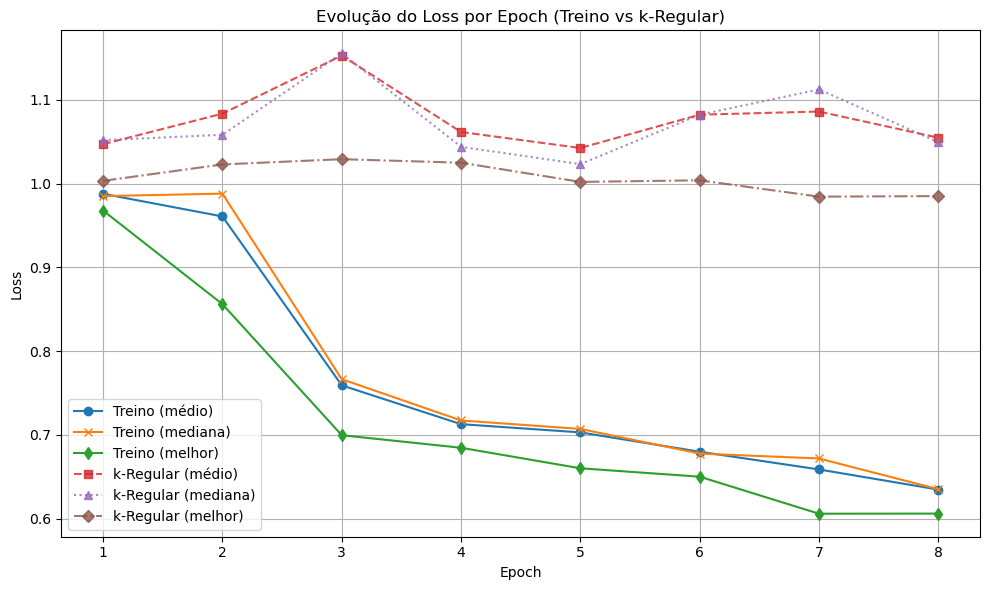

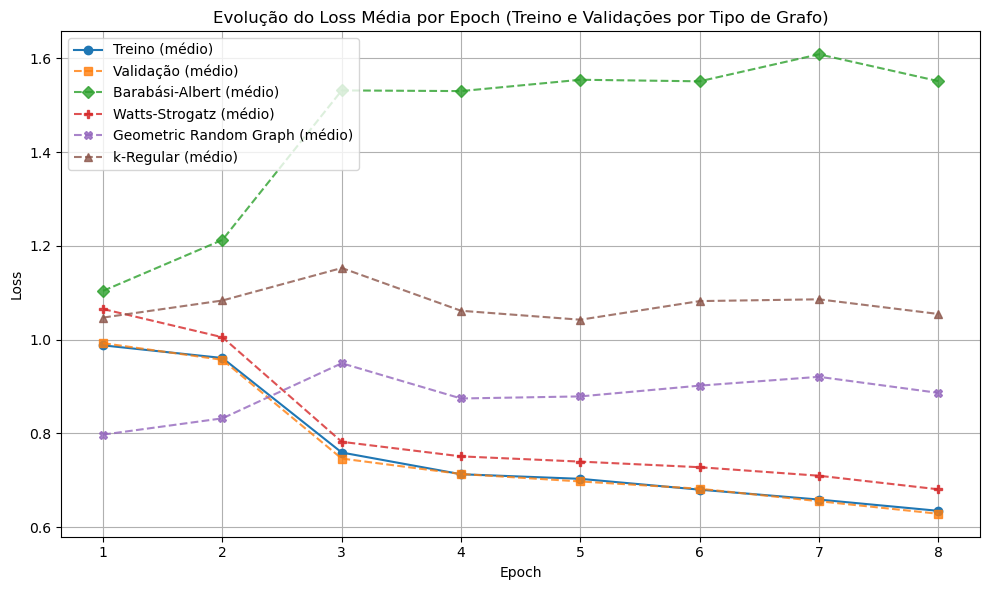

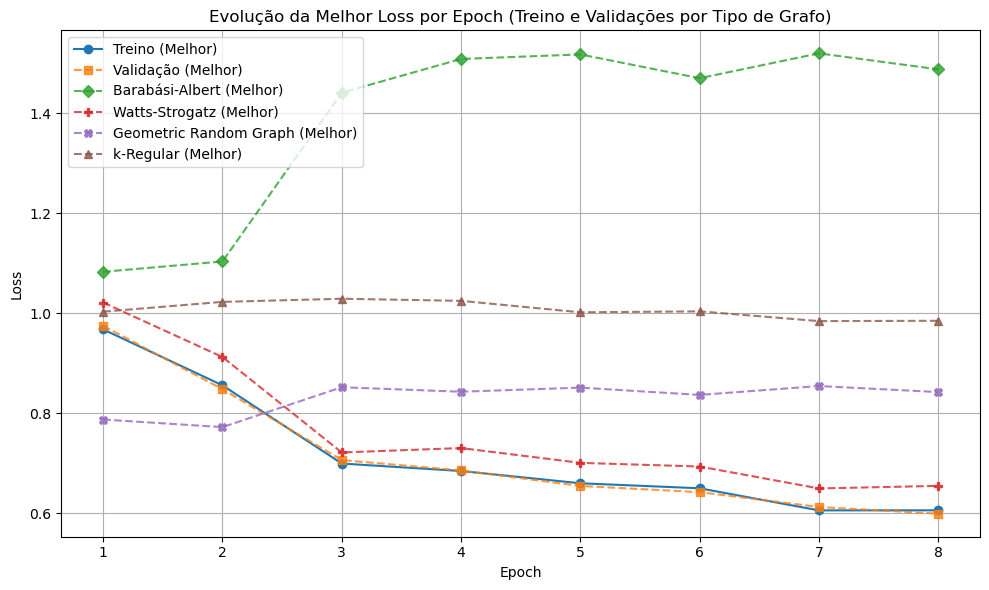

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[11:40:24] Aplicando refinamento com gradiente nos melhores indivíduos...
[11:42:35] Indivíduo 12 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.606819
   🔹 Erro depois: 0.547803
   🔹 Diferença:   +0.059016 | Tempo Total: 130.28s
   🔸 Erros por passo: ['0.606819', '0.560129', '0.547803']
[11:44:45] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.609400
   🔹 Erro depois: 3.745378
   🔹 Diferença:   -3.135977 | Tempo Total: 130.15s
   🔸 Erros por passo: ['0.609400', '0.787390', '3.745378']
Indivíduo salvo como era ANTES do gradiente
[11:47:02] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.661547
   🔹 Erro depois: 0.665889
   🔹 Diferença:   -0.004343 | Tempo Total: 136.64s
   🔸 Erros por passo: ['0.661547', '0.699699',

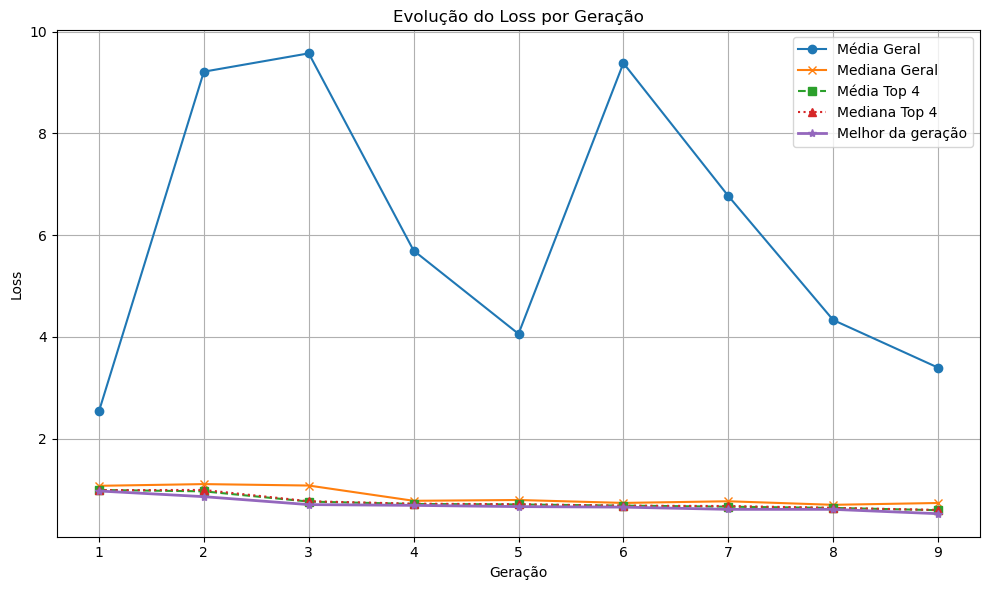

[Epoch 10] Média Geral: 3.3940 | Mediana Geral: 0.7315 | Média Top 4: 0.5899 | Mediana Top 4: 0.5951 | Melhor: 0.5207 | Tempo: 887.56s


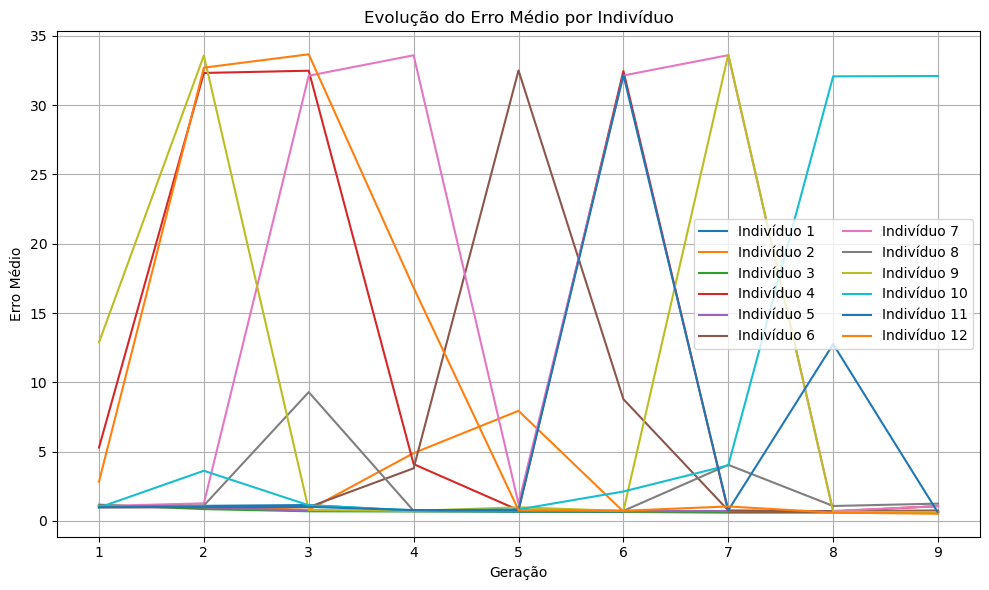

[12:04:19] Média dos top 4: 0.5899 | Mediana: 0.5951
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5258 | min: 0.0127 | max: 2.0656 | std: 0.4664 | grad: False | numel: 4000 | sum: 2103.2244
[Batch 0] erro hist          → mean: 0.5236 | min: 0.0172 | max: 1.4648 | std: 0.3506 | grad: False | numel: 4000 | sum: 2094.4663
[Batch 0] erro hist**1.5     → mean: 0.4423 | min: 0.0023 | max: 1.7728 | std: 0.4037 | grad: False | numel: 4000 | sum: 1769.1523
[Batch 0] erro dens          → mean: 0.1682 | min: 0.0001 | max: 0.4409 | std: 0.1268 | grad: False | numel: 4000 | sum: 672.7402
[Batch 0] erro dens**1.5     → mean: 0.0835 | min: 0.0000 | max: 0.2928 | std: 0.0846 | grad: False | numel: 4000 | sum: 334.0720
📊 [Batch 0] 3310 grafos únicos | Mais repetido apareceu 35x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5258
[Batch 0] final_losses       → mean: 0.5981 | min: 0.0188 | max: 2.1758 | std: 0.4905 | grad: False | numel: 4000 | sum: 2392.3655
[Batch 0] erro hi

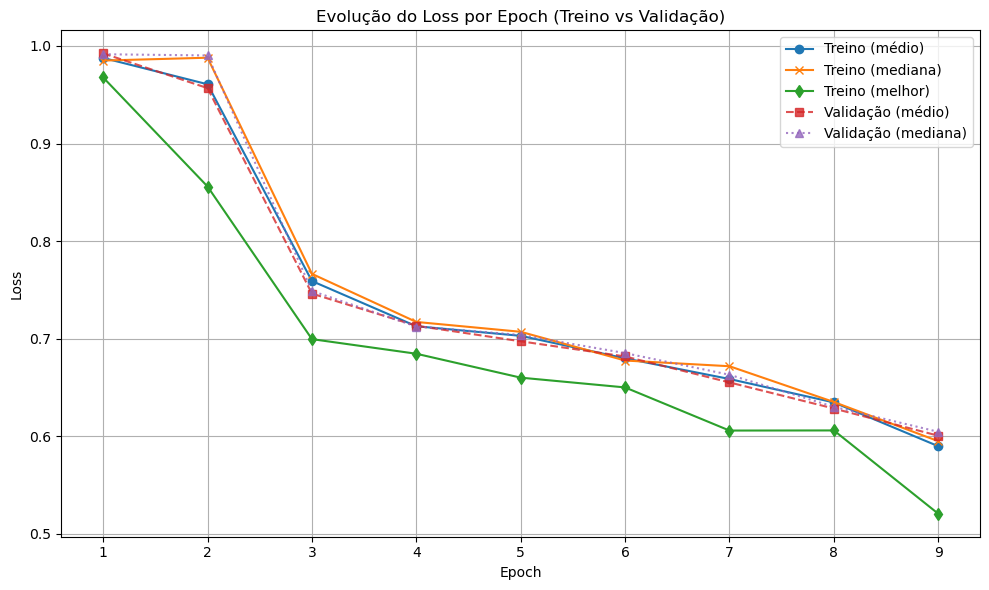

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.3756 | min: 0.0120 | max: 4.2098 | std: 1.1928 | grad: False | numel: 4000 | sum: 5502.5781
[Batch 0] erro hist          → mean: 1.1093 | min: 0.0294 | max: 2.5768 | std: 0.7212 | grad: False | numel: 4000 | sum: 4437.2812
[Batch 0] erro hist**1.5     → mean: 1.3540 | min: 0.0051 | max: 4.1364 | std: 1.1915 | grad: False | numel: 4000 | sum: 5416.0312
[Batch 0] erro dens          → mean: 0.0708 | min: 0.0000 | max: 0.2136 | std: 0.0452 | grad: False | numel: 4000 | sum: 283.1048
[Batch 0] erro dens**1.5     → mean: 0.0216 | min: 0.0000 | max: 0.0987 | std: 0.0203 | grad: False | numel: 4000 | sum: 86.5464
📊 [Batch 0] 3245 grafos únicos | Mais repetido apareceu 77x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.3756
[Batch 0] final_losses       → mean: 1.4610 | min: 0.0441 | max: 4.5947 | std: 1.2588 | grad: False | numel: 4000 | sum: 5844.1675
[Batch 0] erro hist          → mean: 1.1606 | min: 0.1033 | max: 2.7

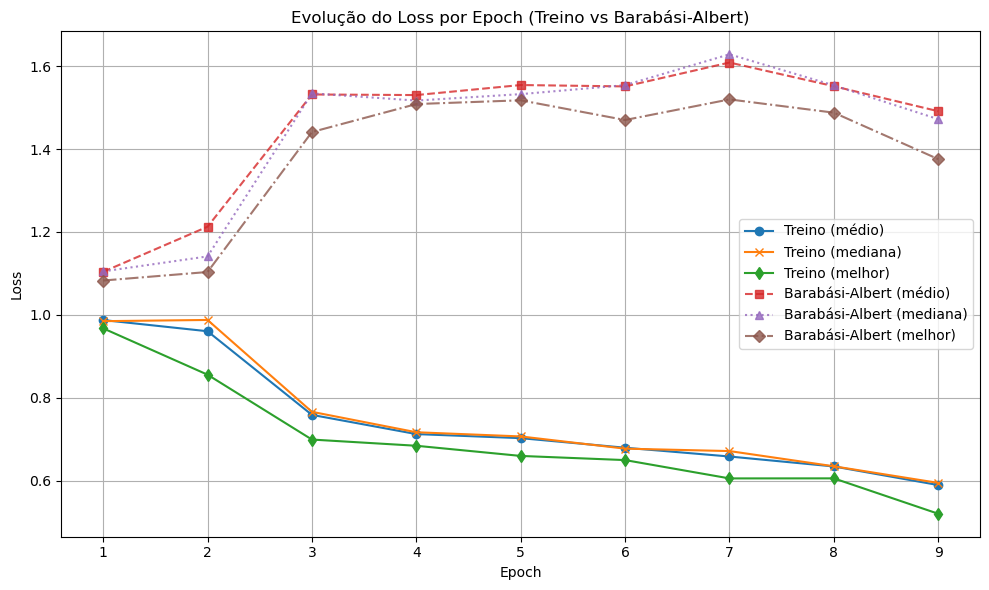

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5860 | min: 0.0116 | max: 1.9191 | std: 0.5161 | grad: False | numel: 4000 | sum: 2343.8672
[Batch 0] erro hist          → mean: 0.5717 | min: 0.0124 | max: 1.4918 | std: 0.3803 | grad: False | numel: 4000 | sum: 2286.8406
[Batch 0] erro hist**1.5     → mean: 0.5029 | min: 0.0014 | max: 1.8220 | std: 0.4662 | grad: False | numel: 4000 | sum: 2011.5396
[Batch 0] erro dens          → mean: 0.1703 | min: 0.0007 | max: 0.4225 | std: 0.1188 | grad: False | numel: 4000 | sum: 681.3478
[Batch 0] erro dens**1.5     → mean: 0.0831 | min: 0.0000 | max: 0.2746 | std: 0.0788 | grad: False | numel: 4000 | sum: 332.3277
📊 [Batch 0] 2840 grafos únicos | Mais repetido apareceu 75x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5860
[Batch 0] final_losses       → mean: 0.6722 | min: 0.0117 | max: 1.9505 | std: 0.5549 | grad: False | numel: 4000 | sum: 2688.6782
[Batch 0] erro hist          → mean: 0.6332 | min: 0.0251 | max: 1.

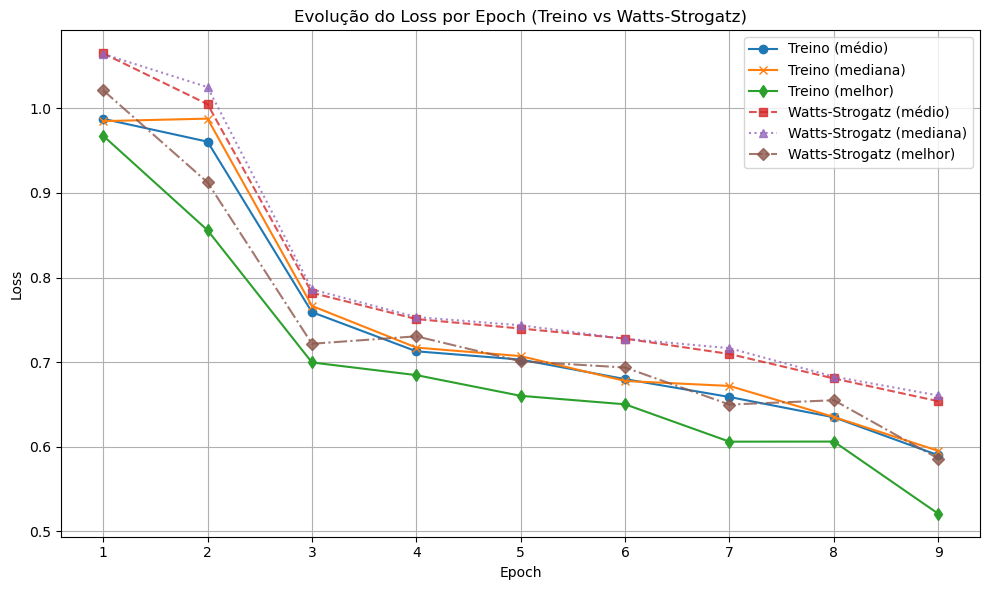

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.8205 | min: 0.1394 | max: 2.9152 | std: 0.5338 | grad: False | numel: 4000 | sum: 3281.9316
[Batch 0] erro hist          → mean: 0.8005 | min: 0.2688 | max: 2.0398 | std: 0.3638 | grad: False | numel: 4000 | sum: 3202.0024
[Batch 0] erro hist**1.5     → mean: 0.7710 | min: 0.1394 | max: 2.9132 | std: 0.5078 | grad: False | numel: 4000 | sum: 3084.0537
[Batch 0] erro dens          → mean: 0.1249 | min: 0.0000 | max: 0.2376 | std: 0.0686 | grad: False | numel: 4000 | sum: 499.6227
[Batch 0] erro dens**1.5     → mean: 0.0495 | min: 0.0000 | max: 0.1158 | std: 0.0347 | grad: False | numel: 4000 | sum: 197.8778
📊 [Batch 0] 2123 grafos únicos | Mais repetido apareceu 151x | Excesso = 71 | Penalização = 4.213074684143066
[GRG] Indivíduo 0: Erro médio = 5.0336
[Batch 0] final_losses       → mean: 0.8453 | min: 0.1362 | max: 3.1046 | std: 0.5915 | grad: False | numel: 4000 | sum: 3381.2515
[Batch 0] erro hist          → mean: 0.8039 | min

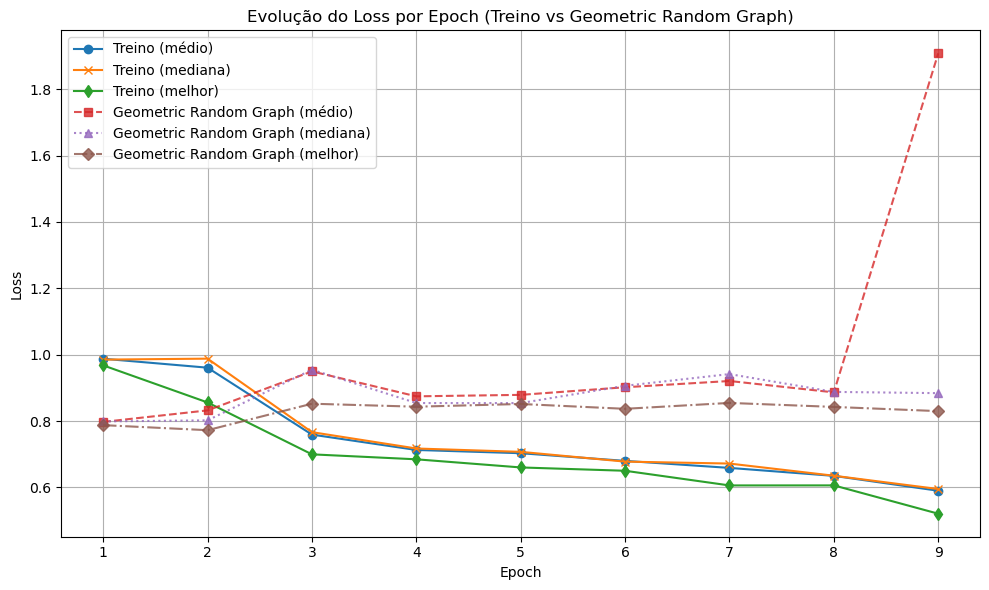

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.9167 | min: 0.0122 | max: 1.9684 | std: 0.6217 | grad: False | numel: 4000 | sum: 3666.6777
[Batch 0] erro hist          → mean: 0.8318 | min: 0.0136 | max: 1.5183 | std: 0.4564 | grad: False | numel: 4000 | sum: 3327.3467
[Batch 0] erro hist**1.5     → mean: 0.8499 | min: 0.0016 | max: 1.8709 | std: 0.5931 | grad: False | numel: 4000 | sum: 3399.7583
[Batch 0] erro dens          → mean: 0.1518 | min: 0.0001 | max: 0.4221 | std: 0.0880 | grad: False | numel: 4000 | sum: 607.3968
[Batch 0] erro dens**1.5     → mean: 0.0667 | min: 0.0000 | max: 0.2743 | std: 0.0544 | grad: False | numel: 4000 | sum: 266.9190
📊 [Batch 0] 2154 grafos únicos | Mais repetido apareceu 211x | Excesso = 131 | Penalização = 5.722761631011963
[KR] Indivíduo 0: Erro médio = 6.6394
[Batch 0] final_losses       → mean: 0.9904 | min: 0.0164 | max: 5.2323 | std: 0.6370 | grad: False | numel: 4000 | sum: 3961.6738
[Batch 0] erro hist          → mean: 0.8831 | min:

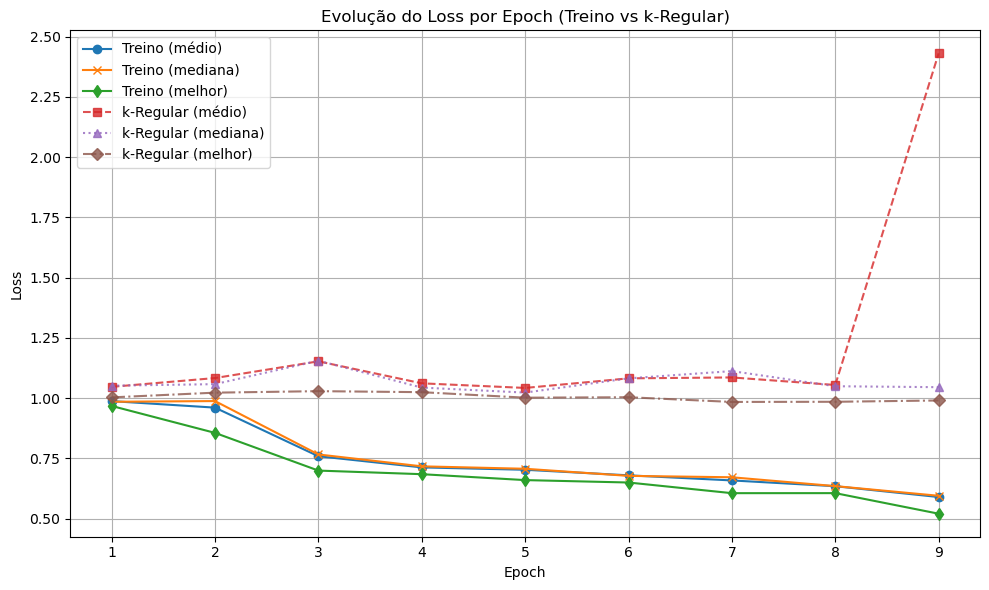

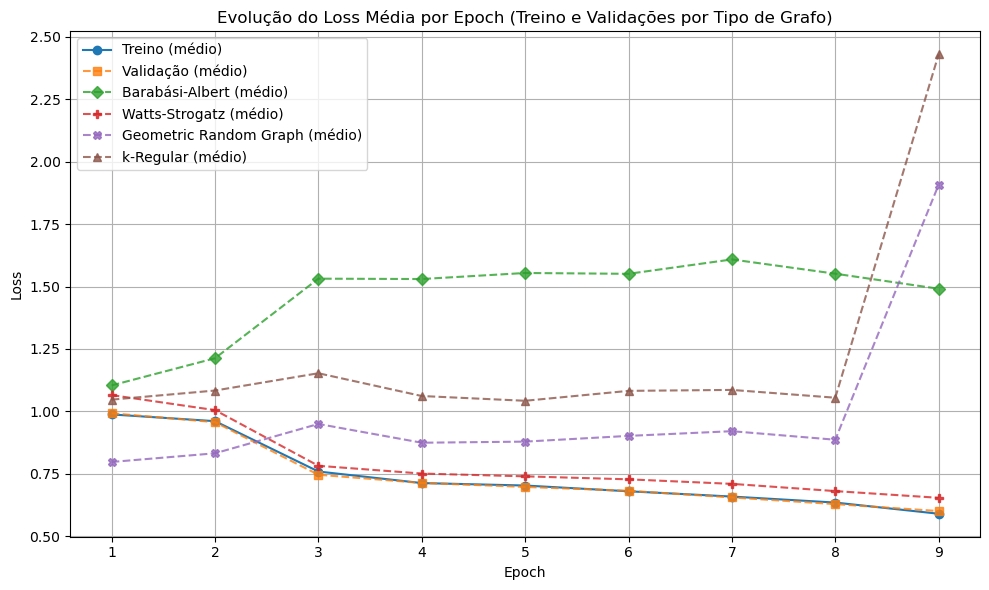

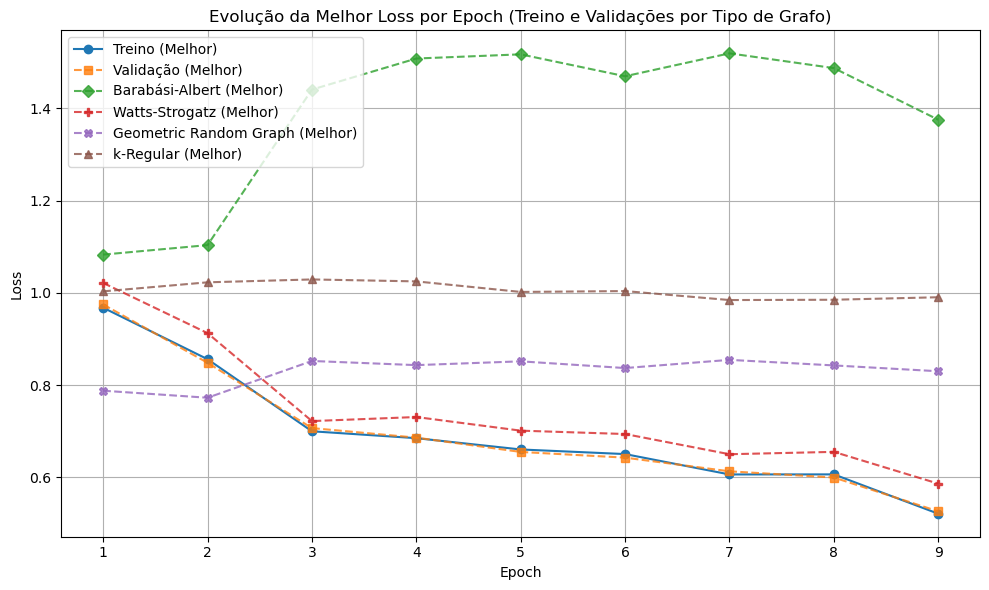

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[12:15:24] Aplicando refinamento com gradiente nos melhores indivíduos...
[12:18:08] Indivíduo 12 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.522992
   🔹 Erro depois: 0.506913
   🔹 Diferença:   +0.016079 | Tempo Total: 164.57s
   🔸 Erros por passo: ['0.522992', '0.513961', '0.506913']
[12:20:43] Indivíduo 11 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.597152
   🔹 Erro depois: 5.826761
   🔹 Diferença:   -5.229609 | Tempo Total: 154.63s
   🔸 Erros por passo: ['0.597152', '0.752464', '5.826761']
Indivíduo salvo como era ANTES do gradiente
[12:23:09] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.599002
   🔹 Erro depois: 0.568899
   🔹 Diferença:   +0.030102 | Tempo Total: 145.48s
   🔸 Erros por passo: ['0.599002', '0.610776'

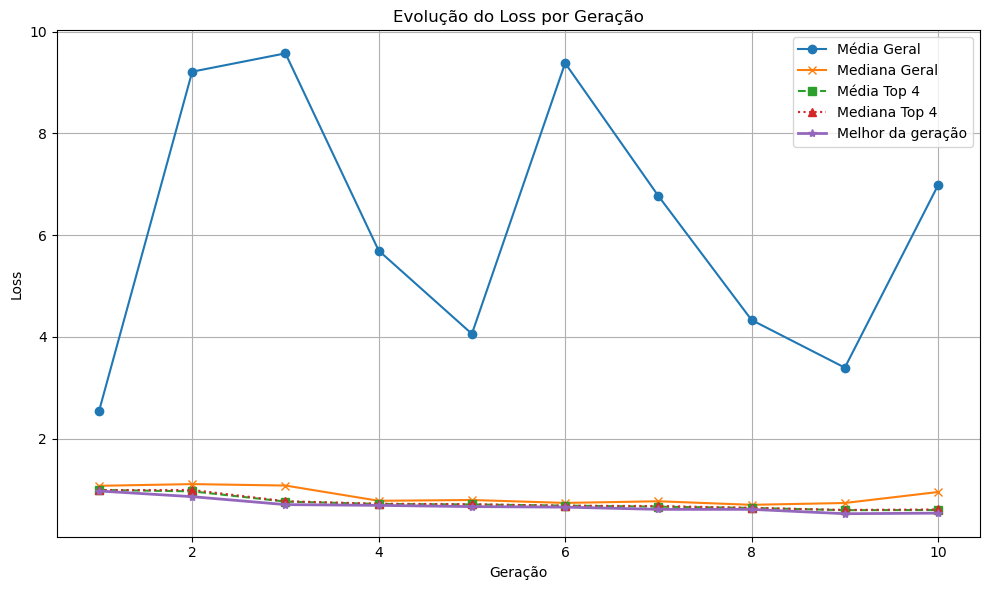

[Epoch 11] Média Geral: 6.9816 | Mediana Geral: 0.9474 | Média Top 4: 0.5937 | Mediana Top 4: 0.6044 | Melhor: 0.5315 | Tempo: 852.37s


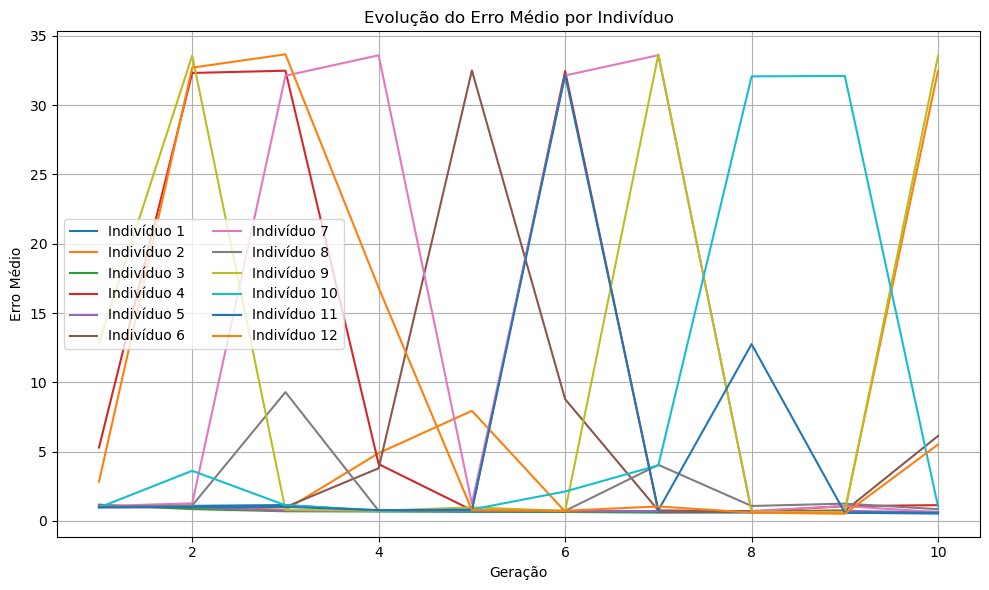

[12:39:50] Média dos top 4: 0.5937 | Mediana: 0.6044
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5302 | min: 0.0332 | max: 2.0428 | std: 0.4399 | grad: False | numel: 4000 | sum: 2120.7903
[Batch 0] erro hist          → mean: 0.5374 | min: 0.0581 | max: 1.4523 | std: 0.3228 | grad: False | numel: 4000 | sum: 2149.7852
[Batch 0] erro hist**1.5     → mean: 0.4466 | min: 0.0140 | max: 1.7501 | std: 0.3783 | grad: False | numel: 4000 | sum: 1786.2505
[Batch 0] erro dens          → mean: 0.1675 | min: 0.0000 | max: 0.4408 | std: 0.1288 | grad: False | numel: 4000 | sum: 669.8700
[Batch 0] erro dens**1.5     → mean: 0.0836 | min: 0.0000 | max: 0.2927 | std: 0.0854 | grad: False | numel: 4000 | sum: 334.5398
📊 [Batch 0] 3693 grafos únicos | Mais repetido apareceu 36x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5302
[Batch 0] final_losses       → mean: 0.6148 | min: 0.0186 | max: 2.1758 | std: 0.4953 | grad: False | numel: 4000 | sum: 2459.1577
[Batch 0] erro hi

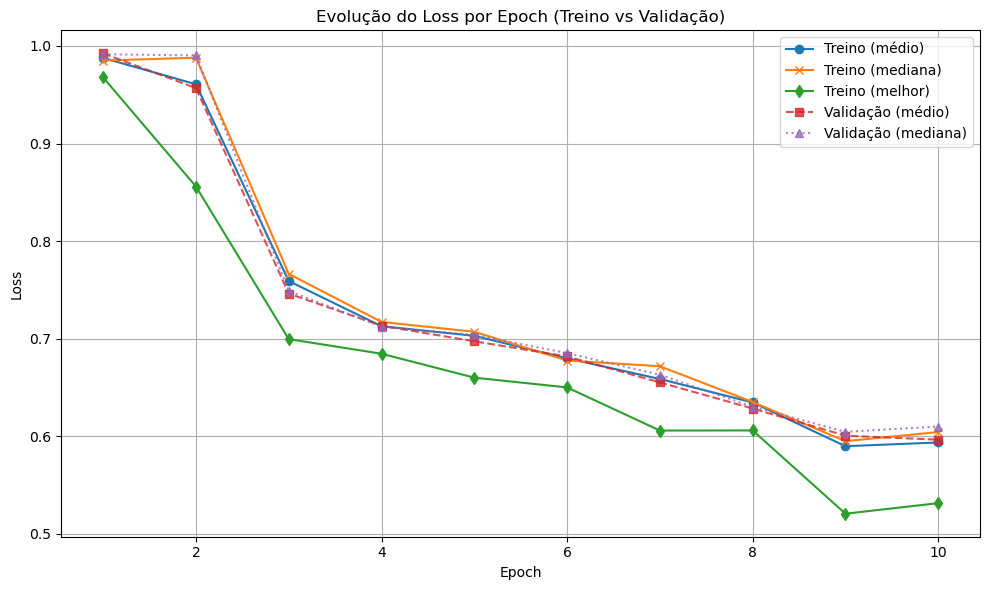

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4561 | min: 0.0424 | max: 4.1344 | std: 1.1677 | grad: False | numel: 4000 | sum: 5824.2568
[Batch 0] erro hist          → mean: 1.1724 | min: 0.1204 | max: 2.5465 | std: 0.6940 | grad: False | numel: 4000 | sum: 4689.5830
[Batch 0] erro hist**1.5     → mean: 1.4366 | min: 0.0418 | max: 4.0636 | std: 1.1662 | grad: False | numel: 4000 | sum: 5746.5181
[Batch 0] erro dens          → mean: 0.0650 | min: 0.0001 | max: 0.2100 | std: 0.0451 | grad: False | numel: 4000 | sum: 260.1240
[Batch 0] erro dens**1.5     → mean: 0.0194 | min: 0.0000 | max: 0.0963 | std: 0.0201 | grad: False | numel: 4000 | sum: 77.7382
📊 [Batch 0] 3431 grafos únicos | Mais repetido apareceu 33x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4561
[Batch 0] final_losses       → mean: 1.4784 | min: 0.0478 | max: 4.4261 | std: 1.2424 | grad: False | numel: 4000 | sum: 5913.6084
[Batch 0] erro hist          → mean: 1.1736 | min: 0.1101 | max: 2.6

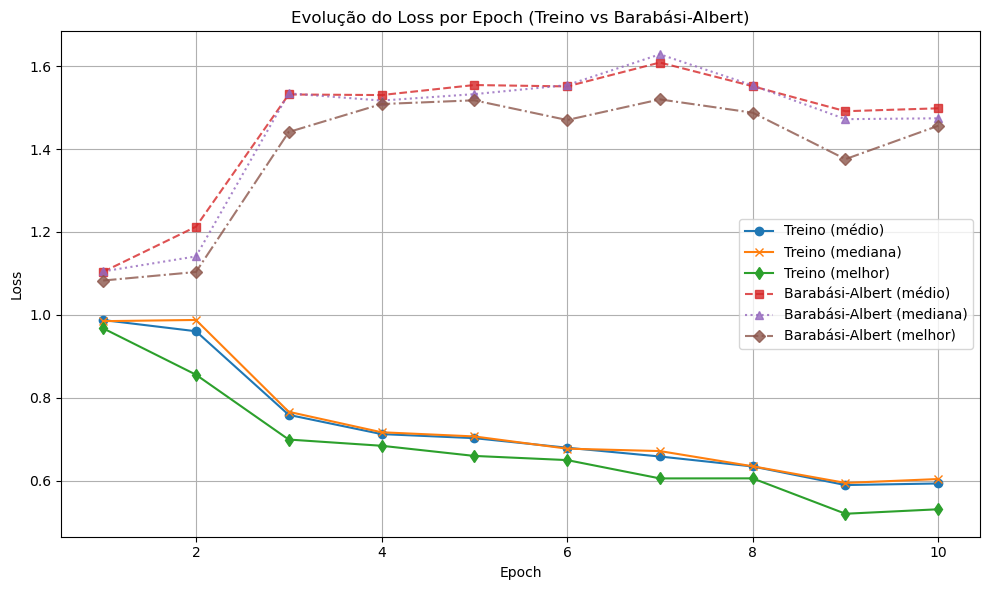

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5896 | min: 0.0120 | max: 1.9026 | std: 0.5168 | grad: False | numel: 4000 | sum: 2358.5867
[Batch 0] erro hist          → mean: 0.5747 | min: 0.0183 | max: 1.4839 | std: 0.3753 | grad: False | numel: 4000 | sum: 2298.9146
[Batch 0] erro hist**1.5     → mean: 0.5037 | min: 0.0025 | max: 1.8076 | std: 0.4648 | grad: False | numel: 4000 | sum: 2014.6680
[Batch 0] erro dens          → mean: 0.1735 | min: 0.0001 | max: 0.4228 | std: 0.1234 | grad: False | numel: 4000 | sum: 693.8833
[Batch 0] erro dens**1.5     → mean: 0.0860 | min: 0.0000 | max: 0.2750 | std: 0.0821 | grad: False | numel: 4000 | sum: 343.9188
📊 [Batch 0] 3290 grafos únicos | Mais repetido apareceu 30x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5896
[Batch 0] final_losses       → mean: 0.6499 | min: 0.0120 | max: 1.9676 | std: 0.5505 | grad: False | numel: 4000 | sum: 2599.4631
[Batch 0] erro hist          → mean: 0.6172 | min: 0.0297 | max: 1.

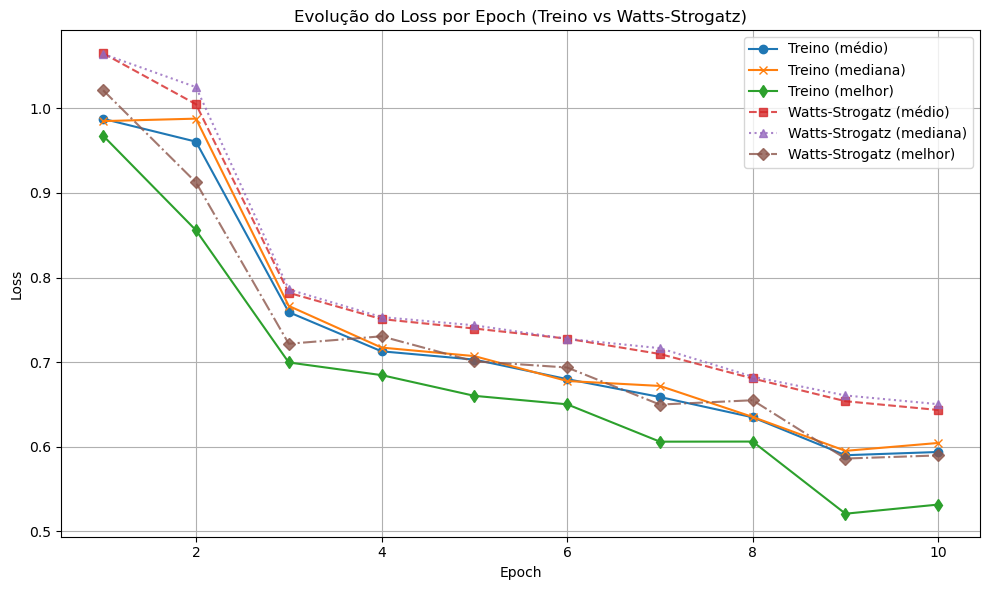

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7744 | min: 0.1224 | max: 2.7611 | std: 0.5154 | grad: False | numel: 4000 | sum: 3097.7153
[Batch 0] erro hist          → mean: 0.7675 | min: 0.2440 | max: 1.9624 | std: 0.3561 | grad: False | numel: 4000 | sum: 3070.0903
[Batch 0] erro hist**1.5     → mean: 0.7259 | min: 0.1206 | max: 2.7490 | std: 0.4893 | grad: False | numel: 4000 | sum: 2903.4268
[Batch 0] erro dens          → mean: 0.1240 | min: 0.0002 | max: 0.2358 | std: 0.0659 | grad: False | numel: 4000 | sum: 496.0000
[Batch 0] erro dens**1.5     → mean: 0.0486 | min: 0.0000 | max: 0.1145 | std: 0.0335 | grad: False | numel: 4000 | sum: 194.2885
📊 [Batch 0] 2522 grafos únicos | Mais repetido apareceu 121x | Excesso = 41 | Penalização = 3.2015621662139893
[GRG] Indivíduo 0: Erro médio = 3.9760
[Batch 0] final_losses       → mean: 0.8411 | min: 0.1302 | max: 2.9972 | std: 0.5947 | grad: False | numel: 4000 | sum: 3364.5815
[Batch 0] erro hist          → mean: 0.7998 | mi

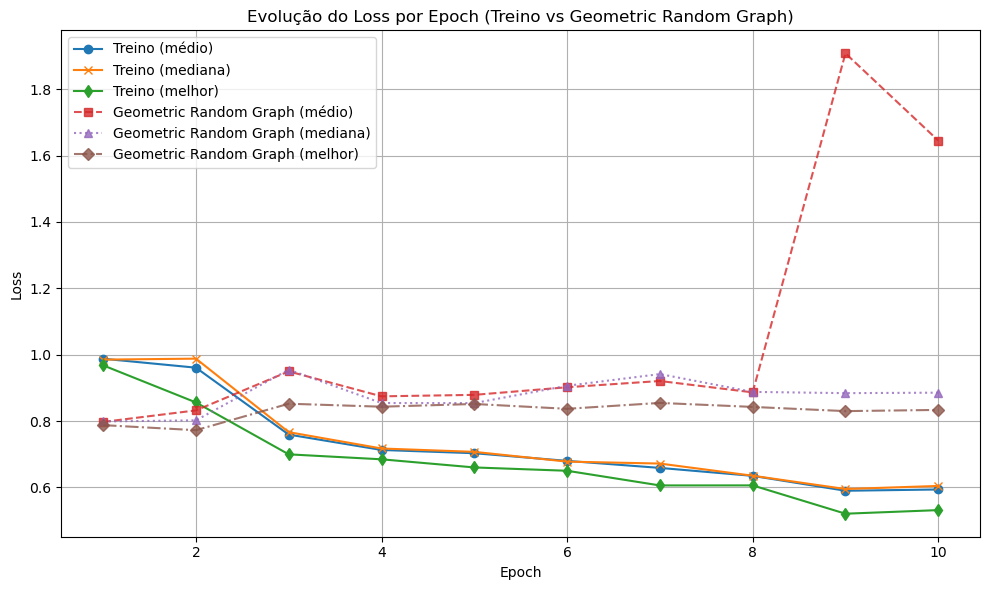

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.9081 | min: 0.0301 | max: 1.9391 | std: 0.5978 | grad: False | numel: 4000 | sum: 3632.5217
[Batch 0] erro hist          → mean: 0.8359 | min: 0.0507 | max: 1.5038 | std: 0.4317 | grad: False | numel: 4000 | sum: 3343.4009
[Batch 0] erro hist**1.5     → mean: 0.8445 | min: 0.0114 | max: 1.8441 | std: 0.5706 | grad: False | numel: 4000 | sum: 3378.0400
[Batch 0] erro dens          → mean: 0.1469 | min: 0.0000 | max: 0.4228 | std: 0.0860 | grad: False | numel: 4000 | sum: 587.7144
[Batch 0] erro dens**1.5     → mean: 0.0636 | min: 0.0000 | max: 0.2749 | std: 0.0526 | grad: False | numel: 4000 | sum: 254.4818
📊 [Batch 0] 2561 grafos únicos | Mais repetido apareceu 63x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.9081
[Batch 0] final_losses       → mean: 0.9901 | min: 0.0156 | max: 2.0102 | std: 0.6359 | grad: False | numel: 4000 | sum: 3960.3726
[Batch 0] erro hist          → mean: 0.8826 | min: 0.0242 | max: 1.

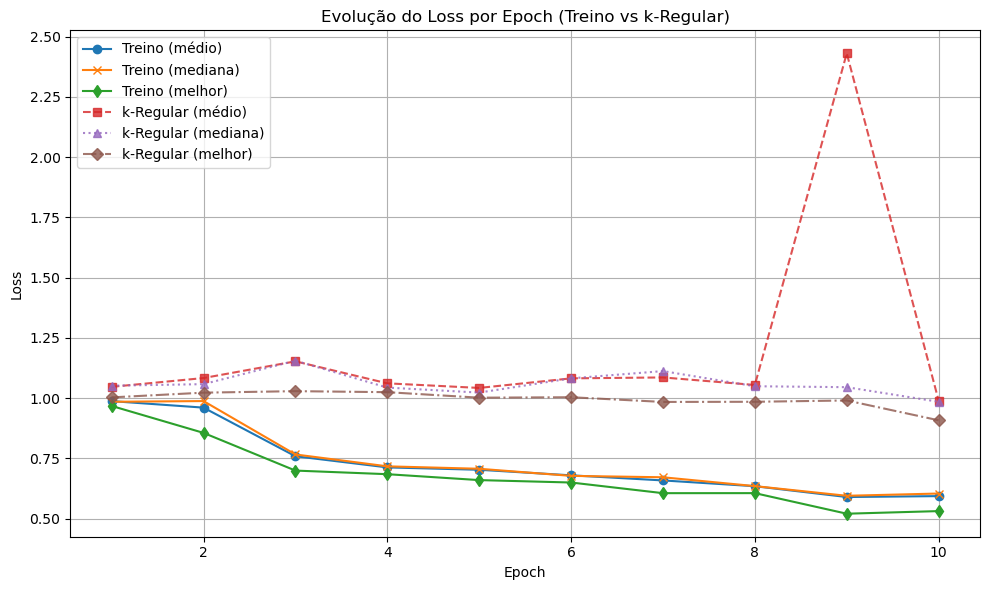

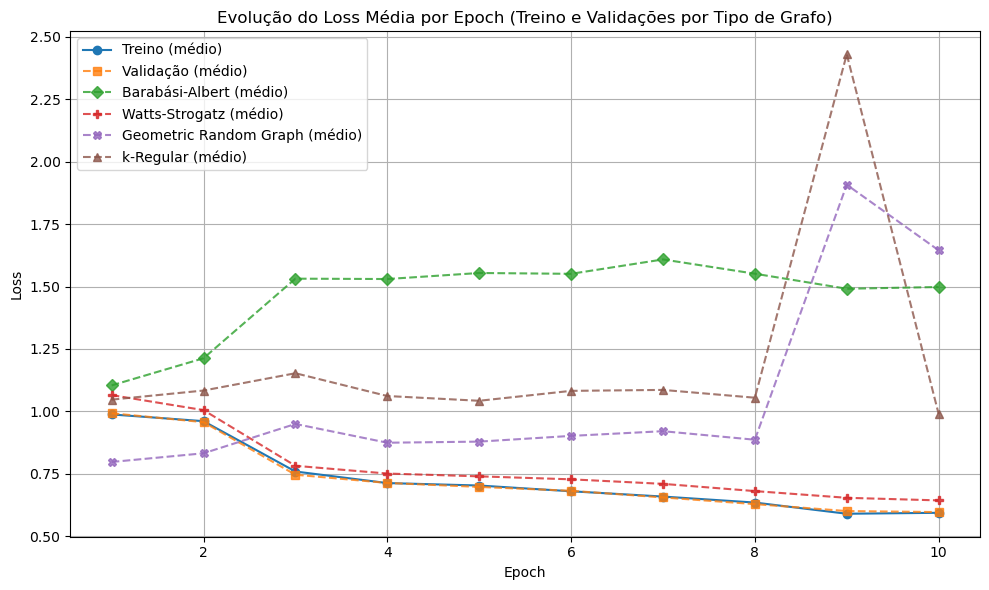

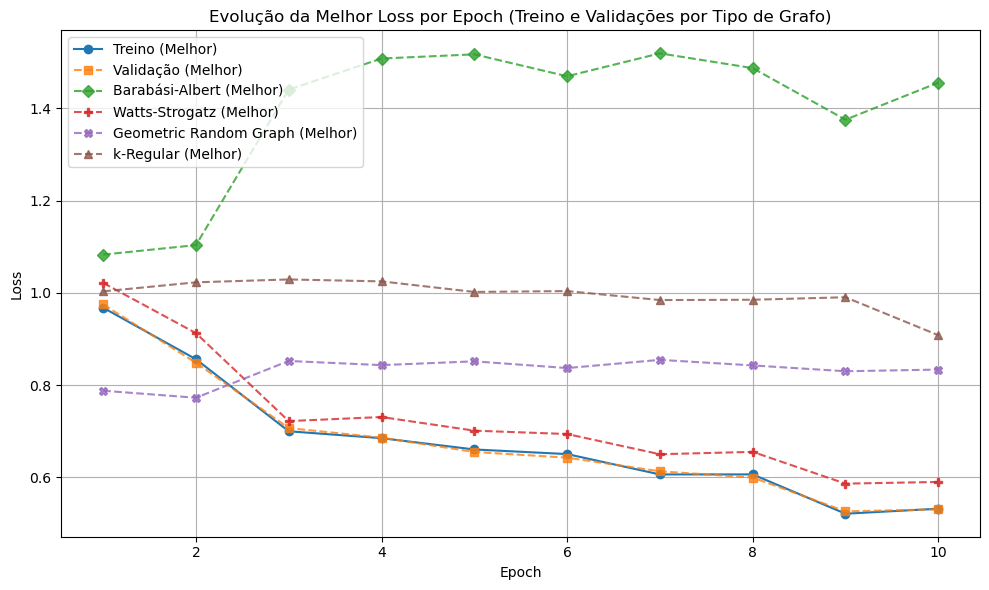

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[12:51:01] Aplicando refinamento com gradiente nos melhores indivíduos...
[12:53:28] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.530880
   🔹 Erro depois: 1.001369
   🔹 Diferença:   -0.470489 | Tempo Total: 147.75s
   🔸 Erros por passo: ['0.530880', '1.835905', '1.001369']
Indivíduo salvo como era ANTES do gradiente
[12:55:54] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.602752
   🔹 Erro depois: 0.699731
   🔹 Diferença:   -0.096978 | Tempo Total: 145.14s
   🔸 Erros por passo: ['0.602752', '0.760675', '0.699731']
Indivíduo salvo como era ANTES do gradiente
[12:58:20] Indivíduo 11 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.602752
   🔹 Erro depois: 22.446417
   🔹 Diferença:   -21.843664 | Tempo Total: 146.43s


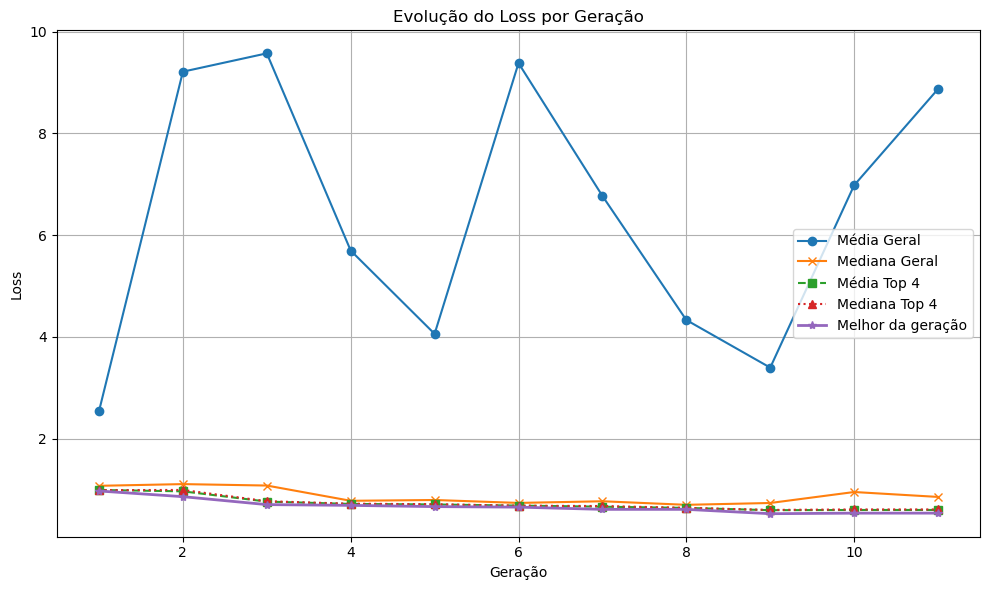

[Epoch 12] Média Geral: 8.8751 | Mediana Geral: 0.8508 | Média Top 4: 0.5943 | Mediana Top 4: 0.6045 | Melhor: 0.5320 | Tempo: 848.39s


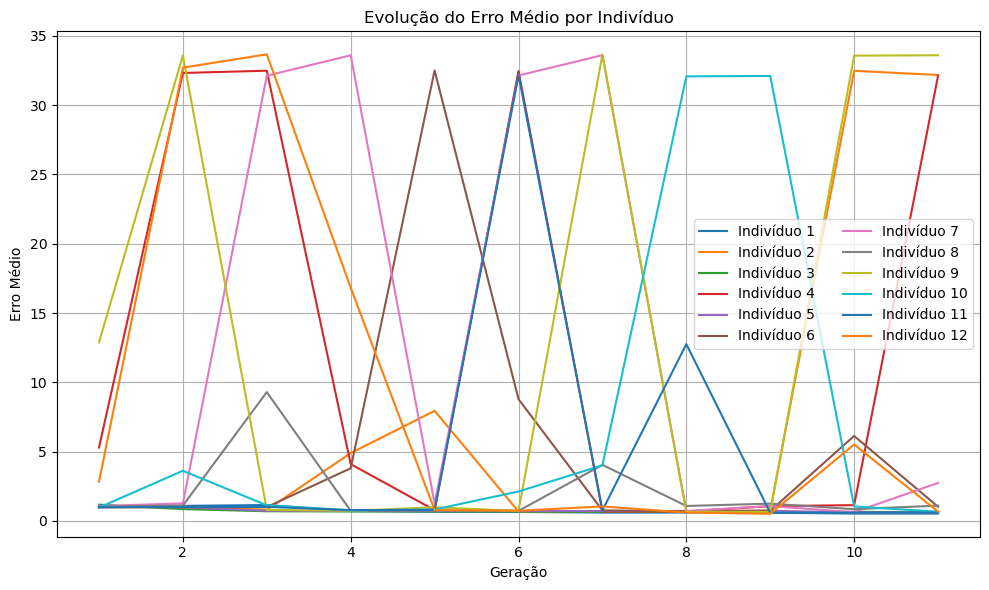

[13:14:53] Média dos top 4: 0.5943 | Mediana: 0.6045
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5345 | min: 0.0192 | max: 2.0428 | std: 0.4356 | grad: False | numel: 4000 | sum: 2138.0439
[Batch 0] erro hist          → mean: 0.5410 | min: 0.0510 | max: 1.4523 | std: 0.3199 | grad: False | numel: 4000 | sum: 2163.8926
[Batch 0] erro hist**1.5     → mean: 0.4495 | min: 0.0115 | max: 1.7501 | std: 0.3751 | grad: False | numel: 4000 | sum: 1797.8181
[Batch 0] erro dens          → mean: 0.1702 | min: 0.0000 | max: 0.4408 | std: 0.1279 | grad: False | numel: 4000 | sum: 680.8109
[Batch 0] erro dens**1.5     → mean: 0.0851 | min: 0.0000 | max: 0.2927 | std: 0.0849 | grad: False | numel: 4000 | sum: 340.2261
📊 [Batch 0] 3700 grafos únicos | Mais repetido apareceu 30x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5345
[Batch 0] final_losses       → mean: 0.5994 | min: 0.0166 | max: 2.1758 | std: 0.4852 | grad: False | numel: 4000 | sum: 2397.5935
[Batch 0] erro hi

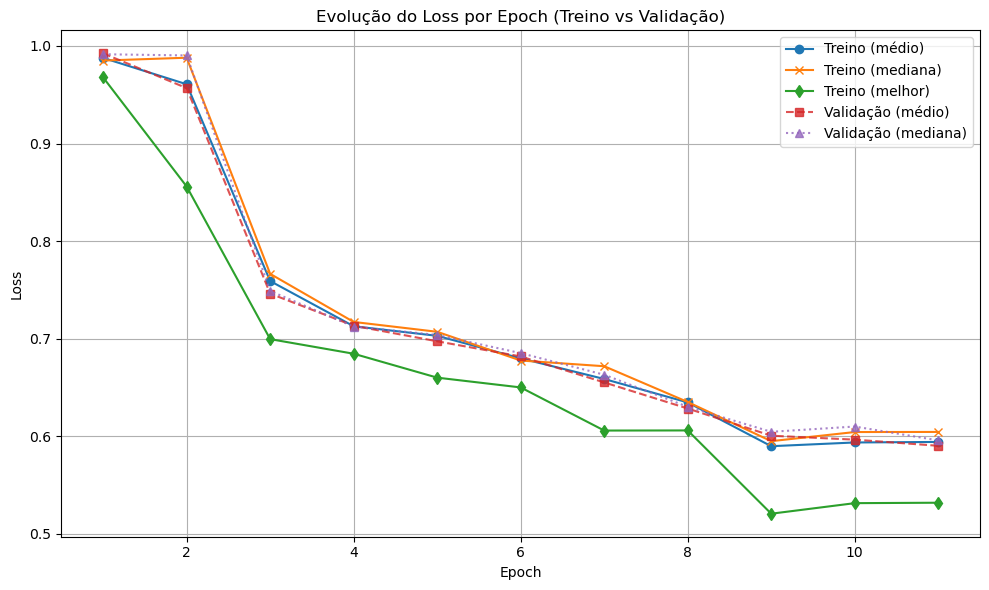

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4741 | min: 0.0437 | max: 4.1373 | std: 1.1678 | grad: False | numel: 4000 | sum: 5896.5254
[Batch 0] erro hist          → mean: 1.1850 | min: 0.1055 | max: 2.5476 | std: 0.6912 | grad: False | numel: 4000 | sum: 4739.8037
[Batch 0] erro hist**1.5     → mean: 1.4549 | min: 0.0343 | max: 4.0662 | std: 1.1664 | grad: False | numel: 4000 | sum: 5819.4507
[Batch 0] erro dens          → mean: 0.0646 | min: 0.0001 | max: 0.2098 | std: 0.0448 | grad: False | numel: 4000 | sum: 258.5692
[Batch 0] erro dens**1.5     → mean: 0.0193 | min: 0.0000 | max: 0.0961 | std: 0.0198 | grad: False | numel: 4000 | sum: 77.0745
📊 [Batch 0] 3400 grafos únicos | Mais repetido apareceu 40x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4741
[Batch 0] final_losses       → mean: 1.4636 | min: 0.0298 | max: 4.4275 | std: 1.2491 | grad: False | numel: 4000 | sum: 5854.2231
[Batch 0] erro hist          → mean: 1.1634 | min: 0.0826 | max: 2.6

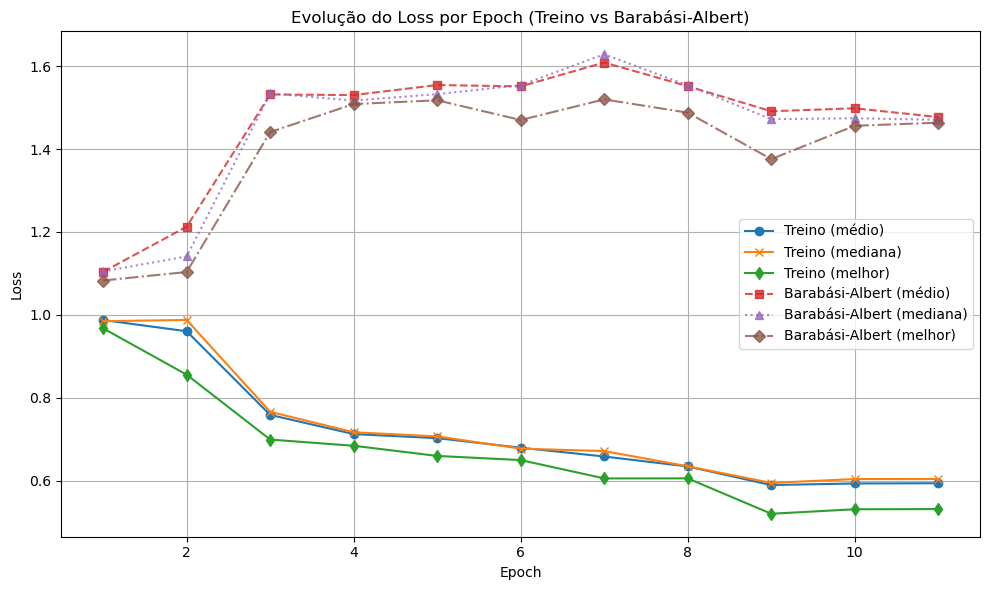

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5880 | min: 0.0125 | max: 1.9026 | std: 0.5194 | grad: False | numel: 4000 | sum: 2352.1565
[Batch 0] erro hist          → mean: 0.5741 | min: 0.0307 | max: 1.4839 | std: 0.3782 | grad: False | numel: 4000 | sum: 2296.2080
[Batch 0] erro hist**1.5     → mean: 0.5041 | min: 0.0054 | max: 1.8076 | std: 0.4674 | grad: False | numel: 4000 | sum: 2016.5488
[Batch 0] erro dens          → mean: 0.1702 | min: 0.0000 | max: 0.4235 | std: 0.1230 | grad: False | numel: 4000 | sum: 680.7931
[Batch 0] erro dens**1.5     → mean: 0.0839 | min: 0.0000 | max: 0.2756 | std: 0.0819 | grad: False | numel: 4000 | sum: 335.6079
📊 [Batch 0] 3229 grafos únicos | Mais repetido apareceu 29x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5880
[Batch 0] final_losses       → mean: 0.6352 | min: 0.0117 | max: 1.9714 | std: 0.5418 | grad: False | numel: 4000 | sum: 2540.8445
[Batch 0] erro hist          → mean: 0.6068 | min: 0.0292 | max: 1.

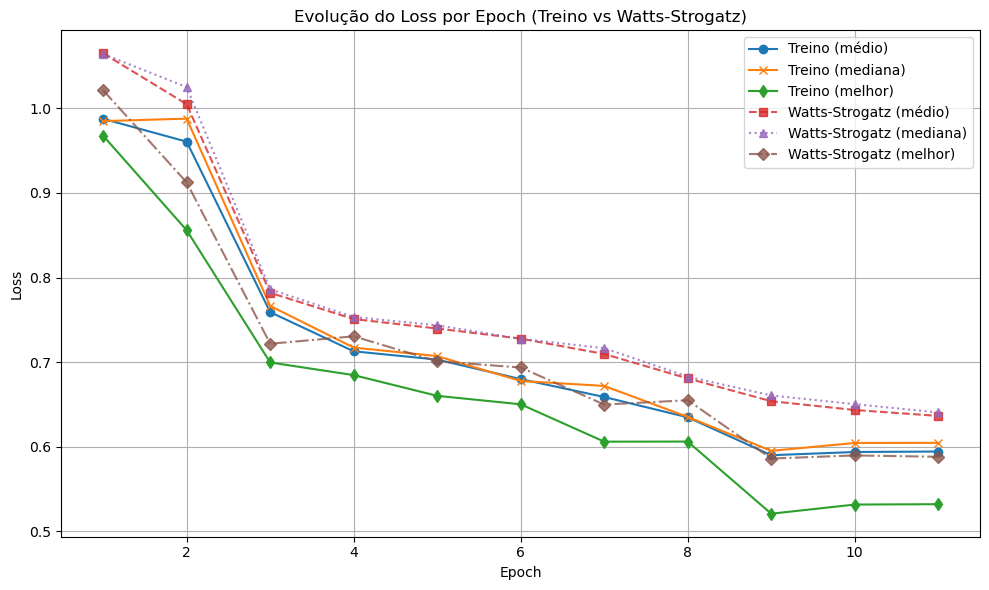

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7839 | min: 0.1158 | max: 2.9648 | std: 0.5213 | grad: False | numel: 4000 | sum: 3135.5806
[Batch 0] erro hist          → mean: 0.7739 | min: 0.2336 | max: 2.0626 | std: 0.3588 | grad: False | numel: 4000 | sum: 3095.6584
[Batch 0] erro hist**1.5     → mean: 0.7348 | min: 0.1129 | max: 2.9623 | std: 0.4963 | grad: False | numel: 4000 | sum: 2939.1257
[Batch 0] erro dens          → mean: 0.1250 | min: 0.0000 | max: 0.2324 | std: 0.0661 | grad: False | numel: 4000 | sum: 500.0629
[Batch 0] erro dens**1.5     → mean: 0.0491 | min: 0.0000 | max: 0.1120 | std: 0.0336 | grad: False | numel: 4000 | sum: 196.4549
📊 [Batch 0] 2520 grafos únicos | Mais repetido apareceu 97x | Excesso = 17 | Penalização = 2.0615527629852295
[GRG] Indivíduo 0: Erro médio = 2.8454
[Batch 0] final_losses       → mean: 0.8490 | min: 0.1287 | max: 2.9972 | std: 0.5965 | grad: False | numel: 4000 | sum: 3395.9941
[Batch 0] erro hist          → mean: 0.8050 | min

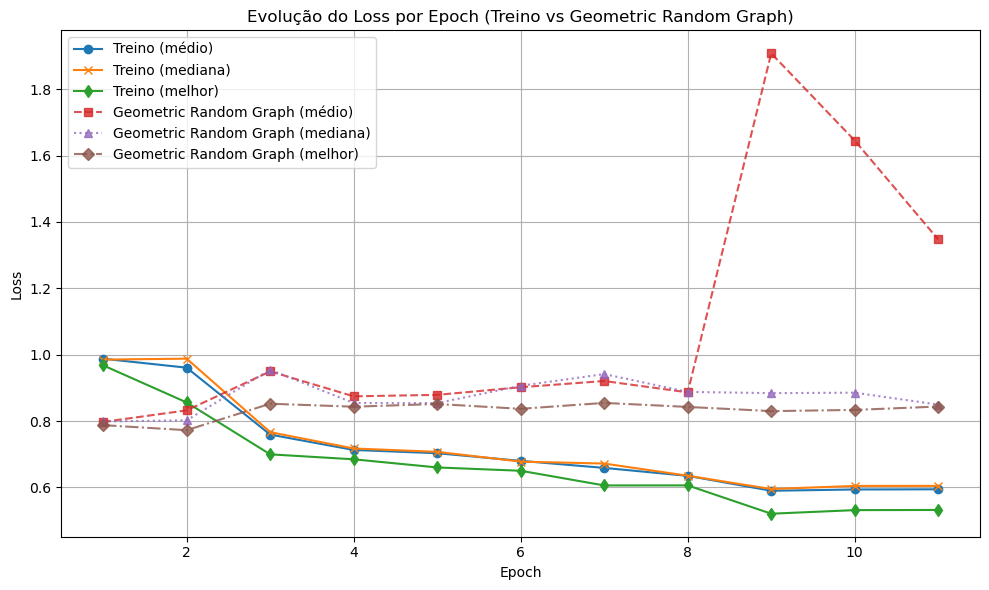

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.8984 | min: 0.0228 | max: 1.9383 | std: 0.6033 | grad: False | numel: 4000 | sum: 3593.7444
[Batch 0] erro hist          → mean: 0.8276 | min: 0.0482 | max: 1.5035 | std: 0.4356 | grad: False | numel: 4000 | sum: 3310.2361
[Batch 0] erro hist**1.5     → mean: 0.8348 | min: 0.0106 | max: 1.8436 | std: 0.5754 | grad: False | numel: 4000 | sum: 3339.2603
[Batch 0] erro dens          → mean: 0.1464 | min: 0.0001 | max: 0.4227 | std: 0.0877 | grad: False | numel: 4000 | sum: 585.4394
[Batch 0] erro dens**1.5     → mean: 0.0636 | min: 0.0000 | max: 0.2748 | std: 0.0535 | grad: False | numel: 4000 | sum: 254.4839
📊 [Batch 0] 2572 grafos únicos | Mais repetido apareceu 52x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.8984
[Batch 0] final_losses       → mean: 0.9797 | min: 0.0156 | max: 1.9656 | std: 0.6293 | grad: False | numel: 4000 | sum: 3918.8838
[Batch 0] erro hist          → mean: 0.8773 | min: 0.0242 | max: 1.

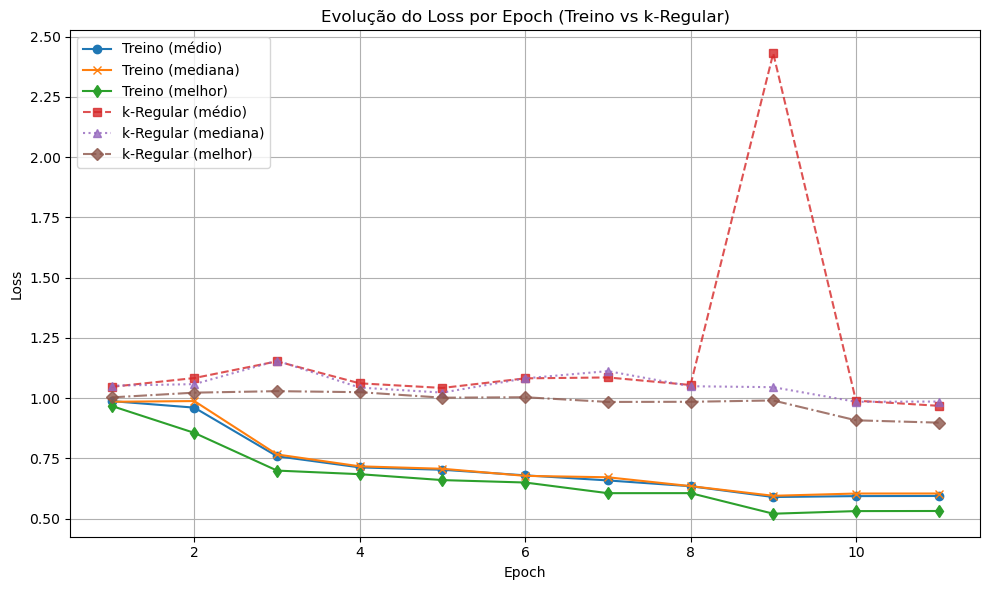

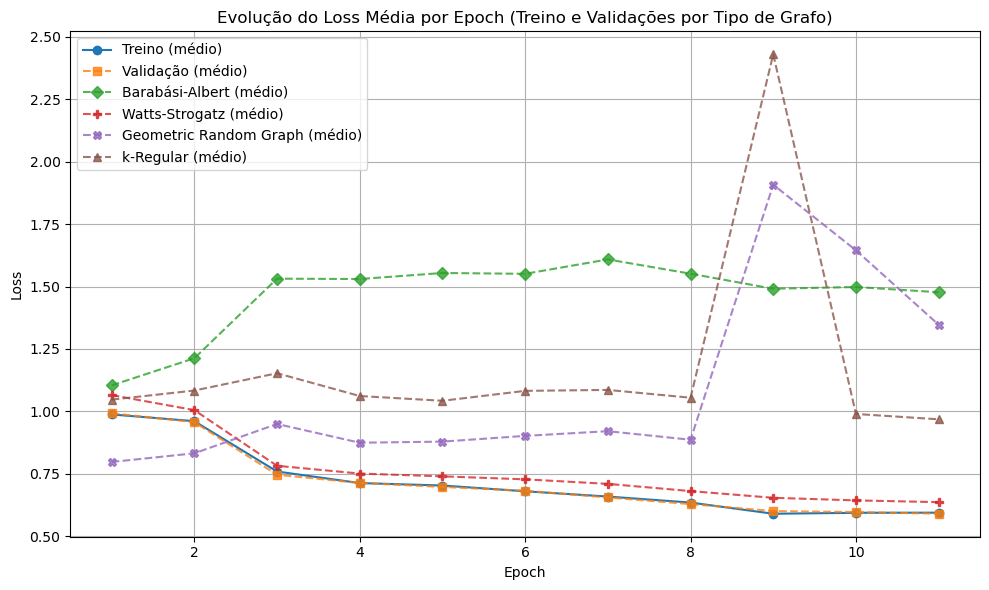

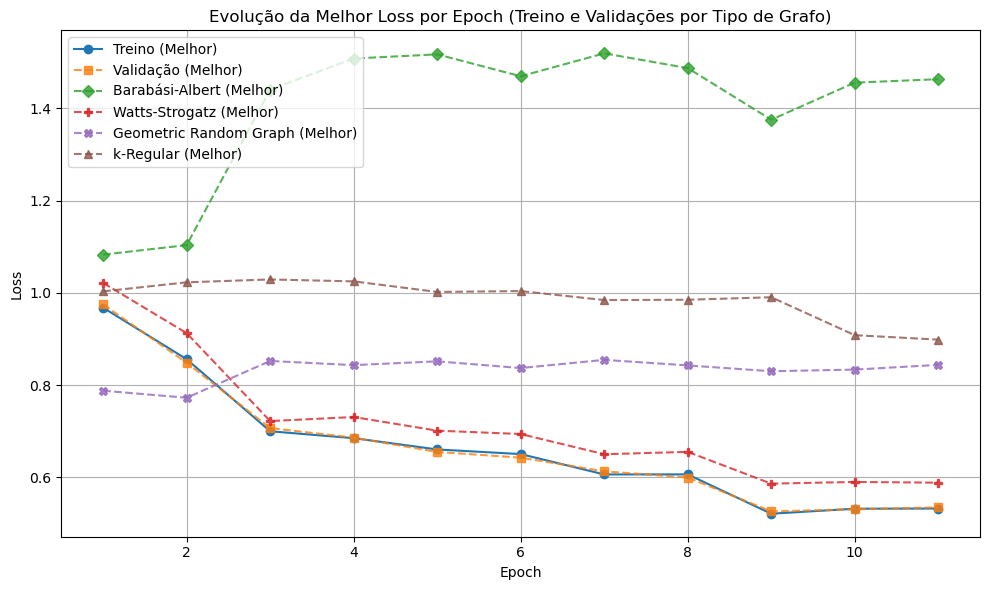

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[13:26:21] Aplicando refinamento com gradiente nos melhores indivíduos...
[13:28:37] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     1e-4
   🔹 Erro antes:  0.530611
   🔹 Erro depois: 3.659122
   🔹 Diferença:   -3.128512 | Tempo Total: 136.58s
   🔸 Erros por passo: ['0.530611', '0.543090', '3.659122']
Indivíduo salvo como era ANTES do gradiente
[13:30:54] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.602877
   🔹 Erro depois: 21.802612
   🔹 Diferença:   -21.199735 | Tempo Total: 136.70s
   🔸 Erros por passo: ['0.602877', '15.058840', '21.802612']
Indivíduo salvo como era ANTES do gradiente
[13:33:11] Indivíduo 11 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.602877
   🔹 Erro depois: 0.727400
   🔹 Diferença:   -0.124523 | Tempo Total: 136.81

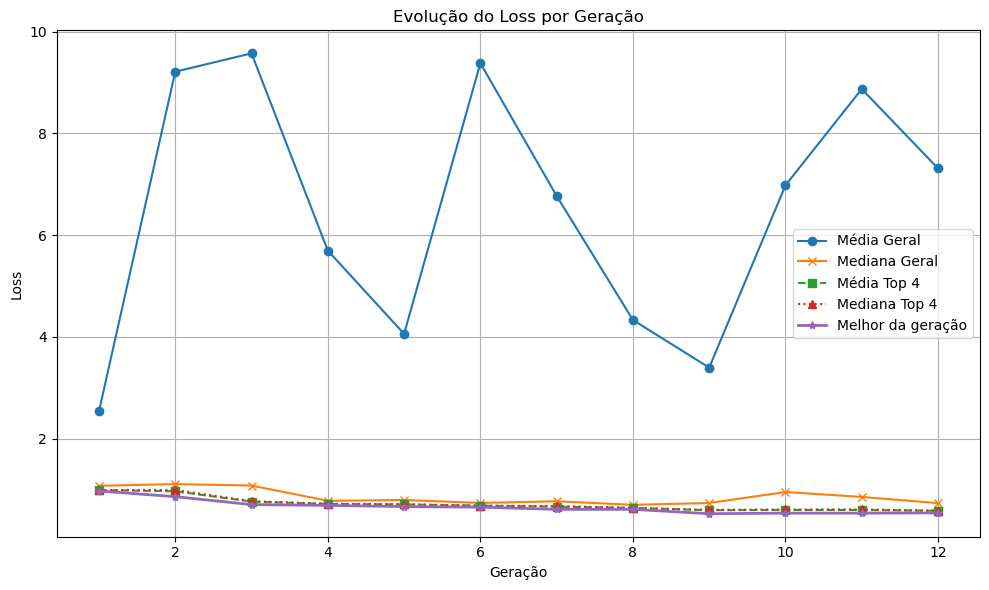

[Epoch 13] Média Geral: 7.3131 | Mediana Geral: 0.7295 | Média Top 4: 0.5774 | Mediana Top 4: 0.5811 | Melhor: 0.5370 | Tempo: 846.07s


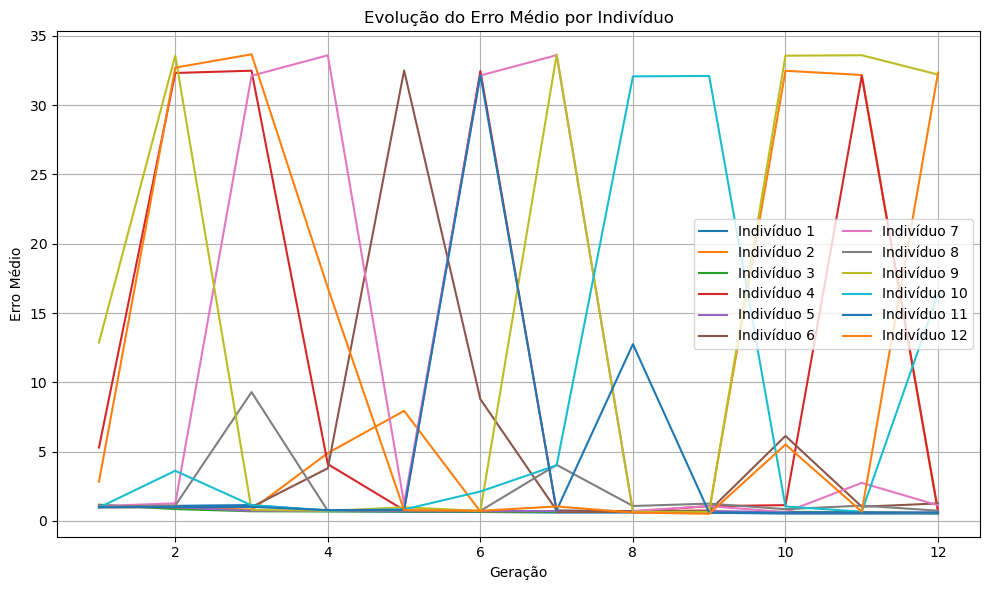

[13:49:33] Média dos top 4: 0.5774 | Mediana: 0.5811
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5401 | min: 0.0213 | max: 2.0428 | std: 0.4342 | grad: False | numel: 4000 | sum: 2160.5901
[Batch 0] erro hist          → mean: 0.5465 | min: 0.0514 | max: 1.4523 | std: 0.3185 | grad: False | numel: 4000 | sum: 2185.9248
[Batch 0] erro hist**1.5     → mean: 0.4549 | min: 0.0117 | max: 1.7501 | std: 0.3745 | grad: False | numel: 4000 | sum: 1819.4010
[Batch 0] erro dens          → mean: 0.1703 | min: 0.0000 | max: 0.4408 | std: 0.1284 | grad: False | numel: 4000 | sum: 681.2906
[Batch 0] erro dens**1.5     → mean: 0.0853 | min: 0.0000 | max: 0.2927 | std: 0.0849 | grad: False | numel: 4000 | sum: 341.1891
📊 [Batch 0] 3693 grafos únicos | Mais repetido apareceu 31x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5401
[Batch 0] final_losses       → mean: 0.5435 | min: 0.0145 | max: 2.0981 | std: 0.4592 | grad: False | numel: 4000 | sum: 2173.9126
[Batch 0] erro hi

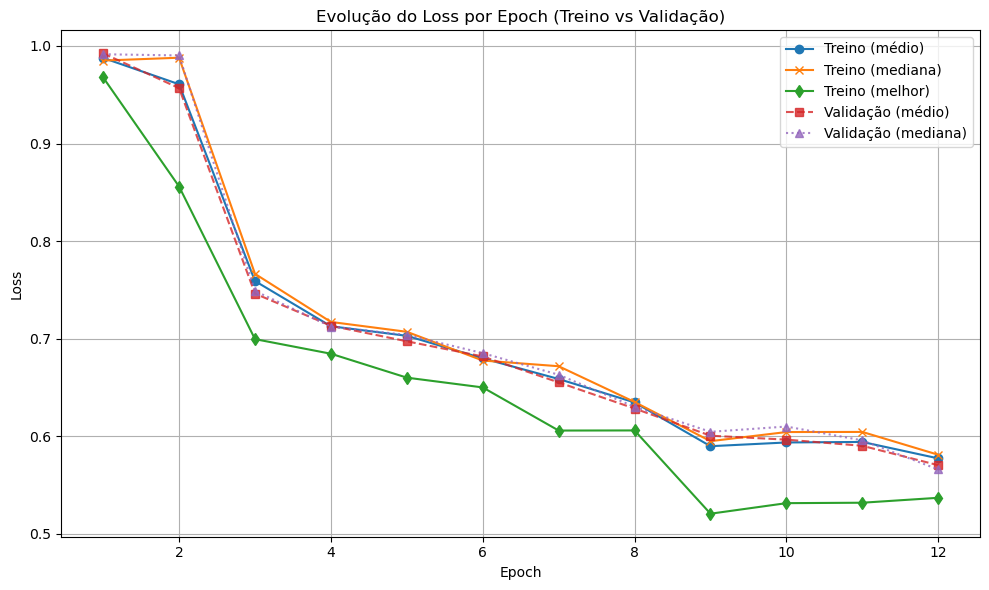

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4820 | min: 0.0437 | max: 4.1373 | std: 1.1794 | grad: False | numel: 4000 | sum: 5928.0547
[Batch 0] erro hist          → mean: 1.1882 | min: 0.1055 | max: 2.5476 | std: 0.6960 | grad: False | numel: 4000 | sum: 4752.6665
[Batch 0] erro hist**1.5     → mean: 1.4620 | min: 0.0343 | max: 4.0662 | std: 1.1779 | grad: False | numel: 4000 | sum: 5848.1147
[Batch 0] erro dens          → mean: 0.0665 | min: 0.0000 | max: 0.2100 | std: 0.0451 | grad: False | numel: 4000 | sum: 265.8266
[Batch 0] erro dens**1.5     → mean: 0.0200 | min: 0.0000 | max: 0.0963 | std: 0.0200 | grad: False | numel: 4000 | sum: 79.9398
📊 [Batch 0] 3406 grafos únicos | Mais repetido apareceu 41x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4820
[Batch 0] final_losses       → mean: 1.4080 | min: 0.0113 | max: 4.2529 | std: 1.1940 | grad: False | numel: 4000 | sum: 5631.8838
[Batch 0] erro hist          → mean: 1.1361 | min: 0.0275 | max: 2.5

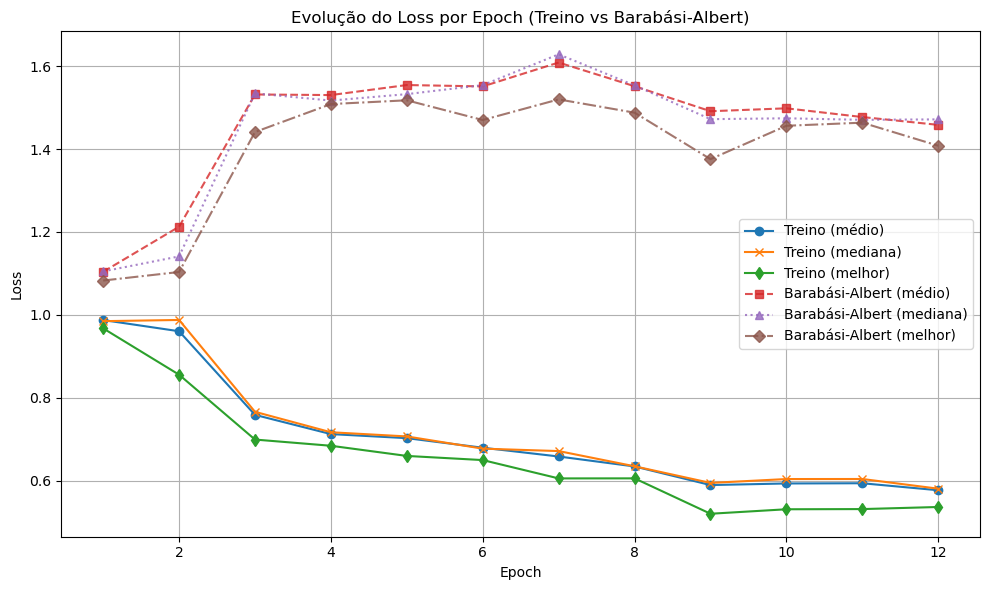

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5867 | min: 0.0119 | max: 1.8901 | std: 0.5120 | grad: False | numel: 4000 | sum: 2346.8564
[Batch 0] erro hist          → mean: 0.5722 | min: 0.0294 | max: 1.4773 | std: 0.3720 | grad: False | numel: 4000 | sum: 2288.8013
[Batch 0] erro hist**1.5     → mean: 0.5000 | min: 0.0051 | max: 1.7955 | std: 0.4578 | grad: False | numel: 4000 | sum: 1999.8384
[Batch 0] erro dens          → mean: 0.1745 | min: 0.0005 | max: 0.4227 | std: 0.1243 | grad: False | numel: 4000 | sum: 697.8926
[Batch 0] erro dens**1.5     → mean: 0.0868 | min: 0.0000 | max: 0.2748 | std: 0.0831 | grad: False | numel: 4000 | sum: 347.0181
📊 [Batch 0] 3280 grafos únicos | Mais repetido apareceu 26x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5867
[Batch 0] final_losses       → mean: 0.6025 | min: 0.0118 | max: 1.9067 | std: 0.5230 | grad: False | numel: 4000 | sum: 2410.0984
[Batch 0] erro hist          → mean: 0.5849 | min: 0.0225 | max: 1.

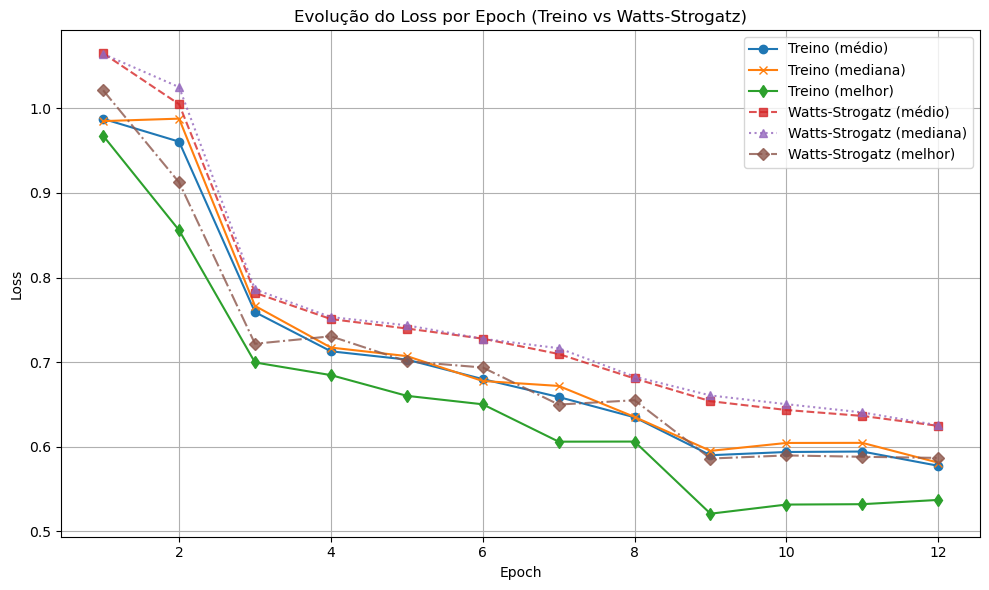

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7804 | min: 0.1395 | max: 2.7630 | std: 0.5157 | grad: False | numel: 4000 | sum: 3121.7266
[Batch 0] erro hist          → mean: 0.7720 | min: 0.2615 | max: 1.9618 | std: 0.3550 | grad: False | numel: 4000 | sum: 3088.1050
[Batch 0] erro hist**1.5     → mean: 0.7313 | min: 0.1337 | max: 2.7477 | std: 0.4899 | grad: False | numel: 4000 | sum: 2925.0056
[Batch 0] erro dens          → mean: 0.1255 | min: 0.0003 | max: 0.2358 | std: 0.0650 | grad: False | numel: 4000 | sum: 501.8454
[Batch 0] erro dens**1.5     → mean: 0.0492 | min: 0.0000 | max: 0.1145 | std: 0.0332 | grad: False | numel: 4000 | sum: 196.7210
📊 [Batch 0] 2477 grafos únicos | Mais repetido apareceu 113x | Excesso = 33 | Penalização = 2.872281312942505
[GRG] Indivíduo 0: Erro médio = 3.6527
[Batch 0] final_losses       → mean: 0.8265 | min: 0.1357 | max: 2.9716 | std: 0.5457 | grad: False | numel: 4000 | sum: 3305.8479
[Batch 0] erro hist          → mean: 0.8022 | min

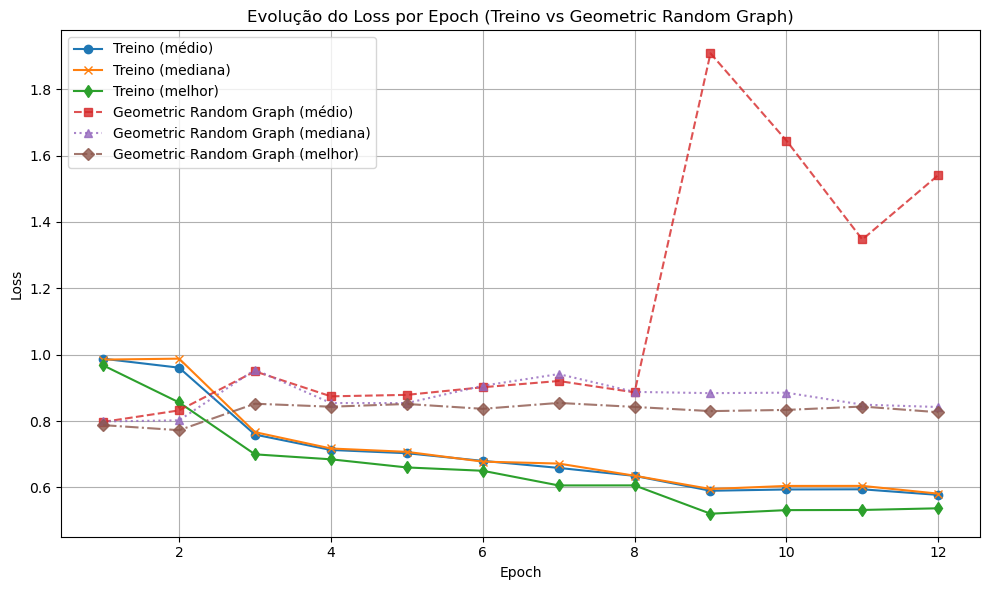

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.8847 | min: 0.0241 | max: 1.9462 | std: 0.5949 | grad: False | numel: 4000 | sum: 3538.8672
[Batch 0] erro hist          → mean: 0.8186 | min: 0.0566 | max: 1.5078 | std: 0.4298 | grad: False | numel: 4000 | sum: 3274.3162
[Batch 0] erro hist**1.5     → mean: 0.8206 | min: 0.0135 | max: 1.8515 | std: 0.5673 | grad: False | numel: 4000 | sum: 3282.5291
[Batch 0] erro dens          → mean: 0.1468 | min: 0.0001 | max: 0.4228 | std: 0.0890 | grad: False | numel: 4000 | sum: 587.1981
[Batch 0] erro dens**1.5     → mean: 0.0641 | min: 0.0000 | max: 0.2749 | std: 0.0544 | grad: False | numel: 4000 | sum: 256.3381
📊 [Batch 0] 2624 grafos únicos | Mais repetido apareceu 52x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.8847
[Batch 0] final_losses       → mean: 0.9388 | min: 0.0123 | max: 2.0981 | std: 0.6100 | grad: False | numel: 4000 | sum: 3755.0767
[Batch 0] erro hist          → mean: 0.8529 | min: 0.0213 | max: 1.

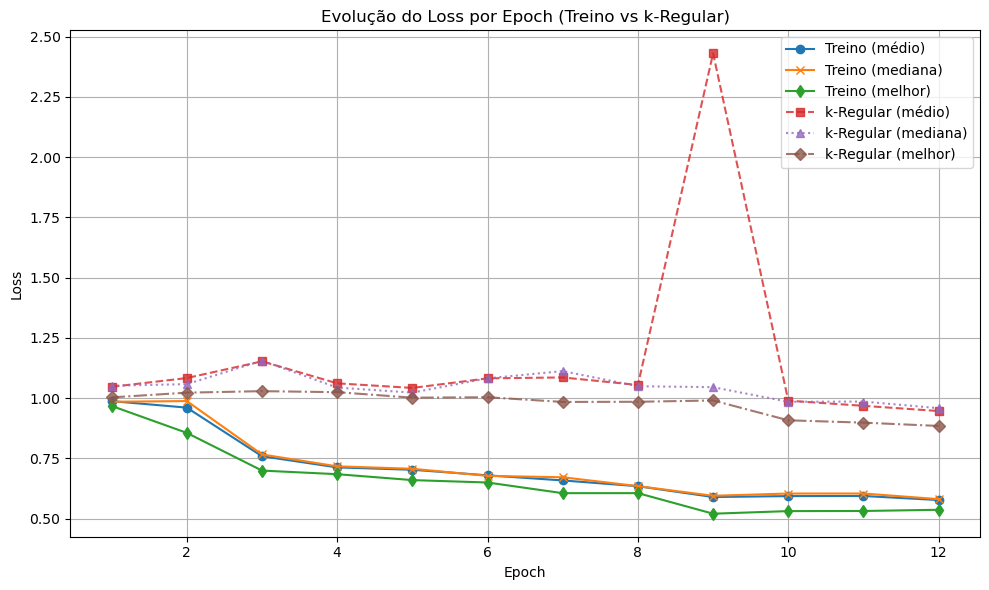

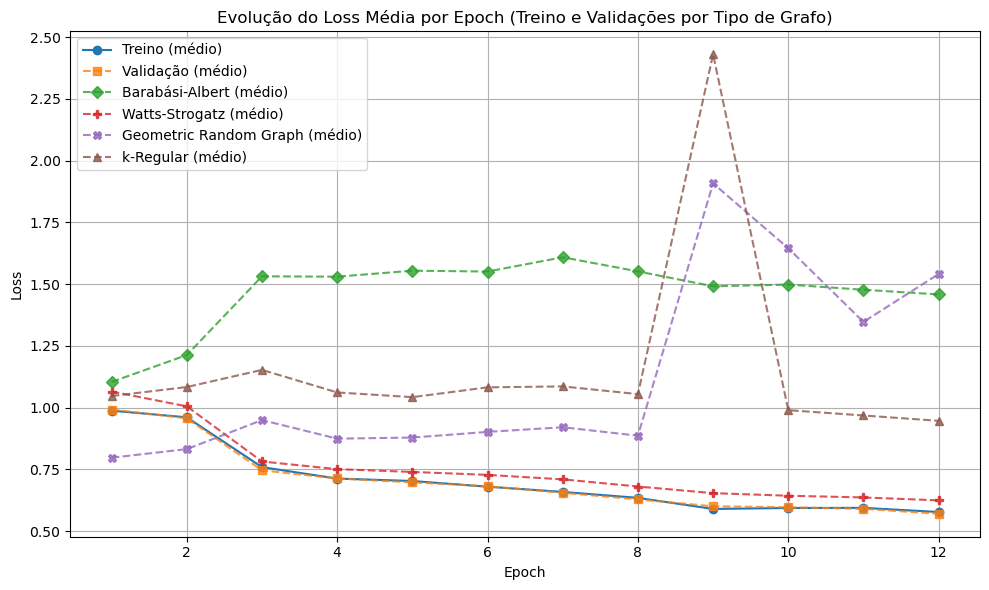

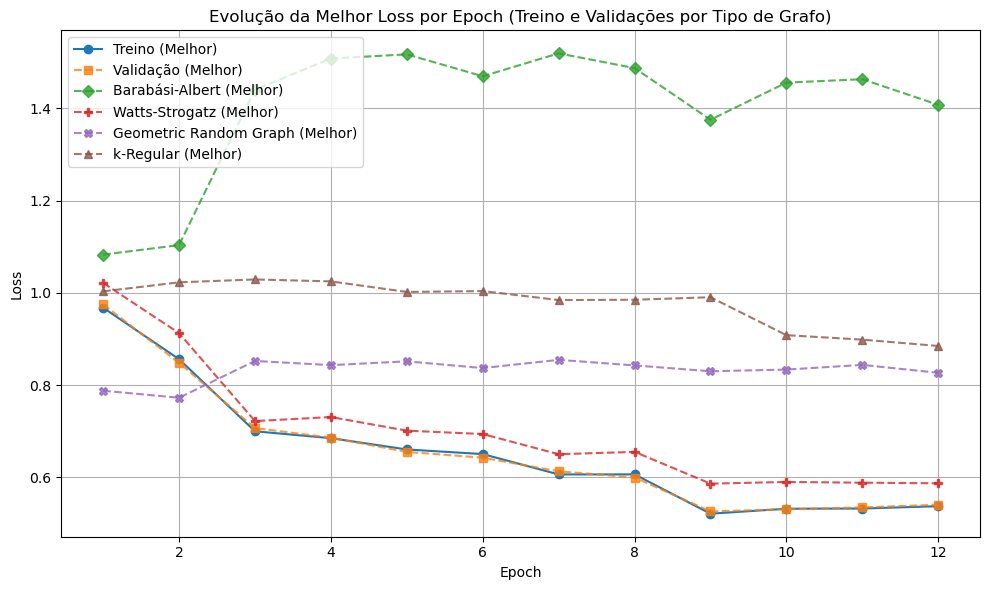

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[14:00:37] Aplicando refinamento com gradiente nos melhores indivíduos...
[14:03:15] Indivíduo 1 refinado com gradiente.
   🔹 LR usado:     5e-5
   🔹 Erro antes:  0.544616
   🔹 Erro depois: 0.493195
   🔹 Diferença:   +0.051421 | Tempo Total: 158.89s
   🔸 Erros por passo: ['0.544616', '0.507262', '0.493195']
[14:06:10] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     5e-4
   🔹 Erro antes:  0.559901
   🔹 Erro depois: 0.685398
   🔹 Diferença:   -0.125497 | Tempo Total: 174.41s
   🔸 Erros por passo: ['0.559901', '0.756962', '0.685398']
Indivíduo salvo como era ANTES do gradiente
[14:08:53] Indivíduo 5 refinado com gradiente.
   🔹 LR usado:     1e-3
   🔹 Erro antes:  0.619177
   🔹 Erro depois: 3.756095
   🔹 Diferença:   -3.136917 | Tempo Total: 163.06s
   🔸 Erros por passo: ['0.619177', '3.968329', 

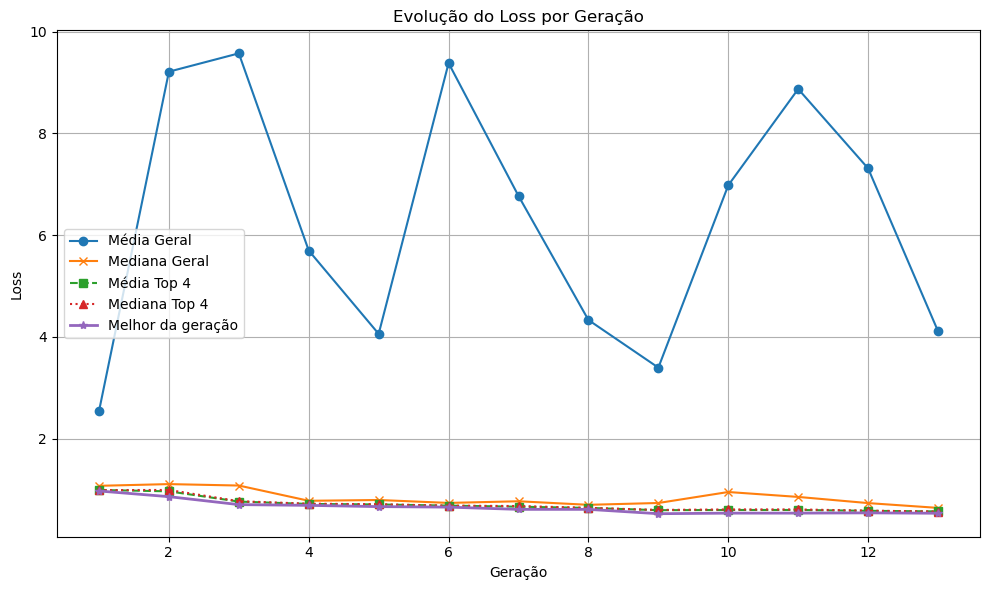

[Epoch 14] Média Geral: 4.1103 | Mediana Geral: 0.6350 | Média Top 4: 0.5657 | Mediana Top 4: 0.5618 | Melhor: 0.5297 | Tempo: 1023.35s


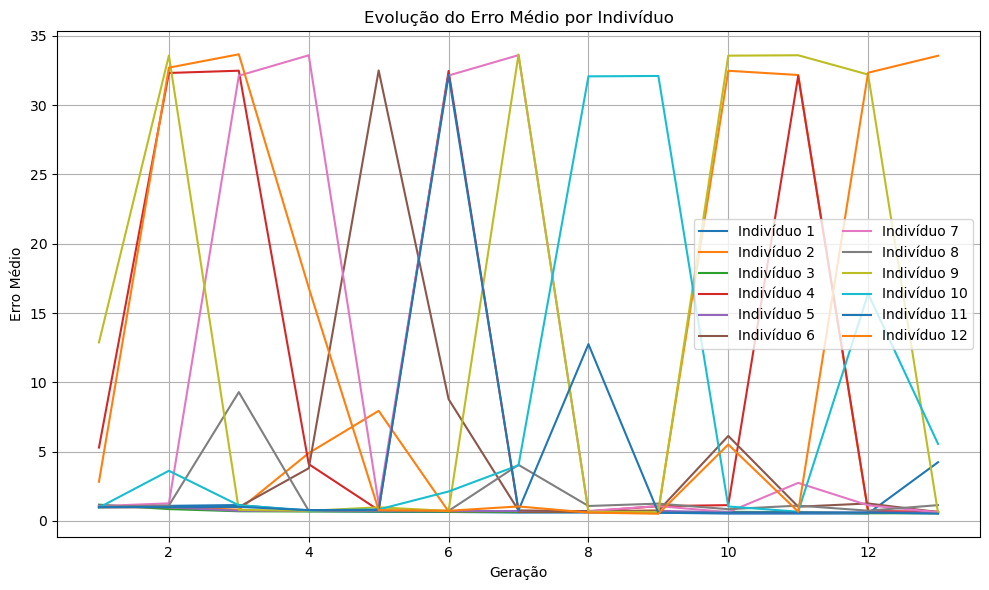

[14:28:38] Média dos top 4: 0.5657 | Mediana: 0.5618
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5197 | min: 0.0144 | max: 2.0398 | std: 0.4517 | grad: False | numel: 4000 | sum: 2078.8464
[Batch 0] erro hist          → mean: 0.5222 | min: 0.0201 | max: 1.4504 | std: 0.3360 | grad: False | numel: 4000 | sum: 2088.9160
[Batch 0] erro hist**1.5     → mean: 0.4353 | min: 0.0029 | max: 1.7467 | std: 0.3890 | grad: False | numel: 4000 | sum: 1741.2377
[Batch 0] erro dens          → mean: 0.1696 | min: 0.0000 | max: 0.4413 | std: 0.1268 | grad: False | numel: 4000 | sum: 678.5931
[Batch 0] erro dens**1.5     → mean: 0.0844 | min: 0.0000 | max: 0.2931 | std: 0.0845 | grad: False | numel: 4000 | sum: 337.6089
📊 [Batch 0] 3539 grafos únicos | Mais repetido apareceu 55x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5197
[Batch 0] final_losses       → mean: 0.5416 | min: 0.0141 | max: 2.0981 | std: 0.4630 | grad: False | numel: 4000 | sum: 2166.3440
[Batch 0] erro hi

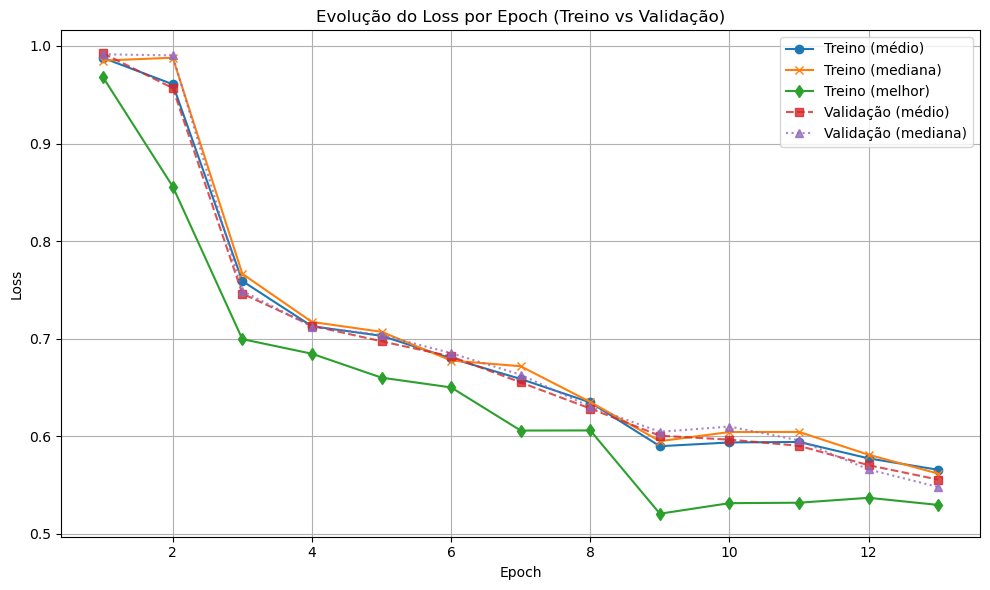

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.3839 | min: 0.0186 | max: 4.1657 | std: 1.1742 | grad: False | numel: 4000 | sum: 5535.5879
[Batch 0] erro hist          → mean: 1.1199 | min: 0.0586 | max: 2.5590 | std: 0.7066 | grad: False | numel: 4000 | sum: 4479.6235
[Batch 0] erro hist**1.5     → mean: 1.3620 | min: 0.0142 | max: 4.0935 | std: 1.1726 | grad: False | numel: 4000 | sum: 5448.0503
[Batch 0] erro dens          → mean: 0.0712 | min: 0.0001 | max: 0.2109 | std: 0.0459 | grad: False | numel: 4000 | sum: 284.7442
[Batch 0] erro dens**1.5     → mean: 0.0219 | min: 0.0000 | max: 0.0968 | std: 0.0206 | grad: False | numel: 4000 | sum: 87.5376
📊 [Batch 0] 3267 grafos únicos | Mais repetido apareceu 62x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.3839
[Batch 0] final_losses       → mean: 1.3797 | min: 0.0293 | max: 4.2537 | std: 1.1752 | grad: False | numel: 4000 | sum: 5518.8286
[Batch 0] erro hist          → mean: 1.1201 | min: 0.0804 | max: 2.5

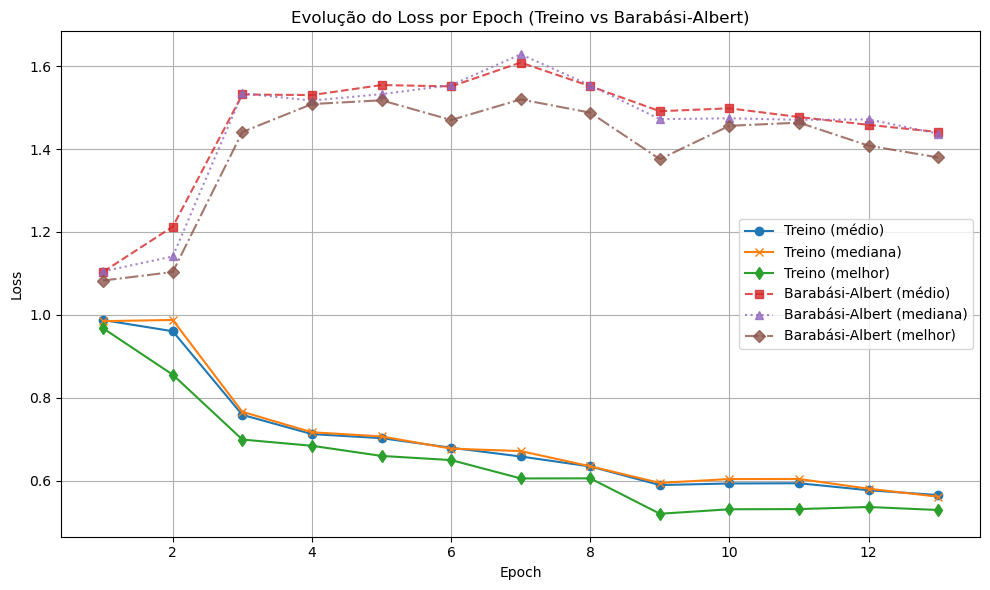

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5716 | min: 0.0118 | max: 1.9103 | std: 0.5133 | grad: False | numel: 4000 | sum: 2286.2866
[Batch 0] erro hist          → mean: 0.5585 | min: 0.0231 | max: 1.4880 | std: 0.3761 | grad: False | numel: 4000 | sum: 2234.0649
[Batch 0] erro hist**1.5     → mean: 0.4866 | min: 0.0035 | max: 1.8151 | std: 0.4619 | grad: False | numel: 4000 | sum: 1946.5247
[Batch 0] erro dens          → mean: 0.1727 | min: 0.0001 | max: 0.4225 | std: 0.1208 | grad: False | numel: 4000 | sum: 690.6376
[Batch 0] erro dens**1.5     → mean: 0.0849 | min: 0.0000 | max: 0.2746 | std: 0.0801 | grad: False | numel: 4000 | sum: 339.7622
📊 [Batch 0] 3080 grafos únicos | Mais repetido apareceu 51x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5716
[Batch 0] final_losses       → mean: 0.6170 | min: 0.0111 | max: 1.8837 | std: 0.5306 | grad: False | numel: 4000 | sum: 2468.0564
[Batch 0] erro hist          → mean: 0.5959 | min: 0.0222 | max: 1.

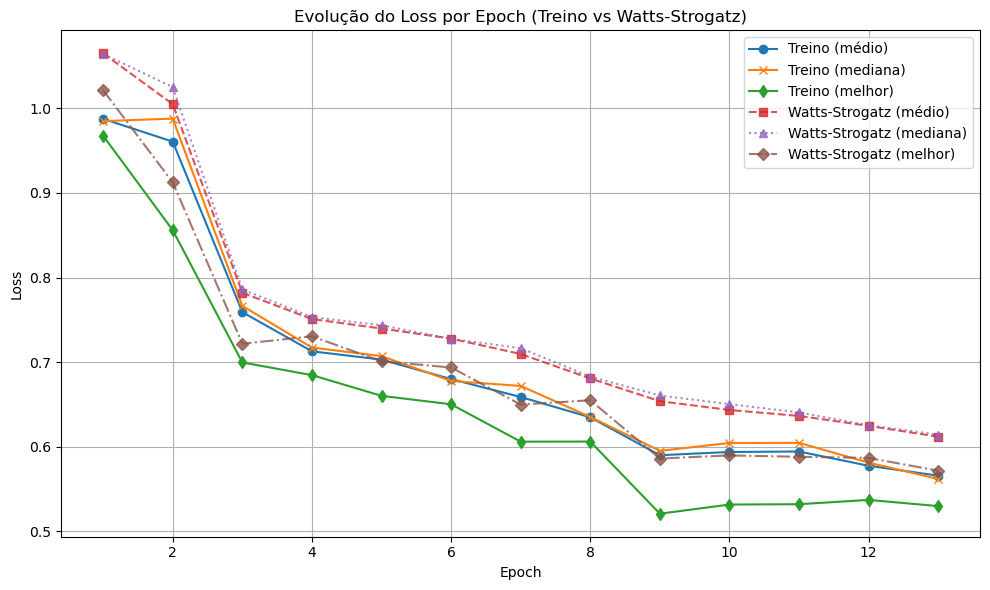

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7905 | min: 0.1403 | max: 2.8104 | std: 0.5167 | grad: False | numel: 4000 | sum: 3161.9902
[Batch 0] erro hist          → mean: 0.7803 | min: 0.2634 | max: 1.9392 | std: 0.3538 | grad: False | numel: 4000 | sum: 3121.3184
[Batch 0] erro hist**1.5     → mean: 0.7416 | min: 0.1352 | max: 2.7004 | std: 0.4904 | grad: False | numel: 4000 | sum: 2966.2639
[Batch 0] erro dens          → mean: 0.1243 | min: 0.0002 | max: 0.2357 | std: 0.0673 | grad: False | numel: 4000 | sum: 497.0883
[Batch 0] erro dens**1.5     → mean: 0.0489 | min: 0.0000 | max: 0.1144 | std: 0.0341 | grad: False | numel: 4000 | sum: 195.7263
📊 [Batch 0] 2432 grafos únicos | Mais repetido apareceu 89x | Excesso = 9 | Penalização = 1.5
[GRG] Indivíduo 0: Erro médio = 2.2905
[Batch 0] final_losses       → mean: 0.8129 | min: 0.1401 | max: 2.8424 | std: 0.5490 | grad: False | numel: 4000 | sum: 3251.5259
[Batch 0] erro hist          → mean: 0.7922 | min: 0.2650 | max: 

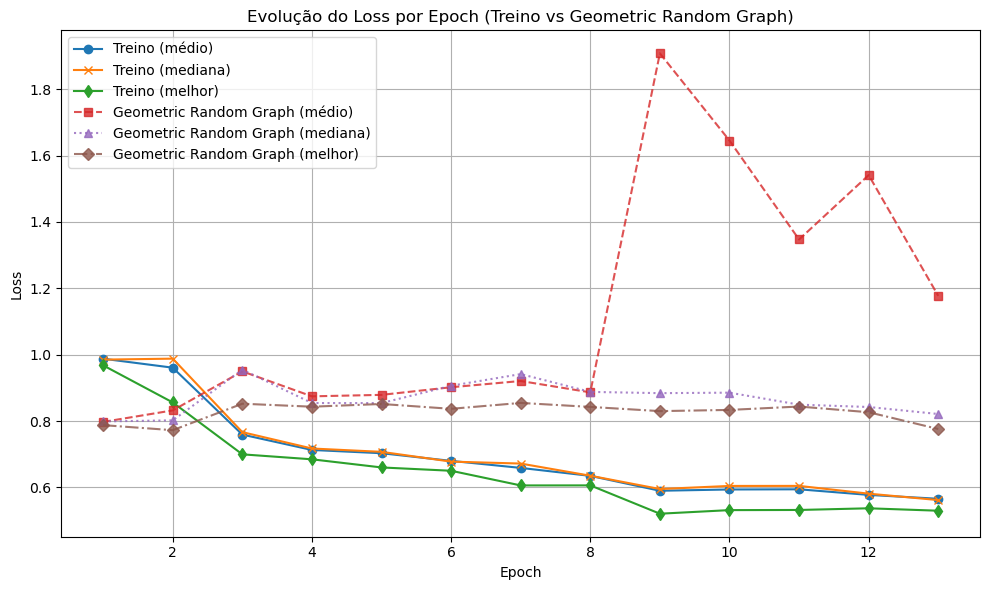

VALIDAÇÃO - KR:

[Batch 0] final_losses       → mean: 0.9122 | min: 0.0115 | max: 1.9392 | std: 0.6150 | grad: False | numel: 4000 | sum: 3648.9011
[Batch 0] erro hist          → mean: 0.8316 | min: 0.0184 | max: 1.5035 | std: 0.4493 | grad: False | numel: 4000 | sum: 3326.5400
[Batch 0] erro hist**1.5     → mean: 0.8464 | min: 0.0025 | max: 1.8435 | std: 0.5872 | grad: False | numel: 4000 | sum: 3385.7734
[Batch 0] erro dens          → mean: 0.1508 | min: 0.0001 | max: 0.4224 | std: 0.0860 | grad: False | numel: 4000 | sum: 603.1075
[Batch 0] erro dens**1.5     → mean: 0.0658 | min: 0.0000 | max: 0.2745 | std: 0.0530 | grad: False | numel: 4000 | sum: 263.1277
📊 [Batch 0] 2566 grafos únicos | Mais repetido apareceu 40x | Excesso = 0 | Penalização = 0.0
[KR] Indivíduo 0: Erro médio = 0.9122
[Batch 0] final_losses       → mean: 0.9148 | min: 0.0195 | max: 2.0981 | std: 0.6042 | grad: False | numel: 4000 | sum: 3659.1958
[Batch 0] erro hist          → mean: 0.8375 | min: 0.0302 | max: 1.

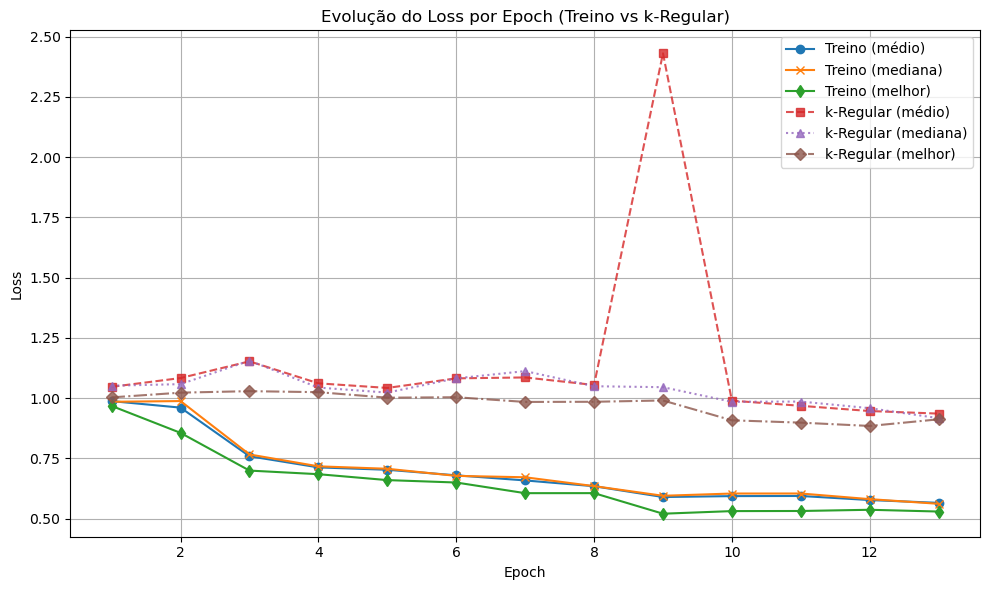

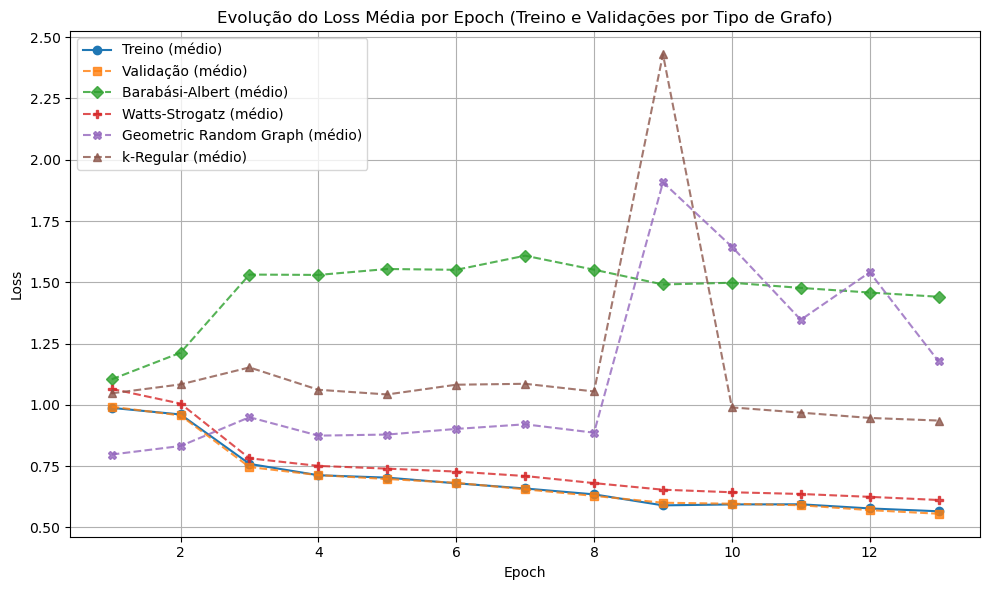

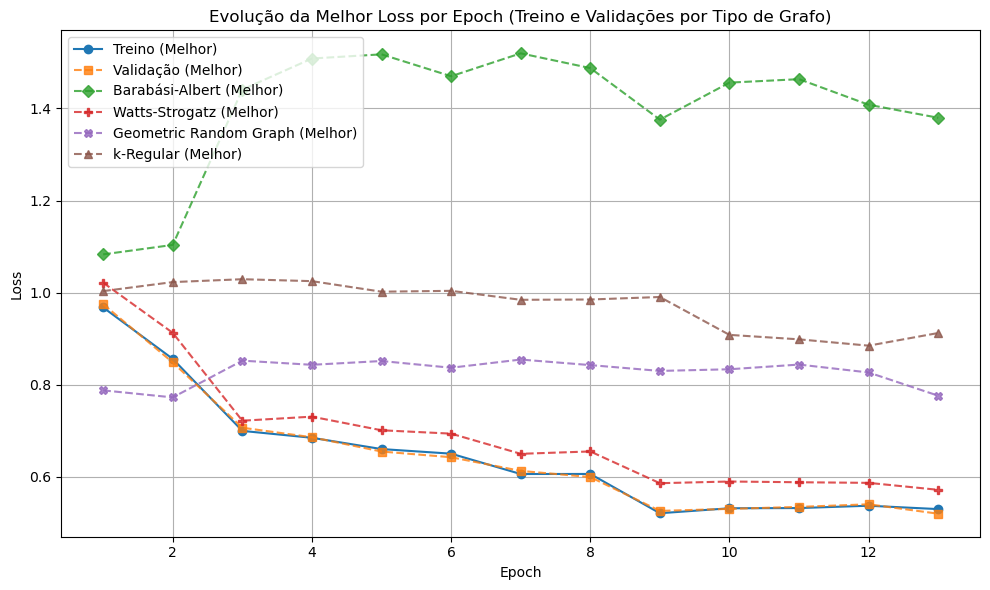

📄 Tabela de erros por geração atualizada: teste_genetico_40/erro//erros_individuos_por_geracao.csv
📄 Tabela de erros dos TOP 4 salva em: teste_genetico_40/erro//erros_TOP4_por_geracao.csv

[14:41:11] Aplicando refinamento com gradiente nos melhores indivíduos...
[14:43:44] Indivíduo 11 refinado com gradiente.
   🔹 LR usado:     5e-3
   🔹 Erro antes:  0.519876
   🔹 Erro depois: 28.046473
   🔹 Diferença:   -27.526596 | Tempo Total: 152.65s
   🔸 Erros por passo: ['0.519876', '9.257038', '28.046473']
Indivíduo salvo como era ANTES do gradiente
[14:46:25] Indivíduo 3 refinado com gradiente.
   🔹 LR usado:     1e-3
   🔹 Erro antes:  0.542083
   🔹 Erro depois: 2.715372
   🔹 Diferença:   -2.173289 | Tempo Total: 161.29s
   🔸 Erros por passo: ['0.542083', '0.774105', '2.715372']
Indivíduo salvo como era ANTES do gradiente
[14:48:54] Indivíduo 9 refinado com gradiente.
   🔹 LR usado:     1e-5
   🔹 Erro antes:  0.560024
   🔹 Erro depois: 0.519838
   🔹 Diferença:   +0.040186 | Tempo Total: 148.98s

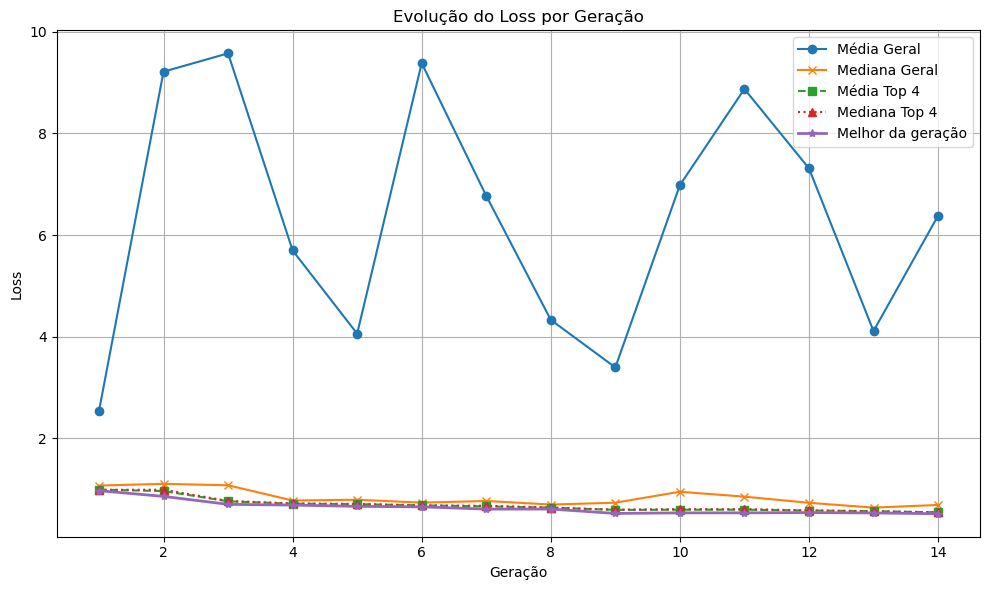

[Epoch 15] Média Geral: 6.3809 | Mediana Geral: 0.6874 | Média Top 4: 0.5422 | Mediana Top 4: 0.5416 | Melhor: 0.5152 | Tempo: 1148.03s


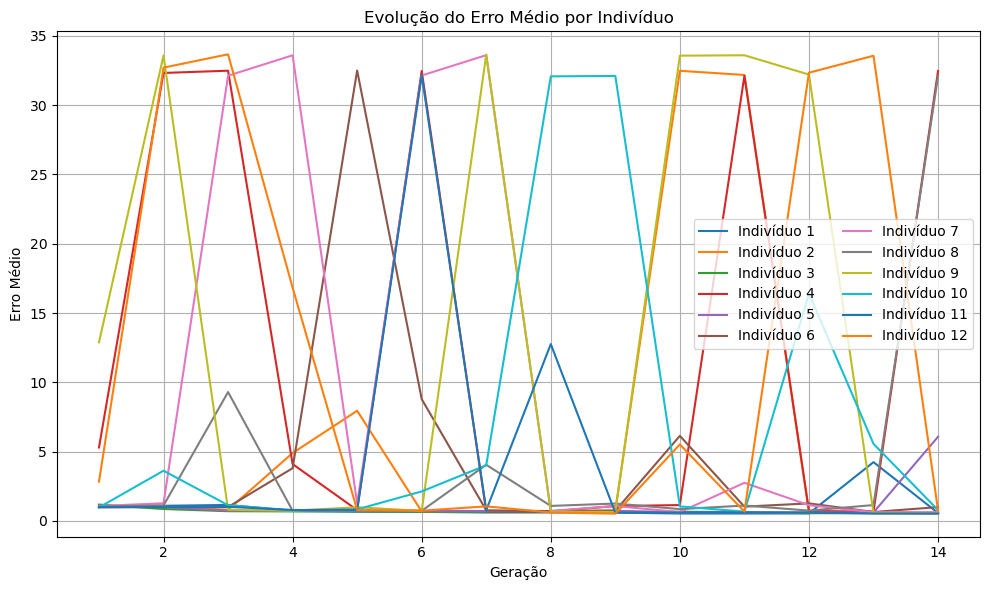

[15:11:13] Média dos top 4: 0.5422 | Mediana: 0.5416
VALIDAÇÃO :

[Batch 0] final_losses       → mean: 0.5094 | min: 0.0143 | max: 1.9553 | std: 0.4293 | grad: False | numel: 4000 | sum: 2037.4883
[Batch 0] erro hist          → mean: 0.5165 | min: 0.0190 | max: 1.4055 | std: 0.3249 | grad: False | numel: 4000 | sum: 2066.1736
[Batch 0] erro hist**1.5     → mean: 0.4258 | min: 0.0026 | max: 1.6663 | std: 0.3720 | grad: False | numel: 4000 | sum: 1703.1505
[Batch 0] erro dens          → mean: 0.1693 | min: 0.0000 | max: 0.4371 | std: 0.1241 | grad: False | numel: 4000 | sum: 677.2363
[Batch 0] erro dens**1.5     → mean: 0.0836 | min: 0.0000 | max: 0.2890 | std: 0.0826 | grad: False | numel: 4000 | sum: 334.3378
📊 [Batch 0] 3719 grafos únicos | Mais repetido apareceu 27x | Excesso = 0 | Penalização = 0.0
[VAL] Indivíduo 0: Erro médio = 0.5094
[Batch 0] final_losses       → mean: 0.5191 | min: 0.0167 | max: 2.0398 | std: 0.4450 | grad: False | numel: 4000 | sum: 2076.2339
[Batch 0] erro hi

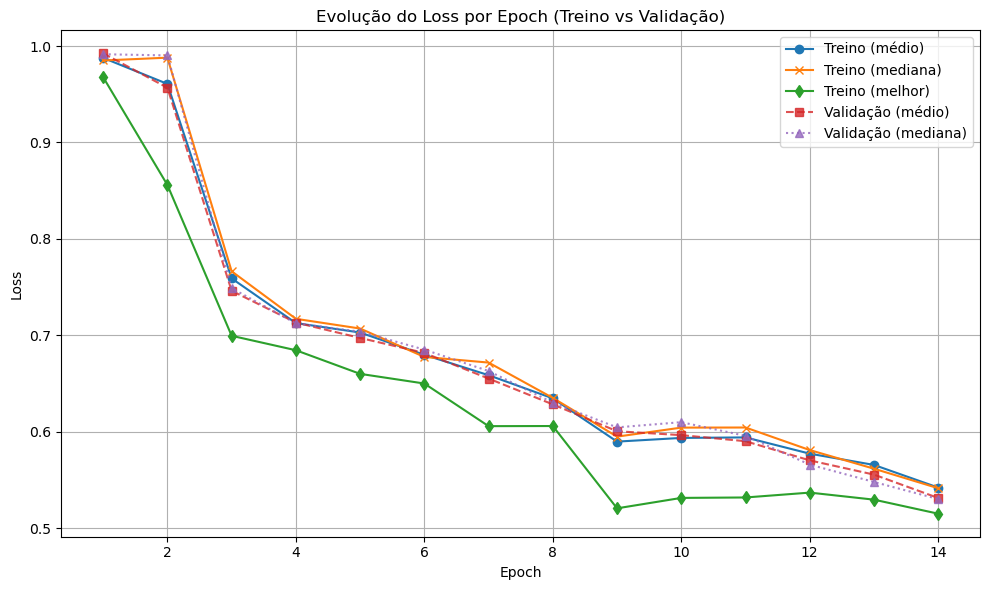

VALIDAÇÃO - BA:

[Batch 0] final_losses       → mean: 1.4620 | min: 0.0277 | max: 4.3077 | std: 1.1874 | grad: False | numel: 4000 | sum: 5848.1963
[Batch 0] erro hist          → mean: 1.1704 | min: 0.0767 | max: 2.6092 | std: 0.7078 | grad: False | numel: 4000 | sum: 4681.7461
[Batch 0] erro hist**1.5     → mean: 1.4408 | min: 0.0213 | max: 4.2146 | std: 1.1866 | grad: False | numel: 4000 | sum: 5763.1973
[Batch 0] erro dens          → mean: 0.0698 | min: 0.0000 | max: 0.2070 | std: 0.0450 | grad: False | numel: 4000 | sum: 279.0659
[Batch 0] erro dens**1.5     → mean: 0.0212 | min: 0.0000 | max: 0.0942 | std: 0.0198 | grad: False | numel: 4000 | sum: 84.9990
📊 [Batch 0] 3367 grafos únicos | Mais repetido apareceu 22x | Excesso = 0 | Penalização = 0.0
[BA] Indivíduo 0: Erro médio = 1.4620
[Batch 0] final_losses       → mean: 1.3742 | min: 0.0186 | max: 4.1638 | std: 1.1738 | grad: False | numel: 4000 | sum: 5496.6943
[Batch 0] erro hist          → mean: 1.1133 | min: 0.0586 | max: 2.5

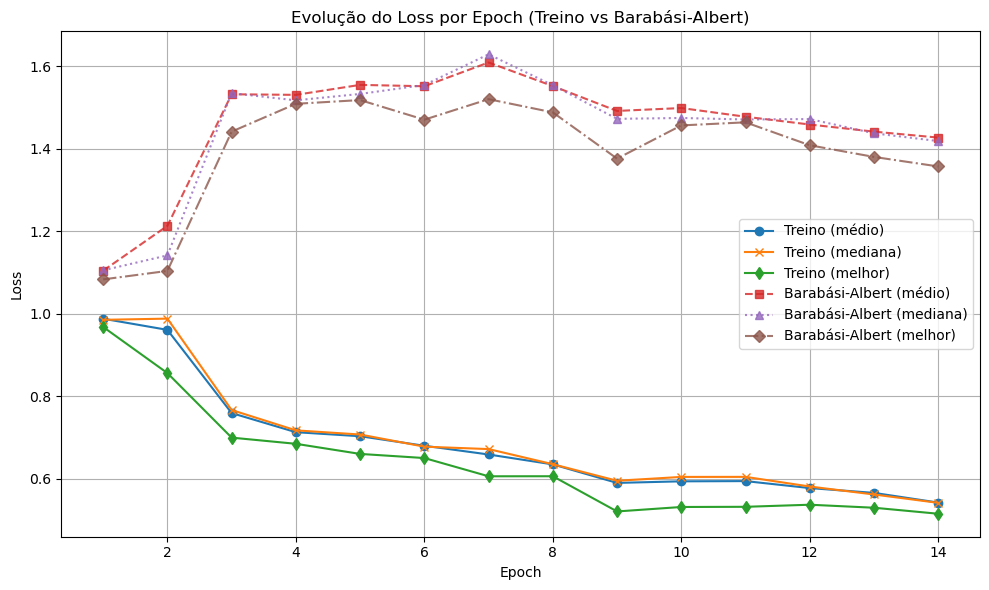

VALIDAÇÃO - WS:

[Batch 0] final_losses       → mean: 0.5608 | min: 0.0140 | max: 1.8876 | std: 0.4922 | grad: False | numel: 4000 | sum: 2243.3333
[Batch 0] erro hist          → mean: 0.5519 | min: 0.0295 | max: 1.4770 | std: 0.3645 | grad: False | numel: 4000 | sum: 2207.6560
[Batch 0] erro hist**1.5     → mean: 0.4756 | min: 0.0051 | max: 1.7950 | std: 0.4415 | grad: False | numel: 4000 | sum: 1902.5427
[Batch 0] erro dens          → mean: 0.1726 | min: 0.0001 | max: 0.4194 | std: 0.1221 | grad: False | numel: 4000 | sum: 690.5026
[Batch 0] erro dens**1.5     → mean: 0.0852 | min: 0.0000 | max: 0.2716 | std: 0.0809 | grad: False | numel: 4000 | sum: 340.7905
📊 [Batch 0] 3248 grafos únicos | Mais repetido apareceu 37x | Excesso = 0 | Penalização = 0.0
[WS] Indivíduo 0: Erro médio = 0.5608
[Batch 0] final_losses       → mean: 0.5905 | min: 0.0130 | max: 1.9093 | std: 0.5199 | grad: False | numel: 4000 | sum: 2362.1409
[Batch 0] erro hist          → mean: 0.5722 | min: 0.0189 | max: 1.

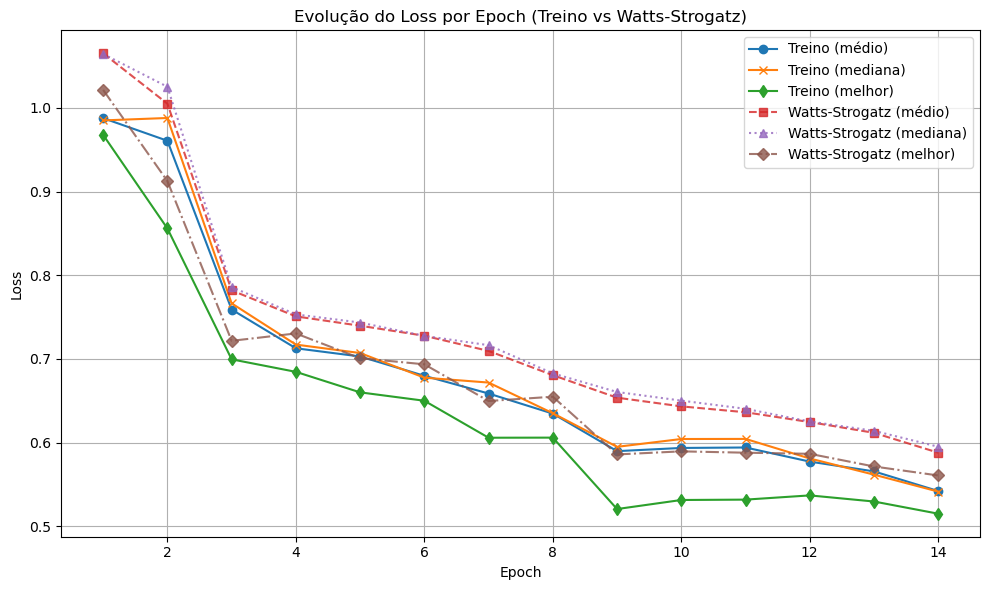

VALIDAÇÃO - GRG:

[Batch 0] final_losses       → mean: 0.7838 | min: 0.1039 | max: 3.2280 | std: 0.5134 | grad: False | numel: 4000 | sum: 3135.2578
[Batch 0] erro hist          → mean: 0.7768 | min: 0.2177 | max: 2.1805 | std: 0.3521 | grad: False | numel: 4000 | sum: 3107.3669
[Batch 0] erro hist**1.5     → mean: 0.7365 | min: 0.1016 | max: 3.2198 | std: 0.4881 | grad: False | numel: 4000 | sum: 2946.0464
[Batch 0] erro dens          → mean: 0.1215 | min: 0.0000 | max: 0.2318 | std: 0.0660 | grad: False | numel: 4000 | sum: 485.8730
[Batch 0] erro dens**1.5     → mean: 0.0473 | min: 0.0000 | max: 0.1116 | std: 0.0331 | grad: False | numel: 4000 | sum: 189.2113
📊 [Batch 0] 2653 grafos únicos | Mais repetido apareceu 121x | Excesso = 41 | Penalização = 3.2015621662139893
[GRG] Indivíduo 0: Erro médio = 3.9854
[Batch 0] final_losses       → mean: 0.7943 | min: 0.1318 | max: 2.7151 | std: 0.5158 | grad: False | numel: 4000 | sum: 3177.1045
[Batch 0] erro hist          → mean: 0.7834 | mi

RuntimeError: CUDA error: unspecified launch failure
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [71]:
for geracao in range(geracao_inicial + 1, num_geracoes):
    print(f"\n🌱 Geração {geracao} - Testando indivíduos...")
    start_geracao_time = time()
    batch_tensor_list = [batch[0].to(device) for batch in dataloader]
    
    # Concatena todos os tensores da geração atual (1D por grafo)
    all_graphs = torch.cat(batch_tensor_list, dim=0)
    bin_all_graphs = (all_graphs >= 0.5).int().cpu().numpy()

    # Converte para tuplas hasháveis e conta frequência
    tuplas_grafos = [tuple(g) for g in bin_all_graphs]
    contagem = Counter(tuplas_grafos)
    
    num_unicos = len(contagem)
    mais_frequente = contagem.most_common(1)[0][1]
    
    print(f"\n📦 Batch fixado da geração {geracao}: {num_unicos} grafos únicos | Mais repetido apareceu {mais_frequente}x\n")

    erros_pop = []
    for idx, net in enumerate(populacao):
        start_ind_time = time()
        net.eval()
        total_loss = 0.0
        with torch.no_grad():
            nome_pasta = nome_pasta_raiz + f'_individuo_{idx}'
            garantir_pasta(f"{nome_pasta}/graficos")
            garantir_pasta(f"{nome_pasta}/graficos_val")
            garantir_pasta(f"{nome_pasta}/respostas")
            garantir_pasta(f"{nome_pasta}/bias")
            garantir_pasta(f"{nome_pasta}/weight")
            visualizar_bias_colunas(net, geracao, nome_pasta)
            visualizar_weight_colunas(net, geracao, nome_pasta)
            visualizar_resposta_por_entrada(net, vetores_fixos, geracao, nome_pasta)
            # Visualiza apenas um grafo exemplo por indivíduo
            batch_visual = next(iter(dataloader))
            batch_tensor_visual = batch_visual[0].to(device)
            outputs_visual = net(batch_tensor_visual)
            printa_grafos(net, outputs_visual, batch_tensor_visual, idx=0, epoch=geracao,salvar_em_base=f"{nome_pasta}/graficos_visuais_individuo", erro_layer_list=[], titulo_prefixo=f"Indivíduo {idx+1}", printar=False)

            todos_final_losses = []
            todos_final_losses_aux = []
            todos_final_losses_dens_aux = []

            for batch_idx, batch in enumerate(batch_tensor_list):
                batch_tensor = batch #[0].to(device)
                outputs = net(batch_tensor)
                contexto_log = {'batch_idx': batch_idx,'individuo_idx': idx,'geracao': geracao,'salvar_em': f"{nome_pasta}/detalhes_loss.txt"}
                loss_layers, lista_erros_grafos_batch = criterion_layers(batch_tensor, outputs, contexto_log=contexto_log)
                total_loss += loss_layers.item()
                
                final_losses, final_losses_aux, final_losses_dens_aux = lista_erros_grafos_batch
                todos_final_losses.extend([x.detach().cpu() for x in final_losses])
                todos_final_losses_aux.extend([x.detach().cpu() for x in final_losses_aux])
                todos_final_losses_dens_aux.extend([x.detach().cpu() for x in final_losses_dens_aux])

        plot_erro_batch_ordenado(final_losses=todos_final_losses,final_losses_aux=todos_final_losses_aux,final_losses_dens_aux=todos_final_losses_dens_aux,titulo=f"Geração {geracao} | Indivíduo {idx} | Todos os grafos",salvar_em=f"{nome_pasta}/detalhes_loss.txt",epoch=geracao)
        
        erro_medio = total_loss / len(dataloader)
        erros_individuais_ao_longo[idx].append(erro_medio)
        erros_pop.append((erro_medio, net))
        horario_atual = datetime.now().strftime("%H:%M:%S")
        print(f"[{horario_atual}] Indivíduo {idx}: Erro médio = {erro_medio:.4f} | Tempo: {time() - start_ind_time:.2f}s\n")

    # ✅ Associa cada erro à posição real do indivíduo
    erros_com_indices = [(idx, erro_pop[0]) for idx, erro_pop in enumerate(erros_pop)]
    
    # ✅ Ordena pelos menores erros apenas para encontrar os melhores
    erros_ordenados = sorted(erros_com_indices, key=lambda x: x[1])
    
    # ✅ Salva os índices REAIS dos top_k melhores antes de qualquer mutação
    indices_top_k_anteriores = [idx for idx, _ in erros_ordenados[:top_k]]
    
    # ✅ Print explicativo dos top_k
    print(f"🏅 Top_k indivíduos da geração (posições reais):")
    for rank, (idx, err) in enumerate(erros_ordenados[:top_k]):
        print(f"   🔹 Rank {rank+1}: Indivíduo {idx} | Erro = {err:.6f}")

    # # Detecta mudança nos melhores
    # if geracao > 1 and 'ultimos_indices_top_k' in locals():
    #     for i, idx in enumerate(indices_top_k_anteriores):
    #         if idx != ultimos_indices_top_k[i]:
    #             print(f"⚠️ Indivíduo top {i+1} mudou de índice: {ultimos_indices_top_k[i]} → {idx}")
    ultimos_indices_top_k = indices_top_k_anteriores.copy()
    
    # Seleciona os top_k melhores
    erros_pop.sort(key=lambda x: x[0])
    melhores = [net for (_, net) in erros_pop[:top_k]]
    melhor_erro = erros_pop[0][0]
    melhor_erro_por_geracao.append(melhor_erro)
    print(f"\n🏆 Melhor da geração: Erro {melhor_erro:.4f}")

    # Salvar média e mediana dos top_k melhores da geração
    # Calcula estatísticas da geração inteira
    todos_erros = [erro for (erro, _) in erros_pop]
    media_geral = np.mean(todos_erros)
    mediana_geral = np.median(todos_erros)
    media_geral_por_geracao.append(media_geral)
    mediana_geral_por_geracao.append(mediana_geral)
    
    # Calcula estatísticas do top_k
    top_k_erros = [erro for (erro, _) in erros_pop[:top_k]]
    media_topk = np.mean(top_k_erros)
    mediana_topk = np.median(top_k_erros)
    media_topk_por_geracao.append(media_topk)
    mediana_topk_por_geracao.append(mediana_topk)

    printa_erro_treino(epoch=geracao,media_geral_por_geracao=media_geral_por_geracao,mediana_geral_por_geracao=mediana_geral_por_geracao,
    media_topk_por_geracao=media_topk_por_geracao,mediana_topk_por_geracao=mediana_topk_por_geracao,melhor_erro_por_geracao=melhor_erro_por_geracao,  # ⬅️ novo
    start_epoch_time=start_geracao_time,salvar_em_base=nome_pasta_raiz,top_k=top_k)
    printa_erro_individuos(erros_individuais_ao_longo, salvar_em_base=nome_pasta_raiz)

    horario_atual = datetime.now().strftime("%H:%M:%S")
    print(f"[{horario_atual}] Média dos top {top_k}: {media_topk:.4f} | Mediana: {mediana_topk:.4f}")

    # ================================
    # ✅ VALIDAÇÃO
    # ================================
    print("VALIDAÇÃO :\n")
    media_val, mediana_val, melhor_val = validar_topk_em_dataloader(dataloader=dataloader_val,top_k_models=melhores,geracao=geracao,nome_gerador="VAL",nome_pasta_raiz=nome_pasta_raiz,criterion_layers=criterion_layers)
    epoch_val_losses.append(media_val)
    epoch_val_median_losses.append(mediana_val)
    epoch_val_melhor_losses.append(melhor_val)
    
    # ✅ Gráfico de treino + validação
    printa_erro_treino_val(epoch_losses=media_topk_por_geracao, epoch_median_losses=mediana_topk_por_geracao, epoch_val_losses=epoch_val_losses, epoch_val_median_losses=epoch_val_median_losses,
                           salvar_em=f"{nome_pasta_raiz}/erro/loss_treino_vs_VAL.png",melhor_erro_por_geracao=melhor_erro_por_geracao, nome_val="Validação")

    # ================================
    # ✅ VALIDAÇÃO - Barabási-Albert
    # ================================
    print("VALIDAÇÃO - BA:\n")
    media_BA, mediana_BA, melhor_BA = validar_topk_em_dataloader(dataloader=dataloader_BA,top_k_models=melhores,geracao=geracao,nome_gerador="BA",nome_pasta_raiz=nome_pasta_raiz,criterion_layers=criterion_layers)
    epoch_val_losses_BA.append(media_BA)
    epoch_val_median_losses_BA.append(mediana_BA)
    epoch_val_melhor_losses_BA.append(melhor_BA)
    # ✅ Gráfico de treino + BA
    printa_erro_treino_val(epoch_losses=media_topk_por_geracao, epoch_median_losses=mediana_topk_por_geracao, epoch_val_losses=epoch_val_losses_BA, epoch_val_median_losses=epoch_val_median_losses_BA, 
                           epoch_val_melhor_losses=epoch_val_melhor_losses_BA, salvar_em=f"{nome_pasta_raiz}/erro/loss_treino_vs_BA.png",melhor_erro_por_geracao=melhor_erro_por_geracao, nome_val="Barabási-Albert")
    
    # ================================
    # ✅ VALIDAÇÃO - Watts-Strogatz
    # ================================
    print("VALIDAÇÃO - WS:\n")
    media_WS, mediana_WS, melhor_WS = validar_topk_em_dataloader(dataloader=dataloader_WS,top_k_models=melhores,geracao=geracao,nome_gerador="WS",nome_pasta_raiz=nome_pasta_raiz,criterion_layers=criterion_layers)
    epoch_val_losses_WS.append(media_WS)
    epoch_val_median_losses_WS.append(mediana_WS)
    epoch_val_melhor_losses_WS.append(melhor_WS)

    # ✅ Gráfico de treino + WS
    printa_erro_treino_val(epoch_losses=media_topk_por_geracao, epoch_median_losses=mediana_topk_por_geracao, epoch_val_losses=epoch_val_losses_WS, epoch_val_median_losses=epoch_val_median_losses_WS, 
                           epoch_val_melhor_losses=epoch_val_melhor_losses_WS, salvar_em=f"{nome_pasta_raiz}/erro/loss_treino_vs_WS.png",melhor_erro_por_geracao=melhor_erro_por_geracao, nome_val="Watts-Strogatz")
    
    # ================================
    # ✅ VALIDAÇÃO - GRG
    # ================================
    print("VALIDAÇÃO - GRG:\n")
    media_GRG, mediana_GRG, melhor_GRG = validar_topk_em_dataloader(dataloader=dataloader_GRG,top_k_models=melhores,geracao=geracao,nome_gerador="GRG",nome_pasta_raiz=nome_pasta_raiz,criterion_layers=criterion_layers)
    epoch_val_losses_GRG.append(media_GRG)
    epoch_val_median_losses_GRG.append(mediana_GRG)
    epoch_val_melhor_losses_GRG.append(melhor_GRG)
    printa_erro_treino_val(epoch_losses=media_topk_por_geracao, epoch_median_losses=mediana_topk_por_geracao, epoch_val_losses=epoch_val_losses_GRG, epoch_val_median_losses=epoch_val_median_losses_GRG, 
                           epoch_val_melhor_losses=epoch_val_melhor_losses_GRG, salvar_em=f"{nome_pasta_raiz}/erro/loss_treino_vs_GRG.png",melhor_erro_por_geracao=melhor_erro_por_geracao, nome_val="Geometric Random Graph")

    # ================================
    # ✅ VALIDAÇÃO - KR
    # ================================
    print("VALIDAÇÃO - KR:\n")
    media_KR, mediana_KR, melhor_KR = validar_topk_em_dataloader(dataloader=dataloader_KR,top_k_models=melhores,geracao=geracao,nome_gerador="KR",nome_pasta_raiz=nome_pasta_raiz,criterion_layers=criterion_layers)
    epoch_val_losses_KR.append(media_KR)
    epoch_val_median_losses_KR.append(mediana_KR)
    epoch_val_melhor_losses_KR.append(melhor_KR)
    printa_erro_treino_val(epoch_losses=media_topk_por_geracao, epoch_median_losses=mediana_topk_por_geracao, epoch_val_losses=epoch_val_losses_KR, epoch_val_median_losses=epoch_val_median_losses_KR, 
                           epoch_val_melhor_losses=epoch_val_melhor_losses_KR, salvar_em=f"{nome_pasta_raiz}/erro/loss_treino_vs_KR.png",melhor_erro_por_geracao=melhor_erro_por_geracao, nome_val="k-Regular")


    # ✅ Gráfico de treino + VAL + BA + WS + GRG + KR
    printa_erro_comparativo(epoch_losses=media_topk_por_geracao,epoch_val_losses=epoch_val_losses,epoch_BA_losses=epoch_val_losses_BA,
        epoch_WS_losses=epoch_val_losses_WS,epoch_GRG_losses=epoch_val_losses_GRG,epoch_KR_losses=epoch_val_losses_KR,salvar_em=f"{nome_pasta_raiz}/erro/loss_comparativo_tudo.png")
    printa_erro_comparativo_melhor(epoch_losses=melhor_erro_por_geracao,epoch_val_losses=epoch_val_melhor_losses,epoch_BA_losses=epoch_val_melhor_losses_BA,
        epoch_WS_losses=epoch_val_melhor_losses_WS,epoch_GRG_losses=epoch_val_melhor_losses_GRG,epoch_KR_losses=epoch_val_melhor_losses_KR,salvar_em=f"{nome_pasta_raiz}/erro/loss_comparativo_tudo_melhores.png")

    salva_tabela_erros_individuos(erros_individuais_ao_longo, nome_pasta_raiz)
    salva_tabela_erros_topk(erros_individuais_ao_longo, nome_pasta_raiz, top_k)

 
    # ================================
    # 🔧 APLICA GRADIENTE NOS MELHORES
    # ================================
    
    horario_atual = datetime.now().strftime("%H:%M:%S")
    print(f"\n[{horario_atual}] Aplicando refinamento com gradiente nos melhores indivíduos...")
    
    melhores_refinados = []
    batch_tensor = batch_tensor_list[0]  # ⬅️ Usa um dos batches fixos da geração
    
    for i, net_original in enumerate(melhores):
        indice_real = indices_top_k_anteriores[i]  # índice verdadeiro na população
    
        net = copy.deepcopy(net_original).to(device)
        net.train()
        # 🎲 Escolhe LR do tipo 1e-3, 5e-4, etc
        bases = [1, 5]
        exp = np.random.choice([-3, -4, -5])
        base = np.random.choice(bases)
        lr_ind = base * (10.0 ** exp)
        lr_str = f"{base}e{exp}"
    
        optimizer_layer = torch.optim.Adam(net.parameters(), lr=lr_ind)
    
        start_tempo_ind = time()
    
        # Erro antes do gradiente
        with torch.no_grad():
            outputs_antes = net(batch_tensor)
            loss_antes, _ = criterion_layers(batch_tensor, outputs_antes)
            loss_antes = loss_antes.item()
    
        erros_por_step = []
    
        # Refinamento com gradiente
        for grad_step in range(3):
            optimizer_layer.zero_grad()
            outputs = net(batch_tensor)
            loss_layers, _ = criterion_layers(batch_tensor, outputs)
            erros_por_step.append(loss_layers.item())
            loss_layers.backward()
            optimizer_layer.step()
    
        tempo_total = time() - start_tempo_ind
        loss_depois = erros_por_step[-1]  # Último erro registrado
    
        diff = loss_antes - loss_depois
        horario_atual = datetime.now().strftime("%H:%M:%S")
        print(f"[{horario_atual}] Indivíduo {indice_real + 1} refinado com gradiente.")
        print(f"   🔹 LR usado:     {lr_str}")
        print(f"   🔹 Erro antes:  {loss_antes:.6f}")
        print(f"   🔹 Erro depois: {loss_depois:.6f}")
        print(f"   🔹 Diferença:   {diff:+.6f} | Tempo Total: {tempo_total:.2f}s")
        print(f"   🔸 Erros por passo: {[f'{e:.6f}' for e in erros_por_step]}")
    
        # ✅ Salva o refinado
        if loss_depois < loss_antes:
            melhores_refinados.append(net)
        else:
            melhores_refinados.append(net_original)
            print("Indivíduo salvo como era ANTES do gradiente")
    
        # ✅ Libera memória acumulada
        del net, optimizer_layer, outputs, outputs_antes
        torch.cuda.empty_cache()
        gc.collect()

    # =============================
    # 🌱 Nova geração com elitismo fixo nos índices + 2 aleatórios
    # =============================
    
    # Cria nova população com espaços vazios
    nova_populacao = [None] * num_individuos
    
    # Mapeia os melhores para os mesmos índices
    for novo_idx, antigo_idx in enumerate(indices_top_k_anteriores):
        nova_populacao[antigo_idx] = copy.deepcopy(melhores_refinados[novo_idx])
        

    
    # ➕ Adiciona 2 indivíduos totalmente aleatórios
    indices_vagos = [i for i, p in enumerate(nova_populacao) if p is None]
    random.shuffle(indices_vagos)
    
    for _ in range(2):
        if indices_vagos:
            idx_vago = indices_vagos.pop(0)
            novo_aleatorio = Autoencoder_layers().to(device)
            torch.manual_seed(random.randint(0, 1000000))
            novo_aleatorio.apply(custom_weight_init)
            nova_populacao[idx_vago] = novo_aleatorio
    
    # Preenche o restante com mutações dos melhores
    for idx_vago in indices_vagos:
        pai = random.choice(melhores)
        filho = mutar_rede(pai, taxa_mutacao=taxa_mutacao, intensidade_mutacao=intensidade_mutacao)
        nova_populacao[idx_vago] = filho
    
    # Atualiza a população
    populacao = nova_populacao

    tempo_total_geracao = time() - start_geracao_time
    tempo_formatado = str(timedelta(seconds=int(tempo_total_geracao)))
    print(f"\n⏱️ Tempo total da geração {geracao}: {tempo_formatado} ({tempo_total_geracao:.2f} segundos)")

    salva_checkpoint_genetico(
        geracao_atual=geracao,
        populacao=populacao,
        media_geral_por_geracao=media_geral_por_geracao,
        mediana_geral_por_geracao=mediana_geral_por_geracao,
        media_topk_por_geracao=media_topk_por_geracao,
        mediana_topk_por_geracao=mediana_topk_por_geracao,
        melhor_erro_por_geracao=melhor_erro_por_geracao,
        epoch_val_losses=epoch_val_losses,
        epoch_val_median_losses=epoch_val_median_losses,
        epoch_val_melhor_losses=epoch_val_melhor_losses,
        epoch_val_losses_BA=epoch_val_losses_BA,
        epoch_val_median_losses_BA=epoch_val_median_losses_BA,
        epoch_val_melhor_losses_BA=epoch_val_melhor_losses_BA,
        epoch_val_losses_WS=epoch_val_losses_WS,
        epoch_val_median_losses_WS=epoch_val_median_losses_WS,
        epoch_val_melhor_losses_WS=epoch_val_melhor_losses_WS,
        epoch_val_losses_GRG=epoch_val_losses_GRG,
        epoch_val_median_losses_GRG=epoch_val_median_losses_GRG,
        epoch_val_melhor_losses_GRG=epoch_val_melhor_losses_GRG,
        epoch_val_losses_KR=epoch_val_losses_KR,
        epoch_val_median_losses_KR=epoch_val_median_losses_KR,
        epoch_val_melhor_losses_KR=epoch_val_melhor_losses_KR,
        erros_individuais_ao_longo=erros_individuais_ao_longo,
        ultimos_indices_top_k=ultimos_indices_top_k,
        nome_arquivo='checkpoint_genetico.pth'
    )



## Final

In [ ]:
# compara = False
# import torch
# import matplotlib.pyplot as plt
# import networkx as nx
# import os
# from time import time
# def binarizador(tensor, sharpness=60.0):
#     return torch.sigmoid((tensor - 0.5) * sharpness)

# melhor_loss_treino = float('inf')
# melhor_loss_val = float('inf')
  
# # Check if GPU is available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f'Using device: {device}')

# tempo_inicio = time()
# nome_pasta = "teste_genetico_40"

# garantir_pasta(f"{nome_pasta}/graficos")
# garantir_pasta(f"{nome_pasta}/graficos_val")
# garantir_pasta(f"{nome_pasta}/erro_treino")
# garantir_pasta(f"{nome_pasta}/erro_treino_validacao")
# garantir_pasta(f"{nome_pasta}/bias")
# garantir_pasta(f"{nome_pasta}/weight")
# garantir_pasta(f"{nome_pasta}/respostas")
# vetores_fixos = gerar_vetores_input(28)  # se sua entrada for de 28 elementos
# ultima_saida_epoch = None

# # Train autoencoder layers
# print(f"Total de batches no treino: {len(dataloader)}")
# for epoch in range(start_epoch,30):
#     print(f"\n📊 Visualizações no início da epoch {epoch}...")

#     visualizar_bias_colunas(autoencoder_layers, epoch, nome_pasta)
#     visualizar_weight_colunas(autoencoder_layers, epoch, nome_pasta)

#     print(f"\n🎯 Visualização da resposta do modelo para vetores fixos na epoch {epoch}")
#     visualizar_resposta_por_entrada(autoencoder_layers, vetores_fixos, epoch, nome_pasta)

#     if compara: comparar_respostas_finais(autoencoder_layers, vetores_fixos, epoch-1, nome_pasta)
#     compara = True

#     epoch_loss = []
#     start_epoch_time = time()
#     print(f"Total de batches no treino: {len(dataloader)}")
#     for idx, batch in enumerate(dataloader): #loop por cada Batch
#         # Trata Matriz Original
#         batch_tensor = batch[0].to(device).requires_grad_()
#         print(f'len de batch: {len(batch)}')
#         print(f'len de batch_tensor: {len(batch_tensor)}')
#         # input_graph_vector = batch_tensor[0]
#         # output = autoencoder_layers(input_graph_vector)[-1]
#         # original_matrix = batch_tril_to_laplacian(input_graph_vector.unsqueeze(0).to(device))[0]
#         # try:eigenvalues_original = torch.sort(torch.linalg.eigvalsh(original_matrix).real)[0]
#         # except:print(original_matrix)
#         ak = a
#         start = time()
#         optimizer_layers.zero_grad()

#         # Autoencoder e Função de Cust
#         outputs = autoencoder_layers(batch_tensor) 
#         loss_layers = criterion_layers(batch_tensor, outputs, batch_idx=idx) # Erros

#         # PRINTA GRAFOS 
#         if idx % 10 == 0:
#             with torch.no_grad(): printa_grafos(autoencoder_layers, outputs, batch_tensor, idx, epoch,salvar_em_base=f"{nome_pasta}/graficos/epoch_{epoch+1}",erro_layer_list=erro_layer1_list,titulo_prefixo="Treino", printar=True)
   
#         epoch_loss.append(loss_layers.item())
#         loss_layers.backward()
#         # for nome, param in autoencoder_layers.named_parameters():
#         #     if param.grad is not None:
#         #         print(f"{nome} → grad: {param.grad.abs().mean():.6f}")
#         #     else: print("Ta nulo mesmo")
#         optimizer_layers.step()
#         print(f"Tempo: {time() - start}")

#         #def_scheduler(optimizer_layers, scheduler)
        
#     # 🔍 Comparação da saída da epoch com a anterior
#     saida_atual = outputs[-1].detach().cpu()
#     if ultima_saida_epoch is not None:
#         if torch.equal(saida_atual, ultima_saida_epoch):
#             print("⚠️  A saída final da epoch atual é idêntica à da anterior!")
#         elif torch.allclose(saida_atual, ultima_saida_epoch, atol=1e-6):
#             print("⚠️  A saída final da epoch está quase igual à anterior (allclose)")
#     ultima_saida_epoch = saida_atual.clone()

#     #  printa erro treino
#     printa_erro_treino(epoch, epoch_loss, epoch_losses, epoch_median_losses, start_epoch_time, salvar_em_base=f"{nome_pasta}/erro_treino")

#     # ---------------------------------------------------------------------------------
#     # Avaliação no conjunto de validação
#     erro_val_list = []
#     print(f'\n--- Validação após Epoch {epoch+1} ---')
#     with torch.no_grad():
#         for idx, batch in enumerate(dataloader_val):
#             batch_tensor = batch[0].to(device)
#             input_graph_vector = batch_tensor[0]
#             output = autoencoder_layers(input_graph_vector.unsqueeze(0))[-1]
#             bin_out_val = binarizador(output)
    
#             resultado = comparar_grafo_espectral_custom(
#                 input_graph_vector.unsqueeze(0), bin_out_val,
#                 bins=30, sigma=0.2, idx=idx
#             )
    
#             if resultado[0] is not None:
#                 erro_val, erro_hist, erro_dens, penalizacao_valores_altos, eig_o, eig_val, mat_o, mat_val = resultado
#                 erro_val_list.append(erro_val)
    
#             printa_grafos(autoencoder_layers, output, batch_tensor, idx, epoch,
#                           salvar_em_base=f"{nome_pasta}/graficos_val/epoch_{epoch+1}",
#                           erro_layer_list=erro_layer2_list, titulo_prefixo="Validação", printar=False)
    
#         if erro_val_list:
#             media_val = sum(erro_val_list) / len(erro_val_list)
#             print(f"Erro espectral médio na validação: {media_val:.4f}")
#             epoch_val_losses.append(media_val)
#             epoch_val_median_losses.append(float(np.median(erro_val_list)))
#         else:
#             print("Nenhum erro calculado na validação.")
#             epoch_val_losses.append(None)
    
#         # Plot erro treino vs val
#         printa_erro_treino_val(
#             epoch_losses, epoch_median_losses, epoch_val_losses, epoch_val_median_losses,
#             salvar_em=f"{nome_pasta}/erro_treino_validacao/loss_treino_validacao_por_epoch.png"
#         )

    
    
#     media_epoch_loss = sum(epoch_loss) / len(epoch_loss)
#     print(f"Erro Médio da Epoch {epoch}: {media_epoch_loss}")
#     def_scheduler(optimizer_layers, scheduler, media_epoch_loss)

#     salva_checkpoint(autoencoder_layers, optimizer_layers, epoch,
#                  epoch_losses, epoch_median_losses,
#                  epoch_val_losses, epoch_val_median_losses,
#                  erro_layer1_list, erro_layer2_list)
    
# print("\nResultados Finais (Loss médio por Epoch):")
# for i, loss in enumerate(epoch_losses):
#     print(f"Epoch {i+1}: Loss {loss:.4f}")




## final

In [ ]:
# import torch

# def rastrear_ativacoes(model, input_tensor):
#     ativacoes = []
#     x = input_tensor.unsqueeze(0)  # Adiciona batch dimension

#     # Passa pelas camadas do encoder
#     for layer in model.encoder.encoder:
#         if isinstance(layer, nn.Linear):
#             x = layer(x)
#             ativacoes.append(x.detach().cpu().squeeze())
#         else:
#             x = layer(x)

#     # Passa pelas camadas do "brain"
#     for layer in model.brain:
#         if isinstance(layer, nn.Linear):
#             x = layer(x)
#             ativacoes.append(x.detach().cpu().squeeze())
#         else:
#             x = layer(x)

#     return ativacoes

# # Instanciar o modelo
# modelo = Autoencoder_layers()
# modelo.eval()

# # Criar os dois vetores fixos
# input_ones = torch.ones(28)
# input_zeros = torch.zeros(28)

# # Rodar
# print("\n📌 Ativações para entrada: TODOS 1s")
# ativacoes_ones = rastrear_ativacoes(modelo, input_ones)
# for idx, ativ in enumerate(ativacoes_ones):
#     print(f"Camada {idx} → shape: {tuple(ativ.shape)}\n{ativ.numpy()}\n")

# print("\n📌 Ativações para entrada: TODOS 0s")
# ativacoes_zeros = rastrear_ativacoes(modelo, input_zeros)
# for idx, ativ in enumerate(ativacoes_zeros):
#     print(f"Camada {idx} → shape: {tuple(ativ.shape)}\n{ativ.numpy()}\n")


In [ ]:
# import torch
# import matplotlib.pyplot as plt
# import networkx as nx
# import os
# from time import time

# def binarizador(tensor, threshold=0.5):
#     return (tensor > threshold).float()
    
# # Check if GPU is available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f'Using device: {device}')

# # Move modelo e loss para o dispositivo
# # autoencoder_layers = autoencoder_layers.to(device)
# # criterion_layers = criterion_layers.to(device)

# erro_layer1_list = []
# erro_layer2_list = []
# epoch_losses = []
# epoch_median_losses = []
# epoch_val_losses = []
# epoch_val_median_losses = []

# tempo_inicio = time()
# garantir_pasta("TESTE_KNUCKLES/graficos")
# garantir_pasta("TESTE_KNUCKLES/erro")
# garantir_pasta("TESTE_KNUCKLES/graficos_val")

# # Train autoencoder layers
# for epoch in range(start_epoch,360):
#     epoch_loss = []
#     contador = 0
#     start_epoch_time = time()

#     for idx, batch in enumerate(dataloader):
#         batch_tensor = batch[0].to(device).requires_grad_()
#         # batch_tensor = batch[0]
#         input_graph_vector = batch_tensor[0]
#         output = autoencoder_layers(input_graph_vector)[-1]

#         original_matrix = batch_tril_to_laplacian(input_graph_vector.unsqueeze(0).to(device))[0]
#         eigenvalues_original = torch.sort(torch.linalg.eigvalsh(original_matrix).real)[0]

#         start = time()
#         optimizer_layers.zero_grad()

#         outputs = autoencoder_layers(batch_tensor)
#         loss_layers = criterion_layers(batch_tensor, outputs)
#         print(loss_layers)

#         if idx % 100 == 0:
#             with torch.no_grad():
#                 batch_dir = f"TESTE_KNUCKLES/graficos/batch_{idx:03d}"
#                 garantir_pasta(batch_dir)
        
#                 erros_cabecas = []

#                 print("Bias da penúltima camada:\n", autoencoder_layers.extra_layers[-2].bias.detach().cpu())
#                 print("Bias da última camada:\n", autoencoder_layers.extra_layers[-1].bias.detach().cpu())
        
#                 for i, saida in enumerate(outputs):
#                     bin_out = binarizador(saida[0].unsqueeze(0))
#                     erro, erro_hist, erro_lam, erro_dens, erro_pico, eig_o, eig_pred, mat_o, mat_pred = comparar_grafo_espectral_custom(
#                         batch_tensor[0].unsqueeze(0), bin_out, bins=30, sigma=0.01, alpha=0.5, beta=0.5, idx=idx)
        
#                     if erro is not None:
#                         erros_cabecas.append(erro)
#                         erro_layer1_list.append(erro)
        
#                         G_orig = nx.from_numpy_array(mat_o.cpu().numpy())
#                         G_pred = nx.from_numpy_array(mat_pred.cpu().numpy())
        
#                         head_dir = os.path.join(batch_dir, f"head_{i}")
#                         garantir_pasta(head_dir)
        
#                         if i == 0: visualizar_grafo(G_orig, mat_o.cpu(), eig_o.cpu(), erro=0.0, erro_hist=0.0,
#                                          erro_lam=0.0, erro_dens=0.0, erro_pico=0.0,
#                                          title=f"Grafo Original - Batch {idx}",
#                                          salvar_em=os.path.join(head_dir, "original.png"), epoch=epoch)
        
#                         visualizar_grafo(G_pred, mat_pred.cpu(), eig_pred.cpu(), erro=erro, erro_hist=erro_hist,
#                                          erro_lam=erro_lam, erro_dens=erro_dens, erro_pico=erro_pico,
#                                          title=f"Rec. Cabeça {i} - Batch {idx}",
#                                          salvar_em=os.path.join(head_dir, f"head_{i}.png"), epoch=epoch)
        
#                 print(f"[Batch {idx}] Erros das 4 cabeças: {['{:.4f}'.format(e) for e in erros_cabecas]}")


#         if idx % 25 == 0:
#             print(f'batch: {idx} | Loss: {loss_layers.item():.4f} | Tempo batch {time() - start:.2f}s | Tempo total {time() - tempo_inicio:.2f}s')

#         contador += 1                    
#         epoch_loss.append(loss_layers.item())
#         loss_layers.backward()
#         optimizer_layers.step()

#     avg_epoch_loss = sum(epoch_loss) / len(epoch_loss)
#     epoch_losses.append(avg_epoch_loss)
#     epoch_median_loss = float(np.median(epoch_loss))
#     epoch_median_losses.append(epoch_median_loss)

#     tempo_epoch = time() - start_epoch_time
#     print(f'Epoch [{epoch+1}] | Loss: {avg_epoch_loss:.4f} | Tempo: {tempo_epoch:.2f}s')

#     # Salva gráfico do erro por epoch
#     plt.figure(figsize=(10, 6))
#     plt.clf()
#     plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', label='Loss Médio')
#     plt.plot(range(1, len(epoch_median_losses) + 1), epoch_median_losses, marker='x', label='Mediana')
#     plt.title('Evolução do Loss por Epoch')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.grid(True)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()
#     plt.savefig("TESTE_KNUCKLES/erro/loss_por_epoch.png")
#     plt.close()

#     # Avaliação no conjunto de validação
#     erro_val_list = []
#     print(f'\n--- Validação após Epoch {epoch+1} ---')
#     with torch.no_grad():
#         for idx, batch in enumerate(dataloader_val):
#             batch_tensor = batch[0].to(device)
#             input_graph_vector = batch_tensor[0]
#             output = autoencoder_layers(input_graph_vector.unsqueeze(0))[-1]
#             bin_out_val = binarizador(output)

#             erro_val, erro_hist, erro_lam, erro_dens, erro_pico, eig_o, eig_val, mat_o, mat_val = comparar_grafo_espectral_custom(
#                 input_graph_vector.unsqueeze(0), bin_out_val, bins=30, sigma=0.01, alpha=0.5, beta=0.5, idx=idx)

#             if erro_val is not None:
#                 erro_val_list.append(erro_val)
#                 G_val_orig = nx.from_numpy_array(mat_o.cpu().numpy())
#                 G_val_pred = nx.from_numpy_array(mat_val.cpu().numpy())
#                 val_dir = f"TESTE_KNUCKLES/graficos_val/epoch_{epoch+1}_batch_{idx:03d}"

#                 garantir_pasta(val_dir)

#                 visualizar_grafo(G_val_orig, mat_o.cpu(), eig_o.cpu(), erro=0.0, erro_hist=0.0,
#                                  erro_lam=0.0, erro_dens=0.0, erro_pico=0.0,
#                                  title=f"Validação - Grafo Original - Epoch {epoch+1}",
#                                  salvar_em=os.path.join(val_dir, "original.png"), epoch=epoch,printar=False)

#                 visualizar_grafo(G_val_pred, mat_val.cpu(), eig_val.cpu(), erro=erro_val, erro_hist=erro_hist,
#                                  erro_lam=erro_lam, erro_dens=erro_dens, erro_pico=erro_pico,
#                                  title=f"Validação - Grafo Reconstruído - Epoch {epoch+1}",
#                                  salvar_em=os.path.join(val_dir, "reconstruido.png"), epoch=epoch,printar=False)

#         if erro_val_list:
#             media_val = sum(erro_val_list) / len(erro_val_list)
#             print(f"Erro espectral médio na validação: {media_val:.4f}")
#             epoch_val_losses.append(media_val)
#             epoch_val_median_losses.append(float(np.median(erro_val_list)))

#         else:
#             print("Nenhum erro calculado na validação.")
#             epoch_val_losses.append(None)

#     # Gráfico de treino + validação
#     plt.figure(figsize=(10, 6))
#     plt.clf()
#     plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o', label='Loss Treino (médio)')
#     plt.plot(range(1, len(epoch_median_losses) + 1), epoch_median_losses, marker='x', label='Loss Treino (mediana)')
    
#     val_epochs = [i+1 for i, val in enumerate(epoch_val_losses) if val is not None]
#     val_losses = [val for val in epoch_val_losses if val is not None]
#     val_median_epochs = [i+1 for i, val in enumerate(epoch_val_median_losses) if val is not None]
#     val_median_losses = [val for val in epoch_val_median_losses if val is not None]
    
#     if val_losses:
#         plt.plot(val_epochs, val_losses, marker='s', linestyle='--', label='Loss Validação (médio)', alpha=0.8)
#     if val_median_losses:
#         plt.plot(val_median_epochs, val_median_losses, marker='^', linestyle=':', label='Loss Validação (mediana)', alpha=0.8)
    
#     plt.title('Evolução do Loss por Epoch (Treino vs Validação)')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.grid(True)
#     plt.legend()
#     plt.tight_layout()
#     plt.show()
#     plt.savefig("TESTE_KNUCKLES/erro/loss_treino_validacao_por_epoch.png")
#     plt.close()

#     # --- SALVAMENTO COMPLETO DO CHECKPOINT ---
#     temp_path = 'TEMP_TESTE_KNUCKLES.pth'
#     final_path = 'TESTE_KNUCKLES.pth'

#     torch.save({
#     'model_state_dict': autoencoder_layers.state_dict(),
#     'optimizer_state_dict': optimizer_layers.state_dict(),
#     'epoch': epoch,
#     'losses': epoch_losses,
#     'median_losses': epoch_median_losses,
#     'val_losses': epoch_val_losses,
#     'val_median_losses': epoch_val_median_losses,
#     'erro_layer1_list': erro_layer1_list,
#     'erro_layer2_list': erro_layer2_list,
#     }, temp_path)

#     os.replace(temp_path, final_path)


# print("\nResultados Finais (Loss médio por Epoch):")
# for i, loss in enumerate(epoch_losses):
#     print(f"Epoch {i+1}: Loss {loss:.4f}")

In [ ]:
# dataset_barabasi = TensorDataset(stack_lower_triangular_1_barabasi)
# dataloader_barabasi = DataLoader(dataset_barabasi, batch_size=4, shuffle=False, num_workers=8)

# dataset_watts = TensorDataset(stack_lower_triangular_1_watts)
# dataloader_watts = DataLoader(dataset_watts, batch_size=4, shuffle=False, num_workers=8)

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# def validar_dataloader(dataloader_val, nome_tipo, epoch, salvar_em_base="TESTE_3/graficos_val"):
#     erro_val_list = []

#     with torch.no_grad():
#         for idx, batch in enumerate(dataloader_val):
#             batch_tensor = batch[0].to(device)
#             input_graph_vector = batch_tensor[0]

#             output = autoencoder_layers(input_graph_vector.unsqueeze(0))[-1]
#             bin_out_val = binarizador(output)

#             erro_val, erro_hist, erro_lam, erro_dens, erro_pico, eig_o, eig_val, mat_o, mat_val = comparar_grafo_espectral_custom(
#                 input_graph_vector.unsqueeze(0), bin_out_val, bins=30, sigma=0.01, alpha=0.5, beta=0.5, idx=idx)

#             if erro_val is not None:
#                 erro_val_list.append(erro_val)

#                 G_val_orig = nx.from_numpy_array(mat_o.cpu().numpy())
#                 G_val_pred = nx.from_numpy_array(mat_val.cpu().numpy())
#                 epoch = int(epoch)

#                 val_dir = os.path.join(salvar_em_base, f"{nome_tipo}/epoch_{int(epoch+1)}_batch_{idx:03d}")
#                 garantir_pasta(val_dir)

#                 visualizar_grafo(G_val_orig, mat_o.cpu(), eig_o.cpu(), erro=0.0, erro_hist=0.0,
#                                  erro_lam=0.0, erro_dens=0.0, erro_pico=0.0,
#                                  title=f"{nome_tipo} - Original - Epoch {epoch+1}",
#                                  salvar_em=os.path.join(val_dir, "original.png"), epoch=epoch, printar=True)

#                 visualizar_grafo(G_val_pred, mat_val.cpu(), eig_val.cpu(), erro=erro_val, erro_hist=erro_hist,
#                                  erro_lam=erro_lam, erro_dens=erro_dens, erro_pico=erro_pico,
#                                  title=f"{nome_tipo} - Reconstruído - Epoch {epoch+1}",
#                                  salvar_em=os.path.join(val_dir, "reconstruido.png"), epoch=epoch, printar=True)

#     if erro_val_list:
#         media_val = sum(erro_val_list) / len(erro_val_list)
#         mediana_val = float(np.median(erro_val_list))
#         print(f"[{nome_tipo}] Erro espectral médio: {media_val:.4f}")
#         return media_val, mediana_val
#     else:
#         print(f"[{nome_tipo}] Nenhum erro calculado.")
#         return None, None


# # Rodando validação
# epoch = start_epoch  # ou defina um valor manual
# erro_barabasi_medio, erro_barabasi_mediana = validar_dataloader(dataloader_barabasi, "Barabasi", epoch)
# erro_watts_medio, erro_watts_mediana = validar_dataloader(dataloader_watts, "Watts", epoch)

# # Plotando comparação
# plt.figure(figsize=(8, 5))
# plt.title("Erro Espectral Médio por Tipo de Grafo")
# plt.bar(["Barabási-Albert", "Watts-Strogatz"], [erro_barabasi_medio, erro_watts_medio], color=["blue", "green"])
# plt.ylabel("Erro Espectral Médio")
# plt.grid(axis='y')
# plt.tight_layout()
# plt.savefig(f"TESTE_3/erro_comparativo_epoch_{epoch+1}.png")
# plt.show()
